# Goal: Make Figure 5 for Egr1 paper: Egr1 binds differently in Males and Females.

In [1]:
import pycallingcards as cc
import pybedtools
import numpy as np
import pandas as pd
import scanpy as sc
from matplotlib import pyplot as plt
plt.rcParams['figure.dpi'] = 150

In [2]:
Male_Egr1 = cc.rd.read_qbed('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Male_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Male_Egr1['group'] = 'Male_Egr1'
Male_Egr1
Male_WT = cc.rd.read_qbed('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Male_WT_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Male_WT['group'] = 'Male_WT'
Male_WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3056740,3056744,1,+,TCGTG/CTCACGGTGC/GTCA,Male_WT
1,chr1,3056740,3056744,2,+,TCGTG/CTCACGGTGC/TTGG,Male_WT
2,chr1,3057564,3057568,1,-,TCGTG/CTCACGGTGC/GTCA,Male_WT
3,chr1,3058419,3058423,6,-,TCGTG/CTCACGGTGC/CTTC,Male_WT
4,chr1,3175815,3175819,1,+,TCGTG/CTCACGGTGC/GAAG,Male_WT
...,...,...,...,...,...,...,...
1907938,chrY,90808770,90808774,23,-,TCGTG/CTAGGTGGAC/CATG,Male_WT
1907939,chrY,90809800,90809804,1,-,TCGTG/CTAGGTGGAC/GTCA,Male_WT
1907940,chrY,90838013,90838017,4,+,TCGTG/CTAGGTGGAC/CATG,Male_WT
1907941,chrY,90840202,90840206,1,-,TCGTG/CTAGGTGGAC/TCAG,Male_WT


In [3]:
Female_Egr1 = cc.rd.read_qbed('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Female_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Female_Egr1['group'] = 'Female_Egr1'
Female_Egr1
Female_WT = cc.rd.read_qbed('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Female_WT_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Female_WT['group'] = 'Female_WT'
Female_WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3031511,3031515,6,-,TCGTG/TTGTCCAACT/GTCA,Female_WT
1,chr1,3055972,3055976,1,+,TCGTG/TTGTCCAACT/TTGG,Female_WT
2,chr1,3118633,3118637,54,+,TCGTG/TTGTCCAACT/TTGG,Female_WT
3,chr1,3137382,3137386,1,-,TCGTG/TTGTCCAACT/GTTG,Female_WT
4,chr1,3152722,3152726,2,-,TCGTG/TTGTCCAACT/TCGA,Female_WT
...,...,...,...,...,...,...,...
1499371,chrY,90792082,90792086,1,-,TCGTG/GTCGTGCAAC/CATG,Female_WT
1499372,chrY,90799217,90799221,4,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT
1499373,chrY,90800602,90800606,1,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT
1499374,chrY,90807631,90807635,1,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT


In [4]:
# Load packages and set workind directory import os
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns
from gseapy import enrichr
from textwrap import wrap

# Set output directory
figure_output_dir = '/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper'
#os.makedirs(figure_output_dir, exist_ok=True)

In [5]:
import os
os.getcwd()

'/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper'

# Let's determine by Heatmaps which peaks to use. 

## I am currently using Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed" and "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed", but these were called with p TTAA = 0.001. 

## The peaks from "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05_090925.bed" are called using p TTAA = 0.05. 

Do this in mamba environment in unix.

Visualize some peaks

In [14]:
# Call Peaks separately
peak_data_Male = cc.pp.call_peaks(Male_Egr1, Male_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.005,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05_TTAAp001_091325.bed")
peak_data_Male

peak_data_Female = cc.pp.call_peaks(Female_Egr1, Female_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.05,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05_TTAAp001_091325.bed")
peak_data_Female

For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 54/54 [38:13<00:00, 42.47s/it]   


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 53/53 [21:42<00:00, 24.57s/it]  


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,1867.209176,0.000012,1200.499408,666.709768,0.000000e+00
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,3819.291496,0.000027,2667.776462,1151.515034,0.000000e+00
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,1018.477732,0.000005,533.555292,484.922440,4.743755e-11
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,848.731444,0.000005,533.555292,315.176151,1.312868e-09
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,424.365722,0.000003,333.472058,90.893664,1.695793e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,678.985155,0.000003,266.777646,412.207509,2.482385e-07
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,848.731444,0.000004,400.166469,448.564974,4.557115e-12
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,848.731444,0.000007,666.944115,181.787328,1.377614e-07
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,1018.477732,0.000008,800.332939,218.144794,5.157978e-10


In [36]:
# Call Peaks separately
peak_data_Male = cc.pp.call_peaks(Male_Egr1, Male_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.001,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.0001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed")
peak_data_Male

peak_data_Female = cc.pp.call_peaks(Female_Egr1, Female_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.001,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.0001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed")
peak_data_Female

For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 54/54 [27:39<00:00, 30.73s/it]  


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 53/53 [16:31<00:00, 18.71s/it] 


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,7089145,7089548,7089345.0,42,9,1,0.000000e+00,0.000000e+00,0.000036,3564.672063,6.002497e-06,600.249704,2964.422359,0.000000e+00
1,chr1,9700629,9701092,9700889.0,19,12,3,0.000000e+00,8.855338e-04,0.000016,1612.589743,8.003329e-06,800.332939,812.256804,0.000000e+00
2,chr1,10955048,10955451,10955248.0,5,0,1,1.895728e-08,1.274899e-09,0.000004,424.365722,0.000000e+00,0.000000,424.365722,2.748098e-05
3,chr1,14626017,14626420,14626217.0,16,8,5,0.000000e+00,2.108479e-05,0.000014,1357.970310,5.335553e-06,533.555292,824.415017,0.000000e+00
4,chr1,15805938,15806411,15806138.0,9,3,2,2.242651e-14,3.805963e-04,0.000008,763.858299,2.000832e-06,200.083235,563.775065,5.785139e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4261,chrX,166509733,166510136,166509933.0,11,4,1,0.000000e+00,1.177708e-05,0.000009,933.604588,2.667776e-06,266.777646,666.826942,0.000000e+00
4262,chrX,167049896,167050586,167050383.0,7,1,4,3.144886e-08,7.485164e-07,0.000006,594.112010,6.669441e-07,66.694412,527.417599,4.442247e-05
4263,chrX,167173311,167173714,167173511.0,7,3,1,2.748746e-11,7.026087e-04,0.000006,594.112010,2.000832e-06,200.083235,394.028776,5.458546e-08
4264,chrX,169396222,169396672,169396422.0,5,0,2,5.296706e-08,1.274899e-09,0.000004,424.365722,0.000000e+00,0.000000,424.365722,7.235484e-05


In [22]:
# Call Peaks vs each other
peak_data_Male = cc.pp.call_peaks(Male_Egr1, Female_Egr1, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.005,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleEgr1_VS_FemaleEgr1_MACC2_YchromFiltered_window300_bg005_p05_TTAAp001_052125.bed")
peak_data_Male

peak_data_Female = cc.pp.call_peaks(Female_Egr1, Male_Egr1, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.05,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_FemaleEgr1_VS_MaleEgr1_MACC2_YchromFiltered_window300_bg005_p05_TTAAp001_052125.bed")
peak_data_Female

For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 54/54 [38:45<00:00, 43.07s/it]   


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 53/53 [23:06<00:00, 26.16s/it]  


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4849365,4849868,4849639.0,6,4,5,1.590951e-07,3.122143e-02,0.000005,509.238866,1.915609e-06,191.560881,317.677985,7.468908e-05
1,chr1,4858460,4859513,4858781.0,62,49,11,0.000000e+00,1.361602e-05,0.000053,5262.134950,2.346621e-05,2346.620794,2915.514156,0.000000e+00
2,chr1,4859557,4860097,4859828.0,12,1,8,3.919087e-14,5.155099e-12,0.000010,1018.477732,4.789022e-07,47.890220,970.587512,3.843744e-11
3,chr1,6274010,6274413,6274210.0,5,0,1,3.218919e-07,1.274899e-09,0.000004,424.365722,0.000000e+00,0.000000,424.365722,1.441256e-04
4,chr1,6282928,6283331,6283128.0,23,16,3,0.000000e+00,3.677815e-02,0.000020,1952.082320,7.662435e-06,766.243525,1185.838796,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13483,chrX,169861134,169861537,169861334.0,8,2,4,3.064298e-10,1.481614e-05,0.000007,678.985155,9.578044e-07,95.780441,583.204714,2.062468e-07
13484,chrX,169882972,169883467,169883172.0,10,7,8,1.646687e-10,8.002139e-03,0.000008,848.731444,3.352315e-06,335.231542,513.499902,1.143971e-07
13485,chrX,169884037,169884863,169884511.0,15,10,12,9.325873e-15,1.263577e-03,0.000013,1273.097165,4.789022e-06,478.902203,794.194962,9.671389e-12
13486,chrX,169898268,169898791,169898468.0,10,4,9,4.302897e-10,1.057193e-04,0.000008,848.731444,1.915609e-06,191.560881,657.170562,2.848854e-07


Ok they are the same, that's good. Now let's look at the Heatmaps on the terminal.

# Now add CC limits to 20kb.

In [7]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
# Keep only peaks whose nearest gene is within 20kb
peak_annotation_Male_20000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Male_100000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Male_20000.to_csv("Male_Egr1CC_peaks_20kbThreshhold_091125_111225.txt", sep="\t", index=False, header=True)
#peak_annotation_Male_100000.to_csv("Male_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
peak_annotation_Female_20000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Female_100000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Female_20000.to_csv("Female_Egr1CC_peaks_20kbThreshhold_091125_111225.txt", sep="\t", index=False, header=True)
#peak_annotation_Female_100000.to_csv("Female_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)



In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


In [9]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1_PeaksSeparateCall_052726.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1_PeaksSeparateCall_052726.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 250
['Magi2', 'Arhgef9', 'Dynap', 'Dhcr7', 'Fam117a']
Number of WHaoverlapping genes: 272
['Thnsl2', 'Ifit1', 'Frmd4b', 'Egr2', 'Metrnl']


# Stricter p values to get better peaks called (05/18/26)
# I've made a mistake in the male peaks!!!!

In [4]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
# Keep only peaks whose nearest gene is within 20kb
peak_annotation_Male_20000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Male_100000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Male_20000.to_csv("Male_Egr1CC_peaks_20kbThreshhold_091125_111225.txt", sep="\t", index=False, header=True)
#peak_annotation_Male_100000.to_csv("Male_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
peak_annotation_Female_20000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Female_100000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Female_20000.to_csv("Female_Egr1CC_peaks_20kbThreshhold_091125_111225.txt", sep="\t", index=False, header=True)
#peak_annotation_Female_100000.to_csv("Female_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)



In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


# Male vs female background, and vice-versa

In [23]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_FemaleEgr1_MACC2_YchromFiltered_window300_bg005_p05_TTAAp001_052125.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_MaleEgr1_MACC2_YchromFiltered_window300_bg005_p05_TTAAp001_052125.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
# Keep only peaks whose nearest gene is within 20kb
peak_annotation_Male_20000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Male_100000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Male_20000.to_csv("Male_Egr1CC_peaks_20kbThreshhold_MalevsFemaleEgr1_052126.txt", sep="\t", index=False, header=True)
#peak_annotation_Male_100000.to_csv("Male_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
peak_annotation_Female_20000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Female_100000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Female_20000.to_csv("Female_Egr1CC_peaks_20kbThreshhold_FemalevsMaleEgr1_052126.txt", sep="\t", index=False, header=True)
#peak_annotation_Female_100000.to_csv("Female_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)



In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


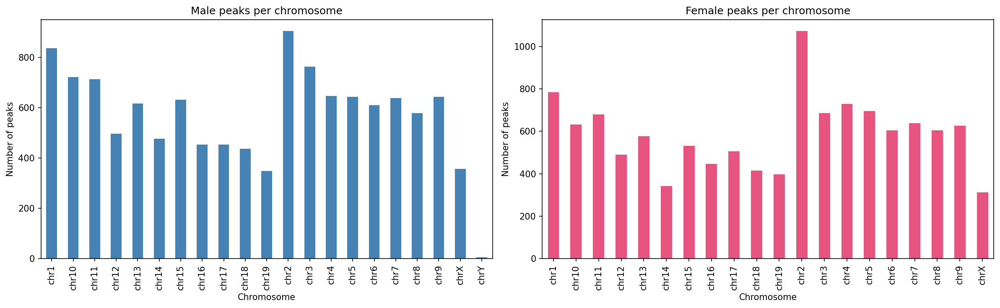

In [14]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

peak_data_Male['Chr'].value_counts().sort_index().plot(kind='bar', ax=axes[0], color='steelblue')
axes[0].set_title('Male peaks per chromosome')
axes[0].set_xlabel('Chromosome')
axes[0].set_ylabel('Number of peaks')

peak_data_Female['Chr'].value_counts().sort_index().plot(kind='bar', ax=axes[1], color='#E75480')
axes[1].set_title('Female peaks per chromosome')
axes[1].set_xlabel('Chromosome')
axes[1].set_ylabel('Number of peaks')

plt.tight_layout()
plt.savefig('peaks_per_chromosome.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [228]:
print(peak_annotation_Male_20000.columns.tolist())

['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2']


In [229]:
print(peak_annotation_Female_20000.columns.tolist())

['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2']


In [230]:
peak_annotation_Male_20000["peak_size"] = peak_annotation_Male_20000["End"] - peak_annotation_Male_20000["Start"]

In [231]:
peak_annotation_Male_20000["peak_size"].describe()


count    9456.000000
mean      496.993549
std       126.308167
min       403.000000
25%       403.000000
50%       443.000000
75%       561.000000
max      1635.000000
Name: peak_size, dtype: float64

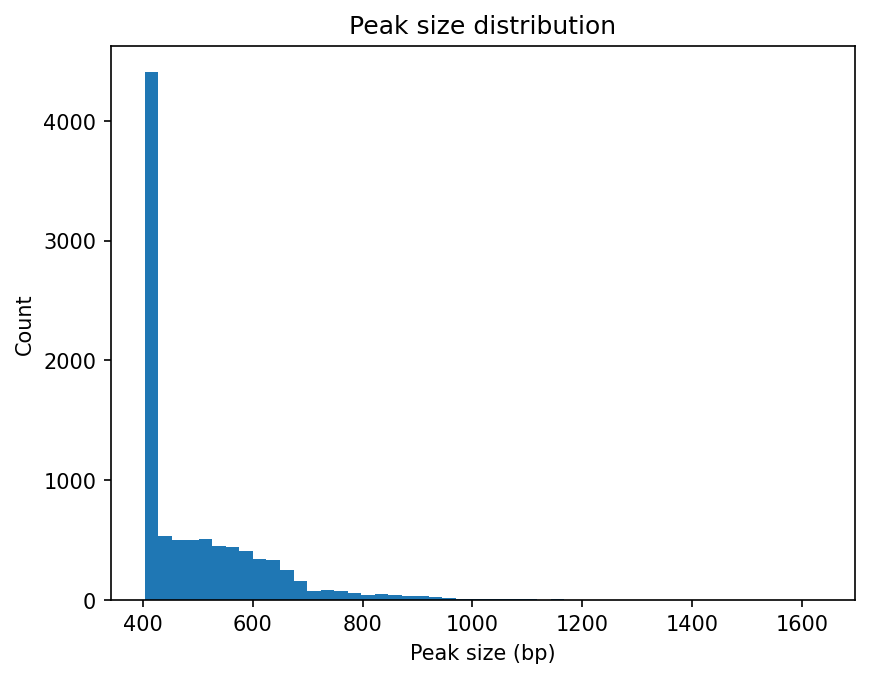

In [232]:
import matplotlib.pyplot as plt

plt.hist(peak_annotation_Male_20000["peak_size"], bins=50)
plt.xlabel("Peak size (bp)")
plt.ylabel("Count")
plt.title("Peak size distribution")
plt.show()

# Run homer size 1000 and 200 in terminal 
perl /ref/rmlab/software/homer/bin/findMotifsGenome.pl \
    Male_20kb_peaks_forHomer.bed \
    /ref/rmlab/software/homer/data/genomes/mm10/ \
    Homer/Male_20kb_peaks_size1000 \
    -size 1000 -p 12

In [233]:
peak_annotation_Female_20000["peak_size"] = peak_annotation_Female_20000["End"] - peak_annotation_Female_20000["Start"]

In [234]:
peak_annotation_Female_20000["peak_size"].describe()


count    9603.000000
mean      496.080287
std       128.684925
min       403.000000
25%       403.000000
50%       439.000000
75%       558.000000
max      1539.000000
Name: peak_size, dtype: float64

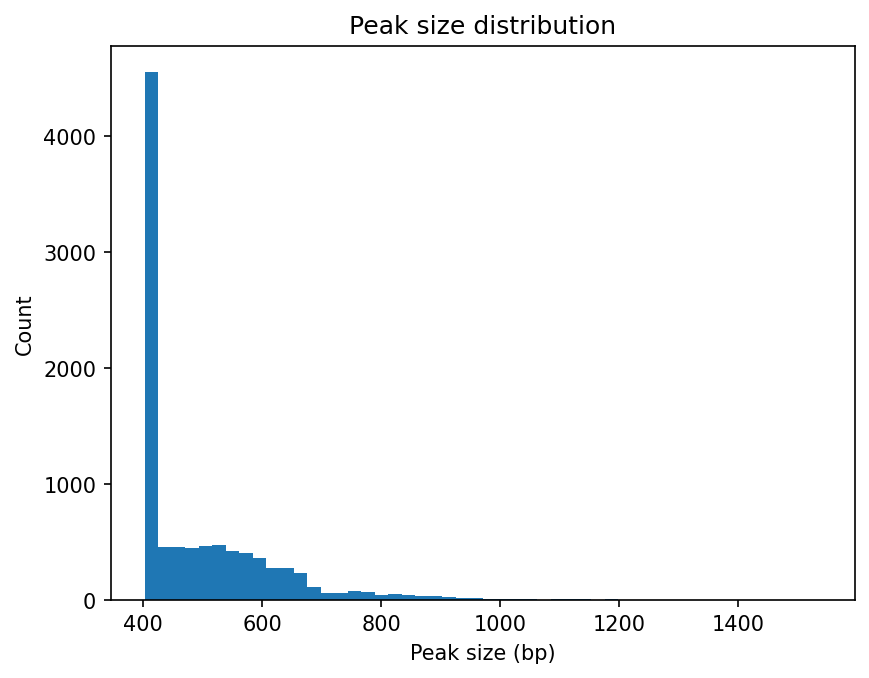

In [235]:
import matplotlib.pyplot as plt

plt.hist(peak_annotation_Female_20000["peak_size"], bins=50)
plt.xlabel("Peak size (bp)")
plt.ylabel("Count")
plt.title("Peak size distribution")
plt.show()

# Do the same for females

## Visualize

In [175]:
#Male_Egr1['group'] = "Male_Egr1"
#Male_WT['group'] = "Male_WT"

#Female_Egr1['group'] = "Female_Egr1"
#Female_WT['group'] = "Female_WT"

In [236]:
import pycallingcards as cc
male_data = cc.rd.combine_qbed([Male_Egr1, Male_WT])

In [237]:
import pycallingcards as cc
female_data = cc.rd.combine_qbed([Female_Egr1, Female_WT])

In [238]:
male_data = cc.pp.clean_qbed(male_data)

In [239]:
female_data = cc.pp.clean_qbed(female_data)

In [240]:
adata_cc_male = cc.pp.make_Anndata(male_data, peak_annotation_Male_20000, ["Male_Egr1", "Male_WT"], key = 'group')

100%|██████████| 21/21 [00:04<00:00,  4.70it/s]


In [241]:
adata_cc_female = cc.pp.make_Anndata(female_data, peak_annotation_Female_20000, ["Female_Egr1", "Female_WT"], key = 'group')

100%|██████████| 20/20 [00:03<00:00,  6.48it/s]


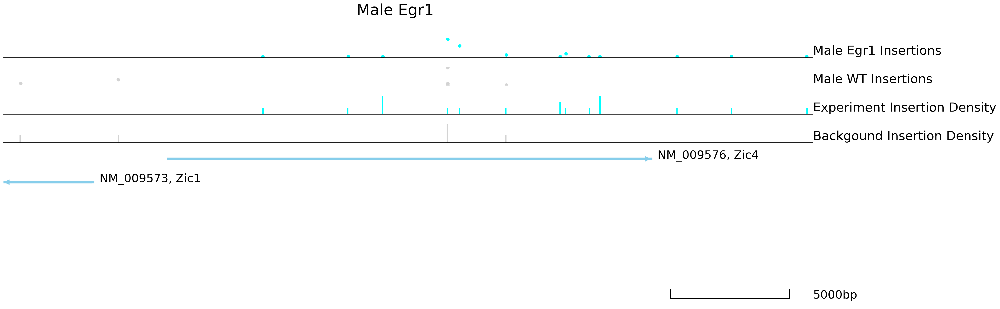

In [242]:
cc.pl.draw_area("chr9",91367022, 91391183, 5000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, adata = adata_cc_male, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue", title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')



In [243]:
print(peak_annotation_Female_20000.columns.tolist())
print(peak_annotation_Female_20000.head(2))

['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2', 'peak_size']
    Chr    Start      End     Center  Experiment Insertions  \
0  chr1  4857269  4857866  4857663.0                     22   
1  chr1  4858460  4859024  4858781.0                     45   

   Background insertions  Reference Insertions  pvalue Reference  \
0                     18                     4               0.0   
1                     40                     7               0.0   

   pvalue Background  Fraction Experiment  ...  pvalue_adj Reference  \
0           0.033448             0.000019  ...                   0.0   
1           0.021114             0.000038  .

In [244]:
peak_annotation_Female_20000.rename(columns={"Chromosome": "Chr"}, inplace=True)

ValueError: x, y, and format string must not be None

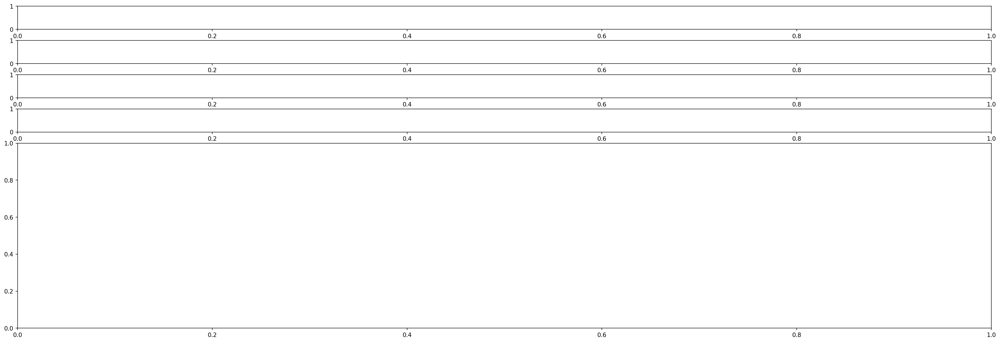

In [245]:
cc.pl.draw_area("chr9",91367022, 91391183, 5000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, adata = adata_cc_female, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 50, example_length = 5000, color = "pink", title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')



In [8]:
Egr1 = cc.rd.combine_qbed([Female_Egr1, Male_Egr1])
Egr1

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3042835,3042839,1,+,TCGTG/GCTACATGTG/CTGA,Male_Egr1
1,chr1,3045362,3045366,1,+,TCGTG/GCTACATGTG/ACAC,Male_Egr1
2,chr1,3046027,3046031,2,-,TCGTG/CACAGCGCGT/CTGA,Female_Egr1
3,chr1,3052537,3052541,1,+,TCGTG/ATACTCTAGG/GTCA,Male_Egr1
4,chr1,3055563,3055567,4,+,TCGTG/GTTATCGGAT/TCGA,Female_Egr1
...,...,...,...,...,...,...,...
3266333,chrY_JH584300_random,29071,29075,1,-,TCGTG/GACTTAATAC/CATG,Female_Egr1
3266334,chrY_JH584300_random,29071,29075,2,-,TCGTG/ATACTCTAGG/TTGG,Male_Egr1
3266335,chrY_JH584303_random,14934,14938,1,+,TCGTG/ATACTCTAGG/TCGA,Male_Egr1
3266336,chrY_JH584303_random,35487,35491,1,-,TCGTG/GACTTAATAC/CTGA,Female_Egr1


In [9]:
Egr1 = cc.pp.clean_qbed(Egr1)
Egr1

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3042835,3042839,1,+,TCGTG/GCTACATGTG/CTGA,Male_Egr1
1,chr1,3045362,3045366,1,+,TCGTG/GCTACATGTG/ACAC,Male_Egr1
2,chr1,3046027,3046031,2,-,TCGTG/CACAGCGCGT/CTGA,Female_Egr1
3,chr1,3052537,3052541,1,+,TCGTG/ATACTCTAGG/GTCA,Male_Egr1
4,chr1,3055563,3055567,4,+,TCGTG/GTTATCGGAT/TCGA,Female_Egr1
...,...,...,...,...,...,...,...
3266328,chrY,90838921,90838925,1,-,TCGTG/GTTATCGGAT/CTGA,Female_Egr1
3266329,chrY,90838921,90838925,4,-,TCGTG/GTTATCGGAT/ACAC,Female_Egr1
3266330,chrY,90842685,90842689,2,-,TCGTG/GCTACATGTG/TTGG,Male_Egr1
3266331,chrY,90844452,90844456,1,-,TCGTG/CACTCATCTC/TTGG,Male_Egr1


In [10]:
WT = cc.rd.combine_qbed([Female_WT, Male_WT])
WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3016345,3016349,2,+,TCGTG/GTCGTGCAAC/CTTC,Female_WT
1,chr1,3031511,3031515,6,-,TCGTG/TTGTCCAACT/GTCA,Female_WT
2,chr1,3031511,3031515,1,-,TCGTG/GTCGTGCAAC/TCGA,Female_WT
3,chr1,3031511,3031515,3,-,TCGTG/GTCGTGCAAC/TGGT,Female_WT
4,chr1,3042746,3042750,1,+,TCGTG/CGCTGGCTCT/TCAG,Female_WT
...,...,...,...,...,...,...,...
3407314,chrY_JH584303_random,35523,35527,1,-,TCGTG/CTAGGTGGAC/GAGA,Male_WT
3407315,chrY_JH584303_random,37154,37158,1,+,TCGTG/GTCGTGCAAC/TTGG,Female_WT
3407316,chrY_JH584303_random,52539,52543,1,-,TCGTG/CGTTACACAG/TCGA,Male_WT
3407317,chrY_JH584303_random,117391,117395,1,-,TCGTG/CGTTACACAG/CATG,Male_WT


In [11]:
WT = cc.pp.clean_qbed(WT)
WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3016345,3016349,2,+,TCGTG/GTCGTGCAAC/CTTC,Female_WT
1,chr1,3031511,3031515,6,-,TCGTG/TTGTCCAACT/GTCA,Female_WT
2,chr1,3031511,3031515,1,-,TCGTG/GTCGTGCAAC/TCGA,Female_WT
3,chr1,3031511,3031515,3,-,TCGTG/GTCGTGCAAC/TGGT,Female_WT
4,chr1,3042746,3042750,1,+,TCGTG/CGCTGGCTCT/TCAG,Female_WT
...,...,...,...,...,...,...,...
3407303,chrY,90840202,90840206,1,-,TCGTG/CGTTACACAG/CTTC,Male_WT
3407304,chrY,90840202,90840206,1,-,TCGTG/CTAGGTGGAC/TCAG,Male_WT
3407305,chrY,90841616,90841620,2,-,TCGTG/CTAGGTGGAC/GAAG,Male_WT
3407306,chrY,90844452,90844456,2,-,TCGTG/CGTTACACAG/TTGG,Male_WT


In [250]:
cc.pl.draw_area("chr4", 82536956, 82537820, 40000, peak_annotation_Female_20000, Egr1, "mm10", adata = adata_cc, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', name_density1 = 'Female Egr1 Insertion Density',
                name_insertion2 = 'Total Insertions', name_density2 = 'Total Insertion Density',
                peak_line = 3, bins = 600, example_length = 5000, color = "purple", title = "Female Egr1")
cc.pl.draw_area("chr4", 82536956, 82537820, 40000, peak_data, Egr1, "mm10", adata = adata_cc, font_size=2,
                name = "Male_Egr1",key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', name_density1 = 'Male Egr1 Insertion Density',
                name_insertion2 = 'Total Insertions', name_density2 = 'Total Insertion Density',
                peak_line = 3, bins = 600, example_length = 5000, title = "Male Egr1")



NameError: name 'adata_cc' is not defined

In [66]:
# Homer motif analysis on Male 20kb peaks
cc.tl.call_motif(
    peaks_frame = peak_annotation_Male_20000,
    reference = "mm10",
    save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026",
    homer_path = "/ref/rmlab/software/homer/bin",
    denovo = True,
    num_cores = 12
)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026
	Fragment size set to 1000
	Using 12 CPUs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /ref/rmlab/software/homer/.//data/genomes/mm10//

	Extracting sequences from directory: /ref/rmlab/software/homer/.//data/genomes/mm10//
	Extracting 630 sequences from chr1
	Extracting 738 sequences from chr2
	Extracting 553 sequences from chr3
	Extracting 507 sequences from chr4
	Extracting 534 s

Finished!


	Job finished - if results look good, please send beer to ..

	Cleaning up tmp files...



In [212]:
# Homer motif analysis on Male 20kb peaks
cc.tl.call_motif(
    peaks_frame = peak_annotation_Male_20000,
    reference = "/ref/rmlab/software/homer/data/genomes/mm10/",
    save_homer = "Homer/Male_20kb_peaks_size1000_try2",
    homer_path = "/ref/rmlab/software/homer/bin/",
    denovo = True,
    num_cores = 12
)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = /ref/rmlab/software/homer/data/genomes/mm10/
	Output Directory = Homer/Male_20kb_peaks_size1000_try2
	Fragment size set to 1000
	Using 12 CPUs
	Using Custom Genome
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /ref/rmlab/software/homer/data/genomes/mm10/

	Extracting sequences from directory: /ref/rmlab/software/homer/data/genomes/mm10/
	Extracting 630 sequences from chr1
	Extracting 738 sequences from chr2
	Extracting 553 sequences from chr3
	Extracting 507 sequences from chr4
	Extracting 534 sequences from chr5
	Extractin

Finished!


In [213]:
peak_annotation_Male_20000.to_csv(
    "Male_20kb_peaks.bed",
    sep="\t",
    header=False,
    index=False
)

In [214]:
!/ref/rmlab/software/homer/bin/findMotifsGenome.pl \
    Male_20kb_peaks.bed \
    mm10 \
    Homer/Male_20kb_full/ \
    -size 1000 \
    -p 12


	Position file = Male_20kb_peaks.bed
	Genome = mm10
	Output Directory = Homer/Male_20kb_full/
	Fragment size set to 1000
	Using 12 CPUs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /ref/rmlab/software/homer/.//data/genomes/mm10//

	Extracting sequences from directory: /ref/rmlab/software/homer/.//data/genomes/mm10//
	Extracting 630 sequences from chr1
	Extracting 738 sequences from chr2
	Extracting 553 sequences from chr3
	Extracting 507 sequences from chr4
	Extracting 534 sequences from chr5
	Extracting 494

In [71]:
cc.tl.call_motif(
    peaks_frame = peak_annotation_Male_20000,
    reference = "mm10",
    save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026",
    homer_path = "/home/l.llaci/miniconda3/envs/pycallingcards/bin",
    denovo = True,
    num_cores = 12
)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026
	Fragment size set to 1000
	Using 12 CPUs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

ls: cannot access '/home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.//data/genomes/mm10//preparsed//mm10.*.cgbins': No such file or directory
	Could not find background files for 1000 bp fragments
	Below are the sizes that are already available prepared.
	HOMER will now create background files for 1000 bp fragments
	To CANCEL and rerun with a differet "-size <#>", hit 

Finished!


	Normalizing lower order oligos using homer2

	Reading input files...
	0 total sequences read
	Autonormalization: 1-mers (4 total)
		A	inf%	inf%	-nan
		C	inf%	inf%	-nan
		G	inf%	inf%	-nan
		T	inf%	inf%	-nan
	Autonormalization: 2-mers (16 total)
		AA	inf%	inf%	-nan
		CA	inf%	inf%	-nan
		GA	inf%	inf%	-nan
		TA	inf%	inf%	-nan
		AC	inf%	inf%	-nan
		CC	inf%	inf%	-nan
		GC	inf%	inf%	-nan
		TC	inf%	inf%	-nan
		AG	inf%	inf%	-nan
		CG	inf%	inf%	-nan
		GG	inf%	inf%	-nan
		TG	inf%	inf%	-nan
		AT	inf%	inf%	-nan
		CT	inf%	inf%	-nan
		GT	inf%	inf%	-nan
		TT	inf%	inf%	-nan
	Autonormalization: 3-mers (64 total)
	Normalization weights can be found in file: Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026/seq.autonorm.tsv
	Converging on autonormalization solution:
	...............................................................................
	Final normalization:	Autonormalization: 1-mers (4 total)
		A	inf%	inf%	-nan
		C	inf%	inf%	-nan
		G	inf%	inf%	-nan
		T	inf%	inf%	-nan
	Autonormalization: 2-

In [110]:
peak_annotation_Male_20000

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2,peak_size
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422,571
1,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,4.625315e-04,0.000020,...,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462,597
2,chr1,4858460,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726,1053
3,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117,567
4,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,2.387176e-03,0.000006,...,0.000000e+00,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643,403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9451,chrX,168944372,168944775,168944572.0,5,1,4,7.326049e-07,6.003941e-04,0.000002,...,3.636063e-04,NM_009707,Arhgap6,+,0,NR_109847,Arhgap6,+,91836,403
9452,chrX,169123341,169123744,169123541.0,6,2,1,2.834252e-10,2.803652e-03,0.000003,...,2.224345e-07,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,52370,403
9453,chrX,169795043,169795446,169795243.0,10,2,2,4.740652e-14,6.927041e-05,0.000005,...,5.457933e-11,NM_010797,Mid1,+,0,NR_003635,4933400A11Rik,-,-15409,403
9454,chrX,169881476,169881879,169881676.0,15,8,2,0.000000e+00,1.901379e-02,0.000007,...,0.000000e+00,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164,403


In [7]:
# Create BED6 format
bed = peak_annotation_Male_20000.copy()

bed_out = bed[["Chr", "Start", "End"]].copy()

# Add required columns
bed_out["peak_id"] = ["peak_" + str(i) for i in range(len(bed_out))]
bed_out["score"] = 0
bed_out["strand"] = "+"

# Reorder columns to BED6 format
bed_out = bed_out[["Chr", "Start", "End", "peak_id", "score", "strand"]]

# Save as BED
#bed_out.to_csv(
#    "Male_20kb_peaks.bed",
#    sep="\t",
#    header=False,
#    index=False
#)

In [ ]:
cc.tl.call_motif(
    peaks_frame = Male_20kb_peaks.bed,
    reference = "mm10",
    save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_042026",
    homer_path = "/home/l.llaci/miniconda3/envs/pycallingcards/bin",
    denovo = True,
    num_cores = 12
)

In [8]:
bed_out

,Chr,Start,End,peak_id,score,strand
0,chr1,4784900,4785471,peak_0,0,+
1,chr1,4857269,4857866,peak_1,0,+
2,chr1,4858460,4859513,peak_2,0,+
3,chr1,4916025,4916592,peak_3,0,+
4,chr1,6215285,6215688,peak_4,0,+
...,...,...,...,...,...,...
9451,chrX,168944372,168944775,peak_9451,0,+
9452,chrX,169123341,169123744,peak_9452,0,+
9453,chrX,169795043,169795446,peak_9453,0,+
9454,chrX,169881476,169881879,peak_9454,0,+


In [253]:
!/ref/rmlab/software/homer/bin/findMotifsGenome.pl \
    Male_20kb_peaks.bed \
    mm10 \
    Homer/Male_20kb_full2/ \
    -size 1000 \
    -p 12


	Position file = Male_20kb_peaks.bed
	Genome = mm10
	Output Directory = Homer/Male_20kb_full2/
	Fragment size set to 1000
	Using 12 CPUs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /ref/rmlab/software/homer/.//data/genomes/mm10//

	Extracting sequences from directory: /ref/rmlab/software/homer/.//data/genomes/mm10//
	Extracting 630 sequences from chr1
	Extracting 738 sequences from chr2
	Extracting 553 sequences from chr3
	Extracting 507 sequences from chr4
	Extracting 534 sequences from chr5
	Extracting 49

In [13]:
# Create BED6 format
bed = peak_annotation_Female_20000.copy()

bed_out = bed[["Chr", "Start", "End"]].copy()

# Add required columns
bed_out["peak_id"] = ["peak_" + str(i) for i in range(len(bed_out))]
bed_out["score"] = 0
bed_out["strand"] = "+"

# Reorder columns to BED6 format
bed_out = bed_out[["Chr", "Start", "End", "peak_id", "score", "strand"]]

# Save as BED
bed_out.to_csv(
    "Female_20kb_peaks.bed",
    sep="\t",
    header=False,
    index=False
)

In [74]:
peak_annotation_Male_20000[['Chr','Start','End']].to_csv(
    "Male_20kb_peaks_forHomer.bed", sep="\t", header=False, index=False)

peak_annotation_Female_20000[['Chr','Start','End']].to_csv(
    "Female_20kb_peaks_forHomer.bed", sep="\t", header=False, index=False)

In [216]:
peak_annotation_Male_20000

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,593.584886,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,4.625315e-04,0.000020,...,963.139907,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,1245.958982,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,273.774581,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
4,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,2.387176e-03,0.000006,...,360.510528,0.000000e+00,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9451,chrX,168944372,168944775,168944572.0,5,1,4,7.326049e-07,6.003941e-04,0.000002,...,187.038634,3.636063e-04,NM_009707,Arhgap6,+,0,NR_109847,Arhgap6,+,91836
9452,chrX,169123341,169123744,169123541.0,6,2,1,2.834252e-10,2.803652e-03,0.000003,...,182.516387,2.224345e-07,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,52370
9453,chrX,169795043,169795446,169795243.0,10,2,2,4.740652e-14,6.927041e-05,0.000005,...,374.077268,5.457933e-11,NM_010797,Mid1,+,0,NR_003635,4933400A11Rik,-,-15409
9454,chrX,169881476,169881879,169881676.0,15,8,2,0.000000e+00,1.901379e-02,0.000007,...,299.053566,0.000000e+00,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164


In [77]:
adata_cc_male = cc.pp.make_Anndata(Male_Egr1, peak_annotation_Male_20000, ["Male_Egr1"], key = 'group')

100%|██████████| 21/21 [00:02<00:00,  7.47it/s]


In [78]:
adata_cc_male

AnnData object with n_obs × n_vars = 1 × 9456
    var: 'Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2'

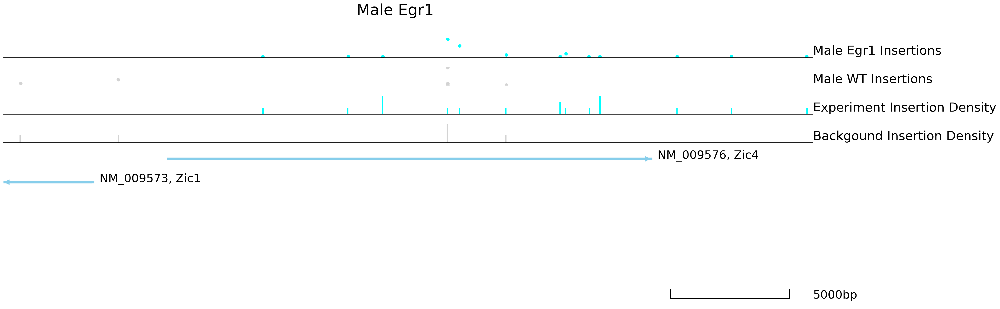

In [128]:
cc.pl.draw_area("chr9",91367022, 91391183, 5000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, adata = adata_cc_male, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue", title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')



In [119]:
Egr1_fix = Egr1_region.copy()
WT_fix = WT_region.copy()

# enforce expected column names
Egr1_fix = Egr1_fix.rename(columns={"Start": "Position", "Reads": "Count"})
WT_fix = WT_fix.rename(columns={"Start": "Position", "Reads": "Count"})

In [120]:
Egr1_fix = Egr1_fix[["Position", "Count"]].copy()
WT_fix = WT_fix[["Position", "Count"]].copy()

In [122]:
Egr1_fix = Egr1_fix.copy()
WT_fix = WT_fix.copy()

Egr1_fix["group"] = "Egr1"
WT_fix["group"] = "WT"

In [123]:
insertions_fix = pd.concat([Egr1_fix, WT_fix], ignore_index=True)

### gRNA3

In [11]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1_111225.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1_111225.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 250
['Slc7a11', 'Ap3m2', 'Btbd19', 'Areg', 'Cbr2']
Number of WHaoverlapping genes: 272
['Plekha7', 'Polr3g', 'Rnf135', 'Angpt1', 'Ifi27l2a']


In [17]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_20kb_Peaks NearestGene'
set2_name = 'Male_Egr1KDg3vsNeg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_20kb_Peaks NearestGene'
set2_name = 'Female_Egr1KDg3vsNeg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

NameError: name 'KD_M_1' is not defined

In [12]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")
# Venn diagram
set1_name = 'Male_CC_20kb_Peaks NearestGene'
set2_name = 'Male_Egr1KDg3vsNeg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.pdf')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, format='pdf', bbox_inches='tight')
plt.close()

# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")
# Venn diagram
set1_name = 'Female_CC_20kb_Peaks NearestGene'
set2_name = 'Female_Egr1KDg3vsNeg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.pdf')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, format='pdf', bbox_inches='tight')
plt.close()

Number of overlapping genes: 250
['Slc7a11', 'Ap3m2', 'Btbd19', 'Areg', 'Cbr2']
Percent of overlapping genes: 43.33
Number of overlapping genes: 272
['Plekha7', 'Polr3g', 'Rnf135', 'Angpt1', 'Ifi27l2a']
Percent of overlapping genes: 38.1


In [24]:
qbed = {"Male_Egr1": Male_Egr1, "Male_WT": Male_WT, "Female_Egr1": Female_Egr1, "Female_WT": Female_WT}
bed = {"peak_Male": peak_data_Male, "peak_Female": peak_data_Female}
cc.pl.WashU_browser_url(qbed = qbed, bed = bed, genome = 'mm10')

All qbed addressed
All bed addressed
Uploading files
Please click the following link to see the data on WashU Epigenome Browser directly.
https://epigenomegateway.wustl.edu/browser/?genome=mm10&hub=https://companion.epigenomegateway.org//task/090434b3cf19b9ce762fa8c12ec56678/output//datahub.json


# Conclusion: Keep gRNA3 20kb limit

# Call motifs 

In [22]:
import pandas as pd
import pyranges as pr

# Rename column names to match PyRanges requirements
peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Male_gr = pr.PyRanges(peak_annotation_Male_20000)

# Rename column names to match PyRanges requirements
peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Female_gr = pr.PyRanges(peak_annotation_Female_20000)


In [54]:
# At the very end of the cell, after all PyRanges operations:
peak_annotation_Male_20000.rename(columns={"Chromosome": "Chr"}, inplace=True)
peak_annotation_Female_20000.rename(columns={"Chromosome": "Chr"}, inplace=True)

In [56]:
peak_annotation_Male_20000

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,593.584886,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,4.625315e-04,0.000020,...,963.139907,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,1245.958982,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,273.774581,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
4,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,2.387176e-03,0.000006,...,360.510528,0.000000e+00,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9451,chrX,168944372,168944775,168944572.0,5,1,4,7.326049e-07,6.003941e-04,0.000002,...,187.038634,3.636063e-04,NM_009707,Arhgap6,+,0,NR_109847,Arhgap6,+,91836
9452,chrX,169123341,169123744,169123541.0,6,2,1,2.834252e-10,2.803652e-03,0.000003,...,182.516387,2.224345e-07,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,52370
9453,chrX,169795043,169795446,169795243.0,10,2,2,4.740652e-14,6.927041e-05,0.000005,...,374.077268,5.457933e-11,NM_010797,Mid1,+,0,NR_003635,4933400A11Rik,-,-15409
9454,chrX,169881476,169881879,169881676.0,15,8,2,0.000000e+00,1.901379e-02,0.000007,...,299.053566,0.000000e+00,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164


In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


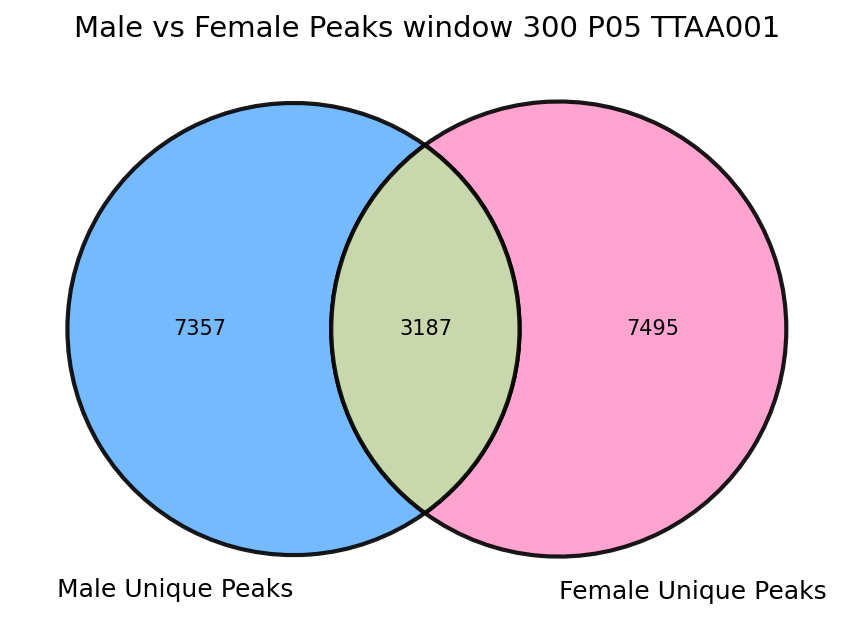

In [7]:
import pandas as pd
import pyranges as pr
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Make copies to avoid permanently renaming columns
male_gr_input = peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"})
peak_data_Male_gr = pr.PyRanges(male_gr_input)

female_gr_input = peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"})
peak_data_Female_gr = pr.PyRanges(female_gr_input)

# Find overlaps
common = peak_data_Male_gr.intersect(peak_data_Female_gr)

# Convert to DataFrame
common_df = common.df[['Chromosome', 'Start', 'End']]
common_df.columns = ['chrom', 'start', 'end']
common_df.to_csv("common_peaks_unsorted.bed", sep="\t", header=False, index=False)

sorted_common_bed = pybedtools.BedTool("common_peaks_unsorted.bed").sort()
peak_annotation_common = cc.pp.annotation(peaks_path=sorted_common_bed.fn, reference="mm10")
peak_annotation_common.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False, header=True)

unique_peaks1 = peak_data_Male_gr.subtract(peak_data_Female_gr)
unique_peaks2 = peak_data_Female_gr.subtract(peak_data_Male_gr)

size_common = len(common)
size_unique_peaks1 = len(unique_peaks1)
size_unique_peaks2 = len(unique_peaks2)

unique_peaks1_df = unique_peaks1.df
unique_peaks2_df = unique_peaks2.df
common_df = common.df

unique_peaks1_df.to_csv("unique_peaks_male_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)
unique_peaks2_df.to_csv("unique_peaks_female_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)
common_df.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)

# Create figure
plt.figure(figsize=(6, 6))
venn = venn2(
    subsets=(size_unique_peaks1, size_unique_peaks2, size_common),
    set_labels=('Male Unique Peaks', 'Female Unique Peaks')
)
colors = {'10': '#66b3ff', '01': '#ff99cc', '11': '#c3d3a3'}
for subset_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(subset_id)
    if patch:
        patch.set_color(colors[subset_id])
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
        patch.set_alpha(0.9)

plt.title('Male vs Female Peaks window 300 P05 TTAA001', fontsize=14)
plt.tight_layout()
plt.savefig('Male_vs_Female_W300_P05_TTAA001_annotated_091725_PeakIntersection.jpeg', format='jpeg', dpi=300)
plt.savefig('Male_vs_Female_W300_P05_TTAA001_annotated_091725_PeakIntersection.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [11]:
# to make figure of heatmap for paper:
common_df[['Chromosome', 'Start', 'End']].to_csv(
    "shared_peaks.bed", sep="\t", header=False, index=False)
unique_peaks1_df[['Chromosome', 'Start', 'End']].to_csv(
    "male_unique_peaks.bed", sep="\t", header=False, index=False)
unique_peaks2_df[['Chromosome', 'Start', 'End']].to_csv(
    "female_unique_peaks.bed", sep="\t", header=False, index=False)

In [62]:
peak_data_Male_gr_df = peak_data_Male_gr.df

In [63]:
cc.tl.call_motif(peaks_frame = peak_data_Male_gr_df, reference = "mm10", save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_20kb_091925_042026",
                 homer_path = "/ref/rmlab/software/homer/bin", num_cores=12)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_20kb_091925_042026
	Fragment size set to 1000
	Using 12 CPUs
	Will not run homer for de novo motifs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9456
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9456
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /ref/rmlab/software/homer/.//data/genomes/mm10//

	Extracting sequences from directory: /ref/rmlab/software/homer/.//data/genomes/mm10//
	Extracting 630 sequences from chr1
	Extracting 738 sequences from chr2
	Extracting 553 sequences from chr3
	

Finished!


	Finished preparing sequence/group files

	----------------------------------------------------------
	Known motif enrichment
	Skipping...
	Job finished - if results look good, please send beer to ..

	Cleaning up tmp files...



In [47]:
!jupyter kernelspec list

Available kernels:
  cnmf_env_lll       /home/l.llaci/.local/share/jupyter/kernels/cnmf_env_lll
  ir                 /home/l.llaci/.local/share/jupyter/kernels/ir
  my_r_env           /home/l.llaci/.local/share/jupyter/kernels/my_r_env
  myrenv             /home/l.llaci/.local/share/jupyter/kernels/myrenv
  scenicplus         /home/l.llaci/.local/share/jupyter/kernels/scenicplus
  scenicplus_dev4    /home/l.llaci/.local/share/jupyter/kernels/scenicplus_dev4
  python3            /home/l.llaci/miniconda3/share/jupyter/kernels/python3


In [44]:
ls /ref/rmlab/software/homer/data/genomes/ | grep mm10

mm10/


In [ ]:
cc.tl.call_motif(peaks_frame = peak_annotation_Female_20000, reference = "mm10", save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_FemaleUnique_20kb_091925_042026",
                 homer_path = "/ref/rmlab/software/homer/bin", num_cores=12)

In [ ]:
!perl /home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.//configureHomer.pl -list | head -5

In [36]:
!perl /home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.//configureHomer.pl -install mm10


	Current base directory for HOMER is /home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.//

	Will install mm10
--2026-04-21 05:13:32--  http://homer.ucsd.edu/homer/update.txt
Resolving homer.ucsd.edu (homer.ucsd.edu)... 169.228.63.226
Connecting to homer.ucsd.edu (homer.ucsd.edu)|169.228.63.226|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19497 (19K) [text/plain]
Saving to: ‘/home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.///update.txt’

/home/l.llaci/minic 100%[===================>]  19.04K  --.-KB/s    in 0.06s   

2026-04-21 05:13:32 (340 KB/s) - ‘/home/l.llaci/miniconda3/envs/pycallingcards/share/homer/.///update.txt’ saved [19497/19497]

	Updating Settings...
`wget -O 0.426004395195381.tmp http://homer.ucsd.edu/homer/configureHomer.pl`;
--2026-04-21 05:13:34--  http://homer.ucsd.edu/homer/configureHomer.pl
Resolving homer.ucsd.edu (homer.ucsd.edu)... 169.228.63.226
Connecting to homer.ucsd.edu (homer.ucsd.edu)|169.228.63.226|:80... con

In [ ]:
cc.tl.call_motif(peaks_frame = peak_annotation_Male_20000, reference = "mm10",
                 save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_Male_20kb_091925_111225",
                 homer_path = "/home/l.llaci/homer/bin/", num_cores=12)

cc.tl.call_motif(peaks_frame = peak_annotation_Female_20000, reference = "mm10",
                 save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_Female_20kb_091925_111225",
                 homer_path = "/home/ihreiss/homer/bin/", num_cores=12)

In [11]:
!which findMotifsGenome.pl

~/bin/findMotifsGenome.pl


In [29]:
!ls -la Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_20kb_091925_042026/

ls: cannot access 'Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_20kb_091925_042026/': No such file or directory


In [14]:
!ls /home/l.llaci/bin/findMotifsGenome.pl

/home/l.llaci/bin/findMotifsGenome.pl


In [15]:
!find /home/l.llaci -name "findMotifsGenome.pl" 2>/dev/null
!find /home/ihreiss -name "findMotifsGenome.pl" 2>/dev/null
!find /ref/rmlab -name "findMotifsGenome.pl" 2>/dev/null

/home/l.llaci/miniconda3/envs/homer/share/homer/bin/findMotifsGenome.pl
/home/l.llaci/miniconda3/envs/homer/bin/findMotifsGenome.pl
/home/l.llaci/miniconda3/envs/pycallingcards/share/homer/bin/findMotifsGenome.pl
/home/l.llaci/miniconda3/envs/pycallingcards/bin/findMotifsGenome.pl
/home/l.llaci/bin/findMotifsGenome.pl
/ref/rmlab/software/spack-0.21.1/opt/spack/linux-rocky8-x86_64/gcc-8.5.0/homer-4.11.1-oedshhvquhnk5pthmzuxrq4pj35rhpfh/lib/homer/bin/findMotifsGenome.pl
^C


In [18]:
print(peak_annotation_Male_20000.columns.tolist())

['Chromosome', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2']


In [29]:
!git clone https://github.com/timothyparker/HOMER.git homer


Cloning into 'homer'...
Username for 'https://github.com': ^C


In [27]:
!perl /homer/configureHomer.pl

Can't open perl script "/homer/configureHomer.pl": No such file or directory


# Venn diagram


In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


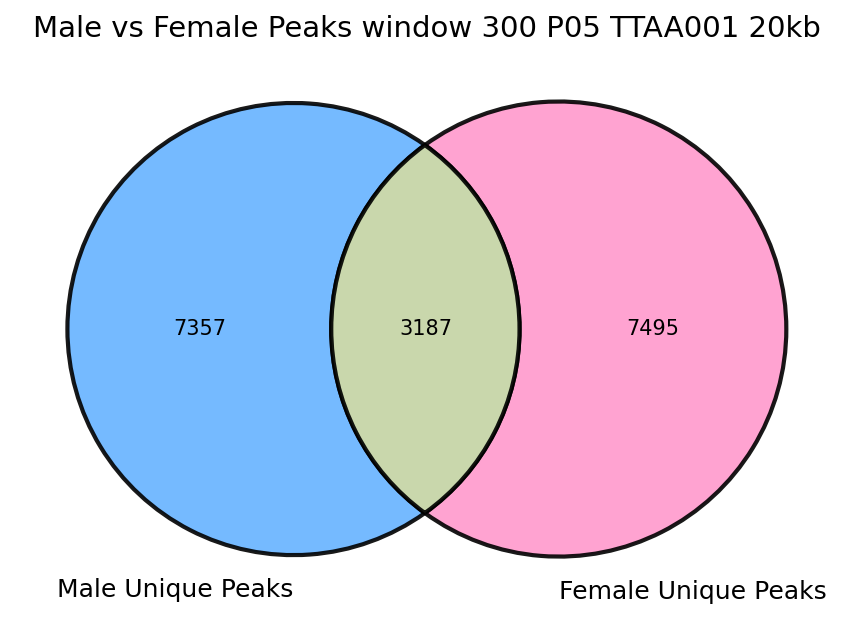

In [45]:
import pandas as pd
import pyranges as pr
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Rename column names to match PyRanges requirements
peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Male_gr = pr.PyRanges(peak_annotation_Male_20000)

# Rename column names to match PyRanges requirements
peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Female_gr = pr.PyRanges(peak_annotation_Female_20000)

# Find overlaps
common = peak_data_Male_gr.intersect(peak_data_Female_gr)

# Convert your PyRanges object to DataFrame
common_df = common.df
# Make sure it has the correct columns in the right order
common_df = common_df[['Chromosome', 'Start', 'End']]
common_df.columns = ['chrom', 'start', 'end']
# Save to temporary file
common_df.to_csv("common_peaks_unsorted.bed", sep="\t", header=False, index=False)
# Sort it using bedtools (matches reference order)
sorted_common_bed = pybedtools.BedTool("common_peaks_unsorted.bed").sort()
# Pass sorted BEDTool directly
peak_annotation_common = cc.pp.annotation(peaks_path=sorted_common_bed.fn, reference="mm10")
peak_annotation_common.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False, header=True)

unique_peaks1 = peak_data_Male_gr.subtract(peak_data_Female_gr)
unique_peaks2 = peak_data_Female_gr.subtract(peak_data_Male_gr)

# Count the number of intervals
size_common = len(common)
size_unique_peaks1 = len(unique_peaks1)
size_unique_peaks2 = len(unique_peaks2)

# Save the unique peaks as text or CSV files
unique_peaks1_df = unique_peaks1.df
unique_peaks2_df = unique_peaks2.df
common_df = common.df

# Save as text files
unique_peaks1_df.to_csv("unique_peaks_male_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)
unique_peaks2_df.to_csv("unique_peaks_female_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)
common_df.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)

# Create figure
plt.figure(figsize=(6, 6))
# Create the Venn diagram
venn = venn2(
    subsets=(size_unique_peaks1, size_unique_peaks2, size_common),
    set_labels=('Male Unique Peaks', 'Female Unique Peaks')R
)
colors = {
    '10': '#66b3ff',  # light blue
    '01': '#ff99cc',  # light pink
    '11': '#c3d3a3'   # neutral gray for the intersection
}
# Style each section
for subset_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(subset_id)
    if patch:
        patch.set_color(colors[subset_id])
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
        patch.set_alpha(0.9)

# Add title
plt.title('Male vs Female Peaks window 300 P05 TTAA001 20kb', fontsize=14)
plt.tight_layout()

# Save both before plt.show()
#plt.savefig('Male_vs_Female_W300_P05_TTAA001_20kb_annotated_091925_PeakIntersection_111225.jpeg', format='jpeg', dpi=300)
plt.savefig('Male_vs_Female_W300_P05_TTAA001_20kb_annotated_091925_PeakIntersection_111225.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Rerunning code below for CPM method for heatmap (05/18/26).

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


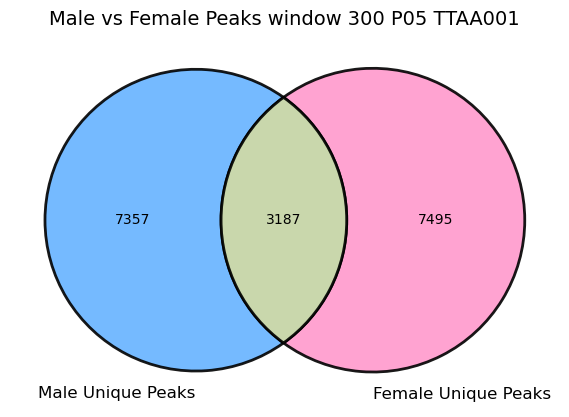

In [135]:
import pandas as pd
import pyranges as pr
import pybedtools
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# ---- Make non-destructive copies and rename "Chr" → "Chromosome" for PyRanges ----
male_gr_input   = peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"})
peak_data_Male_gr   = pr.PyRanges(male_gr_input)
female_gr_input = peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"})
peak_data_Female_gr = pr.PyRanges(female_gr_input)

# ---- Shared peaks: genomic intersection of Male and Female peak regions ----
common = peak_data_Male_gr.intersect(peak_data_Female_gr)

# ---- Write the unsorted intersection, then bedtools-sort it ----
common_df_simple = common.df[['Chromosome', 'Start', 'End']]
common_df_simple.columns = ['chrom', 'start', 'end']
common_df_simple.to_csv("common_peaks_unsorted.bed", sep="\t", header=False, index=False)
sorted_common_bed = pybedtools.BedTool("common_peaks_unsorted.bed").sort()

# ---- Re-annotate the sorted shared regions to their nearest gene ----
peak_annotation_common = cc.pp.annotation(peaks_path=sorted_common_bed.fn, reference="mm10")
peak_annotation_common.to_csv(
    "shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t", index=False, header=True
)

# ---- Male-unique = Male peaks NOT overlapping any Female peak (and vice versa) ----
unique_peaks1 = peak_data_Male_gr.subtract(peak_data_Female_gr)
unique_peaks2 = peak_data_Female_gr.subtract(peak_data_Male_gr)

# ---- Counts for the Venn ----
size_common         = len(common)
size_unique_peaks1  = len(unique_peaks1)
size_unique_peaks2  = len(unique_peaks2)

# ---- Save full annotated TXT tables (coords + gene info) ----
unique_peaks1.df.to_csv(
    "unique_peaks_male_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t", index=False
)
unique_peaks2.df.to_csv(
    "unique_peaks_female_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t", index=False
)
common.df.to_csv(
    "shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t", index=False
)

# ---- Plain 3-column BEDs for the deepTools heatmap, with descriptive names ----
common.df[['Chromosome','Start','End']].to_csv(
    'shared_peaks_originalPeaks.bed', sep='\t', index=False, header=False)
unique_peaks1.df[['Chromosome','Start','End']].to_csv(
    'male_unique_peaks_originalPeaks.bed', sep='\t', index=False, header=False)
unique_peaks2.df[['Chromosome','Start','End']].to_csv(
    'female_unique_peaks_originalPeaks.bed', sep='\t', index=False, header=False)

# ---- Venn diagram ----
plt.figure(figsize=(6, 6))
venn = venn2(
    subsets=(size_unique_peaks1, size_unique_peaks2, size_common),
    set_labels=('Male Unique Peaks', 'Female Unique Peaks')
)
colors = {'10': '#66b3ff', '01': '#ff99cc', '11': '#c3d3a3'}
for subset_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(subset_id)
    if patch:
        patch.set_color(colors[subset_id])
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
        patch.set_alpha(0.9)
plt.title('Male vs Female Peaks window 300 P05 TTAA001', fontsize=14)
plt.tight_layout()
plt.savefig('Male_vs_Female_W300_P05_TTAA001_annotated_091725_PeakIntersection.jpeg',
            format='jpeg', dpi=300)
plt.savefig('Male_vs_Female_W300_P05_TTAA001_annotated_091725_PeakIntersection.pdf',
            format='pdf', bbox_inches='tight')
plt.show()

In [26]:
unique_peaks1_df

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,593.584886,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4859024,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,1245.958982,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,273.774581,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
3,chr1,6281371,6281961,6281636.0,7,3,4,1.062140e-06,3.880421e-02,0.000003,...,177.994140,5.138162e-04,NM_009826,Rb1cc1,+,-5268,NM_001195732,Alkal1,+,77370
4,chr1,7089922,7090146,7089943.0,46,32,8,0.000000e+00,1.811482e-02,0.000022,...,525.751181,0.000000e+00,NM_183028,Pcmtd1,+,0,NM_001244693,St18,+,-228561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7352,chrX,168545917,168546320,168546117.0,5,0,3,4.701893e-08,1.274899e-09,0.000002,...,239.451101,2.779242e-05,NM_001033330,Frmpd4,-,0,NM_010832,Msl3,-,106779
7353,chrX,168944372,168944775,168944572.0,5,1,4,7.326049e-07,6.003941e-04,0.000002,...,187.038634,3.636063e-04,NM_009707,Arhgap6,+,0,NR_109847,Arhgap6,+,91836
7354,chrX,169123341,169123744,169123541.0,6,2,1,2.834252e-10,2.803652e-03,0.000003,...,182.516387,2.224345e-07,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,52370
7355,chrX,169795043,169795446,169795243.0,10,2,2,4.740652e-14,6.927041e-05,0.000005,...,374.077268,5.457933e-11,NM_010797,Mid1,+,0,NR_003635,4933400A11Rik,-,-15409


# Venn diagram with stricter p values (05/18/26)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


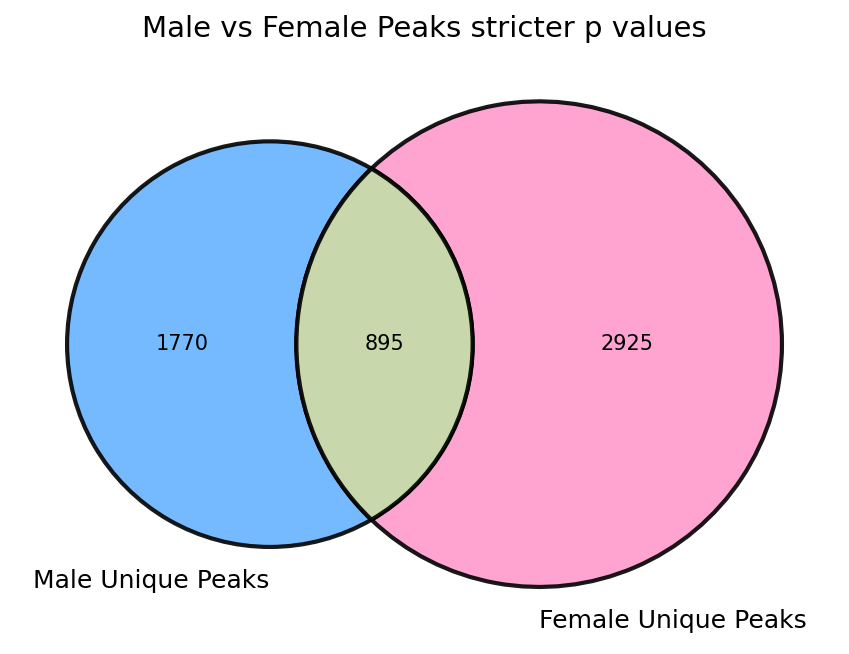

In [5]:
import pandas as pd
import pyranges as pr
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Rename column names to match PyRanges requirements
peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Male_gr = pr.PyRanges(peak_annotation_Male_20000)

# Rename column names to match PyRanges requirements
peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Female_gr = pr.PyRanges(peak_annotation_Female_20000)

# Find overlaps
common = peak_data_Male_gr.intersect(peak_data_Female_gr)

# Convert your PyRanges object to DataFrame
common_df = common.df
# Make sure it has the correct columns in the right order
common_df = common_df[['Chromosome', 'Start', 'End']]
common_df.columns = ['chrom', 'start', 'end']
# Save to temporary file
common_df.to_csv("common_peaks_unsorted.bed", sep="\t", header=False, index=False)
# Sort it using bedtools (matches reference order)
sorted_common_bed = pybedtools.BedTool("common_peaks_unsorted.bed").sort()
# Pass sorted BEDTool directly
peak_annotation_common = cc.pp.annotation(peaks_path=sorted_common_bed.fn, reference="mm10")
#peak_annotation_common.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False, header=True)

unique_peaks1 = peak_data_Male_gr.subtract(peak_data_Female_gr)
unique_peaks2 = peak_data_Female_gr.subtract(peak_data_Male_gr)

# Count the number of intervals
size_common = len(common)
size_unique_peaks1 = len(unique_peaks1)
size_unique_peaks2 = len(unique_peaks2)

# Save the unique peaks as text or CSV files
unique_peaks1_df = unique_peaks1.df
unique_peaks2_df = unique_peaks2.df
common_df = common.df

# Save as text files
#unique_peaks1_df.to_csv("unique_peaks_male_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)
#unique_peaks2_df.to_csv("unique_peaks_female_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)
#common_df.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_20kb_annotated_091925_111225.txt", sep="\t", index=False)

# Create figure
plt.figure(figsize=(6, 6))
# Create the Venn diagram
venn = venn2(
    subsets=(size_unique_peaks1, size_unique_peaks2, size_common),
    set_labels=('Male Unique Peaks', 'Female Unique Peaks')
)
colors = {
    '10': '#66b3ff',  # light blue
    '01': '#ff99cc',  # light pink
    '11': '#c3d3a3'   # neutral gray for the intersection
}
# Style each section
for subset_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(subset_id)
    if patch:
        patch.set_color(colors[subset_id])
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
        patch.set_alpha(0.9)

# Add title
plt.title('Male vs Female Peaks stricter p values', fontsize=14)
plt.tight_layout()

# Save both before plt.show()
#plt.savefig('Male_vs_Female_W300_P05_TTAA001_20kb_annotated_091925_PeakIntersection_111225.jpeg', format='jpeg', dpi=300)
#plt.savefig('Male_vs_Female_W300_P05_TTAA001_20kb_annotated_091925_PeakIntersection_111225.pdf', format='pdf', bbox_inches='tight')
plt.show()

# Fisher's exact test

In [6]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# ✅ Remove duplicate SYMBOLs, keeping the most significant row (smallest p-value)
KD_F = KD_F.sort_values('pvalue').drop_duplicates(subset='SYMBOL', keep='first')

print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 18180
Male genes: 579
Male genes NOT DE: 17601
Female All Genes: 17857
Female genes: 714
Female genes NOT DE: 17143
Male Fisher's Exact Test p-value: 3.0062e-10
Odds ratio: 2.0918
Contingency table: [[107, 470], [1696, 15583]]
Female Fisher's Exact Test p-value: 4.6361e-05
Odds ratio: 1.4904
Contingency table: [[138, 576], [2374, 14768]]


### Overlap with bulk RNA seq to see if I get a good amount of genes back as with the original peak caller. 

In [13]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_strictpvalues_20kb_NearestGene_vs_Egr1g3vsNeg1_051826.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_strictpvalues_20kb_NearestGene_vs_Egr1g3vsNeg1_051826.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 107
['Cdc14a', 'Arnt2', 'Tbc1d16', 'Nfatc2', 'Cd300lb']
Number of WHaoverlapping genes: 138
['Cd300lb', 'Htra1', 'Btg2', 'Ptger4', 'Nfatc1']


In [27]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# ✅ Remove duplicate SYMBOLs, keeping the most significant row (smallest p-value)
KD_F = KD_F.sort_values('pvalue').drop_duplicates(subset='SYMBOL', keep='first')

print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 18180
Male genes: 579
Male genes NOT DE: 17601
Female All Genes: 17857
Female genes: 714
Female genes NOT DE: 17143
Male Fisher's Exact Test p-value: 2.1093e-09
Odds ratio: 1.8000
Contingency table: [[160, 417], [3036, 14243]]
Female Fisher's Exact Test p-value: 1.3568e-10
Odds ratio: 1.6629
Contingency table: [[281, 433], [4812, 12330]]


### Overlap with bulk RNA seq to see if I get a good amount of genes back as with the original peak caller with the male vs female background, and vice-versa. 

In [25]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_malevsfemaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_femalevsmaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 160
['Hbegf', 'Col6a1', 'Rnf157', 'Ablim1', 'Itga11']
Number of WHaoverlapping genes: 281
['Wnt7b', 'Ggct', 'Ppt2', 'Piezo2', 'Kank1']


In [29]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_malevsfemaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_femalevsmaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 160
['Hbegf', 'Col6a1', 'Rnf157', 'Ablim1', 'Itga11']
Number of WHaoverlapping genes: 281
['Wnt7b', 'Ggct', 'Ppt2', 'Piezo2', 'Kank1']


In [30]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# ✅ Remove duplicate SYMBOLs, keeping the most significant row (smallest p-value)
KD_F = KD_F.sort_values('pvalue').drop_duplicates(subset='SYMBOL', keep='first')

print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 18180
Male genes: 579
Male genes NOT DE: 17601
Female All Genes: 17857
Female genes: 714
Female genes NOT DE: 17143
Male Fisher's Exact Test p-value: 2.1093e-09
Odds ratio: 1.8000
Contingency table: [[160, 417], [3036, 14243]]
Female Fisher's Exact Test p-value: 1.3568e-10
Odds ratio: 1.6629
Contingency table: [[281, 433], [4812, 12330]]


In [36]:
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_malevsfemaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])
genes_of_interest = ["Nrp1", "Hmox1", "Mast4", "Ptk2b"]

overlap_df1[overlap_df1["Gene"].isin(genes_of_interest)]


Number of overlapping genes: 160
['Hbegf', 'Col6a1', 'Rnf157', 'Ablim1', 'Itga11']


,Gene
33,Ptk2b
83,Hmox1
133,Mast4


In [37]:
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_femalevsmaleEgr1_20kb_NearestGene_vs_Egr1g3vsNeg1_052126.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

genes_of_interest = ["Nrp1", "Hmox1", "Mast4", "Ptk2b"]

overlap_df1[overlap_df1["Gene"].isin(genes_of_interest)]


Number of WHaoverlapping genes: 281
['Wnt7b', 'Ggct', 'Ppt2', 'Piezo2', 'Kank1']


,Gene


In [38]:
import os
import pandas as pd

DATE = "052126"

# ---- 1. Unique gene list (nearest + 2nd-nearest, deduplicated) ----
g1 = peak_annotation_Male_20000['Gene Name1'].dropna()
# Only include Gene Name2 entries where Distance2 also passes the 20 kb cutoff
g2 = peak_annotation_Male_20000.loc[
    peak_annotation_Male_20000['Distance2'].abs() <= 20000, 'Gene Name2'
].dropna()

male_genes_unique = sorted(set(g1) | set(g2))
print(f"Unique genes near male-enriched peaks (nearest or 2nd-nearest, ≤20 kb): {len(male_genes_unique)}")

# Save the gene list
pd.Series(male_genes_unique, name='Gene').to_csv(
    f"Male_Egr1CC_peaks_MalevsFemale_20kb_uniqueGenes_{DATE}.txt",
    sep='\t', index=False, header=False
)

# ---- 2. Per-gene peak summary (how many peaks, where, how significant) ----
# "Long" view: one row per (peak, gene) so a peak with two qualifying genes appears twice
long1 = peak_annotation_Male_20000.assign(
    Gene=peak_annotation_Male_20000['Gene Name1'],
    Distance=peak_annotation_Male_20000['Distance1'],
    Assignment='nearest'
)
long2 = peak_annotation_Male_20000.loc[
    peak_annotation_Male_20000['Distance2'].abs() <= 20000
].assign(
    Gene=lambda d: d['Gene Name2'],
    Distance=lambda d: d['Distance2'],
    Assignment='2nd_nearest'
)
long_df = pd.concat([long1, long2], ignore_index=True)
long_df = long_df.dropna(subset=['Gene'])

# Per-gene summary: how many peaks, closest one, best p-value
per_gene = (long_df.groupby('Gene')
                   .agg(N_peaks=('Chr', 'size'),
                        min_abs_distance=('Distance', lambda x: x.abs().min()),
                        best_pvalue_adj_Ref=('pvalue_adj Reference', 'min'),
                        best_pvalue_Background=('pvalue Background', 'min'),
                        max_Exp_insertions=('Experiment Insertions', 'max'))
                   .sort_values(['N_peaks', 'best_pvalue_adj_Ref'],
                                ascending=[False, True])
                   .reset_index())
print(f"\nTop 20 genes by peak count:")
print(per_gene.head(20).to_string(index=False))

per_gene.to_csv(
    f"Male_Egr1CC_peaks_MalevsFemale_20kb_perGeneSummary_{DATE}.txt",
    sep='\t', index=False, header=True
)

# ---- 3. Full peak-level table with gene assignment (long format, useful for lookups) ----
view_cols = ['Chr', 'Start', 'End', 'Center',
             'Experiment Insertions', 'Background insertions', 'Reference Insertions',
             'pvalue Reference', 'pvalue Background', 'pvalue_adj Reference',
             'TPH background subtracted',
             'Gene', 'Distance', 'Assignment']
long_df[view_cols].sort_values(['Gene', 'pvalue_adj Reference']).to_csv(
    f"Male_Egr1CC_peaks_MalevsFemale_20kb_perPeakGeneLong_{DATE}.txt",
    sep='\t', index=False, header=True
)

print(f"\nFiles saved:")
print(f"  Male_Egr1CC_peaks_MalevsFemale_20kb_uniqueGenes_{DATE}.txt        ({len(male_genes_unique)} unique genes)")
print(f"  Male_Egr1CC_peaks_MalevsFemale_20kb_perGeneSummary_{DATE}.txt     ({len(per_gene)} genes)")
print(f"  Male_Egr1CC_peaks_MalevsFemale_20kb_perPeakGeneLong_{DATE}.txt    ({len(long_df)} peak-gene rows)")

Unique genes near male-enriched peaks (nearest or 2nd-nearest, ≤20 kb): 5016

Top 20 genes by peak count:
         Gene  N_peaks  min_abs_distance  best_pvalue_adj_Ref  best_pvalue_Background  max_Exp_insertions
        Meis2       22                 0                  0.0            2.269296e-13                 109
     Sfta3-ps       21                 0                  0.0            0.000000e+00                 392
       Nkx2-1       19                 0                  0.0            0.000000e+00                 392
A930004D18Rik       16                 0                  0.0            0.000000e+00                 141
        Celf2       15                 0                  0.0            7.771561e-16                 102
      Lncpint       15                 0                  0.0            0.000000e+00                  38
        Runx2       14                 0                  0.0            1.818001e-11                  47
        Foxg1       12                 0      

In [40]:
genes_of_interest = ["Nrp1", "Hmox1", "Mast4", "Ptk2b"]

long_df[long_df["Gene"].isin(genes_of_interest)]


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2,Gene,Distance,Assignment
1679,chr13,102897977,102898500,102898297.0,15,2,3,1.221245e-15,1.486029e-03,0.000007,...,Mast4,-,0,NR_130171,1700099I09Rik,+,-136082,Mast4,0,nearest
1680,chr13,102914399,102914817,102914599.0,13,1,3,4.596323e-13,1.488286e-04,0.000006,...,Mast4,-,0,NR_130171,1700099I09Rik,+,-152504,Mast4,0,nearest
1892,chr14,66257838,66258386,66258096.0,38,9,6,0.000000e+00,1.200844e-03,0.000018,...,Ptk2b,-,0,NR_038077,1700001G11Rik,-,36943,Ptk2b,0,nearest
1893,chr14,66258319,66258908,66258705.0,18,3,7,0.000000e+00,1.400924e-03,0.000009,...,Ptk2b,-,0,NR_038077,1700001G11Rik,-,36421,Ptk2b,0,nearest
1894,chr14,66259072,66259507,66259272.0,18,2,3,0.000000e+00,6.927041e-05,0.000009,...,Ptk2b,-,0,NR_038077,1700001G11Rik,-,35822,Ptk2b,0,nearest
5627,chr8,75083077,75083498,75083295.0,7,1,2,7.589571e-10,9.678584e-04,0.000003,...,Hmox1,+,10120,NM_001136259,Tom1,+,-12957,Hmox1,10120,nearest
8479,chr8,75108611,75109139,75108811.0,33,8,2,0.000000e+00,1.319177e-07,0.000016,...,Mcm5,+,370,NM_010442,Hmox1,+,-8019,Hmox1,-8019,2nd_nearest


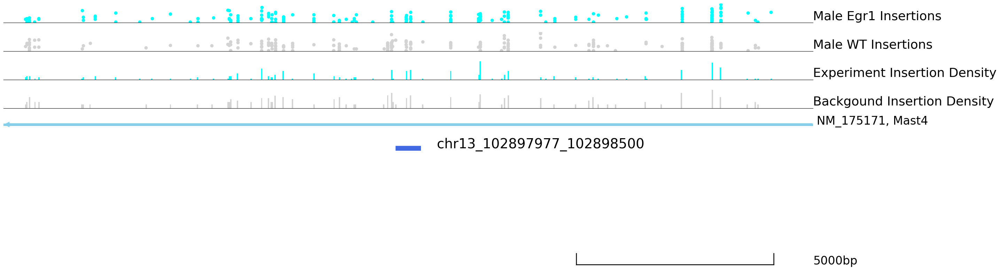

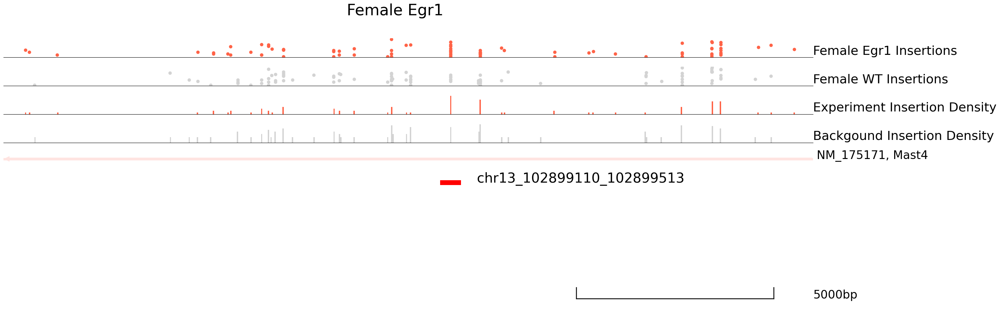

In [41]:
cc.pl.draw_area("chr13",102897977,102898500, 10000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue", title = "Male Egr1")#, save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr13",102897977,102898500, 10000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



In [43]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr13",102897977,102898500,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr13",102897977,102898500,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")

# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr13",102897977,102898500,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 7.5)
axes[1].set_ylim(0, 6.5)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Male_tracks_MvsF_052126.pdf',
    bbox_inches='tight'
)

plt.close()


# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr13",102897977,102898500,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="red",
    title="Female Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 7.5)
axes[1].set_ylim(0, 6.5)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Female_tracks_MvsF_052126.pdf',
    bbox_inches='tight'
)

plt.close()

Shared ymaxes — Track 0: 7.0291459520654005, Track 1: 6.405410586118483, Track 2: 50.4


In [ ]:
___

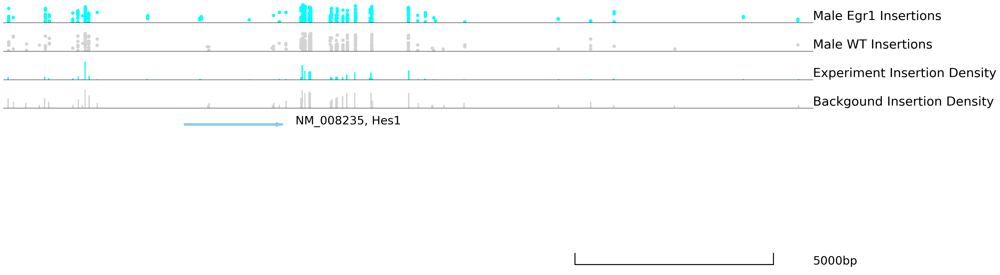

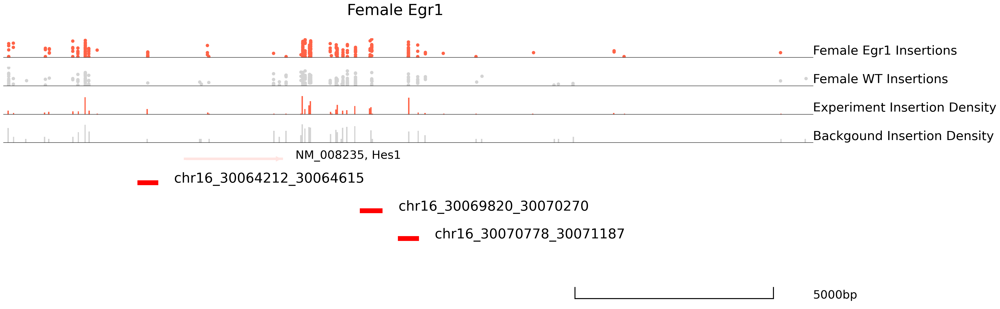

In [14]:
cc.pl.draw_area("chr16",30070778,30071187, 10000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr16",30070778,30071187, 10000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



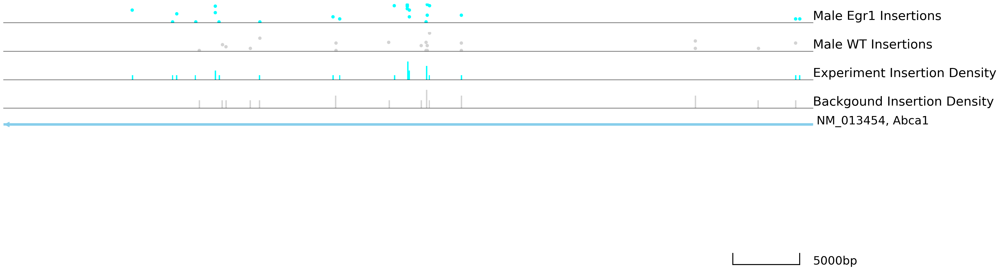

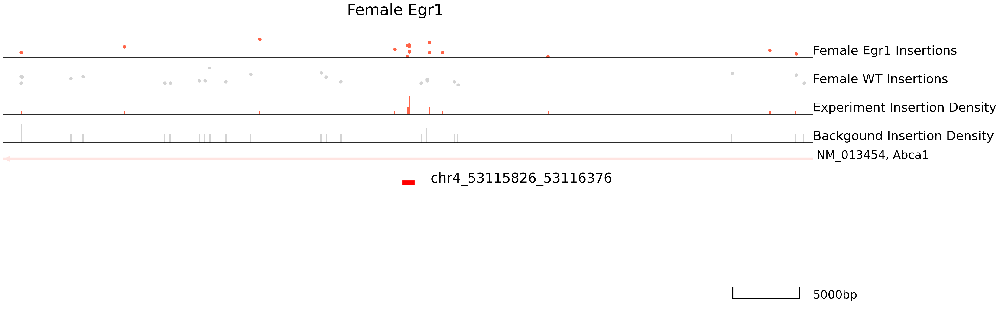

In [15]:
cc.pl.draw_area("chr4",53115826, 53116376, 30000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr4",53115826, 53116376, 30000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')

### find biased peaks as done below for the original peaks

In [50]:
import pandas as pd
import numpy as np
import pycallingcards as cc

# =============================================================================
# 1. LOAD PEAK FILES
# =============================================================================

male_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed"
female_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed"

peak_data_Male = pd.read_csv(male_file, sep="\t", header=None)
peak_data_Female = pd.read_csv(female_file, sep="\t", header=None)

cols = [
    'Chr', 'Start', 'End', 'Center',
    'Experiment Insertions', 'Background insertions',
    'Reference Insertions', 'pvalue Reference', 'pvalue Background',
    'Fraction Experiment', 'TPH Experiment',
    'Fraction background', 'TPH background',
    'TPH background subtracted', 'pvalue_adj Reference'
]

peak_data_Male.columns = cols
peak_data_Female.columns = cols

print("Male peaks:", len(peak_data_Male))
print("Female peaks:", len(peak_data_Female))


# =============================================================================
# 2. ANNOTATE PEAKS (CALLING CARDS)
# =============================================================================

peak_annotation_Male = cc.pp.annotation(
    peak_data_Male,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)
peak_annotation_Male = cc.pp.combine_annotation(
    peak_data_Male,
    peak_annotation_Male
)

peak_annotation_Female = cc.pp.annotation(
    peak_data_Female,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)
peak_annotation_Female = cc.pp.combine_annotation(
    peak_data_Female,
    peak_annotation_Female
)


# =============================================================================
# 3. FILTER TO 20 KB WINDOW
# =============================================================================

peak_annotation_Male = peak_annotation_Male[
    peak_annotation_Male['Distance1'].abs() <= 20000
].reset_index(drop=True)

peak_annotation_Female = peak_annotation_Female[
    peak_annotation_Female['Distance1'].abs() <= 20000
].reset_index(drop=True)


# =============================================================================
# 4. CLEAN GENE ANNOTATIONS
# =============================================================================

def clean_peaks(df):
    df = df.copy()
    df = df[df['Gene Name1'].notna()].copy()
    df = df[~df['Gene Name1'].str.match(
        r'^(Gm\d+|.*Rik$|LOC|RP\d|AC\d)',
        na=False
    )]
    return df


peak_annotation_Male = clean_peaks(peak_annotation_Male)
peak_annotation_Female = clean_peaks(peak_annotation_Female)


# =============================================================================
# 5. COLLAPSE TO ONE PEAK PER GENE
# =============================================================================

def collapse_to_best_peak(df):
    """Keep strongest peak per gene (removes redundant peak calls)"""
    df = df.copy()
    df = df.sort_values('TPH background subtracted', ascending=False)
    df = df.drop_duplicates('Gene Name1')
    return df


male_gene_peaks = collapse_to_best_peak(peak_annotation_Male)
female_gene_peaks = collapse_to_best_peak(peak_annotation_Female)

print("\nCollapsed peaks:")
print("Male gene-level peaks:", len(male_gene_peaks))
print("Female gene-level peaks:", len(female_gene_peaks))


# =============================================================================
# 6. DEFINE TRUE GENE-LEVEL OVERLAP
# =============================================================================

male_genes = set(male_gene_peaks['Gene Name1'])
female_genes = set(female_gene_peaks['Gene Name1'])

shared_genes = male_genes & female_genes
male_only_genes = male_genes - female_genes
female_only_genes = female_genes - male_genes


# =============================================================================
# 7. BUILD CLEAN OUTPUT TABLES
# =============================================================================

male_unique = male_gene_peaks[
    male_gene_peaks['Gene Name1'].isin(male_only_genes)
].copy()

female_unique = female_gene_peaks[
    female_gene_peaks['Gene Name1'].isin(female_only_genes)
].copy()

shared = male_gene_peaks[
    male_gene_peaks['Gene Name1'].isin(shared_genes)
].copy()


# =============================================================================
# 8. ADD IGV/BROWSER REGIONS
# =============================================================================

def add_region(df):
    df = df.copy()
    df['region'] = df.apply(
        lambda r: f"{r['Chr']}:{int(r['Start'])-2000}-{int(r['End'])+2000}",
        axis=1
    )
    return df


male_unique = add_region(male_unique)
female_unique = add_region(female_unique)
shared = add_region(shared)


# =============================================================================
# 9. FINAL SORTING (USE SIGNAL, NOT PEAK IDENTITY)
# =============================================================================

male_unique = male_unique.sort_values(
    'TPH background subtracted', ascending=False
)
female_unique = female_unique.sort_values(
    'TPH background subtracted', ascending=False
)
shared = shared.sort_values(
    'TPH background subtracted', ascending=False
)


# =============================================================================
# 10. SAVE PEAK-LEVEL OUTPUTS
# =============================================================================

male_unique.to_csv(
    "male_unique_gene_level_CC_peaks_20kb_strictpvalues.csv", index=False
)
female_unique.to_csv(
    "female_unique_gene_level_CC_peaks_20kb_strictpvalues.csv", index=False
)
shared.to_csv(
    "shared_gene_level_CC_peaks_20kb_strictpvalues.csv", index=False
)


# =============================================================================
# 11. SUMMARY (PEAK-LEVEL)
# =============================================================================

print("\n================ PEAK-LEVEL SUMMARY ================\n")
print("Male unique genes:",   len(male_unique))
print("Female unique genes:", len(female_unique))
print("Shared genes:",        len(shared))

print("\nTop female-biased genes (signal only):")
print(female_unique[['Gene Name1', 'TPH background subtracted']].head(10))

print("\nTop male-biased genes (signal only):")
print(male_unique[['Gene Name1', 'TPH background subtracted']].head(10))


# =============================================================================
# 12. LOAD AND FILTER FEMALE DE DATA (Egr1 KD vs NoTreat)
# =============================================================================

KD_F_1 = pd.read_csv(
    '/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt',
    sep='\t'
)

# Rename the unnamed Ensembl ID column (it was rownames in R)
KD_F_1 = KD_F_1.rename(columns={'Unnamed: 0': 'ensembl_id'})

# Drop rows without a gene symbol
KD_F_1 = KD_F_1.dropna(subset=['SYMBOL']).copy()

# Filter for DE: |log2FC| >= 0.5 AND pvalue <= 0.05
KD_F_1 = KD_F_1[
    (KD_F_1['log2FoldChange'].abs() >= 0.5) &
    (KD_F_1['pvalue'] <= 0.05)
].copy()

print(f"\nFemale DE genes (|log2FC|>=0.5, p<=0.05): {len(KD_F_1)}")
print(f"  Downregulated after KD: {(KD_F_1['log2FoldChange'] < 0).sum()}")
print(f"  Upregulated after KD:   {(KD_F_1['log2FoldChange'] > 0).sum()}")

DE_genes_female = set(KD_F_1['SYMBOL'])


# =============================================================================
# 13. INTERSECT CC PEAK GENES WITH FEMALE DE GENES
# =============================================================================

female_unique_DE = female_unique[
    female_unique['Gene Name1'].isin(DE_genes_female)
].copy()

male_unique_DE = male_unique[
    male_unique['Gene Name1'].isin(DE_genes_female)
].copy()

shared_DE = shared[
    shared['Gene Name1'].isin(DE_genes_female)
].copy()


# =============================================================================
# 14. ATTACH DE STATS (log2FC, pvalue) TO EACH CC PEAK ROW
# =============================================================================

de_subset = KD_F_1[['SYMBOL', 'log2FoldChange', 'pvalue']].rename(
    columns={
        'SYMBOL': 'Gene Name1',
        'log2FoldChange': 'Female_KD_log2FC',
        'pvalue': 'Female_KD_pvalue'
    }
)

female_unique_DE = female_unique_DE.merge(de_subset, on='Gene Name1', how='left')
male_unique_DE   = male_unique_DE.merge(de_subset, on='Gene Name1', how='left')
shared_DE        = shared_DE.merge(de_subset, on='Gene Name1', how='left')

# Direction column for convenience
for df in (female_unique_DE, male_unique_DE, shared_DE):
    df['Direction'] = np.where(df['Female_KD_log2FC'] < 0, 'Down', 'Up')


# =============================================================================
# 15. SAVE CC ∩ DE OUTPUTS
# =============================================================================

female_unique_DE.to_csv(
    "female_unique_CC_peaks_DE_in_female_KD.csv", index=False
)
male_unique_DE.to_csv(
    "male_unique_CC_peaks_DE_in_female_KD.csv", index=False
)
shared_DE.to_csv(
    "shared_CC_peaks_DE_in_female_KD.csv", index=False
)


# =============================================================================
# 16. SUMMARY (CC ∩ DE)
# =============================================================================

def pct(n, d):
    return 100 * n / d if d > 0 else 0

print("\n================ CC ∩ FEMALE DE SUMMARY ================\n")
print(f"Female-unique CC genes DE in female KD:  "
      f"{len(female_unique_DE):>5} / {len(female_unique):>5} "
      f"({pct(len(female_unique_DE), len(female_unique)):.1f}%)")
print(f"Male-unique CC genes DE in female KD:    "
      f"{len(male_unique_DE):>5} / {len(male_unique):>5} "
      f"({pct(len(male_unique_DE), len(male_unique)):.1f}%)")
print(f"Shared CC genes DE in female KD:         "
      f"{len(shared_DE):>5} / {len(shared):>5} "
      f"({pct(len(shared_DE), len(shared)):.1f}%)")

print("\nTop female-unique CC genes DE in female KD (by CC signal):")
print(
    female_unique_DE[
        ['Gene Name1', 'TPH background subtracted',
         'Female_KD_log2FC', 'Female_KD_pvalue', 'Direction']
    ].head(15)
)

print("\nTop shared CC genes DE in female KD (by CC signal):")
print(
    shared_DE[
        ['Gene Name1', 'TPH background subtracted',
         'Female_KD_log2FC', 'Female_KD_pvalue', 'Direction']
    ].head(15)
)

Male peaks: 3060
Female peaks: 4266
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.

Collapsed peaks:
Male gene-level peaks: 1928
Female gene-level peaks: 2655

================ PEAK-LEVEL SUMMARY ================

Male unique genes: 894
Female unique genes: 1621
Shared genes: 1034

Top female-biased genes (signal only):
     Gene Name1  TPH background subtracted
255       Rps12                5078.941538
2123     Pard6b                4886.167733
1404      Tcte3                4024.926556
2626       Ereg                3685.668326
2011      Thbs1                3661.469073
3204      Nr2f6                3412.987333
1067        Dap                3376.512694
2670     Alkbh2                3279.598510
3486     Ctdspl                3128.148128
755         Mok                3115.872741

Top male-biased genes

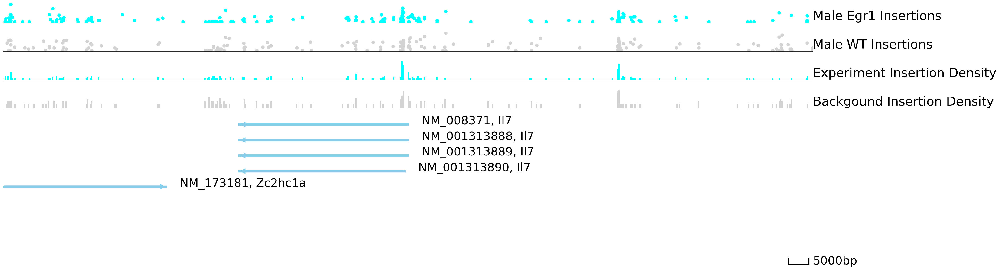

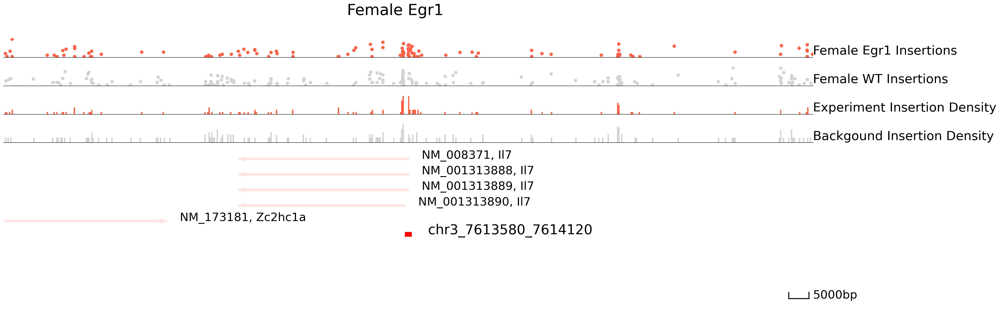

In [57]:
cc.pl.draw_area("chr3",7613580,7614120, 100000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr3",7613580,7614120, 100000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



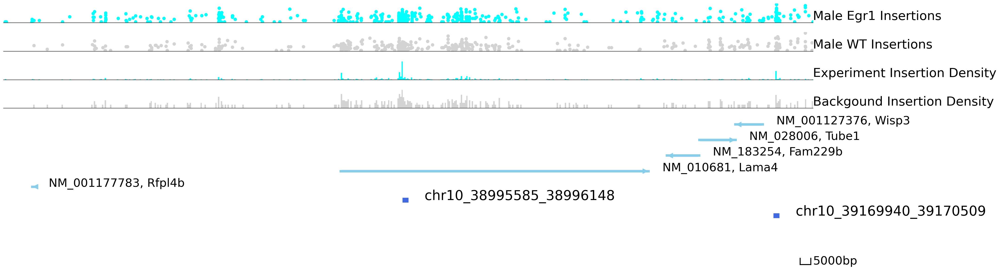

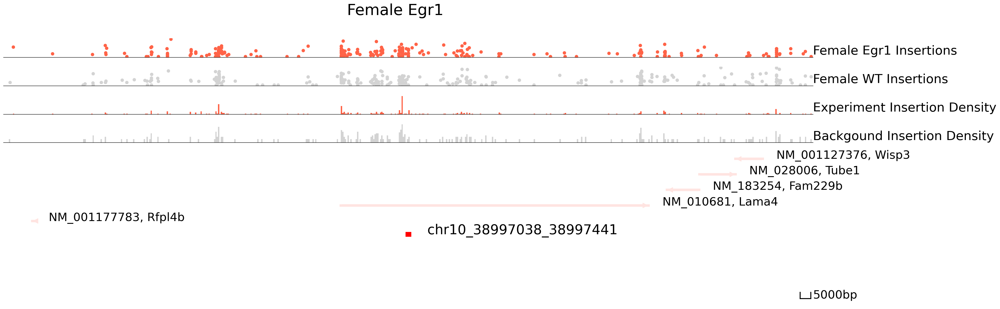

In [63]:
cc.pl.draw_area("chr10",38997038, 38997441, 190000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr10",38997038, 38997441, 190000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



# 042026
In the terminal:
042026
In folder: /scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper
 wc -l file1_chrY.bed
2807 file1_chrY.bed
 wc -l file2_chrY.bed
1905 file2_chrY.bed
/ref/rmlab/software/spack-0.22/bin/spack install bedtools2 - didn’t work

/ref/rmlab/software/pycallingcards/bin/bedtools intersect -v -a file1_chrY.bed -b file2_chrY.bed > file1_chrY_clean.bed
/ref/rmlab/software/pycallingcards/bin/bedtools intersect -v -a file2_chrY.bed -b file1_chrY.bed > file2_chrY_clean.bed

wc -l file1_chrY_clean.bed
1930 file1_chrY_clean.bed
(base) l.llaci@login:/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper$ wc -l file2_chrY_clean.bed
1110 file2_chrY_clean.bed

#So there's still a lot left in the Y chromosome. How to explore what these hops are? 


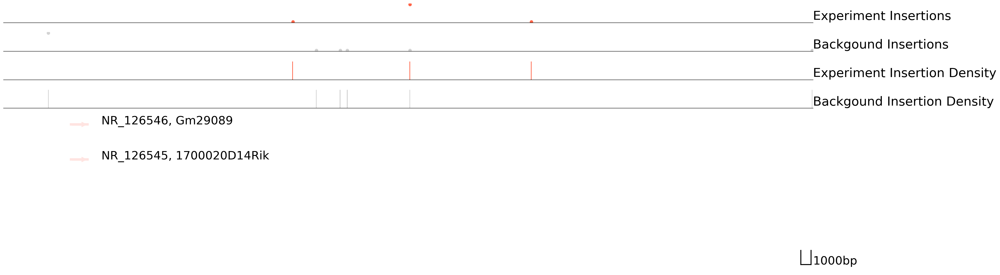

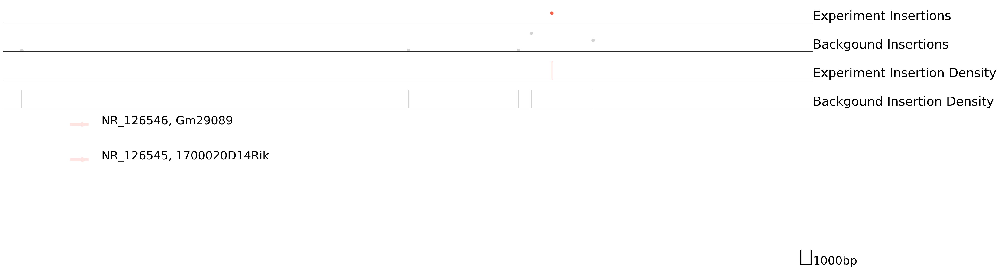

In [13]:
# hops left in Y chromosome after removing shared hops on the Y chromosome in males and females

cc.pl.draw_area("chrY",239480,239484,40000,peak_data_Male, Male_Egr1, "mm10", Male_WT, font_size=2,
                figsize = (30,10), peak_line = 1, save = False, plotsize = [1,1,4], example_length = 1000)

cc.pl.draw_area("chrY",239480,239484,40000,peak_data_Female, Female_Egr1, "mm10", Female_WT, font_size=2,
                figsize = (30,10), peak_line = 1, save = False, plotsize = [1,1,4], example_length = 1000)

  

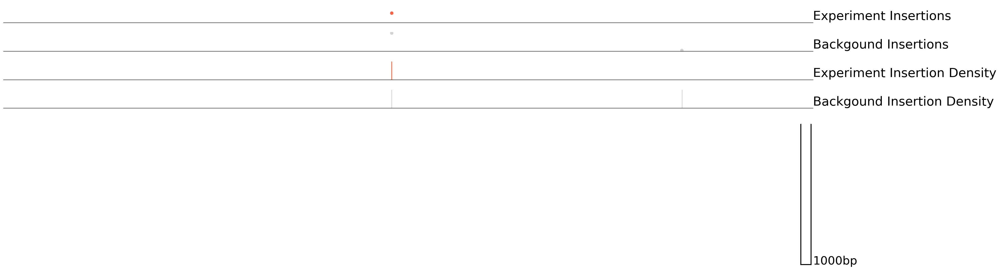

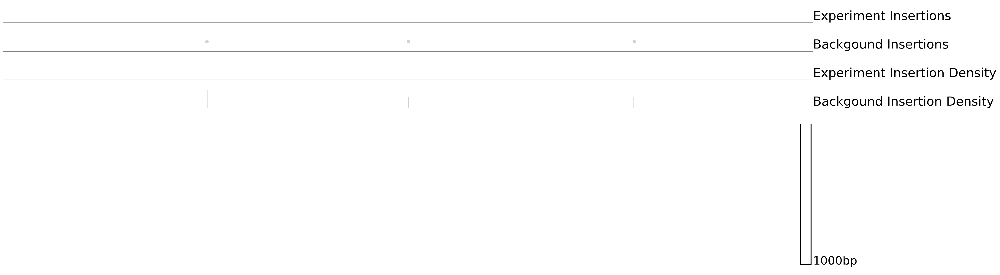

In [14]:
# hops left in Y chromosome after removing shared hops on the Y chromosome in males and females

cc.pl.draw_area("chrY",1639936,1639940,40000,peak_data_Male, Male_Egr1, "mm10", Male_WT, font_size=2,
                figsize = (30,10), peak_line = 1, save = False, plotsize = [1,1,4], example_length = 1000)

cc.pl.draw_area("chrY",1639936,1639940,40000,peak_data_Female, Female_Egr1, "mm10", Female_WT, font_size=2,
                figsize = (30,10), peak_line = 1, save = False, plotsize = [1,1,4], example_length = 1000)

  

In [ ]:
# these hops left behind in the Y chromosome are not real hops.

**********************************************************************

# Compare to the guide 3 as above

In [21]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MvF_MaleBiased_NearestGene_vs_Egr1g3vsNeg1.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MvF_FemaleBiased_NearestGene_vs_Egr1g3vsNeg1.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes: 579
Female genes: 720
Number of overlapping genes: 74
['Pdgfb', 'Jam2', 'Gng2', 'Kazald1', 'Nfatc2']
Number of WHaoverlapping genes: 98
['Polr3g', 'Tgfb1', 'Synpo', 'Stox2', 'Sesn3']


# Conclusion: Calling peaks together gets rid of a lot of genes, so let's not use the combined peaks.

In [8]:
import numpy as np
import pandas as pd

# assume your dataframes are:
# peak_annotation_Male_20000
# peak_annotation_Female_20000

male_df = peak_annotation_Male_20000.copy()
female_df = peak_annotation_Female_20000.copy()

# --- compute log2 fold change in each ---
male_df["log2FC_male"] = np.log2(
    (male_df["Experiment Insertions"] + 1) /
    (male_df["Background insertions"] + 1)
)

female_df["log2FC_female"] = np.log2(
    (female_df["Experiment Insertions"] + 1) /
    (female_df["Background insertions"] + 1)
)

# --- merge on genomic coordinates ---
merged = pd.merge(
    male_df[["Chr", "Start", "End", "log2FC_male"]],
    female_df[["Chr", "Start", "End", "log2FC_female"]],
    on=["Chr", "Start", "End"],
    how="inner"
)

# --- compute difference (male vs female) ---
merged["delta_log2FC"] = merged["log2FC_male"] - merged["log2FC_female"]

# --- get top sex-biased peaks ---
top_male_specific = merged.sort_values("delta_log2FC", ascending=False).head(20)
top_female_specific = merged.sort_values("delta_log2FC").head(20)

# --- optional: quick look ---
print("Top male-specific peaks:")
print(top_male_specific.head())

print("\nTop female-specific peaks:")
print(top_female_specific.head())

Top male-specific peaks:
        Chr     Start       End  log2FC_male  log2FC_female  delta_log2FC
500   chr15  79670547  79670950     4.643856       1.807355      2.836501
1524   chr9  92542835  92543238     4.000000       1.184425      2.815575
1018   chr4   3775932   3776335     3.321928       0.584963      2.736966
216   chr11  70670691  70671094     3.584963       1.000000      2.584963
647   chr17  44238986  44239389     3.169925       0.652077      2.517848

Top female-specific peaks:
        Chr      Start        End  log2FC_male  log2FC_female  delta_log2FC
325   chr12  101083107  101083733     1.263034       4.321928     -3.058894
322   chr12   99965481   99965884     1.099536       4.000000     -2.900464
190   chr11   50155821   50156267     1.000000       3.807355     -2.807355
1068   chr4   95052634   95053037     1.700440       4.392317     -2.691878
1312   chr7   25250553   25250956     1.459432       4.087463     -2.628031


In [31]:
top = peak_annotation_Male_20000.sort_values(
    "pvalue Background",
    ascending=True
).head(20)
top

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
3296,chr15,79670547,79670950,79670747.0,24,0,2,0.000000e+00,0.0,0.000011,...,1149.365287,0.000000e+00,NM_172609,Tomm22,+,0,NM_028634,Cby1,+,-2888
6470,chr4,119932542,119933057,119932854.0,14,0,2,1.110223e-16,0.0,0.000007,...,670.463084,1.597672e-13,NM_010657,Hivep3,+,0,NM_007902,Edn2,+,228149
2147,chr12,111705144,111705547,111705344.0,28,0,1,0.000000e+00,0.0,0.000013,...,1340.926168,0.000000e+00,NM_027404,Bag5,-,3943,NM_001324482,Bag5,-,3944
3345,chr15,84712493,84712896,84712693.0,23,1,1,0.000000e+00,0.0,0.000011,...,1049.062599,0.000000e+00,NR_040347,Gm20556,-,1733,NM_001346662,Prr5,+,-6092
1671,chr11,105312484,105312963,105312684.0,14,0,2,0.000000e+00,0.0,0.000007,...,670.463084,0.000000e+00,NM_008626,Mrc2,+,0,NM_001294331,Tlk2,+,-28526
6208,chr4,33467476,33467997,33467794.0,11,0,5,5.220158e-12,0.0,0.000005,...,526.792423,4.943934e-09,NM_011884,Rngtt,+,0,NR_106198,Mir8118,+,-29268
3746,chr16,57715170,57715573,57715370.0,13,0,2,1.135892e-10,0.0,0.000006,...,622.572864,9.341685e-08,NM_007739,Col8a1,-,0,NM_025599,Cmss1,-,-108304
3821,chr16,94361624,94362216,94362013.0,16,0,3,0.000000e+00,0.0,0.000008,...,766.243525,0.000000e+00,NM_001159620,Pigp,-,0,NM_001159617,Pigp,-,2236
4565,chr19,5071521,5072114,5071721.0,31,1,3,0.000000e+00,0.0,0.000015,...,1432.184362,0.000000e+00,NM_054042,Cd248,+,-883,NM_001001885,Tmem151a,-,7223
4561,chr19,4482131,4482590,4482387.0,16,0,2,2.220446e-16,0.0,0.000008,...,766.243525,3.129149e-13,NM_134164,Syt12,-,-4989,NM_027237,2010003K11Rik,-,14198


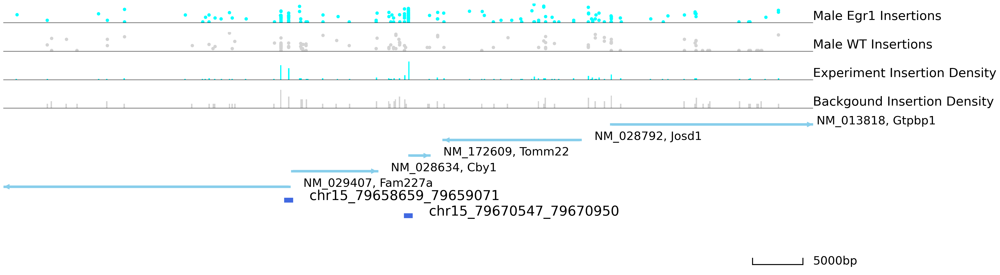

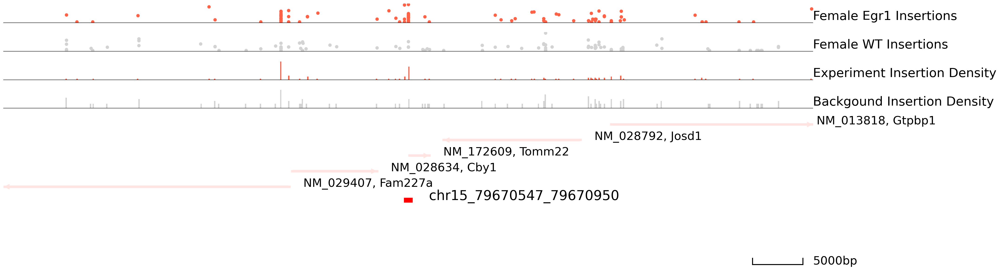

In [32]:
cc.pl.draw_area("chr15",79670547,79670950 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr15",79670547,79670950 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')




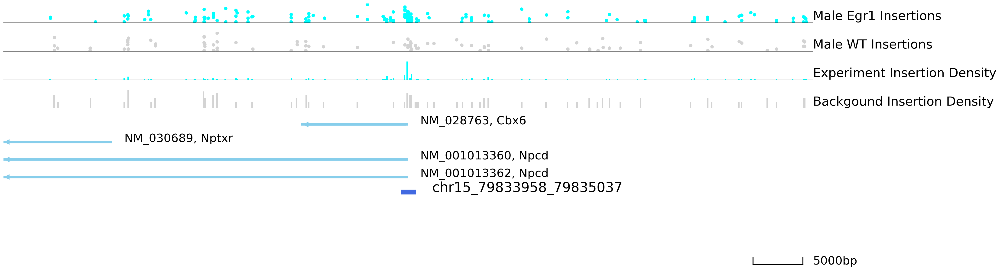

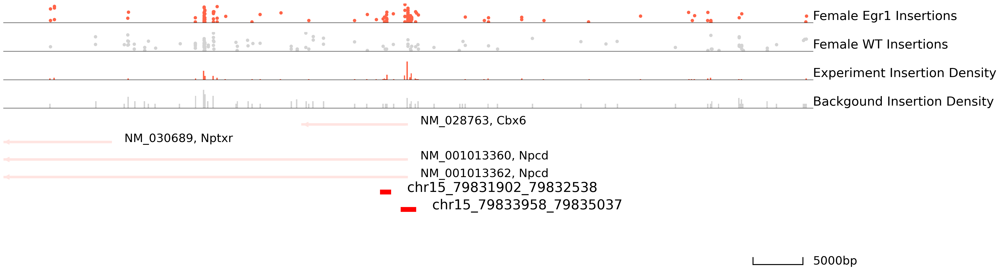

In [33]:
cc.pl.draw_area("chr15",79833958, 79835037,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr15",79833958, 79835037 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')




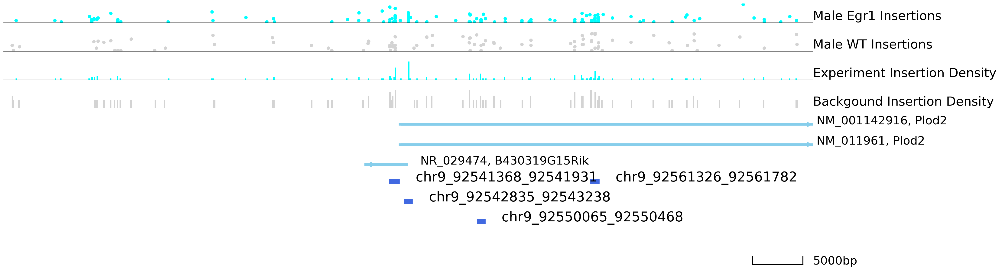

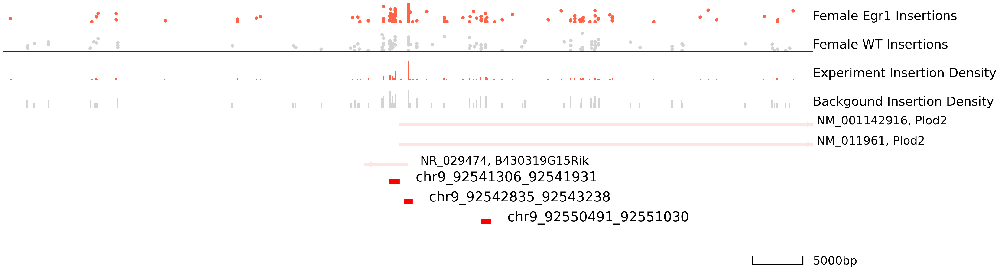

In [28]:
cc.pl.draw_area("chr9", 92542835, 92543238,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr9", 92542835, 92543238,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')




# FEMALE PEAKS

In [38]:
Female_exp_dominant = peak_annotation_Female_20000[
    peak_annotation_Female_20000["Experiment Insertions"] >
    2 * peak_annotation_Female_20000["Background insertions"]
]
Female_exp_dominant

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
11,chr1,7089145,7089922,7089345.0,49,14,5,0.000000e+00,3.441691e-15,0.000042,...,3225.062312,0.000000e+00,NM_183028,Pcmtd1,+,0,NM_001244693,St18,+,-228206
12,chr1,8713430,8713920,8713672.0,5,2,5,1.287239e-08,5.734758e-03,0.000004,...,290.976899,8.371931e-06,NM_001290390,Sntg1,-,0,NM_021511,Rrs1,+,831488
14,chr1,9638760,9639210,9638960.0,5,2,3,1.229198e-06,5.360402e-03,0.000004,...,290.976899,5.952711e-04,NR_015470,2610203C22Rik,-,-7669,NM_178399,3110035E14Rik,+,-11619
26,chr1,15805938,15806411,15806138.0,9,3,2,2.242651e-14,3.805963e-04,0.000008,...,563.775065,2.776279e-11,NM_001286628,Terf1,+,0,NM_001033288,Sbspon,-,47451
27,chr1,16114454,16115008,16114696.5,6,2,5,3.116939e-07,3.936468e-03,0.000005,...,375.850043,1.646326e-04,NM_133832,Rdh10,+,0,NM_011291,Rpl7,-,-10022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9587,chrX,166504333,166504736,166504533.0,11,2,2,2.220446e-15,1.361064e-08,0.000009,...,800.215765,2.996351e-12,NM_001007577,Tceanc,-,0,NM_019397,Egfl6,-,18271
9588,chrX,166509733,166510136,166509933.0,11,4,1,0.000000e+00,1.177708e-05,0.000009,...,666.826942,0.000000e+00,NM_001007577,Tceanc,-,0,NM_019397,Egfl6,-,12871
9589,chrX,167049494,167050024,167049694.0,5,2,2,5.115716e-07,2.187123e-03,0.000004,...,290.976899,2.617819e-04,NM_001101606,Gm8817,-,13425,NM_021278,Tmsb4x,-,157070
9590,chrX,167049896,167050586,167050383.0,7,1,4,3.144886e-08,7.485164e-07,0.000006,...,527.417599,1.947036e-05,NM_001101606,Gm8817,-,12863,NM_021278,Tmsb4x,-,156508


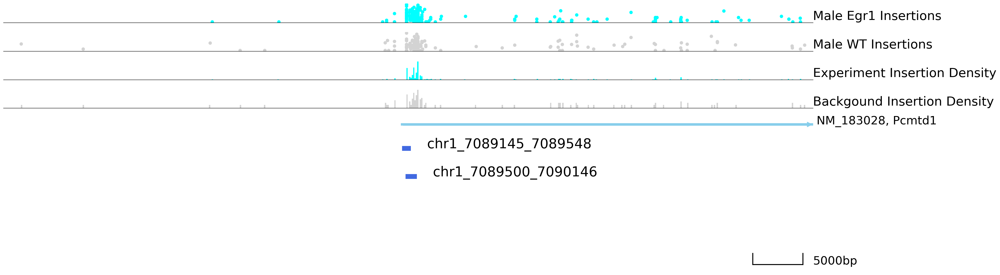

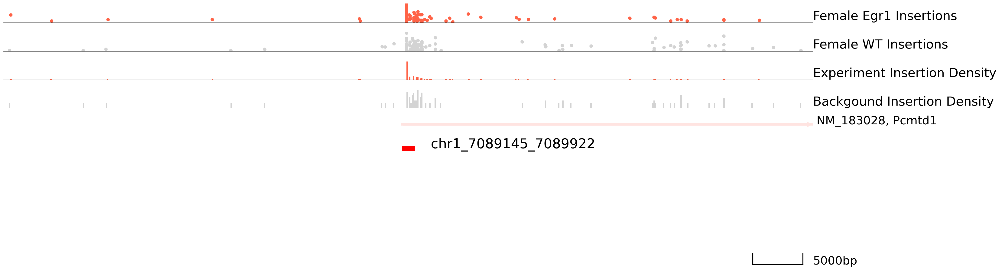

In [39]:
cc.pl.draw_area("chr1",7089145,7089922 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr1",7089145,7089922 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')




# What if I try calling peaks from combined data again? 05/18/26

In [13]:
Egr1 = cc.rd.combine_qbed([Male_Egr1, Female_Egr1])
Egr1
Egr1 = Egr1[Egr1['Reads'] > 2]
Egr1

,Chr,Start,End,Reads,Direction,Barcodes,group
4,chr1,3055563,3055567,4,+,TCGTG/GTTATCGGAT/TCGA,Female_Egr1
7,chr1,3056983,3056987,8,+,TCGTG/GACTTAATAC/GTCA,Female_Egr1
18,chr1,3143887,3143891,6,+,TCGTG/ATACTCTAGG/CTTC,Male_Egr1
32,chr1,3283874,3283878,7,+,TCGTG/CACAGCGCGT/CTTC,Female_Egr1
36,chr1,3321360,3321364,3,+,TCGTG/GACTTAATAC/GTCA,Female_Egr1
...,...,...,...,...,...,...,...
3266319,chrY,90834140,90834144,16,-,TCGTG/GCTACATGTG/CATG,Male_Egr1
3266320,chrY,90834826,90834830,3,+,TCGTG/CACAGCGCGT/CTGA,Female_Egr1
3266322,chrY,90835877,90835881,8,-,TCGTG/CACAGCGCGT/GAAG,Female_Egr1
3266326,chrY,90837734,90837738,22,-,TCGTG/GTTATCGGAT/CATG,Female_Egr1


In [14]:
WT = cc.rd.combine_qbed([Male_WT, Female_WT])
WT
WT = WT[WT['Reads'] > 2]
WT

,Chr,Start,End,Reads,Direction,Barcodes,group
1,chr1,3031511,3031515,6,-,TCGTG/TTGTCCAACT/GTCA,Female_WT
3,chr1,3031511,3031515,3,-,TCGTG/GTCGTGCAAC/TGGT,Female_WT
5,chr1,3048018,3048022,9,-,TCGTG/GTCGTGCAAC/CATG,Female_WT
13,chr1,3055972,3055976,4,+,TCGTG/CTAGGTGGAC/TCAG,Male_WT
21,chr1,3058419,3058423,6,-,TCGTG/CTCACGGTGC/CTTC,Male_WT
...,...,...,...,...,...,...,...
3407297,chrY,90836044,90836048,6,-,TCGTG/CGTTACACAG/CTGA,Male_WT
3407298,chrY,90836126,90836130,3,+,TCGTG/CGCTGGCTCT/TTGG,Female_WT
3407299,chrY,90838013,90838017,4,+,TCGTG/CTAGGTGGAC/CATG,Male_WT
3407300,chrY,90838096,90838100,3,+,TCGTG/TTGTCCAACT/CATG,Female_WT


In [9]:
# Call Peaks separately using the same parameters as I've used to call peaks separately
peak_data_combined = cc.pp.call_peaks(Egr1, WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.005,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_YchromFiltered_bg0.005_TTAAp001_originalparameters_051826.bed")


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 51/51 [38:50<00:00, 45.70s/it]   


In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
Annotated peaks: 8700


100%|██████████| 21/21 [00:03<00:00,  6.18it/s]


AnnData object with n_obs × n_vars = 2 × 8700
    var: 'Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2'
Empty DataFrame
Columns: []
Index: [Female_Egr1, Male_Egr1]


100%|██████████| 2/2 [00:50<00:00, 25.15s/it]


Female-biased peaks: 222
Male-biased peaks:   223
Shared peaks: 8255

BED files saved:
  Egr1_female_biased_peaks_combinedcall_originalpvalues.bed
  Egr1_male_biased_peaks_combinedcall_originalpvalues.bed
  Egr1_shared_peaks_combinedcall_originalpvalues.bed


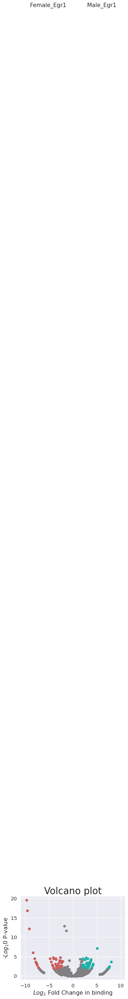

In [15]:
# =============================================================================
# CONTINUE FROM HERE (after peak_data_combined is created)
# =============================================================================
# Assumes:
#   - Egr1 = combined Male_Egr1 + Female_Egr1 qbed (filtered Reads > 2)
#   - WT = combined Male_WT + Female_WT qbed (filtered Reads > 2)
#   - Male_Egr1 has 'group' column = "Male_Egr1"
#   - Female_Egr1 has 'group' column = "Female_Egr1"
#   - peak_data_combined = joint peak calls (MACC2)


# =============================================================================
# 1. ANNOTATE PEAKS TO NEAREST GENES
# =============================================================================

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_YchromFiltered_bg0.005_TTAAp001_originalparameters_051826.bed"
peak_annotation_combined = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_annotation_combined.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_annotation_combined)


peak_annotation_combined = cc.pp.annotation(
    peak_data_combined,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)
peak_annotation_combined = cc.pp.combine_annotation(
    peak_data_combined,
    peak_annotation_combined
)
print(f"Annotated peaks: {len(peak_annotation_combined)}")
peak_annotation_combined.head()


# =============================================================================
# 2. BUILD ANNDATA: GROUP × PEAK
# =============================================================================
# Counts Egr1 insertions per sex at each joint peak.

adata_cc = cc.pp.make_Anndata(
    Egr1,                                        # filtered combined Egr1 qbed
    peak_annotation_combined,
    ["Female_Egr1", "Male_Egr1"],
    key='group'
)
print(adata_cc)
print(adata_cc.obs)


# =============================================================================
# 3. DIFFERENTIAL PEAK ANALYSIS (Fisher's exact test)
# =============================================================================

cc.tl.rank_peak_groups(
    adata_cc,
    'Index',
    method='fisher_exact',
    key_added='fisher_exact'
)


# =============================================================================
# 4. VOLCANO PLOT
# =============================================================================

cc.pl.volcano_plot(
    adata_cc,
    pvalue_name='pvalues_adj',
    pvalue_cutoff=0.01,
    lfc_cutoff=2,
    figsize=(5, 4),
    labelright=(3, 250),
    labelleft=(-9, 250)
)


# =============================================================================
# 5. EXTRACT FEMALE-BIASED, MALE-BIASED, AND SHARED PEAKS
# =============================================================================

PVAL_CUT = 0.01
LFC_CUT  = 2.0     # try 1.5, 2, 3 — start at 2

female_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Female_Egr1']
)
male_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Male_Egr1']
)

print(f"Female-biased peaks: {len(female_biased)}")
print(f"Male-biased peaks:   {len(male_biased)}")


# =============================================================================
# 6. CONVERT TO BED FORMAT
# =============================================================================
# The 'names' column from rank_peak_groups_df is "Chr_Start_End"

def names_to_bed(df):
    out = df['names'].str.split('_', expand=True)
    out.columns = ['Chr', 'Start', 'End']
    return out

female_biased_bed = names_to_bed(female_biased)
male_biased_bed   = names_to_bed(male_biased)

# Shared = all joint peaks MINUS sex-biased ones
all_peaks_bed = peak_data_combined[['Chr', 'Start', 'End']].copy()
all_peaks_bed['name'] = (
    all_peaks_bed['Chr'].astype(str) + '_' +
    all_peaks_bed['Start'].astype(str) + '_' +
    all_peaks_bed['End'].astype(str)
)
biased_names = set(female_biased['names']) | set(male_biased['names'])
shared_bed = all_peaks_bed[
    ~all_peaks_bed['name'].isin(biased_names)
][['Chr', 'Start', 'End']]

print(f"Shared peaks: {len(shared_bed)}")


# =============================================================================
# 7. SAVE BED FILES FOR DEEPTOOLS HEATMAP
# =============================================================================

female_biased_bed.to_csv(
    'Egr1_female_biased_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)
male_biased_bed.to_csv(
    'Egr1_male_biased_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)
shared_bed.to_csv(
    'Egr1_shared_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)

print("\nBED files saved:")
print("  Egr1_female_biased_peaks_combinedcall_originalpvalues.bed")
print("  Egr1_male_biased_peaks_combinedcall_originalpvalues.bed")
print("  Egr1_shared_peaks_combinedcall_originalpvalues.bed")


# =============================================================================
# 8. OPTIONAL: SAVE FULL ANNOTATED TABLES WITH DE STATS
# =============================================================================

female_biased.to_csv(
    'Egr1_female_biased_peaks_combinedcall_full_originalpvalues.csv', index=False
)
male_biased.to_csv(
    'Egr1_male_biased_peaks_combinedcall_full_originalpvalues.csv', index=False
)

In [14]:
female_biased

,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest
0,chr9_91129601_91130256,9.742135,3.036343e-24,2.641618e-20,62,0,72481,101073
1,chr4_82536956_82537454,9.543076,3.293369e-21,1.432616e-17,54,0,72481,101073
2,chr9_90838047_90838514,9.146354,2.815201e-16,6.123062e-13,41,0,72481,101073
3,chr18_12949099_12949502,8.375566,7.906530e-10,9.826687e-07,24,0,72481,101073
4,chr17_45805661_45806279,2.618226,1.463243e-08,1.591276e-05,40,9,72481,101073
...,...,...,...,...,...,...,...,...
217,chr13_115102052_115102495,2.037372,9.593954e-03,1.375081e-01,12,4,72481,101073
218,chr2_26068097_26068500,2.037372,9.593954e-03,1.375081e-01,12,4,72481,101073
219,chr9_14576246_14576703,2.037372,9.593954e-03,1.375081e-01,12,4,72481,101073
220,chr5_92710496_92710941,2.037372,9.593954e-03,1.375081e-01,12,4,72481,101073


In [16]:
import pandas as pd

DATE = "052126"

bed_files = {
    'female_biased': 'Egr1_female_biased_peaks_combinedcall_originalpvalues.bed',
    'male_biased':   'Egr1_male_biased_peaks_combinedcall_originalpvalues.bed',
    'shared':        'Egr1_shared_peaks_combinedcall_originalpvalues.bed',
}

annotations      = {}
annotations_20kb = {}

for label, bed_file in bed_files.items():
    # Read BED
    peak_data = pd.read_csv(bed_file, sep='\t', header=None)
    peak_data.columns = ['Chr', 'Start', 'End']

    # >>> SORT (lexicographic chr, then numeric start) — matches bedtools `sort -k1,1 -k2,2n`
    peak_data['Start'] = peak_data['Start'].astype(int)
    peak_data['End']   = peak_data['End'].astype(int)
    peak_data = peak_data.sort_values(['Chr', 'Start']).reset_index(drop=True)

    print(f"\n{label}: {len(peak_data)} peaks loaded from {bed_file}")

    # Annotate
    ann = cc.pp.annotation(
        peak_data,
        reference="mm10",
        bedtools_path='/ref/rmlab/software/pycallingcards/bin'
    )
    ann = cc.pp.combine_annotation(peak_data, ann)
    annotations[label] = ann

    # 20 kb nearest-gene filter
    ann_20kb = ann[ann['Distance1'].abs() <= 20000].reset_index(drop=True)
    annotations_20kb[label] = ann_20kb
    print(f"  Annotated: {len(ann)} | within 20 kb: {len(ann_20kb)}")

    # Save full + 20 kb tables
    ann.to_csv(f"Egr1_{label}_peaks_combinedcall_annotated_{DATE}.txt",
               sep='\t', index=False, header=True)
    ann_20kb.to_csv(f"Egr1_{label}_peaks_combinedcall_20kbThreshhold_{DATE}.txt",
                    sep='\t', index=False, header=True)

print("\nDone.")


female_biased: 222 peaks loaded from Egr1_female_biased_peaks_combinedcall_originalpvalues.bed
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
  Annotated: 222 | within 20 kb: 173

male_biased: 223 peaks loaded from Egr1_male_biased_peaks_combinedcall_originalpvalues.bed
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
  Annotated: 223 | within 20 kb: 157

shared: 8255 peaks loaded from Egr1_shared_peaks_combinedcall_originalpvalues.bed
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
  Annotated: 8255 | within 20 kb: 6775

Done.


In [21]:
import pandas as pd
from scipy.stats import fisher_exact

# ---- Male DE ----
KD_M = pd.read_csv(
    '/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/'
    'Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
KD_M = KD_M.sort_values('pvalue').drop_duplicates(subset='SYMBOL', keep='first')
print("Male all genes:", len(KD_M))

mask_M = (KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)
KD_M_DE     = KD_M[mask_M]
KD_M_not_DE = KD_M[~mask_M]
print("Male DE:", len(KD_M_DE), "| Male NOT DE:", len(KD_M_not_DE))

# ---- Female DE ----
KD_F = pd.read_csv(
    '/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/'
    'Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
KD_F = KD_F.sort_values('pvalue').drop_duplicates(subset='SYMBOL', keep='first')
print("Female all genes:", len(KD_F))

mask_F = (KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)
KD_F_DE     = KD_F[mask_F]
KD_F_not_DE = KD_F[~mask_F]
print("Female DE:", len(KD_F_DE), "| Female NOT DE:", len(KD_F_not_DE))


# ---- Fisher's loop (unchanged from before) ----
de_sets = {
    'Male_KD':   {'DE': KD_M_DE, 'NOT_DE': KD_M_not_DE},
    'Female_KD': {'DE': KD_F_DE, 'NOT_DE': KD_F_not_DE},
}

results = []
for peak_label, ann_df in annotations_20kb.items():
    cc_genes = set(ann_df['Gene Name1'].dropna().unique())
    print(f"\n=== {peak_label} peaks: {len(cc_genes)} unique nearest-gene CC genes ===")

    for de_label, sets in de_sets.items():
        de_genes     = set(sets['DE']['SYMBOL'].dropna())
        non_de_genes = set(sets['NOT_DE']['SYMBOL'].dropna())

        a = len(de_genes & cc_genes)
        b = len(de_genes - cc_genes)
        c = len(non_de_genes & cc_genes)
        d = len(non_de_genes - cc_genes)

        assert a + b + c + d == len(de_genes | non_de_genes), \
            f"Universe mismatch in {peak_label} vs {de_label}"

        oddsratio, p_value = fisher_exact([[a, b], [c, d]], alternative='greater')
        print(f"  vs {de_label} DE: p={p_value:.4e}  OR={oddsratio:.3f}  "
              f"table=[[{a},{b}],[{c},{d}]]")

        results.append({
            'peak_set':    peak_label,
            'DE_set':      de_label,
            'CC_genes':    len(cc_genes),
            'DE_genes':    len(de_genes),
            'a_DE_CC':     a,
            'b_DE_noCC':   b,
            'c_nonDE_CC':  c,
            'd_nonDE_noCC':d,
            'odds_ratio':  oddsratio,
            'p_value':     p_value,
        })

results_df = pd.DataFrame(results)
print("\n=== Fisher's exact summary ===")
print(results_df.to_string(index=False))

DATE = "052126"
results_df.to_csv(f"Egr1_biasedPeaks_vs_DE_Fishers_{DATE}.tsv",
                  sep='\t', index=False)

Male all genes: 17857
Male DE: 577 | Male NOT DE: 17280
Female all genes: 17857
Female DE: 714 | Female NOT DE: 17143

=== female_biased peaks: 163 unique nearest-gene CC genes ===
  vs Male_KD DE: p=1.8094e-01  OR=1.548  table=[[7,570],[136,17143]]
  vs Female_KD DE: p=1.2285e-02  OR=2.220  table=[[12,702],[131,17011]]

=== male_biased peaks: 152 unique nearest-gene CC genes ===
  vs Male_KD DE: p=4.9916e-02  OR=2.062  table=[[8,569],[117,17162]]
  vs Female_KD DE: p=2.8380e-02  OR=2.103  table=[[10,704],[115,17027]]

=== shared peaks: 4643 unique nearest-gene CC genes ===
  vs Male_KD DE: p=7.5711e-14  OR=1.980  table=[[207,370],[3807,13472]]
  vs Female_KD DE: p=2.2375e-08  OR=1.599  table=[[223,491],[3791,13351]]

=== Fisher's exact summary ===
     peak_set    DE_set  CC_genes  DE_genes  a_DE_CC  b_DE_noCC  c_nonDE_CC  d_nonDE_noCC  odds_ratio      p_value
female_biased   Male_KD       163       577        7        570         136         17143    1.548001 1.809378e-01
female_bias

Loaded combined peaks: 8700  (header in file: False)
Start    int64
End      int64
dtype: object
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
Annotated peaks: 8700


100%|██████████| 21/21 [00:03<00:00,  5.32it/s]


AnnData object with n_obs × n_vars = 2 × 8700
    var: 'Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2'
Empty DataFrame
Columns: []
Index: [Female_Egr1, Male_Egr1]


100%|██████████| 2/2 [01:06<00:00, 33.12s/it]


Female-biased peaks: 305
Male-biased peaks:   293
Shared peaks: 8102

BED files saved:
  Egr1_female_biased_peaks_combinedcall_originalpvalues.bed
  Egr1_male_biased_peaks_combinedcall_originalpvalues.bed
  Egr1_shared_peaks_combinedcall_originalpvalues.bed


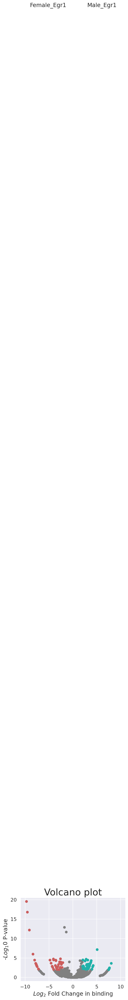

In [15]:
# =============================================================================
# CONTINUE FROM HERE (after peak_data_combined is created)
# =============================================================================
# Assumes:
#   - Egr1 = combined Male_Egr1 + Female_Egr1 qbed (filtered Reads > 2)
#   - WT = combined Male_WT + Female_WT qbed (filtered Reads > 2)
#   - Male_Egr1 has 'group' column = "Male_Egr1"
#   - Female_Egr1 has 'group' column = "Female_Egr1"
#   - peak_data_combined = joint peak calls (MACC2)


# =============================================================================
# 1. ANNOTATE PEAKS TO NEAREST GENES
# =============================================================================

# =============================================================================
# 1. ANNOTATE PEAKS TO NEAREST GENES
# =============================================================================
import pandas as pd

# --- Reload the saved combined peak calls (so call_peaks need not be rerun) ---
# The BED saved with save= IS peak_data_combined on disk -> name it that.
bed_file = ("Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_"
            "YchromFiltered_bg0.005_TTAAp001_originalparameters_051826.bed")

MACC2_COLS = ['Chr', 'Start', 'End', 'Center',
              'Experiment Insertions', 'Background insertions', 'Reference Insertions',
              'pvalue Reference', 'pvalue Background',
              'Fraction Experiment', 'TPH Experiment',
              'Fraction background', 'TPH background', 'TPH background subtracted',
              'pvalue_adj Reference']

# auto-detect whether the saved BED has a header row
with open(bed_file) as fh:
    has_header = fh.readline().split('\t')[0].strip().lower() in ('chr', 'chrom', '#chr')

peak_data_combined = pd.read_csv(bed_file, sep='\t',
                                 header=0 if has_header else None)
if not has_header:
    peak_data_combined.columns = MACC2_COLS[:peak_data_combined.shape[1]]

print(f"Loaded combined peaks: {len(peak_data_combined)}  (header in file: {has_header})")
print(peak_data_combined.dtypes[['Start', 'End']])   # both should be int

# --- Annotate to nearest genes ---
peak_annotation_combined = cc.pp.annotation(
    peak_data_combined,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)
peak_annotation_combined = cc.pp.combine_annotation(
    peak_data_combined,
    peak_annotation_combined
)
print(f"Annotated peaks: {len(peak_annotation_combined)}")
peak_annotation_combined.head()

# =============================================================================
# 2. BUILD ANNDATA: GROUP × PEAK
# =============================================================================
# Counts Egr1 insertions per sex at each joint peak.

adata_cc = cc.pp.make_Anndata(
    Egr1,                                        # filtered combined Egr1 qbed
    peak_annotation_combined,
    ["Female_Egr1", "Male_Egr1"],
    key='group'
)
print(adata_cc)
print(adata_cc.obs)


# =============================================================================
# 3. DIFFERENTIAL PEAK ANALYSIS (Fisher's exact test)
# =============================================================================

cc.tl.rank_peak_groups(
    adata_cc,
    'Index',
    method='fisher_exact',
    key_added='fisher_exact'
)


# =============================================================================
# 4. VOLCANO PLOT
# =============================================================================

cc.pl.volcano_plot(
    adata_cc,
    pvalue_name='pvalues_adj',
    pvalue_cutoff=0.01,
    lfc_cutoff=2,
    figsize=(5, 4),
    labelright=(3, 250),
    labelleft=(-9, 250)
)


# =============================================================================
# 5. EXTRACT FEMALE-BIASED, MALE-BIASED, AND SHARED PEAKS
# =============================================================================

PVAL_CUT = 0.01
LFC_CUT  = 1.0     # try 1.5, 2, 3 — start at 2

female_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Female_Egr1']
)
male_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Male_Egr1']
)

print(f"Female-biased peaks: {len(female_biased)}")
print(f"Male-biased peaks:   {len(male_biased)}")


# =============================================================================
# 6. CONVERT TO BED FORMAT
# =============================================================================
# The 'names' column from rank_peak_groups_df is "Chr_Start_End"

def names_to_bed(df):
    out = df['names'].str.split('_', expand=True)
    out.columns = ['Chr', 'Start', 'End']
    return out

female_biased_bed = names_to_bed(female_biased)
male_biased_bed   = names_to_bed(male_biased)

# Shared = all joint peaks MINUS sex-biased ones
all_peaks_bed = peak_data_combined[['Chr', 'Start', 'End']].copy()
all_peaks_bed['name'] = (
    all_peaks_bed['Chr'].astype(str) + '_' +
    all_peaks_bed['Start'].astype(str) + '_' +
    all_peaks_bed['End'].astype(str)
)
biased_names = set(female_biased['names']) | set(male_biased['names'])
shared_bed = all_peaks_bed[
    ~all_peaks_bed['name'].isin(biased_names)
][['Chr', 'Start', 'End']]

print(f"Shared peaks: {len(shared_bed)}")


# =============================================================================
# 7. SAVE BED FILES FOR DEEPTOOLS HEATMAP
# =============================================================================

female_biased_bed.to_csv(
    'Egr1_female_biased_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)
male_biased_bed.to_csv(
    'Egr1_male_biased_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)
shared_bed.to_csv(
    'Egr1_shared_peaks_combinedcall_originalpvalues.bed',
    sep='\t', index=False, header=False
)

print("\nBED files saved:")
print("  Egr1_female_biased_peaks_combinedcall_originalpvalues.bed")
print("  Egr1_male_biased_peaks_combinedcall_originalpvalues.bed")
print("  Egr1_shared_peaks_combinedcall_originalpvalues.bed")


# =============================================================================
# 8. OPTIONAL: SAVE FULL ANNOTATED TABLES WITH DE STATS
# =============================================================================

female_biased.to_csv(
    'Egr1_female_biased_peaks_combinedcall_full_originalpvalues.csv', index=False
)
male_biased.to_csv(
    'Egr1_male_biased_peaks_combinedcall_full_originalpvalues.csv', index=False
)

In [16]:
# =============================================================================
# 5b. WHERE DOES Nrp1 LAND?  male-biased / female-biased / shared
# =============================================================================
# Run AFTER section 5 (needs peak_annotation_combined, adata_cc,
# female_biased, male_biased, PVAL_CUT, LFC_CUT).

# --- 1. find the Nrp1 peak(s) in the annotated combined peaks ----------------
gene_mask = peak_annotation_combined.apply(
    lambda r: r.astype(str).str.contains(r'\bNrp1\b', case=False,
                                         regex=True, na=False).any(),
    axis=1
)
nrp1_anno = peak_annotation_combined[gene_mask].copy()
nrp1_anno['name'] = (
    nrp1_anno['Chr'].astype(str) + '_' +
    nrp1_anno['Start'].astype(int).astype(str) + '_' +
    nrp1_anno['End'].astype(int).astype(str)
)
print(f"Nrp1-annotated combined peaks: {len(nrp1_anno)}")
print(nrp1_anno[['Chr', 'Start', 'End', 'name']].to_string(index=False))

# --- 2. full (uncut) Fisher's-exact stats for every peak ---------------------
all_stats = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=1.0, logfc_min=0.0,
    group=['Male_Egr1']          # + logFC = male-biased, - = female-biased
)

# --- 3. join stats onto the Nrp1 peaks and classify --------------------------
male_set = set(male_biased['names'])
fem_set  = set(female_biased['names'])

report = nrp1_anno[['Chr', 'Start', 'End', 'name']].merge(
    all_stats[['names', 'logfoldchanges', 'pvalues', 'pvalues_adj']],
    left_on='name', right_on='names', how='left'
)

print(f"\nNrp1 classification at PVAL_CUT={PVAL_CUT}, LFC_CUT={LFC_CUT}:")
for _, r in report.iterrows():
    if r['name'] in male_set:
        call = "MALE-biased"
    elif r['name'] in fem_set:
        call = "FEMALE-biased"
    else:
        call = "shared / not significant"
    lfc, p, padj = r['logfoldchanges'], r['pvalues'], r['pvalues_adj']
    if pd.isna(lfc):
        print(f"  {r['name']}: classified {call}; "
              f"stats not found in Fisher table (name-format mismatch?)")
    else:
        print(f"  {r['name']}: logFC={lfc:+.2f}  p={p:.2e}  "
              f"p_adj={padj:.2e}  -> {call}")

Nrp1-annotated combined peaks: 6
 Chr     Start       End                     name
chr8 128168576 128169200 chr8_128168576_128169200
chr8 128272716 128273119 chr8_128272716_128273119
chr8 128359717 128360708 chr8_128359717_128360708
chr8 128378126 128378621 chr8_128378126_128378621
chr8 128450301 128450887 chr8_128450301_128450887
chr8 128703329 128703846 chr8_128703329_128703846

Nrp1 classification at PVAL_CUT=0.01, LFC_CUT=1.0:
  chr8_128168576_128169200: logFC=+0.83  p=4.20e-01  p_adj=7.86e-01  -> shared / not significant
  chr8_128272716_128273119: classified shared / not significant; stats not found in Fisher table (name-format mismatch?)
  chr8_128359717_128360708: classified shared / not significant; stats not found in Fisher table (name-format mismatch?)
  chr8_128378126_128378621: classified shared / not significant; stats not found in Fisher table (name-format mismatch?)
  chr8_128450301_128450887: classified shared / not significant; stats not found in Fisher table (name-fo

In [17]:
# =============================================================================
# ANNOTATE BIASED + SHARED PEAK SETS  ->  CSV
# =============================================================================
# peak_annotation_combined already has gene names for EVERY combined peak,
# and the biased/shared sets are subsets of it -- so just join on coordinates.

# 0. (optional) check whether the DE tables already carry gene names
print("female_biased columns:", female_biased.columns.tolist())

# 1. matching key on the annotation table: "Chr_Start_End"
peak_annotation_combined['name'] = (
    peak_annotation_combined['Chr'].astype(str) + '_' +
    peak_annotation_combined['Start'].astype(int).astype(str) + '_' +
    peak_annotation_combined['End'].astype(int).astype(str)
)

# 2. join Fisher DE stats with gene annotation
def annotate_de(de_df, label):
    merged = de_df.merge(
        peak_annotation_combined,
        left_on='names', right_on='name',
        how='left', suffixes=('', '_anno')
    )
    miss = merged['name'].isna().sum()
    if miss:
        print(f"  WARNING [{label}]: {miss} peaks unmatched -- check name formatting")
    return merged

female_annotated = annotate_de(female_biased, 'female')
male_annotated   = annotate_de(male_biased,   'male')

# 3. shared peaks have no DE stats -- pull annotation rows directly
shared_keys = (shared_bed['Chr'].astype(str) + '_' +
               shared_bed['Start'].astype(int).astype(str) + '_' +
               shared_bed['End'].astype(int).astype(str))
shared_annotated = peak_annotation_combined[
    peak_annotation_combined['name'].isin(set(shared_keys))
].copy()

# 4. save
female_annotated.to_csv('Egr1_female_biased_peaks_combinedcall_annotated.csv', index=False)
male_annotated.to_csv(  'Egr1_male_biased_peaks_combinedcall_annotated.csv',   index=False)
shared_annotated.to_csv('Egr1_shared_peaks_combinedcall_annotated.csv',        index=False)

print(f"\nFemale-biased annotated: {len(female_annotated)} peaks")
print(f"Male-biased annotated:   {len(male_annotated)} peaks")
print(f"Shared annotated:        {len(shared_annotated)} peaks")
print("Saved 3 annotated CSVs.")

female_biased columns: ['names', 'logfoldchanges', 'pvalues', 'pvalues_adj', 'number', 'number_rest', 'total', 'total_rest']

Female-biased annotated: 305 peaks
Male-biased annotated:   293 peaks
Shared annotated:        8102 peaks
Saved 3 annotated CSVs.


# find nrp1 values

In [3]:
"""
find_nrp1_in_combined_peaks.py

Scan a pycallingcards MACC2 peak BED file (the `save=` output of
cc.pp.call_peaks) for peaks overlapping the Nrp1 locus (mm10) and print
their peak-calling stats.

A raw MACC2 BED has only coordinates + peak-calling stats -- no gene
names -- so we locate Nrp1 by COORDINATE OVERLAP, not by grepping a
gene column. Gene labels only get attached later by cc.pp.annotation().

Safe to run inside a Jupyter notebook (does not use sys.argv).
"""

import os
import glob
import pandas as pd

# ---------------------------------------------------------------------------
# CONFIG
# ---------------------------------------------------------------------------
BED_PATH = ("/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/"
            "Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_"
            "YchromFiltered_bg0.005_TTAAp001_originalparameters_051826.bed")

# Nrp1 search window (mm10). Generous padding around the gene body so peaks
# that nearest-gene annotation would assign to Nrp1 are also caught.
# Your male Nrp1 peaks spanned chr8:128,360,037-128,450,887 -- widen if needed.
NRP1_CHR   = "chr8"
NRP1_START = 128_300_000
NRP1_END   = 128_520_000

# Expected column names for the pycallingcards MACC2 call_peaks output
# (15 cols, matching the male table you posted, before annotation is added).
MACC2_COLS = [
    "Chr", "Start", "End", "Center",
    "Experiment Insertions", "Background insertions", "Reference Insertions",
    "pvalue Reference", "pvalue Background",
    "Fraction Experiment", "TPH Experiment",
    "Fraction background", "TPH background", "TPH background subtracted",
    "pvalue_adj Reference",
]

# ---------------------------------------------------------------------------
# LOCATE FILE
# ---------------------------------------------------------------------------
if not os.path.exists(BED_PATH):
    raise FileNotFoundError(
        f"BED file not found:\n  {BED_PATH}\n"
        f"cwd is {os.getcwd()} -- fix BED_PATH or check the path."
    )
print(f"Reading: {BED_PATH}\n")

# ---------------------------------------------------------------------------
# READ  (auto-detect whether the file has a header row)
# ---------------------------------------------------------------------------
with open(BED_PATH) as fh:
    first_field = fh.readline().split("\t")[0].strip().lower()
has_header = first_field in ("chr", "chrom", "#chr")

df = pd.read_csv(BED_PATH, sep="\t", header=0 if has_header else None)

if not has_header:
    n = df.shape[1]
    if n <= len(MACC2_COLS):
        df.columns = MACC2_COLS[:n]
    else:
        df.columns = MACC2_COLS + [f"extra_{i}" for i in range(n - len(MACC2_COLS))]

print(f"Loaded {len(df)} combined peaks  (header detected: {has_header})")
print(f"Columns ({df.shape[1]}): {list(df.columns)}\n")

# ---------------------------------------------------------------------------
# FIND Nrp1 PEAKS BY COORDINATE OVERLAP
# ---------------------------------------------------------------------------
df["Start"] = pd.to_numeric(df["Start"], errors="coerce")
df["End"]   = pd.to_numeric(df["End"],   errors="coerce")

# a peak overlaps the window if  peak.End > window.Start  and  peak.Start < window.End
nrp1 = df[
    (df["Chr"].astype(str) == NRP1_CHR) &
    (df["End"]   > NRP1_START) &
    (df["Start"] < NRP1_END)
].copy()

print(f"Peaks overlapping {NRP1_CHR}:{NRP1_START:,}-{NRP1_END:,}: {len(nrp1)}\n")

if len(nrp1):
    show = [c for c in [
        "Chr", "Start", "End", "Center",
        "Experiment Insertions", "Background insertions", "Reference Insertions",
        "pvalue Background", "pvalue Reference", "pvalue_adj Reference",
    ] if c in nrp1.columns]
    print(nrp1[show].sort_values("Start").to_string(index=False))
    print(f"\n-> Nrp1 IS called as a peak in the combined data ({len(nrp1)} peak(s)).")
    print("   It will appear in peak_annotation_combined. Whether it comes out")
    print("   sex-biased is then a Fisher's-exact question (needs adata_cc).")
else:
    print("No combined peak overlaps the Nrp1 window.")
    print("-> Nrp1 was NOT called as a peak in the combined data at")
    print("   bg=0.005 / TTAA=0.001. That is a PEAK-CALLING issue, not a")
    print("   Fisher's-exact issue -- widen the window above, or loosen the")
    print("   combined call's pvalue_cutoffbg / pvalue_cutoffTTAA.")

Reading: /scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_YchromFiltered_bg0.005_TTAAp001_originalparameters_051826.bed

Loaded 8700 combined peaks  (header detected: False)
Columns (15): ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']

Peaks overlapping chr8:128,300,000-128,520,000: 3

 Chr     Start       End      Center  Experiment Insertions  Background insertions  Reference Insertions  pvalue Background  pvalue Reference  pvalue_adj Reference
chr8 128359717 128360708 128359964.0                     52                     29                    12       2.300344e-08      0.000000e+00              0.000000
chr8 128378126 128378621 128378418.0                     45         

## more strict p values

In [79]:
# Call Peaks separately
peak_data_combined = cc.pp.call_peaks(Egr1, WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.001,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.0001,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleandFemale_Egr1_VS_WT_MACC2_window300_step150_YchromFiltered_window300_p05_bg0.001_TTAAp0001_051826.bed")


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 51/51 [28:57<00:00, 34.07s/it]  


In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
Annotated peaks: 5514


100%|██████████| 21/21 [00:03<00:00,  5.43it/s]


AnnData object with n_obs × n_vars = 2 × 5514
    var: 'Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference', 'Nearest Refseq1', 'Gene Name1', 'Direction1', 'Distance1', 'Nearest Refseq2', 'Gene Name2', 'Direction2', 'Distance2'
Empty DataFrame
Columns: []
Index: [Female_Egr1, Male_Egr1]


100%|██████████| 2/2 [00:39<00:00, 19.67s/it]


Female-biased peaks: 136
Male-biased peaks:   160
Shared peaks: 5218

BED files saved:
  Egr1_female_biased_peaks_combinedcall.bed
  Egr1_male_biased_peaks_combinedcall.bed
  Egr1_shared_peaks_combinedcall.bed


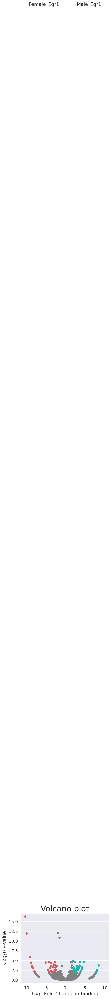

In [80]:
# =============================================================================
# CONTINUE FROM HERE (after peak_data_combined is created)
# =============================================================================
# Assumes:
#   - Egr1 = combined Male_Egr1 + Female_Egr1 qbed (filtered Reads > 2)
#   - WT = combined Male_WT + Female_WT qbed (filtered Reads > 2)
#   - Male_Egr1 has 'group' column = "Male_Egr1"
#   - Female_Egr1 has 'group' column = "Female_Egr1"
#   - peak_data_combined = joint peak calls (MACC2)


# =============================================================================
# 1. ANNOTATE PEAKS TO NEAREST GENES
# =============================================================================

peak_annotation_combined = cc.pp.annotation(
    peak_data_combined,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)
peak_annotation_combined = cc.pp.combine_annotation(
    peak_data_combined,
    peak_annotation_combined
)
print(f"Annotated peaks: {len(peak_annotation_combined)}")
peak_annotation_combined.head()


# =============================================================================
# 2. BUILD ANNDATA: GROUP × PEAK
# =============================================================================
# Counts Egr1 insertions per sex at each joint peak.

adata_cc = cc.pp.make_Anndata(
    Egr1,                                        # filtered combined Egr1 qbed
    peak_annotation_combined,
    ["Female_Egr1", "Male_Egr1"],
    key='group'
)
print(adata_cc)
print(adata_cc.obs)


# =============================================================================
# 3. DIFFERENTIAL PEAK ANALYSIS (Fisher's exact test)
# =============================================================================

cc.tl.rank_peak_groups(
    adata_cc,
    'Index',
    method='fisher_exact',
    key_added='fisher_exact'
)


# =============================================================================
# 4. VOLCANO PLOT
# =============================================================================

cc.pl.volcano_plot(
    adata_cc,
    pvalue_name='pvalues_adj',
    pvalue_cutoff=0.01,
    lfc_cutoff=2,
    figsize=(5, 4),
    labelright=(3, 250),
    labelleft=(-9, 250)
)


# =============================================================================
# 5. EXTRACT FEMALE-BIASED, MALE-BIASED, AND SHARED PEAKS
# =============================================================================

PVAL_CUT = 0.01
LFC_CUT  = 2.0     # try 1.5, 2, 3 — start at 2

female_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Female_Egr1']
)
male_biased = cc.tl.rank_peak_groups_df(
    adata_cc, key='fisher_exact',
    pval_cutoff=PVAL_CUT, logfc_min=LFC_CUT,
    group=['Male_Egr1']
)

print(f"Female-biased peaks: {len(female_biased)}")
print(f"Male-biased peaks:   {len(male_biased)}")


# =============================================================================
# 6. CONVERT TO BED FORMAT
# =============================================================================
# The 'names' column from rank_peak_groups_df is "Chr_Start_End"

def names_to_bed(df):
    out = df['names'].str.split('_', expand=True)
    out.columns = ['Chr', 'Start', 'End']
    return out

female_biased_bed = names_to_bed(female_biased)
male_biased_bed   = names_to_bed(male_biased)

# Shared = all joint peaks MINUS sex-biased ones
all_peaks_bed = peak_data_combined[['Chr', 'Start', 'End']].copy()
all_peaks_bed['name'] = (
    all_peaks_bed['Chr'].astype(str) + '_' +
    all_peaks_bed['Start'].astype(str) + '_' +
    all_peaks_bed['End'].astype(str)
)
biased_names = set(female_biased['names']) | set(male_biased['names'])
shared_bed = all_peaks_bed[
    ~all_peaks_bed['name'].isin(biased_names)
][['Chr', 'Start', 'End']]

print(f"Shared peaks: {len(shared_bed)}")


# =============================================================================
# 7. SAVE BED FILES FOR DEEPTOOLS HEATMAP
# =============================================================================

female_biased_bed.to_csv(
    'Egr1_female_biased_peaks_combinedcall.bed',
    sep='\t', index=False, header=False
)
male_biased_bed.to_csv(
    'Egr1_male_biased_peaks_combinedcall.bed',
    sep='\t', index=False, header=False
)
shared_bed.to_csv(
    'Egr1_shared_peaks_combinedcall.bed',
    sep='\t', index=False, header=False
)

print("\nBED files saved:")
print("  Egr1_female_biased_peaks_combinedcall.bed")
print("  Egr1_male_biased_peaks_combinedcall.bed")
print("  Egr1_shared_peaks_combinedcall.bed")


# =============================================================================
# 8. OPTIONAL: SAVE FULL ANNOTATED TABLES WITH DE STATS
# =============================================================================

female_biased.to_csv(
    'Egr1_female_biased_peaks_combinedcall_full.csv', index=False
)
male_biased.to_csv(
    'Egr1_male_biased_peaks_combinedcall_full.csv', index=False
)

In [88]:
import numpy as np

# Get the count matrix from AnnData (rows = groups, cols = peaks)
counts = adata_cc.X
group_idx = {g: i for i, g in enumerate(adata_cc.obs_names)}
peak_names = adata_cc.var.index.tolist() if 'name' not in adata_cc.var.columns \
             else adata_cc.var['name'].tolist()

# Build a fast lookup: peak_name -> (female_count, male_count)
female_row = counts[group_idx['Female_Egr1'], :]
male_row   = counts[group_idx['Male_Egr1'],   :]

peak_counts = pd.DataFrame({
    'name': peak_names,
    'female_hops': np.asarray(female_row).flatten(),
    'male_hops':   np.asarray(male_row).flatten(),
})

# Merge into female_biased to see the actual counts
female_biased_w_counts = female_biased.merge(
    peak_counts, left_on='names', right_on='name', how='left'
)

print(female_biased_w_counts[['names', 'female_hops', 'male_hops',
                              'logfoldchanges', 'pvalues_adj']].head(20))

print("\nFemale-hop distribution at female-biased peaks:")
print(female_biased_w_counts['female_hops'].describe())

ValueError: All arrays must be of the same length

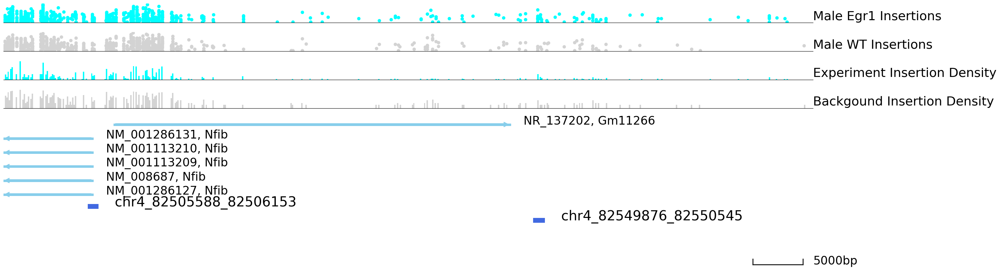

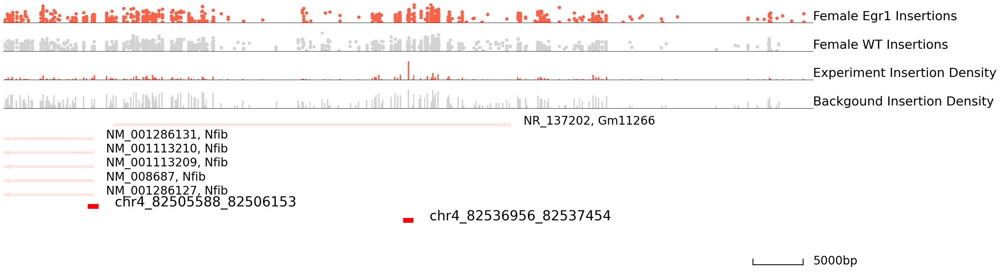

In [81]:

cc.pl.draw_area("chr4",82536956,82537454 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr4",82536956,82537454 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')




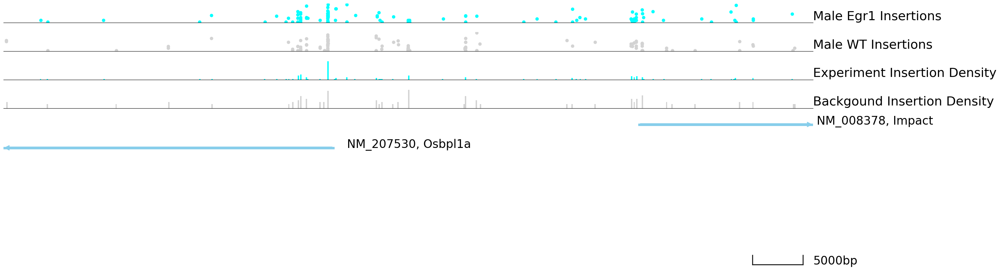

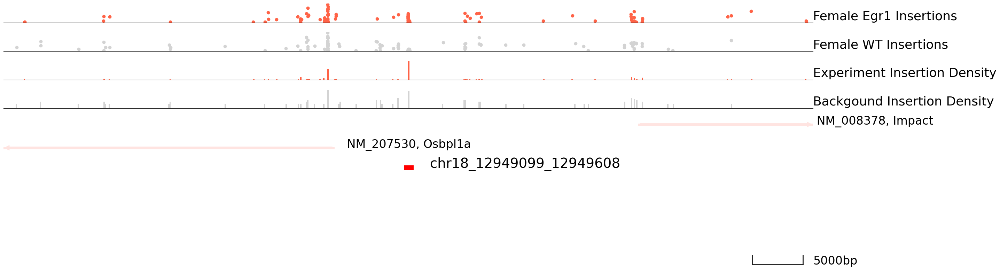

In [85]:
cc.pl.draw_area("chr18",12949099,12949502,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr18",12949099,12949502,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


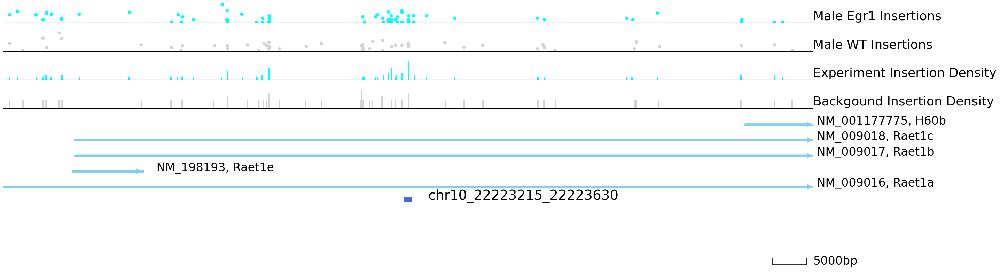

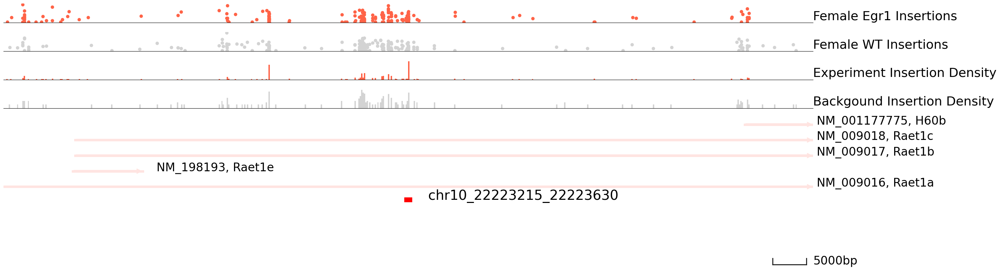

In [94]:
cc.pl.draw_area("chr10",22223215,22223630,60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr10",22223215,22223630,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


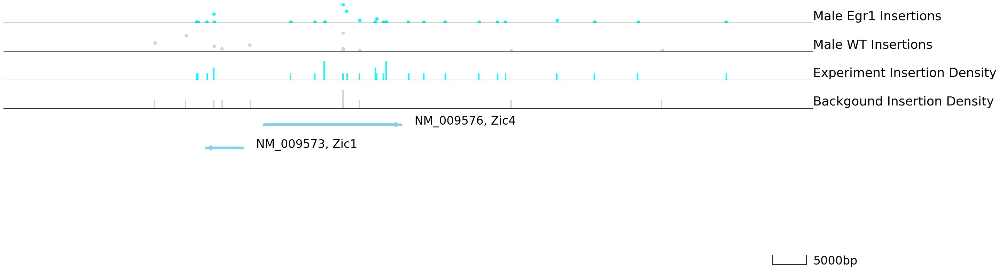

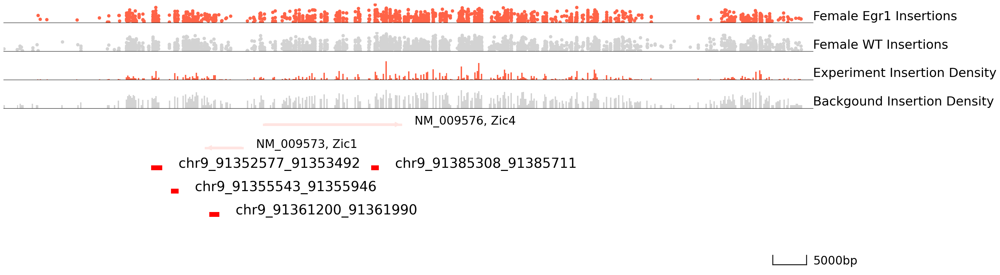

In [95]:
cc.pl.draw_area("chr9",91390252,91390655, 60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr9",91390252,91390655,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


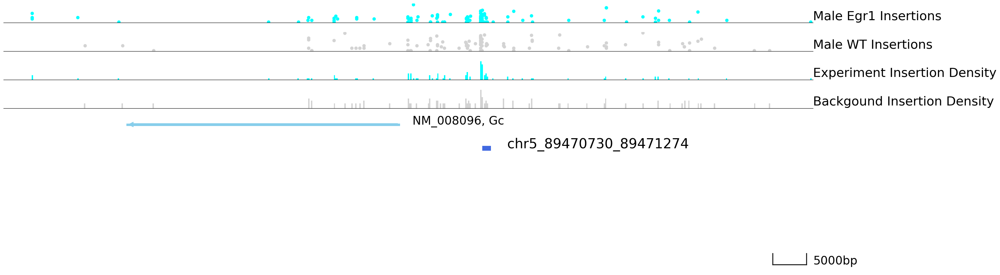

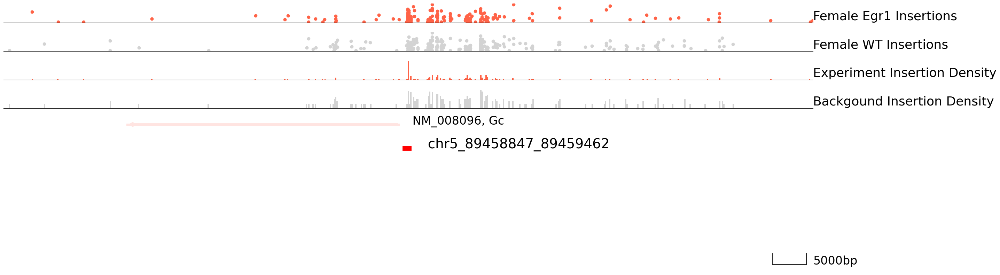

In [96]:
cc.pl.draw_area("chr5",89459040,89459629, 60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr5",89459040,89459629,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


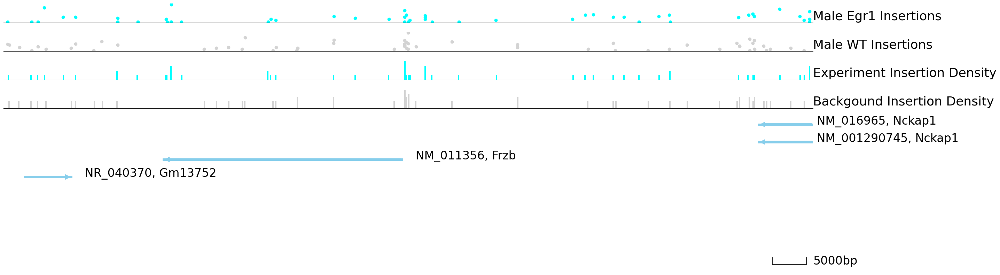

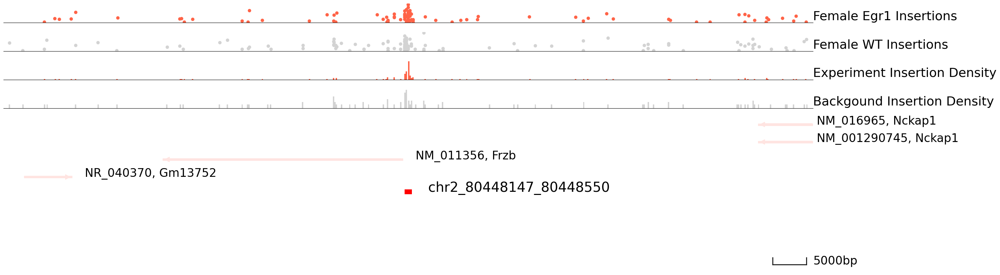

In [100]:

cc.pl.draw_area("chr2",80448147,80448550,60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr2",80448147,80448550,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


In [102]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,60000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,60000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.961405897789108, Track 1: 6.6715659263027804, Track 2: 23.1


In [106]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2",80448147,80448550,13000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_050726_Bias2_Frzb.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2",80448147,80448550,13000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 7)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_050726_Bias2_Frzb.pdf', bbox_inches='tight')
plt.close()

/tmp/ipykernel_1608947/1154249598.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_1608947/1154249598.py:35: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


# Also include a shared region

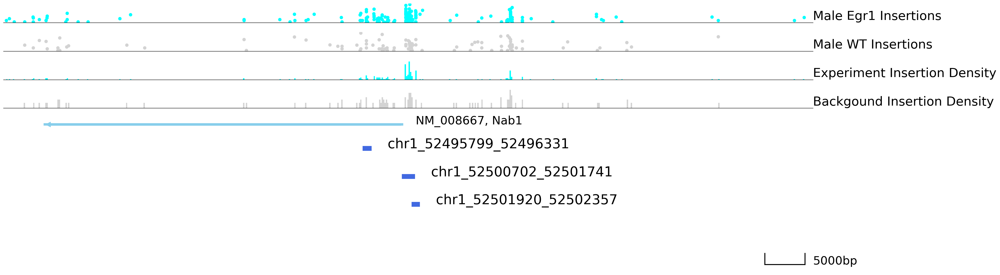

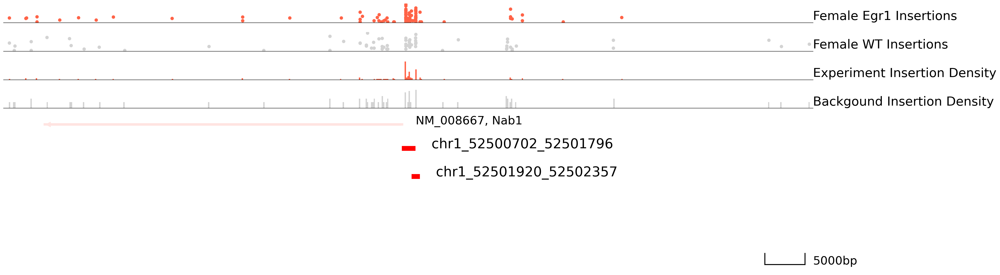

In [16]:

cc.pl.draw_area("chr1",52500702,52501741,50000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr1",52500702,52501741,50000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


In [17]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr1",52500702,52501741,50000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr1",52500702,52501741,50000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.213222514988525, Track 1: 5.922332071502069, Track 2: 27.3


In [30]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr1",52500702,52501741,50000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
for ax in axes:                                    # NEW: move axes left, narrow them
    pos = ax.get_position()
    ax.set_position([0.05, pos.y0, 0.82, pos.height])
plt.savefig('Male_Egr1_WT_tracks_050726_Shared_Nab1.pdf')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr1",52500702,52501741,50000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 7)
axes[2].set_ylim(0, shared_2)
for ax in axes:                                    # NEW: same adjustment on female
    pos = ax.get_position()
    ax.set_position([0.05, pos.y0, 0.82, pos.height])
plt.savefig('Female_Egr1_WT_tracks_050726_Shared_Nab1.pdf')
plt.close()

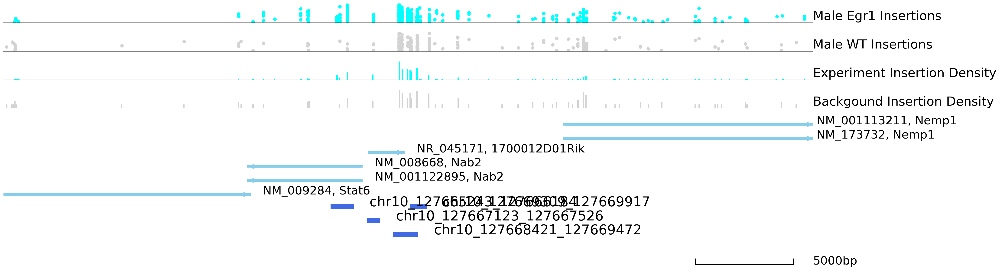

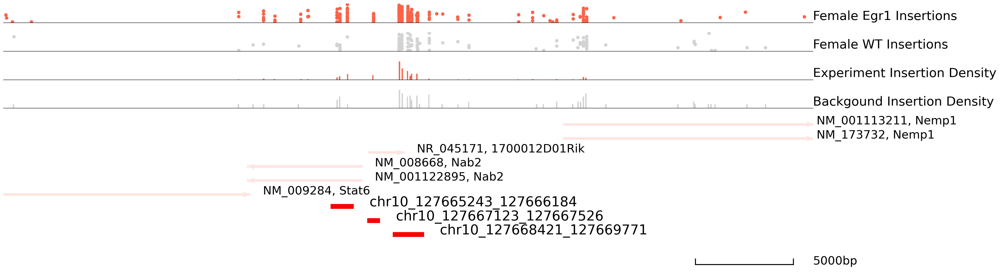

In [15]:
cc.pl.draw_area("chr10",127668421,127669771,20000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr10",127668421,127669771,20000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


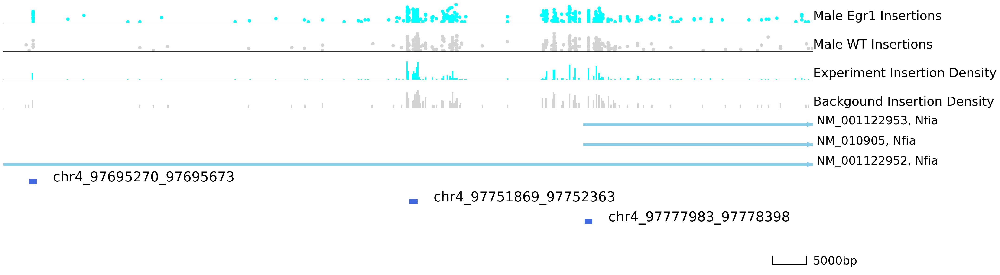

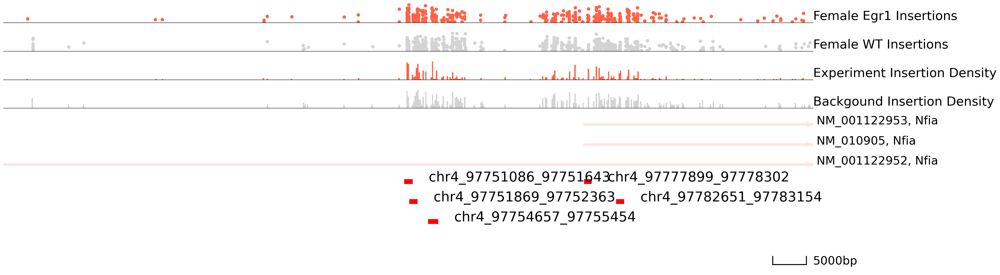

In [11]:
cc.pl.draw_area("chr4",97751086,97751643,60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_Zic4.pdf')
cc.pl.draw_area("chr4",97751086,97751643,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000)#, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_Zic4.pdf')


# Now, finish heatmaps for the old and new peaks (090925) and determine if I should keep the original one, or change it to the more strict p values (the new analysis).

In [7]:
peak_annotation_Male_20000

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,593.584886,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,4.625315e-04,0.000020,...,963.139907,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,1245.958982,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,273.774581,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
4,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,2.387176e-03,0.000006,...,360.510528,0.000000e+00,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9451,chrX,168944372,168944775,168944572.0,5,1,4,7.326049e-07,6.003941e-04,0.000002,...,187.038634,3.636063e-04,NM_009707,Arhgap6,+,0,NR_109847,Arhgap6,+,91836
9452,chrX,169123341,169123744,169123541.0,6,2,1,2.834252e-10,2.803652e-03,0.000003,...,182.516387,2.224345e-07,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,52370
9453,chrX,169795043,169795446,169795243.0,10,2,2,4.740652e-14,6.927041e-05,0.000005,...,374.077268,5.457933e-11,NM_010797,Mid1,+,0,NR_003635,4933400A11Rik,-,-15409
9454,chrX,169881476,169881879,169881676.0,15,8,2,0.000000e+00,1.901379e-02,0.000007,...,299.053566,0.000000e+00,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164


# Heatmaps look the same, so just keep the original one.
# Let's run motif enrichment analysis on the sex-specific peaks.

#### A) Combine M and F peaks, and plot top motifs that are sex-specific¶

In [18]:
# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.743755e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.312868e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,...,90.893664,1.695793e-04,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,...,412.207509,2.482385e-07,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.557115e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.377614e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.157978e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385


In [19]:
import pybedtools
peak = cc.rd.combine_qbed([peak_data_Male, peak_data_Female])
peak = pybedtools.BedTool.from_dataframe(peak).merge().to_dataframe()
peak_data = peak.rename(columns={"chrom":"Chr", "start":"Start", "end":"End"})
peak_annotation = cc.pp.annotation(peak_data, reference = "mm10")
peak_annotation = cc.pp.combine_annotation(peak_data, peak_annotation)
peak_annotation

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4857269,4857866,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859513,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4859557,4860097,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
4,chr1,4916025,4916592,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
...,...,...,...,...,...,...,...,...,...,...,...
19799,chrY,1010650,1011053,NM_012011,Eif2s3y,+,0,NR_027507,Tspy-ps,-,44711
19800,chrY,4389185,4389754,NM_001166384,Rbmy,+,-605915,NM_001166384,Rbmy,-,-979019
19801,chrY,4390332,4390889,NM_001166384,Rbmy,+,-607062,NM_001166384,Rbmy,-,-980166
19802,chrY,42511500,42512135,NR_038299,Gm20871,+,418188,NR_038299,Gm20871,+,1440037


In [20]:
Egr1 = cc.rd.combine_qbed([Male_Egr1, Female_Egr1])
Egr1

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3042835,3042839,1,+,TCGTG/GCTACATGTG/CTGA,Male_Egr1
1,chr1,3045362,3045366,1,+,TCGTG/GCTACATGTG/ACAC,Male_Egr1
2,chr1,3046027,3046031,2,-,TCGTG/CACAGCGCGT/CTGA,Female_Egr1
3,chr1,3052537,3052541,1,+,TCGTG/ATACTCTAGG/GTCA,Male_Egr1
4,chr1,3055563,3055567,4,+,TCGTG/GTTATCGGAT/TCGA,Female_Egr1
...,...,...,...,...,...,...,...
3266333,chrY_JH584300_random,29071,29075,2,-,TCGTG/ATACTCTAGG/TTGG,Male_Egr1
3266334,chrY_JH584300_random,29071,29075,1,-,TCGTG/GACTTAATAC/CATG,Female_Egr1
3266335,chrY_JH584303_random,14934,14938,1,+,TCGTG/ATACTCTAGG/TCGA,Male_Egr1
3266336,chrY_JH584303_random,35487,35491,1,-,TCGTG/GACTTAATAC/CTGA,Female_Egr1


100%|██████████| 2/2 [01:18<00:00, 39.38s/it]


     Chr      Start        End  logfoldchanges       pvalues   pvalues_adj  \
0   chr4   88955203   88957354        2.288249  2.567309e-22  7.263285e-19   
1   chr2  138362212  138363307        3.664047  2.221598e-13  2.933102e-10   
2  chr10  119169106  119170026        3.960227  3.156316e-13  3.906730e-10   
3  chr11  103264051  103264610        2.873806  2.637162e-12  3.072139e-09   
4  chr16   77479518   77481038        2.575253  3.325982e-11  2.533375e-08   

   number  number_rest   total  total_rest      group  
0     214           30  285785      196715  Male_Egr1  
1      77            4  285785      196715  Male_Egr1  
2      72            3  285785      196715  Male_Egr1  
3      87            8  285785      196715  Male_Egr1  
4      88           10  285785      196715  Male_Egr1  
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


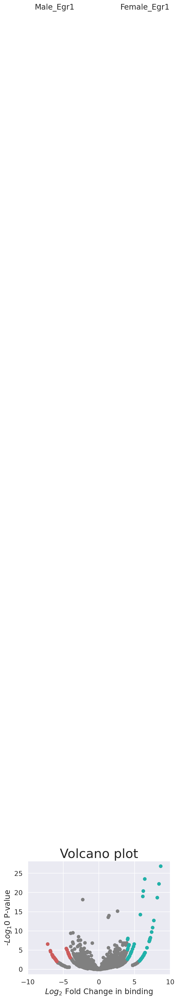

In [21]:
import pybedtools
from pycallingcards.tools import rank_peak_groups_df
cc.tl.rank_peak_groups(adata_cc, 'Index', method = 'fisher_exact', key_added = 'fisher_exact')
df = rank_peak_groups_df(
    adata_cc,
    key='fisher_exact',       # ← must match key_added above
    group=None,               # or a specific group like group='GroupA'
    pval_cutoff=0.05,         # optional
    logfc_min=0.5             # optional
)
df
# Split the 'names' column into Chromosome, Start, and End
df[['Chr', 'Start', 'End']] = df['names'].str.split('_', expand=True)

# Optionally, reorder columns
df = df[['Chr', 'Start', 'End'] + [col for col in df.columns if col not in ['names', 'Chr', 'Start', 'End']]]

# View updated DataFrame
print(df.head())
# Save to temporary file
df.to_csv("MvsF_fisher_calledSeparately_w300_p05_TTAA001.bed", sep="\t", header=False, index=False)

# Sort it using bedtools (matches reference order)
df_bed = pybedtools.BedTool("MvsF_fisher_calledSeparately_w300_p05_TTAA001.bed").sort()

# Pass sorted BEDTool directly
df_annotation = cc.pp.annotation(peaks_path=df_bed.fn, reference="mm10")
df_annotation

# Create a unique peak identifier to match both DataFrames
df['peak_id'] = df['Chr'].astype(str) + "_" + df['Start'].astype(str) + "_" + df['End'].astype(str)
df_annotation['peak_id'] = df_annotation['Chr'].astype(str) + "_" + df_annotation['Start'].astype(str) + "_" + df_annotation['End'].astype(str)

# Create a mapping from peak_id to sort order based on df_annotation
sort_order = {peak: i for i, peak in enumerate(df_annotation['peak_id'])}

# Add sort order to df
df['sort_order'] = df['peak_id'].map(sort_order)

# Drop unmatched peaks if any, then sort
df_sorted = df.dropna(subset=['sort_order']).sort_values(by='sort_order').drop(columns=['sort_order', 'peak_id'])

# Optional: reset index
df_sorted = df_sorted.reset_index(drop=True)

for col in ['Chr', 'Start', 'End']:
    df_sorted[col] = df_sorted[col].astype(str)
    df_annotation[col] = df_annotation[col].astype(str)
# Now you can safely combine them

df_annotation_combined = cc.pp.combine_annotation(df_sorted, df_annotation)
df_annotation_combined.to_csv("MvsF_fisher_calledSeparately_w300_p05_TTAA001_Fishers_annotated.txt", sep="\t", index=False, header = True)
cc.pl.volcano_plot(adata_cc, pvalue_name = 'pvalues_adj', pvalue_cutoff = 0.01, lfc_cutoff = 4,
                   figsize = (5,4), labelright = (3,250), labelleft = (-9,250))

In [15]:
adata_cc.obs

""
Index
Male_Egr1
Female_Egr1


In [16]:
print(df[['group', 'logfoldchanges', 'pvalues_adj']].head())

       group  logfoldchanges   pvalues_adj
0  Male_Egr1        2.288249  7.263285e-19
1  Male_Egr1        3.664047  2.933102e-10
2  Male_Egr1        3.960227  3.906730e-10
3  Male_Egr1        2.873806  3.072139e-09
4  Male_Egr1        2.575253  2.533375e-08


In [24]:
# Select rows where group == "Egr1KD_gRNA2_Female"
male_subset = df_annotation_combined[df_annotation_combined["group"] == "Male_Egr1"]
female_subset = df_annotation_combined[df_annotation_combined["group"] == "Female_Egr1"]
female_subset


,Chr,Start,End,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,group,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2,peak_id
0,chr1,4858460,4859513,0.874490,0.001389,0.026747,62,49,196715,285785,Female_Egr1,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726,chr1_4858460_4859513
1,chr1,4859557,4860097,3.784595,0.000171,0.006896,12,1,196715,285785,Female_Egr1,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823,chr1_4859557_4860097
2,chr1,6274010,6274413,4.723421,0.011264,0.088426,5,0,196715,285785,Female_Egr1,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918,chr1_6274010_6274413
3,chr1,6282928,6283331,1.049130,0.022832,0.131957,23,16,196715,285785,Female_Egr1,NM_009826,Rb1cc1,+,-6825,NM_001195732,Alkal1,+,76000,chr1_6282928_6283331
4,chr1,6305286,6306216,1.056355,0.005734,0.060886,36,25,196715,285785,Female_Egr1,NM_009826,Rb1cc1,+,-29183,NM_001195732,Alkal1,+,53115,chr1_6305286_6306216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4931,chrX,166972767,166973170,2.553774,0.044622,0.189627,5,1,196715,285785,Female_Egr1,NM_001101606,Gm8817,-,90279,NM_021278,Tmsb4x,-,233924,chrX_166972767_166973170
4935,chrX,169095314,169095969,2.553774,0.044622,0.189627,5,1,196715,285785,Female_Egr1,NM_009707,Arhgap6,+,0,NM_001287530,Arhgap6,+,16909,chrX_169095314_169095969
4936,chrX,169112705,169113108,2.553774,0.044622,0.189627,5,1,196715,285785,Female_Egr1,NM_009707,Arhgap6,+,0,NM_001081978,Amelx,-,63006,chrX_169112705_169113108
4937,chrX,169861134,169861537,2.381179,0.019334,0.123562,8,2,196715,285785,Female_Egr1,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082,chrX_169861134_169861537


In [25]:
male_subset

,Chr,Start,End,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,group,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2,peak_id
11,chr1,10943202,10943827,2.415776,0.000023,0.001614,40,5,285785,196715,Male_Egr1,NM_029525,Prex2,+,49638,NR_030645,Mir467e,-,-77329,chr1_10943202_10943827
21,chr1,17164489,17164994,4.857636,0.024781,0.134885,8,0,285785,196715,Male_Egr1,NM_010267,Gdap1,+,-220,NM_020604,Jph1,-,-66601,chr1_17164489_17164994
22,chr1,17451239,17451642,4.857636,0.024781,0.134885,8,0,285785,196715,Male_Egr1,NM_053191,Pi15,+,150259,NR_130314,Gm16070,-,224385,chr1_17451239_17451642
23,chr1,17600399,17600802,5.022022,0.013351,0.096282,9,0,285785,196715,Male_Egr1,NM_053191,Pi15,+,1099,NR_130314,Gm16070,-,75225,chr1_17600399_17600802
24,chr1,17601256,17601765,4.672082,0.046485,0.189627,7,0,285785,196715,Male_Egr1,NM_053191,Pi15,+,136,NR_130314,Gm16070,-,74262,chr1_17601256_17601765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4930,chrX,164379844,164380485,3.544494,0.000463,0.013338,20,1,285785,196715,Male_Egr1,NM_010216,Vegfd,+,0,NM_027153,Pir,+,-6832,chrX_164379844_164380485
4932,chrX,167091544,167092043,1.993956,0.003517,0.048399,24,4,285785,196715,Male_Egr1,NM_001101606,Gm8817,-,-21175,NM_021278,Tmsb4x,-,115051,chrX_167091544_167092043
4933,chrX,167209494,167210372,1.240056,0.004622,0.053308,45,13,285785,196715,Male_Egr1,NM_021278,Tmsb4x,-,-277,NM_001313760,Tlr8,-,30751,chrX_167209494_167210372
4934,chrX,167319256,167319772,2.933909,0.011616,0.089338,13,1,285785,196715,Male_Egr1,NM_133211,Tlr7,-,0,NM_001313758,Prps2,-,26548,chrX_167319256_167319772


# VENN DIAGRAMS AS BEFORE:
## code from: Goal: Make Figure 5 for Egr1 paper: Egr1 binds differently in Males and Females.ipynb jupyterlab notebook.

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


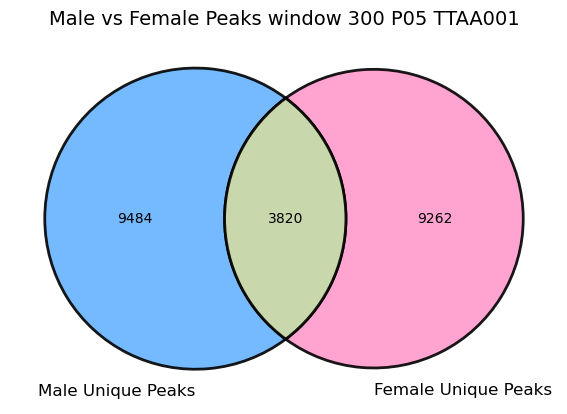

In [26]:
import pandas as pd
import pyranges as pr

# Rename column names to match PyRanges requirements
peak_data_Male.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Male_gr = pr.PyRanges(peak_data_Male)

# Rename column names to match PyRanges requirements
peak_data_Female.rename(columns={"Chr": "Chromosome"}, inplace=True)
# Convert to PyRanges object
peak_data_Female_gr = pr.PyRanges(peak_data_Female)

# Find overlaps
common = peak_data_Male_gr.intersect(peak_data_Female_gr)
common

# Convert your PyRanges object to DataFrame
common_df = common.df
# Make sure it has the correct columns in the right order
common_df = common_df[['Chromosome', 'Start', 'End']]  # rename if necessary
common_df.columns = ['chrom', 'start', 'end']
# Save to temporary file
common_df.to_csv("common_peaks_unsorted.bed", sep="\t", header=False, index=False)
# Sort it using bedtools (matches reference order)
sorted_common_bed = pybedtools.BedTool("common_peaks_unsorted.bed").sort()
# Pass sorted BEDTool directly
peak_annotation_common = cc.pp.annotation(peaks_path=sorted_common_bed.fn, reference="mm10")

#peak_annotation_common.to_csv("shared_peaks_malefemale_calledSeparately_annotated.txt", sep="\t", index=False, header=True)
peak_annotation_common.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False, header=True)

unique_peaks1 = peak_data_Male_gr.subtract(peak_data_Female_gr)
unique_peaks1
unique_peaks2 = peak_data_Female_gr.subtract(peak_data_Male_gr)
unique_peaks2

import pyranges as pr
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

# Assuming peaks1 and peaks2 are PyRanges objects
# For example:
# peaks1 = pr.read("male_peaks.bed")
# peaks2 = pr.read("female_peaks.bed")

# Count the number of intervals
size_common = len(common)
size_unique_peaks1 = len(unique_peaks1)
size_unique_peaks2 = len(unique_peaks2)

# Save the unique peaks as text or CSV files
unique_peaks1_df = unique_peaks1.df  # Convert PyRanges object to a DataFrame
unique_peaks2_df = unique_peaks2.df  # Convert PyRanges object to a DataFrame
common_df = common.df # Convert PyRanges object to a DataFrame

# Save as text files (you can change this to CSV if needed)
unique_peaks1_df.to_csv("unique_peaks_male_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)
unique_peaks2_df.to_csv("unique_peaks_female_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)
common_df.to_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t", index=False)

# Create figure
plt.figure(figsize=(6, 6))
# Create the Venn diagram
venn = venn2(
    subsets=(size_unique_peaks1, size_unique_peaks2, size_common),
    set_labels=('Male Unique Peaks', 'Female Unique Peaks')
)
colors = {
    '10': '#66b3ff',  # light blue
    '01': '#ff99cc',  # light pink
    '11': '#c3d3a3'   # neutral gray for the intersection
}
# Style each section
for subset_id in ['10', '01', '11']:
    patch = venn.get_patch_by_id(subset_id)
    if patch:
        patch.set_color(colors[subset_id])
        patch.set_edgecolor('black')
        patch.set_linewidth(2)
        patch.set_alpha(0.9)  # make slightly more opaque for punchier colors

# Add title and show plot
plt.title('Male vs Female Peaks window 300 P05 TTAA001', fontsize=14)
plt.tight_layout()
plt.savefig('Male_vs_Female_W300_P05_TTAA001_annotated_091725_PeakIntersection.jpeg', format='jpeg', dpi=300)
plt.show()

In [27]:
unique_peaks1_df

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,1484.596829,8.910119e-06,891.011943,593.584886,0.000000e+00
1,chr1,4859024,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,2346.620794,1.100662e-05,1100.661812,1245.958982,0.000000e+00
2,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,431.011983,1.572374e-06,157.237402,273.774581,1.198626e-07
3,chr1,6281371,6281961,6281636.0,7,3,4,1.062140e-06,3.880421e-02,0.000003,335.231542,1.572374e-06,157.237402,177.994140,5.138162e-04
4,chr1,6305876,6306216,6305959.0,12,6,5,1.394584e-11,2.244018e-02,0.000006,574.682643,3.144748e-06,314.474803,260.207840,1.262629e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9479,chrY,1010650,1011053,1010850.0,6,0,4,1.737513e-08,1.818001e-11,0.000003,287.341322,0.000000e+00,0.000000,287.341322,1.087454e-05
9480,chrY,4389185,4389754,4389516.0,5,4,17,4.358508e-08,4.730544e-02,0.000002,239.451101,2.096499e-06,209.649869,29.801232,2.588767e-05
9481,chrY,4390332,4390889,4390554.0,5,1,15,3.170588e-08,1.040715e-04,0.000002,239.451101,5.241247e-07,52.412467,187.038634,1.917295e-05
9482,chrY,42511500,42512135,42511800.5,6,1,9,8.117140e-11,2.004553e-05,0.000003,287.341322,5.241247e-07,52.412467,234.928854,6.789101e-08


In [28]:
unique_peaks2_df

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,2.070923e-02,0.000010,1018.477732,0.000005,533.555292,484.922440,4.743755e-11
1,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,4.037573e-02,0.000004,424.365722,0.000003,333.472058,90.893664,1.695793e-04
2,chr1,6282928,6283331,6283128.0,23,33,3,0.000000e+00,3.177280e-02,0.000020,1952.082320,0.000022,2200.915581,-248.833261,0.000000e+00
3,chr1,6305286,6305705,6305637.0,31,37,11,0.000000e+00,1.321674e-03,0.000026,2631.067475,0.000025,2467.693227,163.374248,0.000000e+00
4,chr1,6312492,6312969,6312766.0,12,16,2,9.992007e-16,4.983013e-02,0.000010,1018.477732,0.000011,1067.110585,-48.632852,1.394558e-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9257,chrX,169396222,169396672,169396422.0,5,0,2,5.296706e-08,1.274899e-09,0.000004,424.365722,0.000000,0.000000,424.365722,3.165906e-05
9258,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,7.184145e-04,0.000007,678.985155,0.000003,266.777646,412.207509,2.482385e-07
9259,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,3.298981e-02,0.000008,848.731444,0.000007,666.944115,181.787328,1.377614e-07
9260,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,2.384857e-02,0.000010,1018.477732,0.000008,800.332939,218.144794,5.157978e-10


In [29]:
common_df

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,0.000463,0.000020,2011.389252,1.048249e-05,1048.249345,963.139907,0.000000e+00
1,chr1,4858460,4859024,4858781.0,49,21,11,0.000000e+00,0.000019,0.000023,2346.620794,1.100662e-05,1100.661812,1245.958982,0.000000e+00
2,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,0.002387,0.000006,622.572864,2.620623e-06,262.062336,360.510528,0.000000e+00
3,chr1,6286893,6287296,6287093.0,7,2,2,1.565760e-08,0.005862,0.000003,335.231542,1.048249e-06,104.824934,230.406608,9.869091e-06
4,chr1,6305705,6305876,6305959.0,12,6,5,1.394584e-11,0.022440,0.000006,574.682643,3.144748e-06,314.474803,260.207840,1.262629e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3815,chrX,166328810,166329228,166329010.0,15,4,2,0.000000e+00,0.000004,0.000007,718.353304,2.096499e-06,209.649869,508.703435,0.000000e+00
3816,chrX,166478612,166479015,166478812.0,6,2,1,7.406392e-08,0.005183,0.000003,287.341322,1.048249e-06,104.824934,182.516387,4.253285e-05
3817,chrX,166504333,166504736,166504533.0,15,5,2,0.000000e+00,0.000063,0.000007,718.353304,2.620623e-06,262.062336,456.290968,0.000000e+00
3818,chrX,167209969,167210027,167210169.0,6,1,1,2.660443e-08,0.000968,0.000003,287.341322,5.241247e-07,52.412467,234.928854,1.624312e-05


In [30]:
cc.tl.call_motif(peaks_frame = unique_peaks1_df, reference = "mm10", save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_091725",
                 homer_path = "/home/ihreiss/homer/bin/", num_cores=12)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_MaleUnique_091725
	Fragment size set to 1000
	Using 12 CPUs
	Will not run homer for de novo motifs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9484
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9484
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /home/ihreiss/homer//data/genomes/mm10//

	Extracting sequences from directory: /home/ihreiss/homer//data/genomes/mm10//
	Extracting 692 sequences from chr1
	Extracting 699 sequences from chr2
	Extracting 600 sequences from chr3
	Extracting 497 sequences fro

Finished!


		153 of 440 (1e-3) STAT1(Stat)/HelaS3-STAT1-ChIP-Seq(GSE12782)/Homer
		154 of 440 (1e-3) RFX(HTH)/K562-RFX3-ChIP-Seq(SRA012198)/Homer
		155 of 440 (1e-3) ELF5(ETS)/T47D-ELF5-ChIP-Seq(GSE30407)/Homer
		156 of 440 (1e-3) HIC1(Zf)/Treg-ZBTB29-ChIP-Seq(GSE99889)/Homer
		157 of 440 (1e-3) CArG(MADS)/PUER-Srf-ChIP-Seq(Sullivan_et_al.)/Homer
		158 of 440 (1e-3) EHF(ETS)/LoVo-EHF-ChIP-Seq(GSE49402)/Homer
		159 of 440 (1e-3) AP-2gamma(AP2)/MCF7-TFAP2C-ChIP-Seq(GSE21234)/Homer
		160 of 440 (1e-3) Foxh1(Forkhead)/hESC-FOXH1-ChIP-Seq(GSE29422)/Homer
		161 of 440 (1e-3) Foxo3(Forkhead)/U2OS-Foxo3-ChIP-Seq(E-MTAB-2701)/Homer
		162 of 440 (1e-3) Zfp809(Zf)/ES-Zfp809-ChIP-Seq(GSE70799)/Homer
		163 of 440 (1e-3) CRX(Homeobox)/Retina-Crx-ChIP-Seq(GSE20012)/Homer
		164 of 440 (1e-3) p53(p53)/Saos-p53-ChIP-Seq(GSE15780)/Homer
		165 of 440 (1e-3) p53(p53)/Saos-p53-ChIP-Seq/Homer
		166 of 440 (1e-3) EBF1(EBF)/Near-E2A-ChIP-Seq(GSE21512)/Homer
		167 of 440 (1e-3) ELF3(ETS)/PDAC-ELF3-ChIP-Seq(GSE64557)/Homer

In [31]:
cc.tl.call_motif(peaks_frame = unique_peaks2_df, reference = "mm10", save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_FemaleUnique_091725",
                 homer_path = "/home/ihreiss/homer/bin/", num_cores=12)

There is no save_name, it will save to temp_Homer_trial.bed and then delete.



	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_FemaleUnique_091725
	Fragment size set to 1000
	Using 12 CPUs
	Will not run homer for de novo motifs
	Found mset for "mouse", will check against vertebrates motifs
	Peak/BED file conversion summary:
		BED/Header formatted lines: 9262
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 9262
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /home/ihreiss/homer//data/genomes/mm10//

	Extracting sequences from directory: /home/ihreiss/homer//data/genomes/mm10//
	Extracting 642 sequences from chr1
	Extracting 869 sequences from chr2
	Extracting 521 sequences from chr3
	Extracting 572 sequences f

Finished!


		190 of 440 (1e-2) ZNF7(Zf)/HepG2-ZNF7.Flag-ChIP-Seq(Encode)/Homer
		191 of 440 (1e-2) E2F7(E2F)/Hela-E2F7-ChIP-Seq(GSE32673)/Homer
		192 of 440 (1e-2) PBX1(Homeobox)/MCF7-PBX1-ChIP-Seq(GSE28007)/Homer
		193 of 440 (1e-2) X-box(HTH)/NPC-H3K4me1-ChIP-Seq(GSE16256)/Homer
		194 of 440 (1e-2) Sox21(HMG)/ESC-SOX21-ChIP-Seq(GSE110505)/Homer
		195 of 440 (1e-2) MYNN(Zf)/HEK293-MYNN.eGFP-ChIP-Seq(Encode)/Homer
		196 of 440 (1e-2) HIC1(Zf)/Treg-ZBTB29-ChIP-Seq(GSE99889)/Homer
		197 of 440 (1e-2) MyoD(bHLH)/Myotube-MyoD-ChIP-Seq(GSE21614)/Homer
		198 of 440 (1e-2) Bapx1(Homeobox)/VertebralCol-Bapx1-ChIP-Seq(GSE36672)/Homer
		199 of 440 (1e-2) Znf263(Zf)/K562-Znf263-ChIP-Seq(GSE31477)/Homer
		200 of 440 (1e-2) Usf2(bHLH)/C2C12-Usf2-ChIP-Seq(GSE36030)/Homer
		201 of 440 (1e-2) Six1(Homeobox)/Myoblast-Six1-ChIP-Chip(GSE20150)/Homer
		202 of 440 (1e-2) Hoxc9(Homeobox)/Ainv15-Hoxc9-ChIP-Seq(GSE21812)/Homer
		203 of 440 (1e-2) HNF1b(Homeobox)/PDAC-HNF1B-ChIP-Seq(GSE64557)/Homer
		204 of 440 (1e-2) CR

In [32]:
cc.tl.call_motif(peaks_frame = common_df, reference = "mm10", save_homer = "Homer/GBM_Peaks_Egr1_CalledSeparately_SharedMandF_091725",
                 homer_path = "/home/ihreiss/homer/bin/", num_cores=12)


	Position file = temp_Homer_trial.bed
	Genome = mm10
	Output Directory = Homer/GBM_Peaks_Egr1_CalledSeparately_SharedMandF_091725
	Fragment size set to 1000
	Using 12 CPUs
	Will not run homer for de novo motifs
	Found mset for "mouse", will check against vertebrates motifs


There is no save_name, it will save to temp_Homer_trial.bed and then delete.


	Peak/BED file conversion summary:
		BED/Header formatted lines: 3820
		peakfile formatted lines: 0

	Peak File Statistics:
		Total Peaks: 3820
		Redundant Peak IDs: 0
		Peaks lacking information: 0 (need at least 5 columns per peak)
		Peaks with misformatted coordinates: 0 (should be integer)
		Peaks with misformatted strand: 0 (should be either +/- or 0/1)

	Peak file looks good!

	Background files for 1000 bp fragments found.
	Custom genome sequence directory: /home/ihreiss/homer//data/genomes/mm10//

	Extracting sequences from directory: /home/ihreiss/homer//data/genomes/mm10//
	Extracting 234 sequences from chr1
	Extracting 300 sequences from chr2
	Extracting 252 sequences from chr3
	Extracting 232 sequences from chr4
	Extracting 223 sequences from chr5
	Extracting 183 sequences from chr6
	Extracting 207 sequences from chr7
	Extracting 174 sequences from chr8
	Extracting 210 sequences from chr9
	Extracting 207 sequences from chr10
	Extracting 225 sequences from chr11
	Extracting 1

Finished!


	Skipping...
	Job finished - if results look good, please send beer to ..

	Cleaning up tmp files...



# 091925 - Meeting with Rob + Josh 

## do overlap with intersection + union of gRNA2 and gRNA3 DE lists.

In [5]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
# Keep only peaks whose nearest gene is within 20kb
peak_annotation_Male_20000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Male_100000 = peak_annotation_Male[peak_annotation_Male['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Male_20000.to_csv("Male_Egr1CC_peaks_20kbThreshhold_091125.txt", sep="\t", index=False, header=True)
#peak_annotation_Male_100000.to_csv("Male_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
peak_annotation_Female_20000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 20000].reset_index(drop=True)
#peak_annotation_Female_100000 = peak_annotation_Female[peak_annotation_Female['Distance1'].abs() <= 100000].reset_index(drop=True)
peak_annotation_Female_20000.to_csv("Female_Egr1CC_peaks_20kbThreshhold_091125.txt", sep="\t", index=False, header=True)
#peak_annotation_Female_100000.to_csv("Female_Egr1CC_peaks_100kbThreshhold_090825.txt", sep="\t", index=False, header=True)



In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


# Compare to gRNA3 data

In [ ]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))


set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Egr1g3vsNeg1.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of WHaoverlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

042626

In [18]:
import pandas as pd

# Concatenate Male groups
Male_combined = pd.concat([Male_Egr1, Male_WT], ignore_index=True)

# Concatenate Female groups  
Female_combined = pd.concat([Female_Egr1, Female_WT], ignore_index=True)

peak = cc.rd.combine_qbed([peak_annotation_Male_20000, peak_annotation_Female_20000])
peak = pybedtools.BedTool.from_dataframe(peak).merge().to_dataframe() 
peak_data = peak.rename(columns={"chrom":"Chr", "start":"Start", "end":"End"})
peak_annotation = cc.pp.annotation(peak_data, reference = "mm10")
peak_annotation = cc.pp.combine_annotation(peak_data, peak_annotation)
peak_annotation
# Make AnnData with all 4 groups (group labels are already set in the 'group' column)
all_data = pd.concat([Male_Egr1, Male_WT, Female_Egr1, Female_WT], ignore_index=True)

adata_cc = cc.pp.make_Anndata(
    all_data,
    peak_annotation,
    ["Male_Egr1", "Male_WT", "Female_Egr1", "Female_WT"],
    key='group'
)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


100%|██████████| 21/21 [00:15<00:00,  1.33it/s]


In [20]:
# Check what columns are available
print(adata_cc.obs.columns.tolist())
print(adata_cc.obs.head())

[]
Empty DataFrame
Columns: []
Index: [Male_Egr1, Male_WT, Female_Egr1, Female_WT]


In [22]:
# Run fisher exact for Male comparison
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact', 
                        groups=['Male_Egr1'], reference='Male_WT',
                        key_added='fisher_male')

df_male = rank_peak_groups_df(
    adata_cc,
    key='fisher_male',
    group=['Male_Egr1'],
    pval_cutoff=0.05,
    logfc_min=0.5  # positive = enriched in Male_Egr1
)


100%|██████████| 1/1 [00:48<00:00, 48.45s/it]


In [23]:
df_male

,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest
0,chr18_34862834_34863617,8.974394,1.246585e-23,1.966113e-19,116,0,231079,133640
1,chr12_98577891_98578389,7.292698,8.491820e-08,1.339330e-04,36,0,231079,133640
2,chr15_57906072_57906806,2.213552,1.140816e-06,8.996474e-04,65,8,231079,133640
3,chr12_111705144_111705547,6.932754,3.882774e-06,2.281247e-03,28,0,231079,133640
4,chr2_27540097_27540802,4.083464,6.370724e-06,3.139970e-03,33,1,231079,133640
...,...,...,...,...,...,...,...,...
509,chr13_34148539_34148942,1.387968,4.823980e-02,5.698618e-01,23,5,231079,133640
510,chr17_26714746_26715513,1.007662,4.511999e-02,5.698618e-01,35,10,231079,133640
511,chr14_63585951_63586673,0.790417,4.950167e-02,5.698618e-01,54,18,231079,133640
512,chr5_117355917_117356841,1.007662,4.511999e-02,5.698618e-01,35,10,231079,133640


In [24]:
df_male[['Chr', 'Start', 'End']] = df_male['names'].str.split('_', expand=True)
print(f"Peaks enriched in Male_Egr1 vs Male_WT: {len(df_male)}")
df_male.head()

Peaks enriched in Male_Egr1 vs Male_WT: 514


,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,Chr,Start,End
0,chr18_34862834_34863617,8.974394,1.246585e-23,1.966113e-19,116,0,231079,133640,chr18,34862834,34863617
1,chr12_98577891_98578389,7.292698,8.491820e-08,1.339330e-04,36,0,231079,133640,chr12,98577891,98578389
2,chr15_57906072_57906806,2.213552,1.140816e-06,8.996474e-04,65,8,231079,133640,chr15,57906072,57906806
3,chr12_111705144_111705547,6.932754,3.882774e-06,2.281247e-03,28,0,231079,133640,chr12,111705144,111705547
4,chr2_27540097_27540802,4.083464,6.370724e-06,3.139970e-03,33,1,231079,133640,chr2,27540097,27540802


In [25]:
df_male

,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,Chr,Start,End
0,chr18_34862834_34863617,8.974394,1.246585e-23,1.966113e-19,116,0,231079,133640,chr18,34862834,34863617
1,chr12_98577891_98578389,7.292698,8.491820e-08,1.339330e-04,36,0,231079,133640,chr12,98577891,98578389
2,chr15_57906072_57906806,2.213552,1.140816e-06,8.996474e-04,65,8,231079,133640,chr15,57906072,57906806
3,chr12_111705144_111705547,6.932754,3.882774e-06,2.281247e-03,28,0,231079,133640,chr12,111705144,111705547
4,chr2_27540097_27540802,4.083464,6.370724e-06,3.139970e-03,33,1,231079,133640,chr2,27540097,27540802
...,...,...,...,...,...,...,...,...,...,...,...
509,chr13_34148539_34148942,1.387968,4.823980e-02,5.698618e-01,23,5,231079,133640,chr13,34148539,34148942
510,chr17_26714746_26715513,1.007662,4.511999e-02,5.698618e-01,35,10,231079,133640,chr17,26714746,26715513
511,chr14_63585951_63586673,0.790417,4.950167e-02,5.698618e-01,54,18,231079,133640,chr14,63585951,63586673
512,chr5_117355917_117356841,1.007662,4.511999e-02,5.698618e-01,35,10,231079,133640,chr5,117355917,117356841


In [26]:
# Run fisher exact for Female comparison
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact',
                        groups=['Female_Egr1'], reference='Female_WT',
                        key_added='fisher_female')

df_female = rank_peak_groups_df(
    adata_cc,
    key='fisher_female',
    group=['Female_Egr1'],
    pval_cutoff=0.05,
    logfc_min=None  # don't filter by direction yet
)

df_female[['Chr', 'Start', 'End']] = df_female['names'].str.split('_', expand=True)

100%|██████████| 1/1 [00:46<00:00, 46.41s/it]


In [27]:
# Get the peak names enriched in Male
male_enriched_peaks = set(df_male['names'])

# From female results, keep peaks that:
# 1. appear in the male enriched set
# 2. have negative logfc (depleted/opposite direction in Female_Egr1 vs Female_WT)
df_opposite = df_female[
    (df_female['names'].isin(male_enriched_peaks)) &
    (df_female['logfoldchanges'] < 0)  # opposite direction
]

df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)
print(f"Peaks enriched in Male_Egr1 but depleted in Female_Egr1: {len(df_opposite)}")
df_opposite.head()

Peaks enriched in Male_Egr1 but depleted in Female_Egr1: 5


/tmp/ipykernel_1338267/158899045.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)


,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,Chr,Start,End
174,chr2_112437681_112438433,-1.234725,0.000367,0.033055,28,43,161782,105223,chr2,112437681,112438433
733,chr4_70505751_70506427,-1.120940,0.009713,0.207763,19,27,161782,105223,chr4,70505751,70506427
830,chr7_3291773_3292260,-1.598440,0.013377,0.263316,7,14,161782,105223,chr7,3291773,3292260
1368,chr2_65190448_65191117,-2.756236,0.038300,0.409257,1,5,161782,105223,chr2,65190448,65191117
1431,chr4_53515623_53516026,-2.756236,0.038300,0.409257,1,5,161782,105223,chr4,53515623,53516026


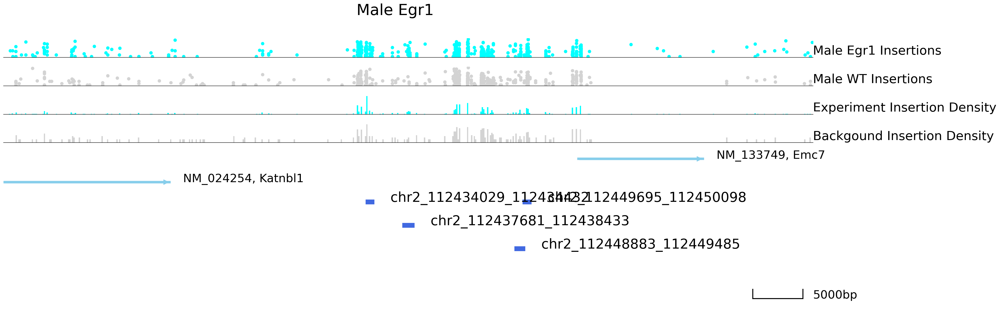

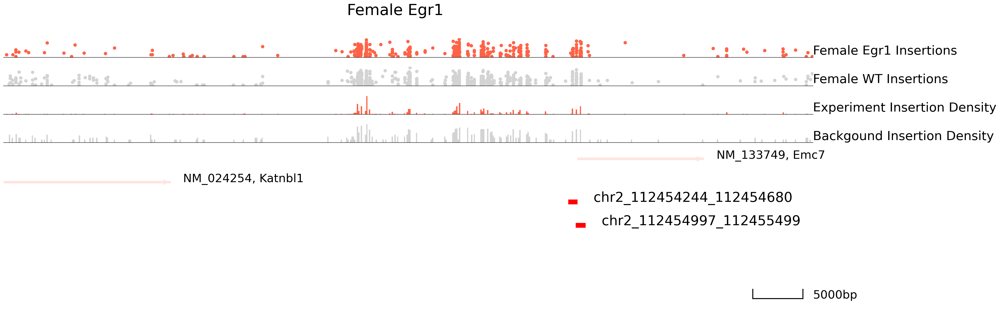

In [30]:
cc.pl.draw_area("chr2",112437681,112438433 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue", title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr2",112437681,112438433 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




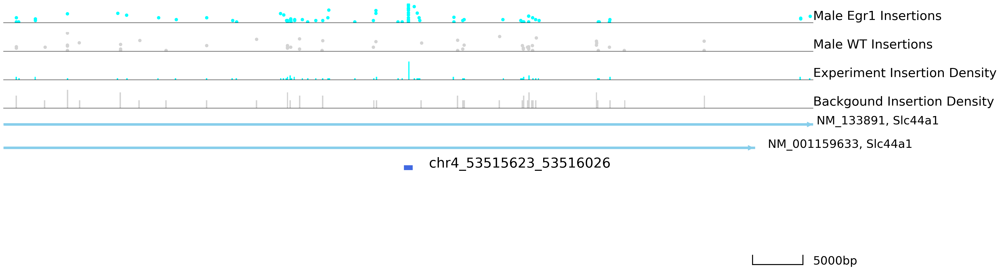

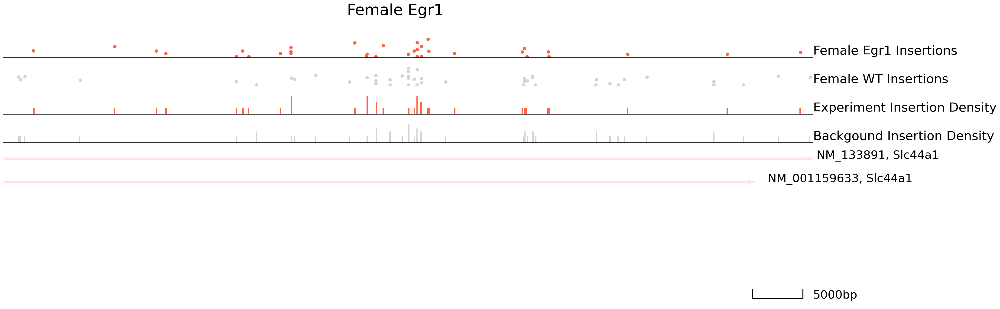

In [32]:
cc.pl.draw_area("chr4",53515623, 53516026 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr4",53515623, 53516026 ,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




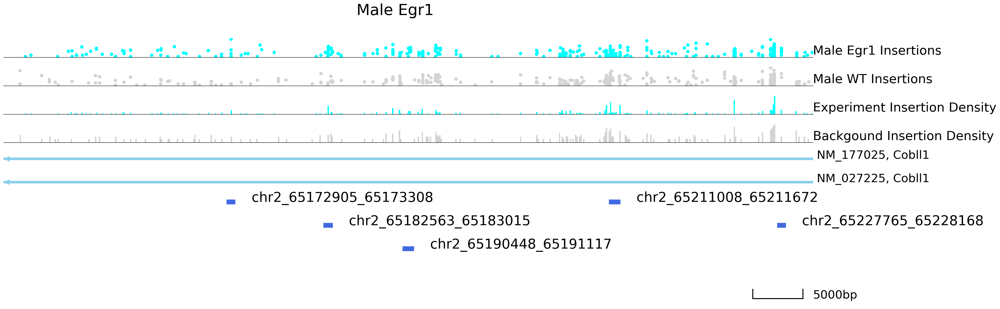

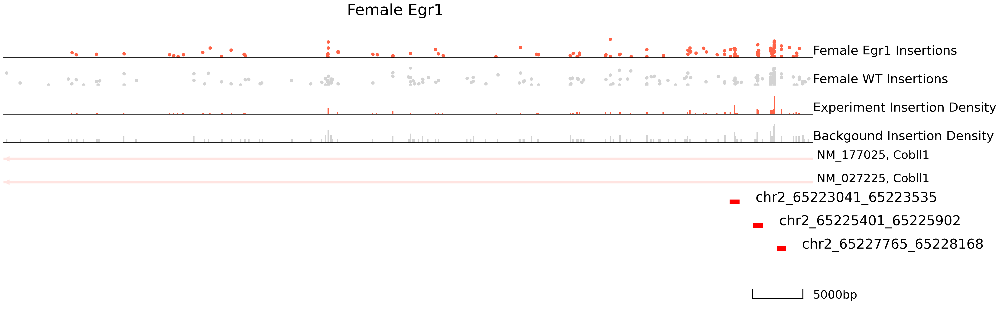

In [34]:
cc.pl.draw_area("chr2",65190448,65191117,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue", title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias2.pdf')
cc.pl.draw_area("chr2",65190448,65191117,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1", save = 'Female_Egr1_WT_tracks_MaleBias2.pdf')




Track 0: ylim = (0.4366522448137916, 6.079540831229172)
Track 1: ylim = (0.4033442930216767, 6.779007818863586)
Track 2: ylim = (0.0, 25.2)
Track 3: ylim = (0.0, 3.4210013649225504)
Track 4: ylim = (-4.3, 2.3)


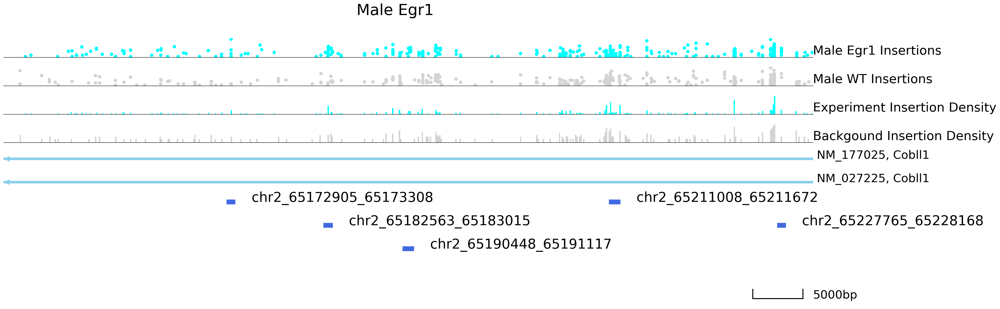

In [39]:
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2,
    name="Male_Egr1",
    key="Index",
    insertionkey="group",
    figsize=(30,10),
    plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3,
    bins=600,
    example_length=5000,
    color="blue",
    title="Male Egr1",
    save=False
)

axes = plt.gcf().get_axes()
for i, ax in enumerate(axes):
    print(f"Track {i}: ylim = {ax.get_ylim()}")

Track 0: ylim = (0.3574083234599626, 7.743663179659582)
Track 1: ylim = (0.4029657900786494, 6.786956380667158)
Track 2: ylim = (0.0, 17.85)
Track 3: ylim = (0.0, 3.3798196161116167)
Track 4: ylim = (-4.3, 2.3)


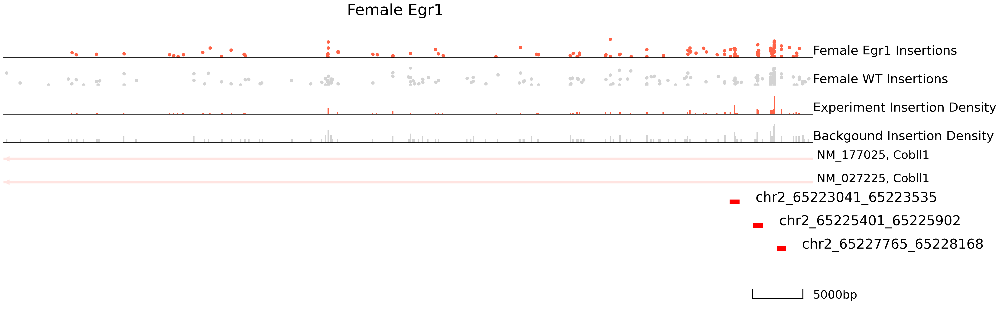

In [41]:
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2,
    name="Female_Egr1",
    key="Index",
    insertionkey="group",
    figsize=(30,10),
    plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3,
    bins=600,
    example_length=5000,
    #color="blue",
    title="Female Egr1",
    save=False
)

axes = plt.gcf().get_axes()
for i, ax in enumerate(axes):
    print(f"Track {i}: ylim = {ax.get_ylim()}")

In [42]:
# Save with same y max


In [94]:
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.743663179659582, Track 1: 6.786956380667158, Track 2: 25.2


In [95]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, shared_0)
axes[1].set_ylim(0, shared_1)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_MaleBias2.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2", 65190448, 65191117, 40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_MaleBias2.pdf', bbox_inches='tight')
plt.close()

In [46]:
# Now peaks enriched in females


In [50]:
# Step 1: Find peaks enriched in Female_Egr1 vs Female_WT
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact',
                        groups=['Female_Egr1'], reference='Female_WT',
                        key_added='fisher_female')

df_female = rank_peak_groups_df(
    adata_cc,
    key='fisher_female',
    group=['Female_Egr1'],
    pval_cutoff=0.05,
    logfc_min=0.5  # positive = enriched in Female_Egr1
)
df_female[['Chr', 'Start', 'End']] = df_female['names'].str.split('_', expand=True)
print(f"Peaks enriched in Female_Egr1 vs Female_WT: {len(df_female)}")

# Step 2: Run Male comparison without direction filter
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact',
                        groups=['Male_Egr1'], reference='Male_WT',
                        key_added='fisher_male')

df_male = rank_peak_groups_df(
    adata_cc,
    key='fisher_male',
    group=['Male_Egr1'],
    pval_cutoff=0.05,
    logfc_min=None  # don't filter by direction yet
)# Step 1: Find peaks enriched in Female_Egr1 vs Female_WT
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact',
                        groups=['Female_Egr1'], reference='Female_WT',
                        key_added='fisher_female')

df_female = rank_peak_groups_df(
    adata_cc,
    key='fisher_female',
    group=['Female_Egr1'],
    pval_cutoff=0.05,
    logfc_min=0.5  # positive = enriched in Female_Egr1
)
df_female[['Chr', 'Start', 'End']] = df_female['names'].str.split('_', expand=True)
print(f"Peaks enriched in Female_Egr1 vs Female_WT: {len(df_female)}")

# Step 2: Run Male comparison without direction filter
cc.tl.rank_peak_groups(adata_cc, 'Index', method='fisher_exact',
                        groups=['Male_Egr1'], reference='Male_WT',
                        key_added='fisher_male')

df_male = rank_peak_groups_df(
    adata_cc,
    key='fisher_male',
    group=['Male_Egr1'],
    pval_cutoff=0.05,
    logfc_min=None  # don't filter by direction yet
)
df_male[['Chr', 'Start', 'End']] = df_male['names'].str.split('_', expand=True)

# Step 3: Keep peaks enriched in Female_Egr1 but DEPLETED in Male_Egr1
female_enriched_peaks = set(df_female['names'])

df_opposite = df_male[
    (df_male['names'].isin(female_enriched_peaks)) &
    (df_male['logfoldchanges'] < 0)  # opposite direction in males
]
df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)
print(f"Peaks enriched in Female_Egr1 but depleted in Male_Egr1: {len(df_opposite)}")
df_opposite.head()
df_male[['Chr', 'Start', 'End']] = df_male['names'].str.split('_', expand=True)

# Step 3: Keep peaks enriched in Female_Egr1 but DEPLETED in Male_Egr1
female_enriched_peaks = set(df_female['names'])

df_opposite = df_male[
    (df_male['names'].isin(female_enriched_peaks)) &
    (df_male['logfoldchanges'] < 0)  # opposite direction in males
]
df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)
print(f"Peaks enriched in Female_Egr1 but depleted in Male_Egr1: {len(df_opposite)}")
df_opposite.head()

100%|██████████| 1/1 [00:46<00:00, 46.49s/it]


Peaks enriched in Female_Egr1 vs Female_WT: 729


100%|██████████| 1/1 [00:47<00:00, 47.35s/it]


Peaks enriched in Female_Egr1 vs Female_WT: 729


100%|██████████| 1/1 [00:48<00:00, 48.14s/it]
/tmp/ipykernel_1338267/847777185.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)
/tmp/ipykernel_1338267/847777185.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_opposite[['Chr', 'Start', 'End']] = df_opposite['names'].str.split('_', expand=True)


Peaks enriched in Female_Egr1 but depleted in Male_Egr1: 2
Peaks enriched in Female_Egr1 but depleted in Male_Egr1: 2


,names,logfoldchanges,pvalues,pvalues_adj,number,number_rest,total,total_rest,Chr,Start,End
404,chr16_22160763_22161767,-0.945792,0.006673,0.253591,34,38,231079,133640,chr16,22160763,22161767
1179,chr7_69493525_69493954,-0.591599,0.040586,0.541553,55,48,231079,133640,chr7,69493525,69493954


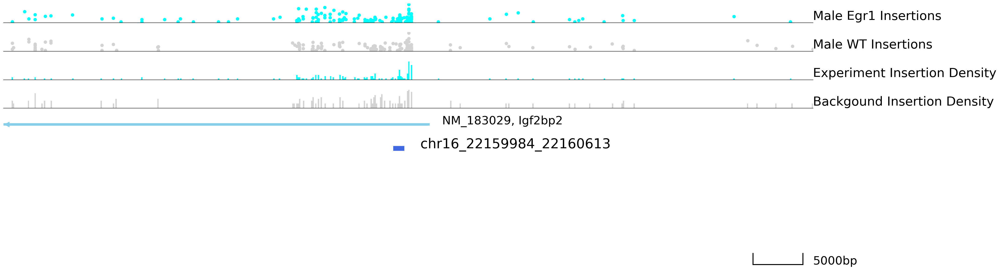

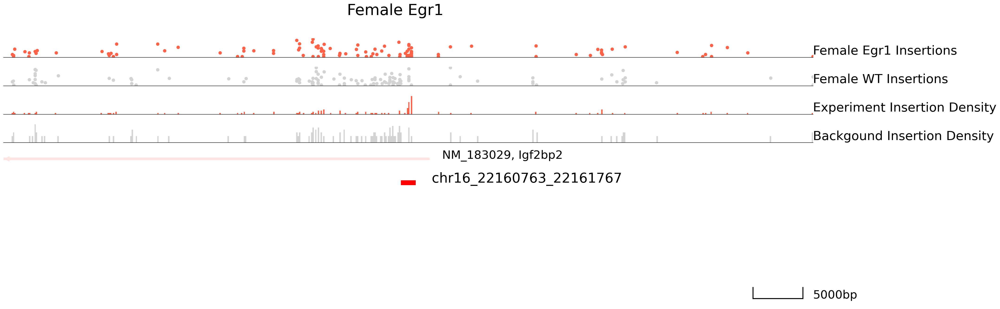

In [51]:
cc.pl.draw_area("chr16",22160763, 22161767,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr16",22160763, 22161767,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




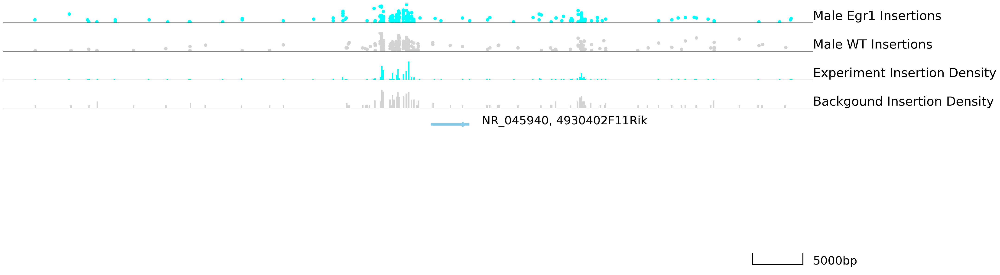

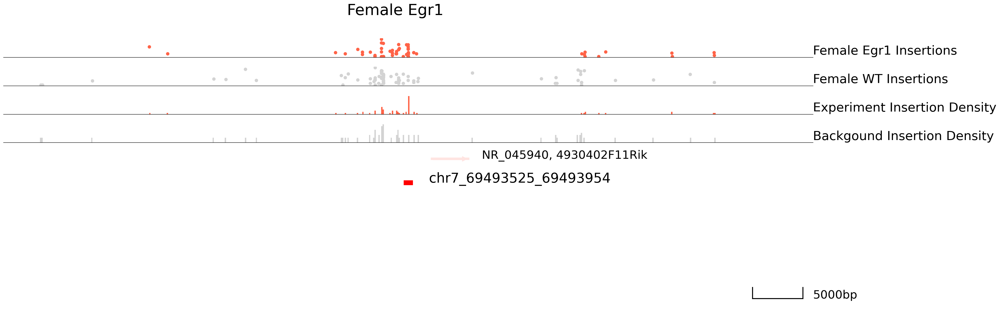

In [54]:
cc.pl.draw_area("chr7",69493525, 69493954,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr7",69493525, 69493954, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




In [56]:
# Read in the files
unique_peaks1_df = pd.read_csv("unique_peaks_male_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t")
unique_peaks2_df = pd.read_csv("unique_peaks_female_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t")
common_df = pd.read_csv("shared_peaks_malefemale_calledSeparately_W300_P05_TTAA001_annotated_091725.txt", sep="\t")

# Print top peaks in each
print("=== Unique Male Peaks ===")
print(unique_peaks1_df.head())


#print("\n=== Shared Peaks ===")
#print(common_df.head())

=== Unique Male Peaks ===
  Chromosome    Start      End     Center  Experiment Insertions  \
0       chr1  4784900  4785471  4785220.0                     31   
1       chr1  4859024  4859513  4858781.0                     49   
2       chr1  4916025  4916592  4916389.0                      9   
3       chr1  6281371  6281961  6281636.0                      7   
4       chr1  7089922  7090146  7089943.0                     46   

   Background insertions  Reference Insertions  pvalue Reference  \
0                     17                     6      0.000000e+00   
1                     21                    11      0.000000e+00   
2                      3                     5      1.477386e-10   
3                      3                     4      1.062140e-06   
4                     32                     8      0.000000e+00   

   pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
0           0.016208             0.000015  ...                 593.584886   
1 

In [57]:
print("\n=== Unique Female Peaks ===")
print(unique_peaks2_df.head())



=== Unique Female Peaks ===
  Chromosome    Start      End     Center  Experiment Insertions  \
0       chr1  4859557  4860097  4859828.0                     12   
1       chr1  6274010  6274413  6274210.0                      5   
2       chr1  6282928  6283331  6283128.0                     23   
3       chr1  6360131  6360756  6360553.0                     19   
4       chr1  6380055  6380519  6380255.0                      7   

   Background insertions  Reference Insertions  pvalue Reference  \
0                      8                     8      3.919087e-14   
1                      5                     1      3.218919e-07   
2                     33                     3      0.000000e+00   
3                     21                     3      0.000000e+00   
4                      5                     2      1.402174e-08   

   pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
0           0.020709             0.000010  ...                 484.922440   

In [58]:
# Filter where Experiment Insertions > Background insertions
unique_male_enriched = unique_peaks1_df[unique_peaks1_df['Experiment Insertions'] > unique_peaks1_df['Background insertions']]
unique_female_enriched = unique_peaks2_df[unique_peaks2_df['Experiment Insertions'] > unique_peaks2_df['Background insertions']]
common_enriched = common_df[common_df['Experiment Insertions'] > common_df['Background insertions']]

print(f"Unique Male peaks with Experiment > Background: {len(unique_male_enriched)}")
print(unique_male_enriched.head())

print(f"\nUnique Female peaks with Experiment > Background: {len(unique_female_enriched)}")
print(unique_female_enriched.head())

print(f"\nShared peaks with Experiment > Background: {len(common_enriched)}")
print(common_enriched.head())


Unique Male peaks with Experiment > Background: 7355
  Chromosome    Start      End     Center  Experiment Insertions  \
0       chr1  4784900  4785471  4785220.0                     31   
1       chr1  4859024  4859513  4858781.0                     49   
2       chr1  4916025  4916592  4916389.0                      9   
3       chr1  6281371  6281961  6281636.0                      7   
4       chr1  7089922  7090146  7089943.0                     46   

   Background insertions  Reference Insertions  pvalue Reference  \
0                     17                     6      0.000000e+00   
1                     21                    11      0.000000e+00   
2                      3                     5      1.477386e-10   
3                      3                     4      1.062140e-06   
4                     32                     8      0.000000e+00   

   pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
0           0.016208             0.000015  ...      

In [59]:
unique_male_enriched = unique_male_enriched.copy()
unique_male_enriched['enrichment_ratio'] = unique_male_enriched['Experiment Insertions'] / (unique_male_enriched['Background insertions'] + 1)
unique_male_enriched = unique_male_enriched.sort_values('enrichment_ratio', ascending=False)

unique_female_enriched = unique_female_enriched.copy()
unique_female_enriched['enrichment_ratio'] = unique_female_enriched['Experiment Insertions'] / (unique_female_enriched['Background insertions'] + 1)
unique_female_enriched = unique_female_enriched.sort_values('enrichment_ratio', ascending=False)

print("Top Male peaks by enrichment ratio:")
print(unique_male_enriched.head(10))

print("\nTop Female peaks by enrichment ratio:")
print(unique_female_enriched.head(10))

Top Male peaks by enrichment ratio:
     Chromosome      Start        End       Center  Experiment Insertions  \
6449      chr17   23857711   23857892   23857508.0                     23   
5676      chr14   74945088   74945491   74945288.0                     20   
2466       chr6   86194528   86194701   86194901.0                     18   
605        chr2   27540500   27540802   27540297.0                     33   
2447       chr6   72240672   72241084   72240876.5                     16   
6920      chr19    4482534    4482590    4482387.0                     16   
6922      chr19    5071924    5072114    5071721.0                     31   
1916       chr5   21732633   21732941   21732708.5                     14   
4691      chr11  105312484  105312963  105312684.0                     14   
4862      chr12   49383399   49383696   49383599.0                     14   

      Background insertions  Reference Insertions  pvalue Reference  \
6449                      0                  

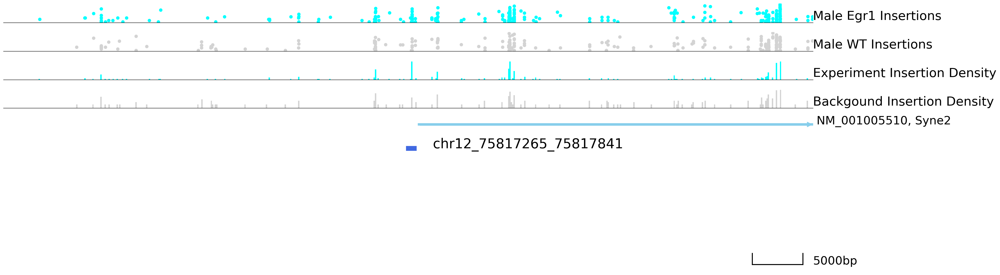

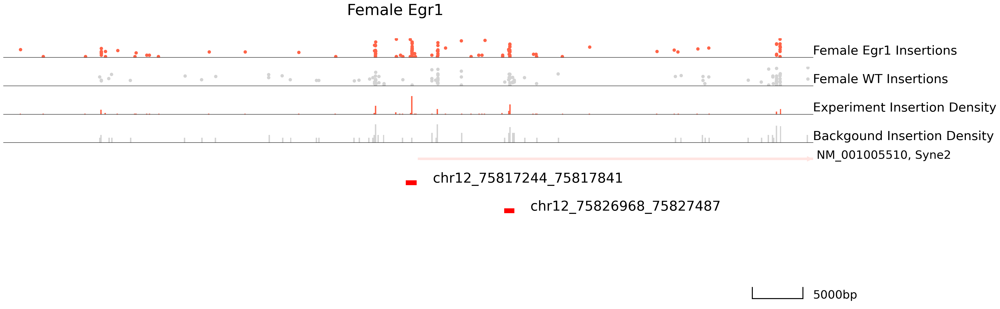

In [67]:
cc.pl.draw_area("chr12",75817244,75817265,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr12",75817244,75817265, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




In [75]:
# Count male insertions under each female-unique peak
female_bed = pybedtools.BedTool.from_dataframe(
    unique_peaks2_df[['Chromosome', 'Start', 'End']]
)
male_insertions_bed = pybedtools.BedTool.from_dataframe(
    Male_Egr1[['Chr', 'Start', 'End']].rename(columns={'Chr': 'Chromosome'})
)

# Count how many male insertions fall under each female peak
female_with_male_counts = female_bed.intersect(male_insertions_bed, c=True).to_dataframe(
    names=['Chromosome', 'Start', 'End', 'Male_insertion_count']
)

# Merge with original female peak data
female_with_male_counts['key'] = female_with_male_counts['Chromosome'] + '_' + female_with_male_counts['Start'].astype(str)
unique_peaks2_df['key'] = unique_peaks2_df['Chromosome'] + '_' + unique_peaks2_df['Start'].astype(str)
female_peaks_compared = unique_peaks2_df.merge(female_with_male_counts[['key', 'Male_insertion_count']], on='key')

# Now filter by ratio — female insertions must be X times more than male insertions
female_peaks_compared['female_to_male_ratio'] = (
    female_peaks_compared['Experiment Insertions'] / 
    (female_peaks_compared['Male_insertion_count'] + 1)
)

# Keep peaks where female has at least 3x more insertions than male
truly_female_biased = female_peaks_compared[
    female_peaks_compared['female_to_male_ratio'] >= 3
].sort_values('female_to_male_ratio', ascending=False)

print(f"Truly female-biased peaks: {len(truly_female_biased)}")
print(truly_female_biased[['Chromosome', 'Start', 'End', 'Experiment Insertions', 'Male_insertion_count', 'female_to_male_ratio']].head(100))

Truly female-biased peaks: 1423
     Chromosome     Start       End  Experiment Insertions  \
6486      chr17  14990610  14990721                    122   
6491      chr17  15054097  15054259                     68   
5865      chr15   6707175   6707330                     68   
1732       chr4  65125864  65126125                     65   
1761       chr4  82536956  82537454                     62   
...         ...       ...       ...                    ...   
1784       chr4  88017304  88017421                     25   
5853      chr15   3429088   3429229                     25   
56         chr1  39555620  39555854                     74   
7022      chr18  84089968  84090059                     49   
89         chr1  52501741  52501796                     49   

      Male_insertion_count  female_to_male_ratio  
6486                     0            122.000000  
6491                     0             68.000000  
5865                     0             68.000000  
1732               

In [76]:
unique_female_enriched

,Chromosome,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2,enrichment_ratio
2288,chr5,96162316,96162719,96162516.0,17,0,1,0.000000e+00,0.000000,0.000014,...,0.000000e+00,NM_144910,Cnot6l,-,-327,NM_178854,Cnot6l,-,-562,17.0
6223,chr16,20716138,20716541,20716338.0,16,0,1,0.000000e+00,0.000000,0.000014,...,0.000000e+00,NM_009900,Clcn2,-,0,NM_145632,Polr2h,+,1285,16.0
6546,chr17,27562065,27562468,27562265.0,15,0,1,0.000000e+00,0.000000,0.000013,...,0.000000e+00,NM_001166542,Hmga1,+,0,NM_001002895,AI413582,-,1301,15.0
5152,chr12,75817244,75817265,75817638.0,30,1,6,0.000000e+00,0.000000,0.000025,...,0.000000e+00,NM_001005510,Syne2,+,477,NM_030750,Sgpp1,-,-81516,15.0
5151,chr12,75554506,75555082,75554879.0,15,0,2,0.000000e+00,0.000000,0.000013,...,0.000000e+00,NM_012024,Ppp2r5e,-,0,NM_028203,Wdr89,-,75512,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,chr12,34484972,34485375,34485172.0,5,4,1,7.926990e-08,0.030515,0.000004,...,4.599572e-05,NM_001271386,Hdac9,-,0,NM_029294,Prps1l1,+,499386,1.0
5051,chr12,38786977,38787434,38787231.0,8,7,3,6.514345e-12,0.042893,0.000007,...,6.371767e-09,NM_007960,Etv1,+,0,NM_178681,Dgkb,+,-153568,1.0
5092,chr12,53423682,53424267,53423882.0,12,11,5,7.117174e-11,0.048559,0.000010,...,6.180828e-08,NM_013780,Npas3,+,0,NM_198111,Akap6,+,-272668,1.0
824,chr2,84638618,84639128,84638925.0,15,14,6,4.894163e-11,0.032830,0.000013,...,4.329596e-08,NM_007615,Ctnnd1,-,0,NM_001145100,Btbd18,+,19951,1.0


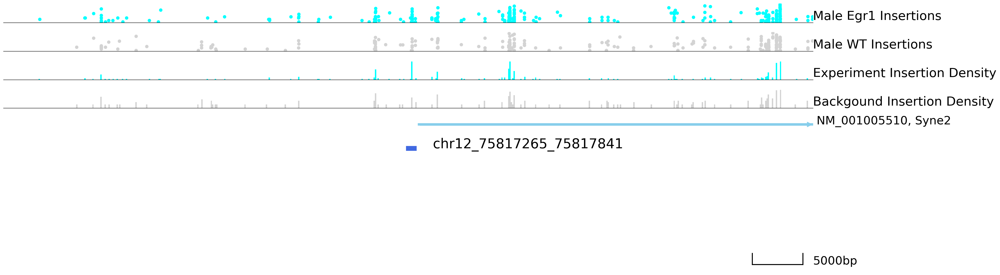

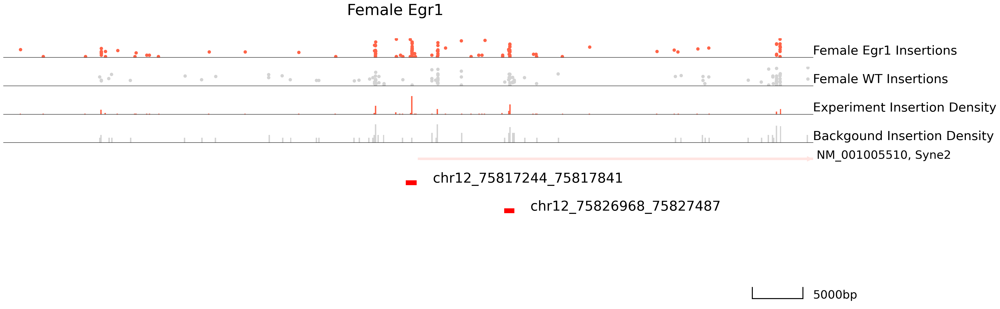

In [79]:
cc.pl.draw_area("chr12",75817244,75817265	,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr12",75817244,75817265	, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




In [80]:
# Step 1: Find insertions unique to Female (not present in Male qbed)
female_ins_bed = pybedtools.BedTool.from_dataframe(
    Female_Egr1[['Chr', 'Start', 'End']].rename(columns={'Chr': 'Chromosome'})
)
male_ins_bed = pybedtools.BedTool.from_dataframe(
    Male_Egr1[['Chr', 'Start', 'End']].rename(columns={'Chr': 'Chromosome'})
)

# Female insertions that don't overlap any male insertion
female_unique_ins = female_ins_bed.intersect(male_ins_bed, v=True)
print(f"Female-unique insertions: {female_unique_ins.count()}")

# Step 2: Keep only female-unique insertions that fall near a female-called peak
female_peaks_bed = pybedtools.BedTool.from_dataframe(
    peak_annotation_Female_20000[['Chr', 'Start', 'End']].rename(columns={'Chr': 'Chromosome'})
)

# Female-unique insertions within or near a female peak (slop adds window around peak)
female_peaks_slop = female_peaks_bed.slop(b=1000, genome='mm10')  # 1kb window around peak

female_unique_near_peak = female_unique_ins.intersect(female_peaks_slop, u=True)  # u=True = at least one overlap
print(f"Female-unique insertions near a female peak: {female_unique_near_peak.count()}")

# Step 3: Count these per female peak to rank peaks by female-specific signal
female_peak_counts = female_peaks_bed.intersect(
    female_unique_near_peak, c=True
).to_dataframe(names=['Chromosome', 'Start', 'End', 'Female_unique_insertion_count'])

# Merge with annotation
peak_annotation_Female_20000['key'] = (peak_annotation_Female_20000['Chr'] + '_' + 
                                        peak_annotation_Female_20000['Start'].astype(str))
female_peak_counts['key'] = (female_peak_counts['Chromosome'] + '_' + 
                              female_peak_counts['Start'].astype(str))

female_ranked = peak_annotation_Female_20000.merge(
    female_peak_counts[['key', 'Female_unique_insertion_count']], on='key'
)

# Sort by most female-unique insertions
female_ranked = female_ranked[female_ranked['Female_unique_insertion_count'] > 0]
female_ranked = female_ranked.sort_values('Female_unique_insertion_count', ascending=False)

print(f"Female peaks with unique female insertions: {len(female_ranked)}")
print(female_ranked[['Chr', 'Start', 'End', 'Female_unique_insertion_count']].head(20))

Female-unique insertions: 455695
Female-unique insertions near a female peak: 19572
Female peaks with unique female insertions: 2620
        Chr      Start        End  Female_unique_insertion_count
6343   chr4   82536956   82537454                             62
9213   chr9   91400577   91401183                             59
2814  chr14  122380508  122381081                             41
9200   chr9   91352577   91353492                             33
9214   chr9   91404454   91405087                             32
6652   chr4  141477893  141478417                             28
9471   chrX   93285655   93286118                             27
9207   chr9   91379847   91380447                             27
6341   chr4   82533407   82534049                             26
6289   chr4   59452515   59452991                             25
5601   chr3    5227932    5228560                             21
7111   chr5  114921992  114922395                             21
2818  chr14  122453730

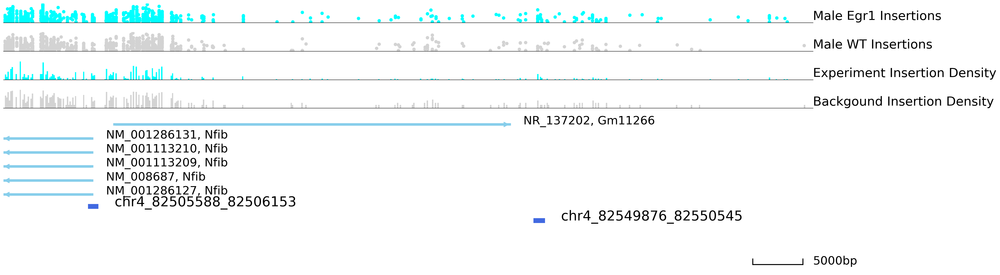

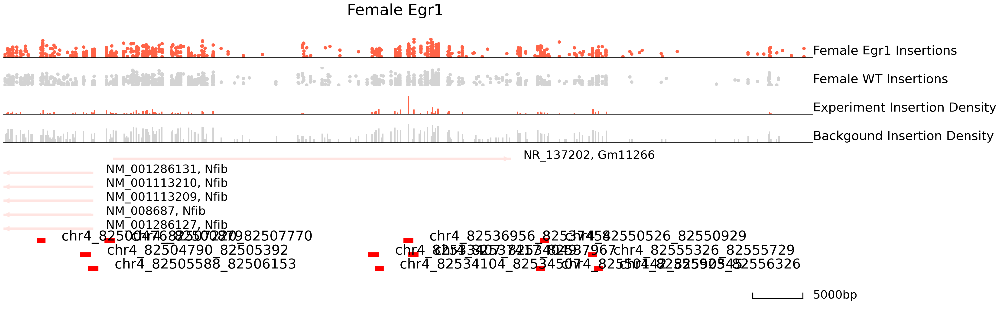

In [81]:
cc.pl.draw_area("chr4",82536956,82537454 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr4",82536956,82537454 , 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




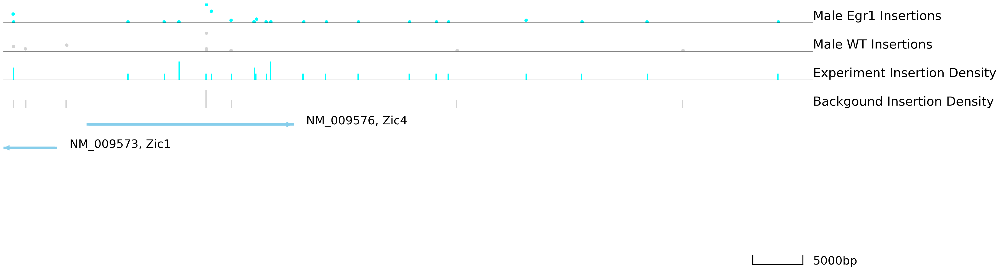

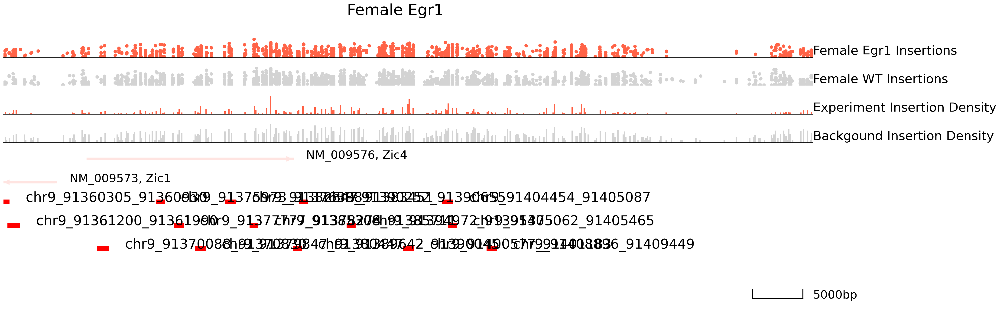

In [82]:
cc.pl.draw_area("chr9",91400577,91401183,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr9",91400577,91401183, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




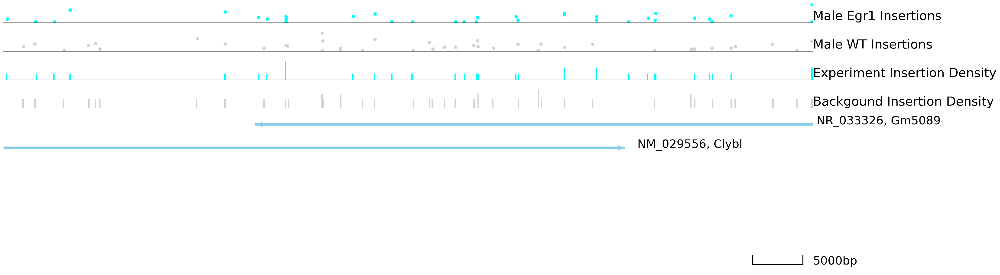

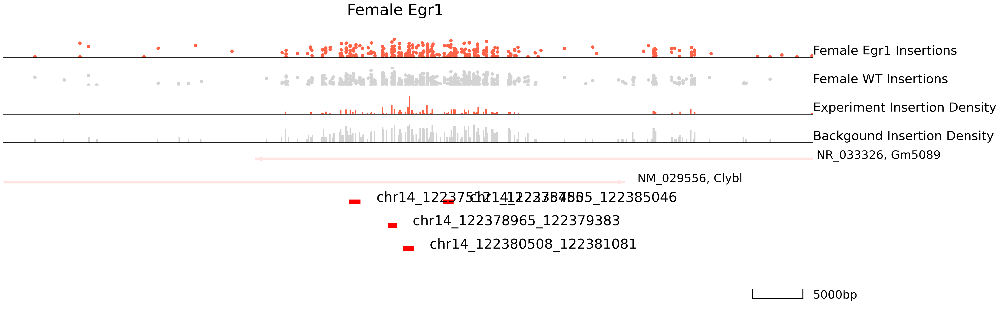

In [83]:
cc.pl.draw_area("chr14",122380508,122381081,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr14",122380508,122381081, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




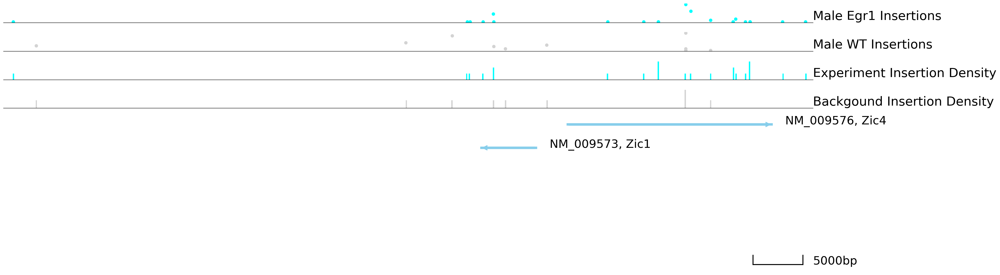

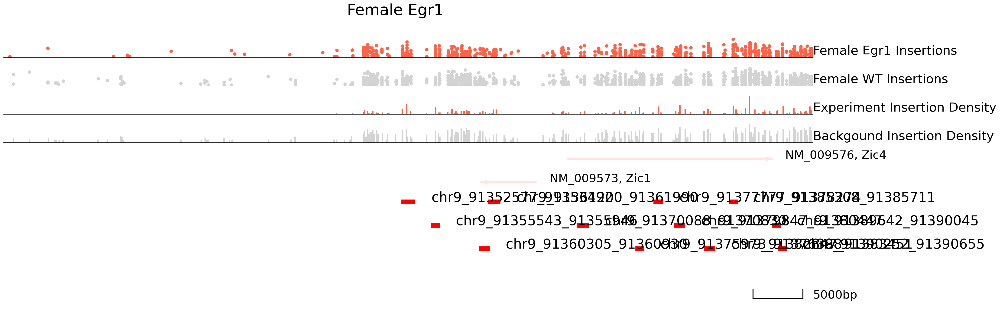

In [84]:
cc.pl.draw_area("chr9",91352577,   91353492,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr9",91352577,   91353492, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')




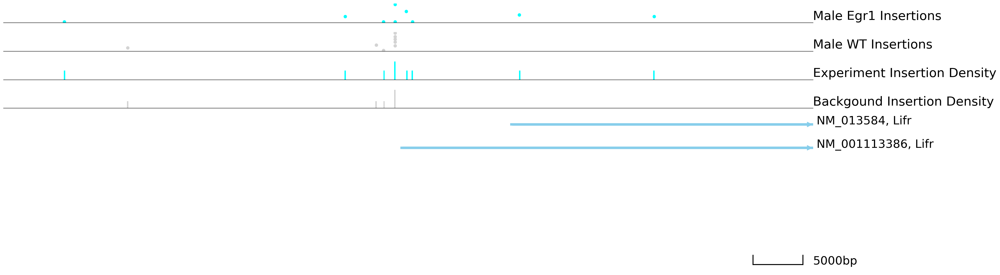

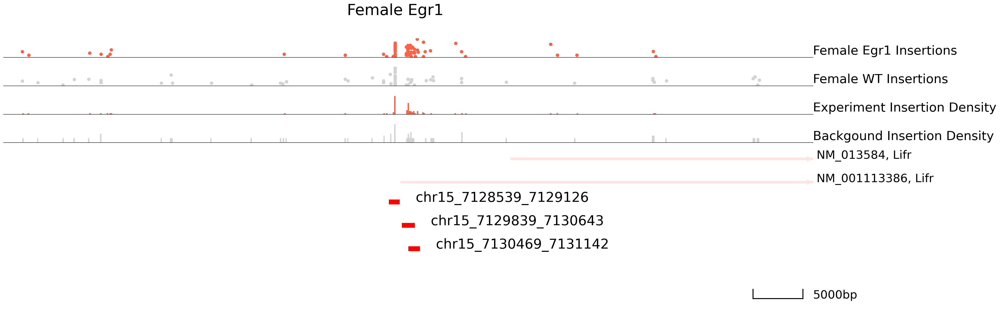

In [89]:
cc.pl.draw_area("chr15",7129839,7130643,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr15",7129839,7130643, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


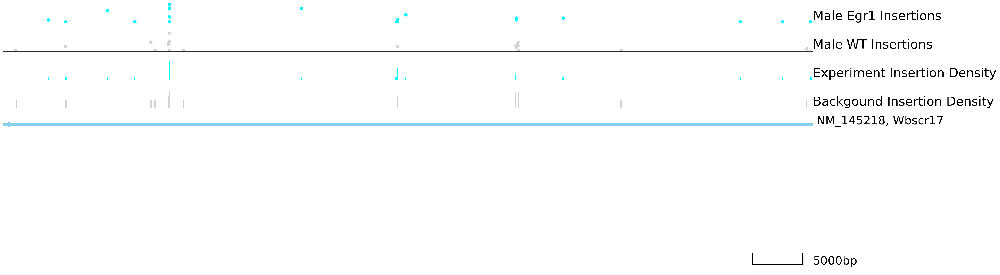

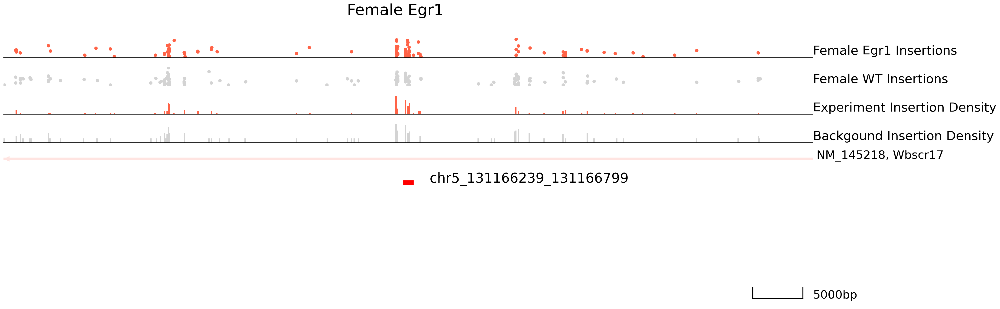

In [90]:
cc.pl.draw_area("chr5",131166239 , 131166799,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr5",131166239 , 131166799, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


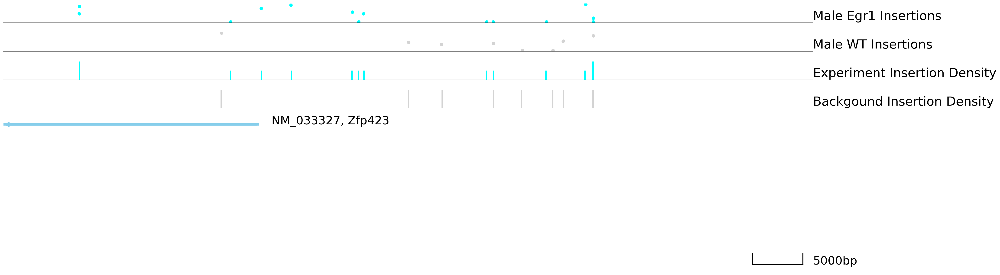

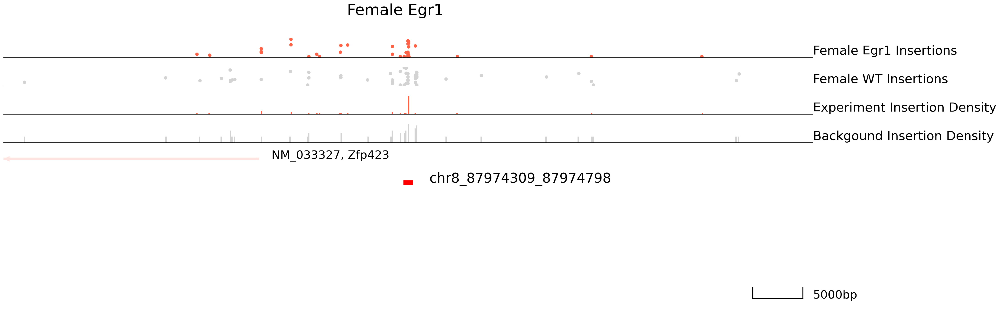

In [93]:
cc.pl.draw_area("chr8",87974309,87974798 ,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr8",87974309,87974798, 40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


In [96]:
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 5.835878970508402, Track 1: 5.274400736587726, Track 2: 16.8


In [97]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, shared_0)
axes[1].set_ylim(0, shared_1)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_FemaleBias.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 6)
axes[1].set_ylim(0, 6)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_FemaleBias.pdf', bbox_inches='tight')
plt.close()

/tmp/ipykernel_1338267/1508912687.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_1338267/1508912687.py:35: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [100]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 5000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, shared_0)
axes[1].set_ylim(0, shared_1)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_FemaleBias_tighter.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr8",87974309,87974798, 5000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 6)
axes[1].set_ylim(0, 6)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_FemaleBias_tighter.pdf', bbox_inches='tight')
plt.close()

/tmp/ipykernel_1338267/3029223855.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_1338267/3029223855.py:35: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


# 050726
# Finding better tracks for paper

In [7]:
import pandas as pd

# --- 1. Split DEGs into down vs up properly --------------------------------

KD_M_all = pd.read_csv(
    '/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/'
    'Male_Egr1KDg3_vs_Male_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
KD_M_all = KD_M_all[KD_M_all['pvalue'] <= 0.05]
KD_M_down = KD_M_all[KD_M_all['log2FoldChange'] <= -0.5]
KD_M_up   = KD_M_all[KD_M_all['log2FoldChange'] >=  0.5]
print(f"Male  KD DEGs: {len(KD_M_down)} down / {len(KD_M_up)} up")

KD_F_all = pd.read_csv(
    '/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/testing_CC_forPaper/'
    'Female_Egr1KDg3_vs_Female_NoTreatg1_DE_vst_filtered_091625.txt', sep='\t')
KD_F_all = KD_F_all[KD_F_all['pvalue'] <= 0.05]
KD_F_down = KD_F_all[KD_F_all['log2FoldChange'] <= -0.5]
KD_F_up   = KD_F_all[KD_F_all['log2FoldChange'] >=  0.5]
print(f"Female KD DEGs: {len(KD_F_down)} down / {len(KD_F_up)} up")

# --- 2. Load unique peaks --------------------------------------------------

male_unique = pd.read_csv(
    "unique_peaks_male_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t")
female_unique = pd.read_csv(
    "unique_peaks_female_calledSeparately_W300_P05_TTAA001_annotated_091725.txt",
    sep="\t")

# --- 3. Cross-reference and rank candidates --------------------------------

def best_candidates(peak_df, deg_df, n=25):
    """Ranked browser-view candidates: unique peaks near KD-downregulated genes."""
    deg_lookup = deg_df.set_index('SYMBOL')[['log2FoldChange', 'pvalue']]
    
    df = peak_df.copy()
    df['Distance1_abs'] = df['Distance1'].abs()
    
    # Filter: TSS-proximal, significant, named gene, in the KD-down list
    df = df[
        (df['Distance1_abs'] < 50000) &
        (df['pvalue_adj Reference'] < 0.001) &
        (df['Gene Name1'].notna()) &
        (~df['Gene Name1'].str.match(
            r'^(Gm\d+|.*Rik$|LOC|RP\d|AC\d)', na=False)) &
        (df['Gene Name1'].isin(deg_lookup.index))
    ].copy()
    
    # Attach the DEG stats
    df = df.merge(deg_lookup, left_on='Gene Name1', right_index=True, how='left')
    
    # Rank by CC signal strength
    df = df.sort_values('TPH background subtracted', ascending=False).head(n)
    
    df['region'] = df.apply(
        lambda r: f"{r['Chromosome']}:{int(r['Start'])-2000}-{int(r['End'])+2000}",
        axis=1)
    
    return df[['Chromosome', 'Start', 'End',
               'Experiment Insertions', 'TPH background subtracted',
               'pvalue_adj Reference',
               'Gene Name1', 'Distance1',
               'log2FoldChange', 'pvalue', 'region']].reset_index(drop=True)

print("\n=== Best male-biased Fig 3B candidates ===")
print("(male-unique CC peaks near genes downregulated after male Egr1 KD)\n")
male_picks = best_candidates(male_unique, KD_M_down)
print(male_picks.to_string())

print("\n\n=== Best female-biased Fig 3B candidates ===")
print("(female-unique CC peaks near genes downregulated after female Egr1 KD)\n")
female_picks = best_candidates(female_unique, KD_F_down)
print(female_picks.to_string())

# Save in case you want to share with collaborators / put in supp
male_picks.to_csv("Fig3B_male_biased_candidates.csv", index=False)
female_picks.to_csv("Fig3B_female_biased_candidates.csv", index=False)

Male  KD DEGs: 149 down / 430 up
Female KD DEGs: 180 down / 540 up

=== Best male-biased Fig 3B candidates ===
(male-unique CC peaks near genes downregulated after male Egr1 KD)

   Chromosome      Start        End  Experiment Insertions  TPH background subtracted  pvalue_adj Reference Gene Name1  Distance1  log2FoldChange        pvalue                     region
0        chrX  159255074  159255118                     74                2810.101760          0.000000e+00    Rps6ka3        664       -0.534396  3.065335e-05   chrX:159253074-159257118
1       chr14   66257838   66258908                     56                2000.490262          0.000000e+00      Ptk2b          0       -0.893051  2.545996e-02    chr14:66255838-66260908
2        chr3  131112967  131112980                     49                1822.496122          0.000000e+00       Lef1          0       -1.040113  2.399362e-05   chr3:131110967-131114980
3        chr1  150115947  150116047                     96               

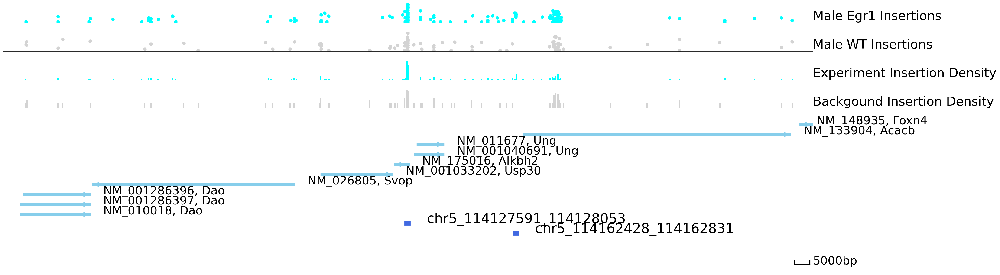

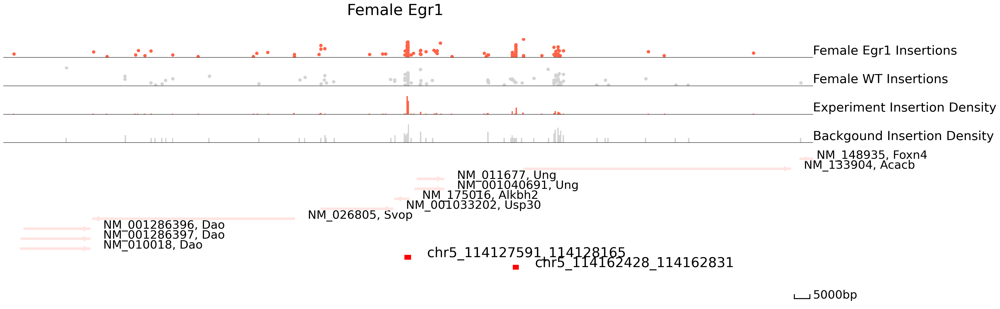

In [22]:

cc.pl.draw_area("chr5",114128053,114128165 ,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr5",114128053,114128165 ,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


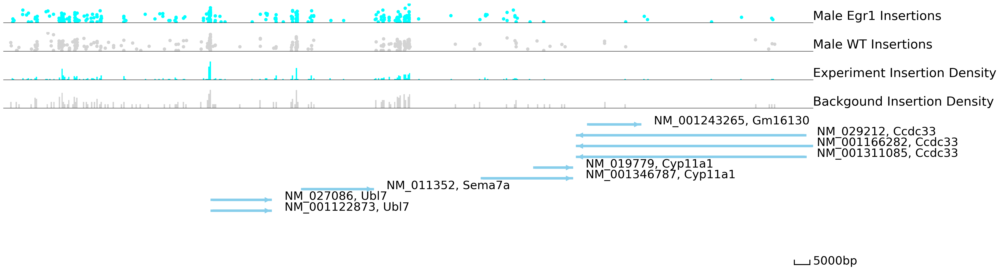

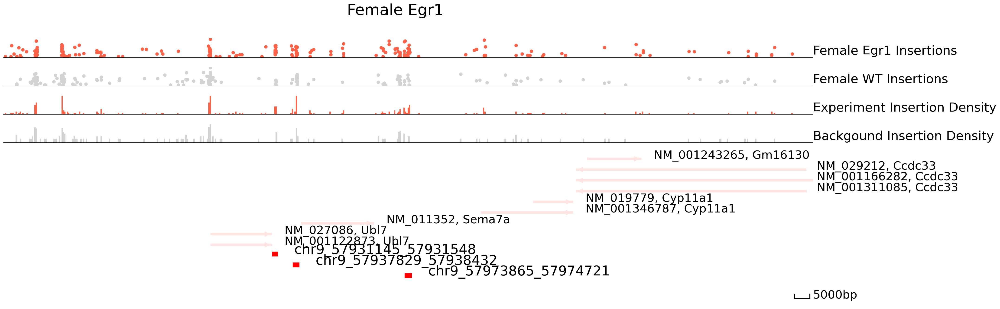

In [21]:
cc.pl.draw_area("chr9",57973865,57974721 ,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr9",57973865,57974721 ,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


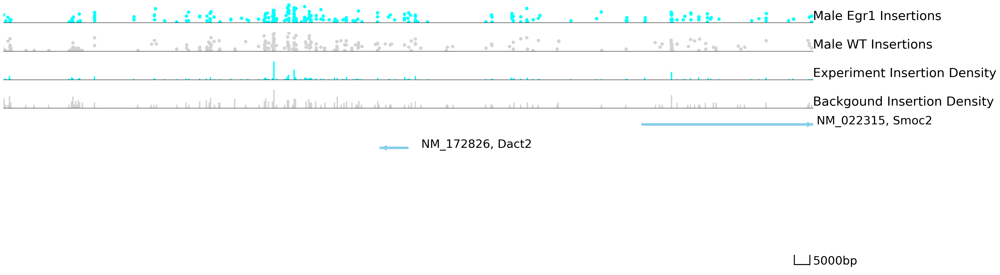

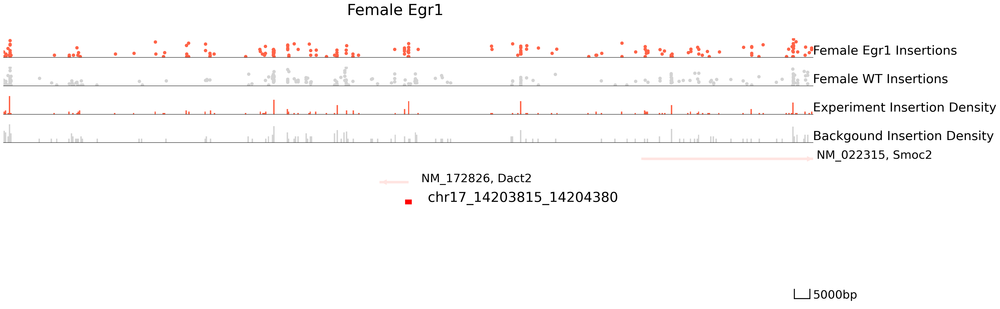

In [13]:
cc.pl.draw_area("chr17",14203815,14204380,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr17",14203815,14204380 ,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


In [14]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr17",14203815,14204380,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr17",14203815,14204380,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 6.648330935666509, Track 1: 6.709751952682198, Track 2: 34.65


In [15]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
   "chr17",14203815,14204380,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_050726_Bias2.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr17",14203815,14204380,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_050726_Bias2.pdf', bbox_inches='tight')
plt.close()

/tmp/ipykernel_1608947/2178247781.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/tmp/ipykernel_1608947/2178247781.py:35: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


## MALE BIAS PEAKS - NEAR PTK2B

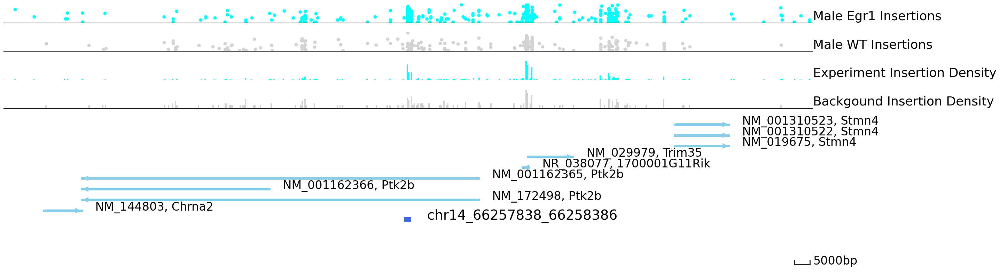

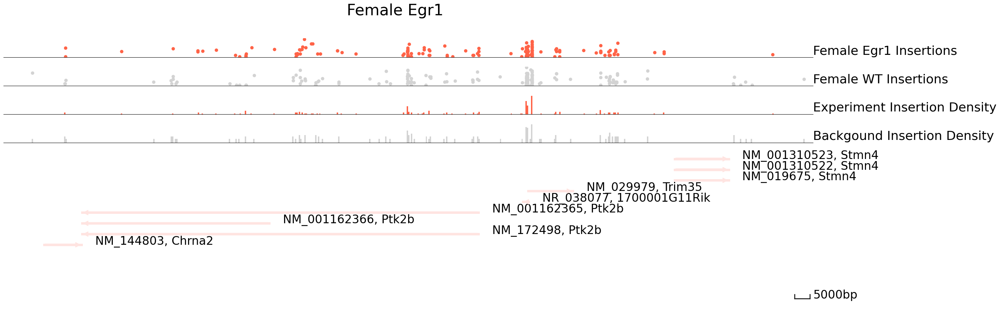

In [109]:
cc.pl.draw_area("chr14",66257838,66258908,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr14",66257838,66258908,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


In [112]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr14",66257838,66258908,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr14",66257838,66258908,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.045367308553501, Track 1: 6.714853177290829, Track 2: 47.25


In [114]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr14",66257838,66258908,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Male_Egr1_WT_tracks_050726_Bias1_Ptk2b.pdf',
    bbox_inches='tight'
)

plt.close()


# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr14",66257838,66258908,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="red",
    title="Female Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Female_Egr1_WT_tracks_050726_Bias1_Ptk2b.pdf',
    bbox_inches='tight'
)

plt.close()

## FEMALE BIAS PEAKS - NEAR FRZB

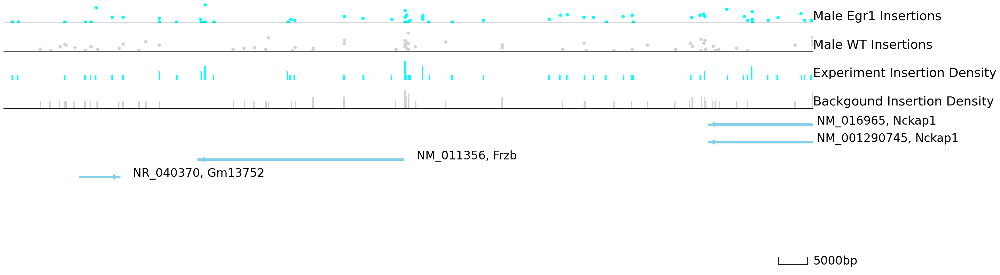

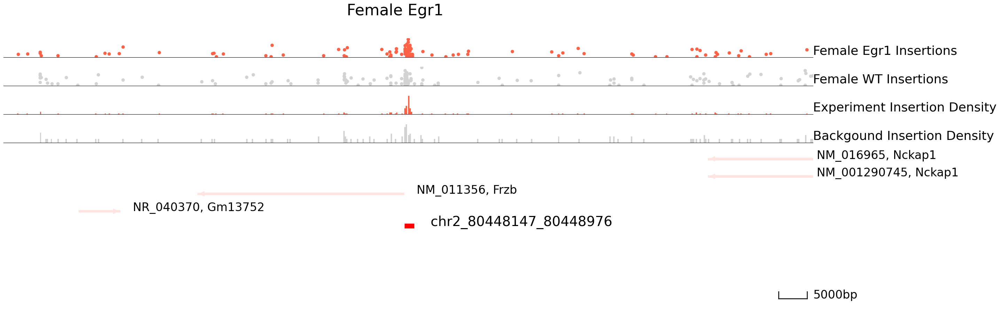

In [121]:
cc.pl.draw_area("chr2",80448147,80448550,70000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr2",80448147,80448550,70000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


In [116]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.961405897789108, Track 1: 7.316650544144952, Track 2: 30.45


In [122]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2",80448147,80448550,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Male_Egr1_WT_tracks_050726_Bias2_Frzb.pdf',
    bbox_inches='tight'
)

plt.close()


# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr2",80448147,80448550,130000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="red",
    title="Female Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Female_Egr1_WT_tracks_050726_Bias2_Frzb.pdf',
    bbox_inches='tight'
)

plt.close()

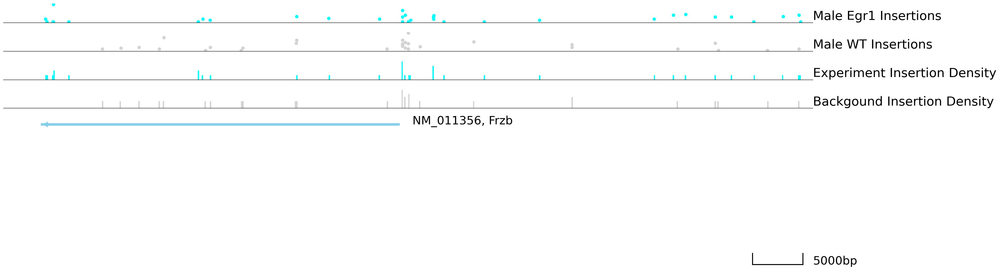

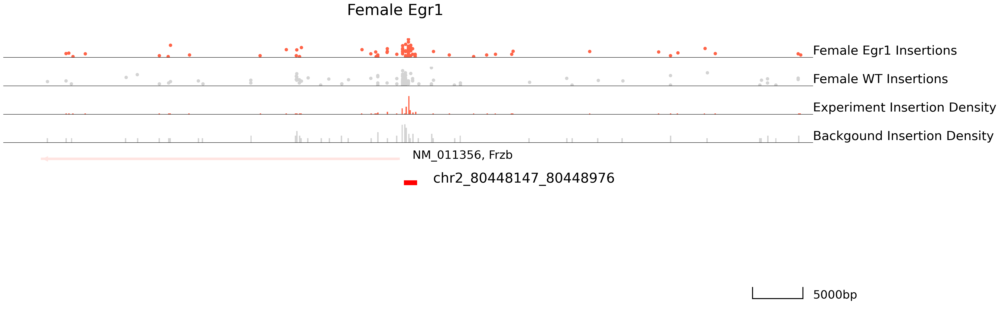

In [32]:
cc.pl.draw_area("chr2",80448147,80448550,40000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr2",80448147,80448550,40000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


In [33]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr2",80448147,80448550,40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.961405897789108, Track 1: 6.67156592630278, Track 2: 23.1


In [34]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
     "chr2",80448147,80448550,40000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 7)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Male_Egr1_WT_tracks_050726_Bias2_Frzb_tighter.pdf',
    bbox_inches='tight'
)

plt.close()


# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
     "chr2",80448147,80448550,40000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="red",
    title="Female Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 7)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Female_Egr1_WT_tracks_050726_Bias2_Frzb_tighter.pdf',
    bbox_inches='tight'
)

plt.close()

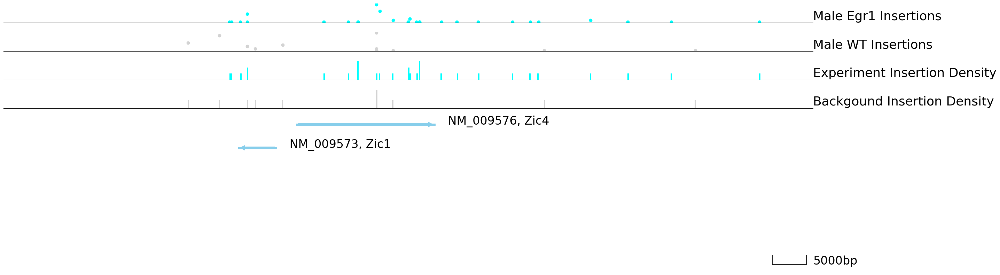

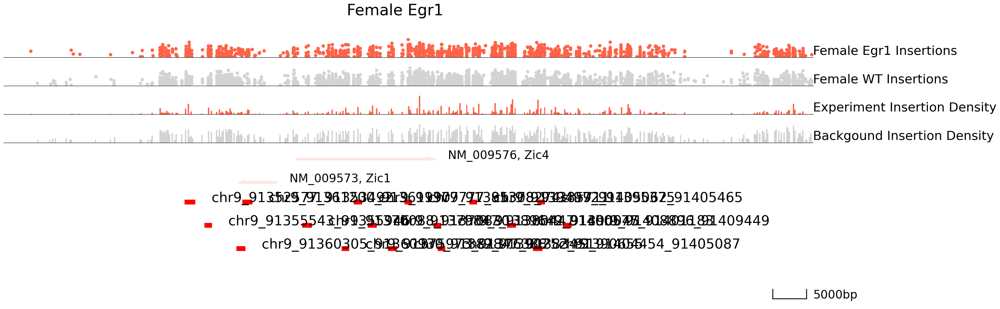

In [124]:
cc.pl.draw_area("chr9",91385308,91385711,60000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr9",91385308,91385711,60000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')

In [125]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr9",91385308,91385711,60000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr9",91385308,91385711,60000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 9.407005616116361, Track 1: 9.126101777716757, Track 2: 46.2


In [128]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr9",91385308,91385711,60000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 9.5)
axes[1].set_ylim(0, 9.5)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Male_Egr1_WT_tracks_050726_Bias3_Zic4.pdf',
    bbox_inches='tight'
)

plt.close()


# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr9",91385308,91385711,60000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="red",
    title="Female Egr1", save=False
)

fig = plt.gcf()
fig.set_size_inches(30,10)

axes = fig.get_axes()

axes[0].set_ylim(0, 9.5)
axes[1].set_ylim(0, 9.5)
axes[2].set_ylim(0, shared_2)

# force identical panel geometry
axes[0].set_position([0.08, 0.78, 0.88, 0.15])
axes[1].set_position([0.08, 0.58, 0.88, 0.15])
axes[2].set_position([0.08, 0.10, 0.88, 0.42])

plt.subplots_adjust(hspace=0.05)

plt.savefig(
    'Female_Egr1_WT_tracks_050726_Bias3_Zic4.pdf',
    bbox_inches='tight'
)

plt.close()

## FEMALE BIAS PEAKS - NEAR NAB1

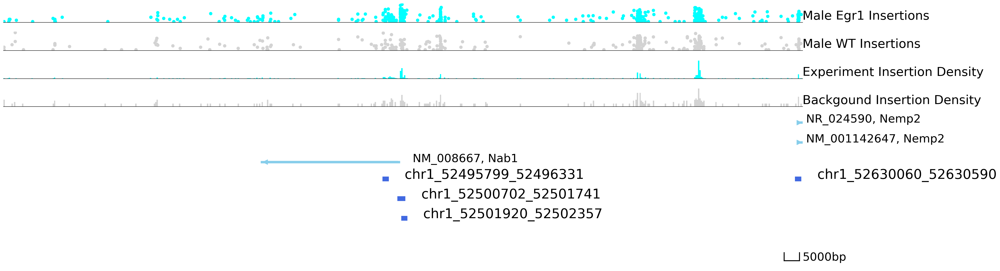

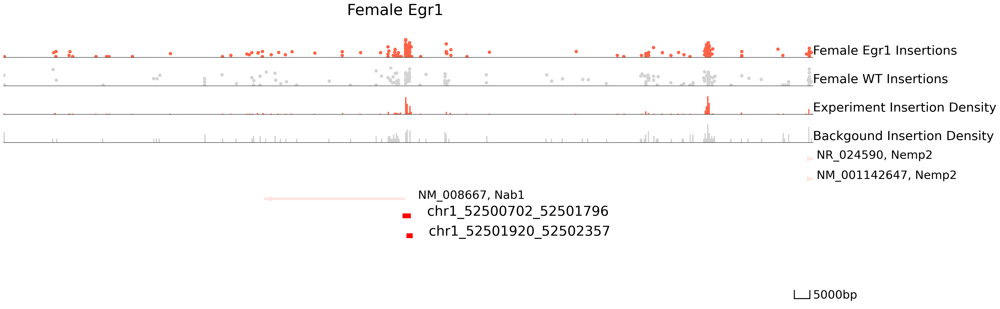

In [8]:
 
cc.pl.draw_area("chr1",52501741,   52501796,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr1",52501741,   52501796,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


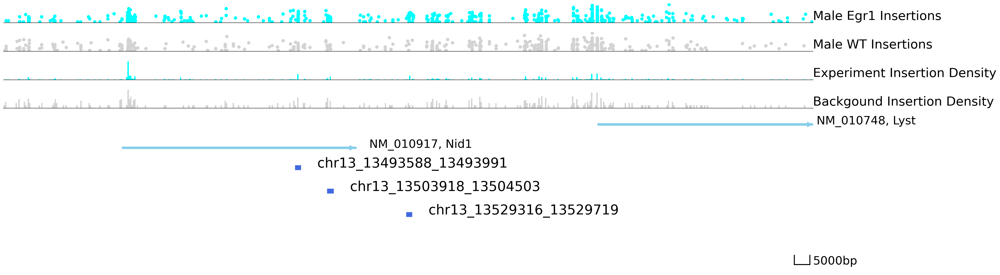

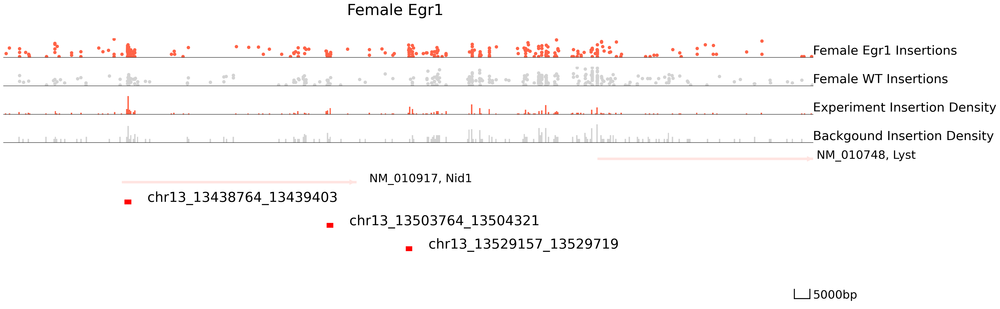

In [11]:

cc.pl.draw_area("chr13",13529157,13529316 ,130000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr13",13529157,13529316 ,130000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')


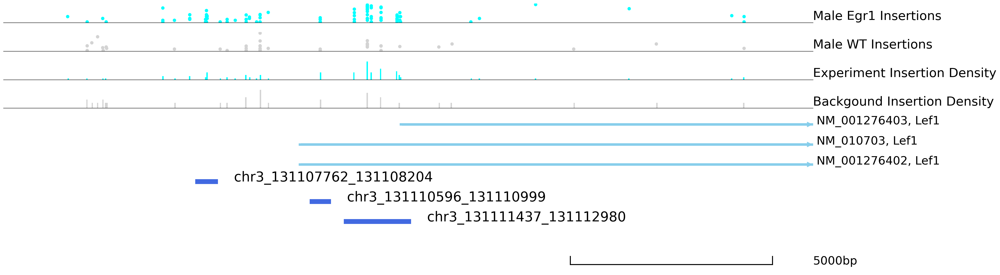

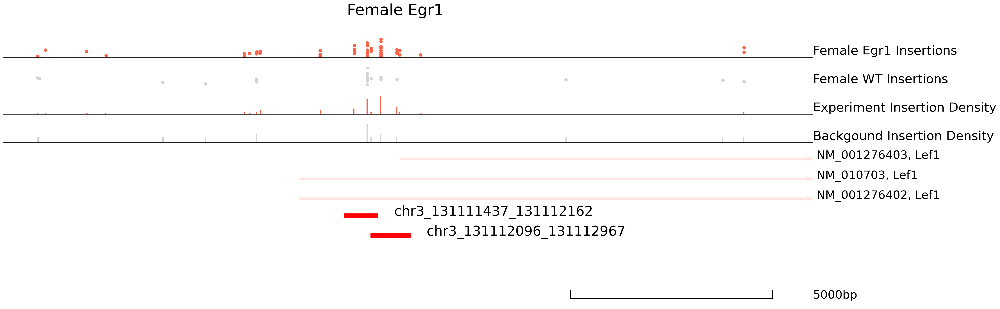

In [17]:
cc.pl.draw_area("chr3",131112967,131112980, 10000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr3",131112967,131112980, 10000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



### These peaks are not very clean. Let's try something else:

In [26]:
import pandas as pd
import numpy as np

# =============================================================================
# 1. LOAD PEAK FILES
# =============================================================================

male_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
female_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"

peak_data_Male = pd.read_csv(male_file, sep="\t", header=None)
peak_data_Female = pd.read_csv(female_file, sep="\t", header=None)

cols = [
    'Chr', 'Start', 'End', 'Center',
    'Experiment Insertions', 'Background insertions',
    'Reference Insertions', 'pvalue Reference', 'pvalue Background',
    'Fraction Experiment', 'TPH Experiment',
    'Fraction background', 'TPH background',
    'TPH background subtracted', 'pvalue_adj Reference'
]

peak_data_Male.columns = cols
peak_data_Female.columns = cols

print("Male peaks:", len(peak_data_Male))
print("Female peaks:", len(peak_data_Female))


# =============================================================================
# 2. ANNOTATE PEAKS (CALLING CARDS)
# =============================================================================

peak_annotation_Male = cc.pp.annotation(
    peak_data_Male,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)

peak_annotation_Male = cc.pp.combine_annotation(
    peak_data_Male,
    peak_annotation_Male
)

peak_annotation_Female = cc.pp.annotation(
    peak_data_Female,
    reference="mm10",
    bedtools_path='/ref/rmlab/software/pycallingcards/bin'
)

peak_annotation_Female = cc.pp.combine_annotation(
    peak_data_Female,
    peak_annotation_Female
)


# =============================================================================
# 3. FILTER TO 20 KB WINDOW (YOUR CONSTRAINT)
# =============================================================================

peak_annotation_Male = peak_annotation_Male[
    peak_annotation_Male['Distance1'].abs() <= 20000
].reset_index(drop=True)

peak_annotation_Female = peak_annotation_Female[
    peak_annotation_Female['Distance1'].abs() <= 20000
].reset_index(drop=True)


# =============================================================================
# 4. CLEAN GENE ANNOTATIONS
# =============================================================================

def clean_peaks(df):
    df = df.copy()

    # remove NA genes
    df = df[df['Gene Name1'].notna()].copy()

    # remove repetitive / uninformative genes
    df = df[~df['Gene Name1'].str.match(
        r'^(Gm\d+|.*Rik$|LOC|RP\d|AC\d)',
        na=False
    )]

    return df


peak_annotation_Male = clean_peaks(peak_annotation_Male)
peak_annotation_Female = clean_peaks(peak_annotation_Female)


# =============================================================================
# 5. COLLAPSE TO ONE PEAK PER GENE (CRITICAL FIX)
# =============================================================================

def collapse_to_best_peak(df):
    """
    Keep strongest peak per gene (removes redundant peak calls)
    """
    df = df.copy()

    df = df.sort_values(
        'TPH background subtracted',
        ascending=False
    )

    df = df.drop_duplicates('Gene Name1')

    return df


male_gene_peaks = collapse_to_best_peak(peak_annotation_Male)
female_gene_peaks = collapse_to_best_peak(peak_annotation_Female)

print("\nCollapsed peaks:")
print("Male gene-level peaks:", len(male_gene_peaks))
print("Female gene-level peaks:", len(female_gene_peaks))


# =============================================================================
# 6. DEFINE TRUE GENE-LEVEL OVERLAP
# =============================================================================

male_genes = set(male_gene_peaks['Gene Name1'])
female_genes = set(female_gene_peaks['Gene Name1'])

shared_genes = male_genes & female_genes
male_only_genes = male_genes - female_genes
female_only_genes = female_genes - male_genes


# =============================================================================
# 7. BUILD CLEAN OUTPUT TABLES
# =============================================================================

male_unique = male_gene_peaks[
    male_gene_peaks['Gene Name1'].isin(male_only_genes)
].copy()

female_unique = female_gene_peaks[
    female_gene_peaks['Gene Name1'].isin(female_only_genes)
].copy()

shared = male_gene_peaks[
    male_gene_peaks['Gene Name1'].isin(shared_genes)
].copy()


# =============================================================================
# 8. ADD IGV/BROWSER REGIONS
# =============================================================================

def add_region(df):
    df = df.copy()
    df['region'] = df.apply(
        lambda r: f"{r['Chr']}:{int(r['Start'])-2000}-{int(r['End'])+2000}",
        axis=1
    )
    return df


male_unique = add_region(male_unique)
female_unique = add_region(female_unique)
shared = add_region(shared)


# =============================================================================
# 9. FINAL SORTING (USE SIGNAL, NOT PEAK IDENTITY)
# =============================================================================

male_unique = male_unique.sort_values(
    'TPH background subtracted',
    ascending=False
)

female_unique = female_unique.sort_values(
    'TPH background subtracted',
    ascending=False
)

shared = shared.sort_values(
    'TPH background subtracted',
    ascending=False
)


# =============================================================================
# 10. SAVE OUTPUTS
# =============================================================================

male_unique.to_csv("male_unique_gene_level_CC_peaks_20kb.csv", index=False)
female_unique.to_csv("female_unique_gene_level_CC_peaks_20kb.csv", index=False)
shared.to_csv("shared_gene_level_CC_peaks_20kb.csv", index=False)


# =============================================================================
# 11. SUMMARY
# =============================================================================

print("\n================ SUMMARY ================\n")

print("Male unique genes:", len(male_unique))
print("Female unique genes:", len(female_unique))
print("Shared genes:", len(shared))

print("\nTop female-biased genes (signal only):")
print(
    female_unique[['Gene Name1', 'TPH background subtracted']].head(10)
)

print("\nTop male-biased genes (signal only):")
print(
    male_unique[['Gene Name1', 'TPH background subtracted']].head(10)
)

Male peaks: 11977
Female peaks: 11772
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.

Collapsed peaks:
Male gene-level peaks: 5256
Female gene-level peaks: 5377

================ SUMMARY ================

Male unique genes: 1900
Female unique genes: 2021
Shared genes: 3356

Top female-biased genes (signal only):
     Gene Name1  TPH background subtracted
686       Rps12                4975.772487
8579      Nr2f6                3412.987333
3873       Tbcc                2794.676070
6867       Add1                2691.624193
7119      Sirt4                2624.812608
6653     Fblim1                2600.379008
2637      Dnah1                2588.455142
1592       Rdm1                2521.760731
1747      Ttc32                2406.550640
9079      Skor1                2376.213695

Top male-biased genes (signal

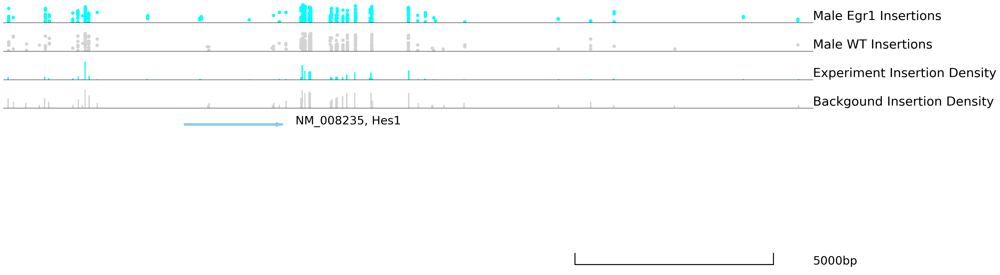

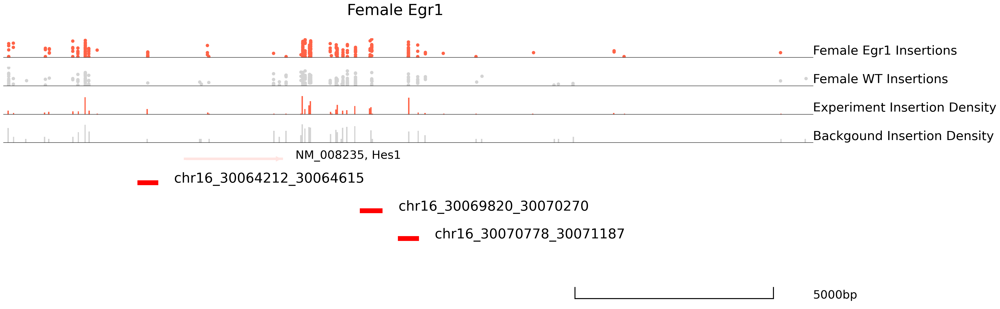

In [29]:
cc.pl.draw_area("chr16",30070778,30071187, 10000, peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT, font_size=2,
                name = "Male_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Male Egr1 Insertions', 
                name_insertion2 = 'Male WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, color = "blue")#, title = "Male Egr1", save = 'Male_Egr1_WT_tracks_MaleBias1.pdf')
cc.pl.draw_area("chr16",30070778,30071187, 10000, peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT, font_size=2,
                name = "Female_Egr1", key = "Index", insertionkey = "group", figsize = (30,10), plotsize = [1,1,4],
                name_insertion1 = 'Female Egr1 Insertions', 
                name_insertion2 = 'Female WT Insertions', 
                peak_line = 3, bins = 600, example_length = 5000, title = "Female Egr1")#, save = 'Female_Egr1_WT_tracks_MaleBias1.pdf')



In [33]:
# Save with same y max
# --- MALE: plot without saving ---
cc.pl.draw_area(
    "chr16",30070778,30071187,130000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes_male = plt.gcf().get_axes()
male_ymax = [axes_male[0].get_ylim()[1], axes_male[1].get_ylim()[1], axes_male[2].get_ylim()[1]]
plt.close()

# --- FEMALE: plot without saving ---
cc.pl.draw_area(
    "chr16",30070778,30071187,10000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes_female = plt.gcf().get_axes()
female_ymax = [axes_female[0].get_ylim()[1], axes_female[1].get_ylim()[1], axes_female[2].get_ylim()[1]]
plt.close()

# --- Compute shared ymaxes ---
shared_0 = max(male_ymax[0], female_ymax[0])
shared_1 = max(male_ymax[1], female_ymax[1])
shared_2 = max(male_ymax[2], female_ymax[2])
print(f"Shared ymaxes — Track 0: {shared_0}, Track 1: {shared_1}, Track 2: {shared_2}")


Shared ymaxes — Track 0: 7.704084814869438, Track 1: 8.507149245014151, Track 2: 88.2


In [35]:
# --- MALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr16",30070778,30071187,10000,
    peak_annotation_Male_20000, Male_Egr1, "mm10", Male_WT,
    font_size=2, name="Male_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Male Egr1 Insertions',
    name_insertion2='Male WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    color="blue", title="Male Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 8)
axes[1].set_ylim(0, 8)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Male_Egr1_WT_tracks_050726_Bias2.pdf', bbox_inches='tight')
plt.close()

# --- FEMALE: replot and fix axes, then save ---
cc.pl.draw_area(
    "chr16",30070778,30071187,10000,
    peak_annotation_Female_20000, Female_Egr1, "mm10", Female_WT,
    font_size=2, name="Female_Egr1", key="Index", insertionkey="group",
    figsize=(30,10), plotsize=[1,1,4],
    name_insertion1='Female Egr1 Insertions',
    name_insertion2='Female WT Insertions',
    peak_line=3, bins=600, example_length=5000,
    title="Female Egr1", save=False
)
axes = plt.gcf().get_axes()
axes[0].set_ylim(0, 9)
axes[1].set_ylim(0, 9)
axes[2].set_ylim(0, shared_2)
plt.tight_layout()
plt.savefig('Female_Egr1_WT_tracks_050726_Bias2.pdf', bbox_inches='tight')
plt.close()

/tmp/ipykernel_1608947/2817109055.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


# Overlap of peaks - redo as the Brd4 paper

# =============================================================================
# Kfoury-style sex-biased Egr1 peak classification (PNAS 2021 methodology)
# =============================================================================
# Replicates the differential peak analysis from Kfoury et al., PNAS 2021
# (the precedent Brd4 calling cards paper from the same lab/model):
#
#   1. Merge male + female peak intervals into a union peak set.
#   2. Re-count Egr1 insertions from each sex's qbed file at each merged peak.
#   3. Library-size normalize counts so libraries with different depths are
#      comparable.
#   4. At each peak, run a Poisson test in both directions:
#        - male-biased: P(observed male counts | lambda from female) < 0.05
#        - female-biased: P(observed female counts | lambda from male) < 0.05
#   5. Apply Kfoury thresholds: P < 0.05 AND >20 insertions in dominant sex.
#   6. Save BEDs with _asInBrd4Paper suffix so the new outputs sit alongside
#      the original peak-call-exclusivity files (used for Fig 3A's Venn).
#
# Assumes these are already in your notebook environment:
#   - peak_annotation_Male_20000   (DataFrame with 'Chr' / 'Start' / 'End')
#   - peak_annotation_Female_20000 (same)
#   - Male_Egr1   (DataFrame loaded via cc.rd.read_qbed)
#   - Female_Egr1 (same)
# =============================================================================

import pandas as pd
import pyranges as pr
import pybedtools
from scipy.stats import poisson

# -----------------------------------------------------------------------------
# qbed file paths
# -----------------------------------------------------------------------------

male_egr1_qbed_path = (
    "/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/"
    "101524_Egr1CC_analysis/output_and_analysis/insertions/"
    "TCGTG_Male_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed"
)

female_egr1_qbed_path = (
    "/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/"
    "101524_Egr1CC_analysis/output_and_analysis/insertions/"
    "TCGTG_Female_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed"
)

# -----------------------------------------------------------------------------
# 1. Merge male + female peak intervals into a union peak set
# -----------------------------------------------------------------------------

male_bed   = peak_annotation_Male_20000.rename(columns={"Chr": "Chromosome"})
female_bed = peak_annotation_Female_20000.rename(columns={"Chr": "Chromosome"})

union = pd.concat([
    male_bed[['Chromosome', 'Start', 'End']],
    female_bed[['Chromosome', 'Start', 'End']]
], ignore_index=True)

merged = pr.PyRanges(union).merge().df
merged = merged.sort_values(['Chromosome', 'Start']).reset_index(drop=True)

merged[['Chromosome', 'Start', 'End']].to_csv(
    "merged_peaks_asInBrd4Paper.bed", sep="\t", header=False, index=False)

print(f"Merged peak set: {len(merged):,} peaks")

# -----------------------------------------------------------------------------
# 2. Count Egr1 insertions from each sex's qbed at each merged peak
#    (sort qbed files on the fly — they aren't pre-sorted)
# -----------------------------------------------------------------------------

merged_bt      = pybedtools.BedTool("merged_peaks_asInBrd4Paper.bed").sort()
male_egr1_bt   = pybedtools.BedTool(male_egr1_qbed_path).sort()
female_egr1_bt = pybedtools.BedTool(female_egr1_qbed_path).sort()

male_counts = merged_bt.intersect(male_egr1_bt, c=True, sorted=True).to_dataframe(
    names=['Chromosome', 'Start', 'End', 'male_egr1'])
female_counts = merged_bt.intersect(female_egr1_bt, c=True, sorted=True).to_dataframe(
    names=['Chromosome', 'Start', 'End', 'female_egr1'])

counts = male_counts.merge(female_counts, on=['Chromosome', 'Start', 'End'])

# -----------------------------------------------------------------------------
# 3. Library-size normalize so insertion totals are comparable
#    Use the DataFrames already loaded in your notebook (faster than re-reading)
# -----------------------------------------------------------------------------

total_male   = len(Male_Egr1)
total_female = len(Female_Egr1)
scale = total_male / total_female  # multiply female counts by this when used as lambda

print(f"Total male Egr1 insertions:   {total_male:,}")
print(f"Total female Egr1 insertions: {total_female:,}")
print(f"Library scale (male/female):  {scale:.3f}")

# -----------------------------------------------------------------------------
# 4. Poisson test in both directions
# -----------------------------------------------------------------------------

# Male-biased: female counts × scale = lambda; test male count
counts['lambda_for_male'] = counts['female_egr1'] * scale + 1   # +1 pseudocount
counts['p_male_biased'] = 1 - poisson.cdf(
    counts['male_egr1'] - 1, mu=counts['lambda_for_male'])

# Female-biased: male counts / scale = lambda; test female count
counts['lambda_for_female'] = counts['male_egr1'] / scale + 1
counts['p_female_biased'] = 1 - poisson.cdf(
    counts['female_egr1'] - 1, mu=counts['lambda_for_female'])

# -----------------------------------------------------------------------------
# 5. Apply Kfoury thresholds: P < 0.05 AND >20 insertions in dominant sex
# -----------------------------------------------------------------------------

counts['category'] = 'shared'
counts.loc[(counts['p_male_biased']   < 0.05) &
           (counts['male_egr1']       >  20), 'category'] = 'male_biased'
counts.loc[(counts['p_female_biased'] < 0.05) &
           (counts['female_egr1']     >  20), 'category'] = 'female_biased'

print("\nCategory counts:")
print(counts['category'].value_counts())

# -----------------------------------------------------------------------------
# 6. Save BEDs (with _asInBrd4Paper suffix) and the full counts table
# -----------------------------------------------------------------------------

for cat in ['shared', 'male_biased', 'female_biased']:
    out = counts[counts['category'] == cat][['Chromosome', 'Start', 'End']]
    out = out.sort_values(['Chromosome', 'Start'])
    out.to_csv(f"{cat}_peaks_asInBrd4Paper.bed",
               sep="\t", header=False, index=False)

# Full table for the supplement / sanity-checking
counts.to_csv("Egr1_peaks_categorized_asInBrd4Paper.csv", index=False)

print("\nSaved:")
print("  merged_peaks_asInBrd4Paper.bed")
print("  shared_peaks_asInBrd4Paper.bed")
print("  male_biased_peaks_asInBrd4Paper.bed")
print("  female_biased_peaks_asInBrd4Paper.bed")
print("  Egr1_peaks_categorized_asInBrd4Paper.csv")

# Finding distribution of hops across the genome as in Arnav's paper

Loading GTF (this takes ~1 min)...
Building feature intervals...

Classifying insertions...

Male_Egr1:
  Male_Egr1: 2,088,109 insertions

Male_WT:
  Male_WT: 1,907,943 insertions

Female_Egr1:
  Female_Egr1: 1,178,229 insertions

Female_WT:
  Female_WT: 1,499,376 insertions

=== Cumulative percentages by sample ===
                   Male_Egr1  Male_WT  Female_Egr1  Female_WT
Category                                                     
Promoter               14.57    14.43        15.43      14.17
5' UTR                  0.00     0.00         0.00       0.00
3' UTR                  0.00     0.00         0.00       0.00
CDS                     0.57     0.52         0.59       0.50
Other Exon              4.93     4.91         4.86       4.81
Intron                 46.88    46.06        46.34      45.87
Downstream              0.37     0.38         0.36       0.36
Distal Intergenic      32.68    33.70        32.42      34.28

Saved insertion_feature_percentages.csv


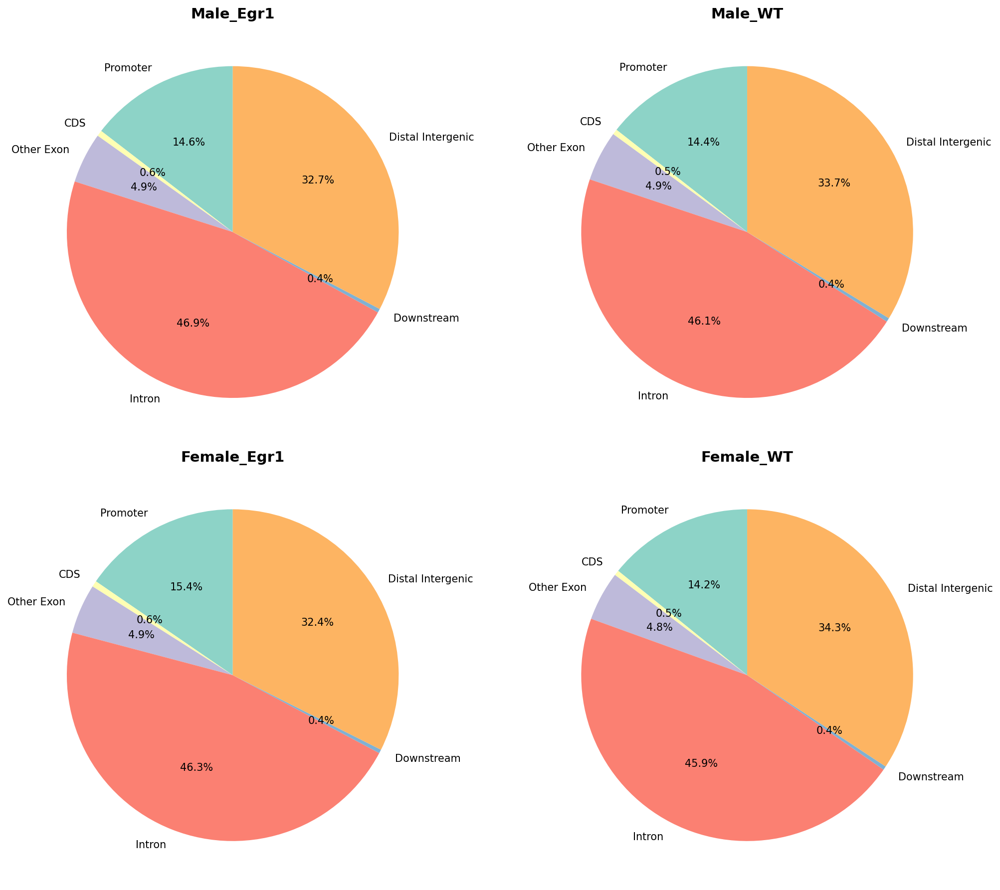

Saved insertion_feature_pies.pdf


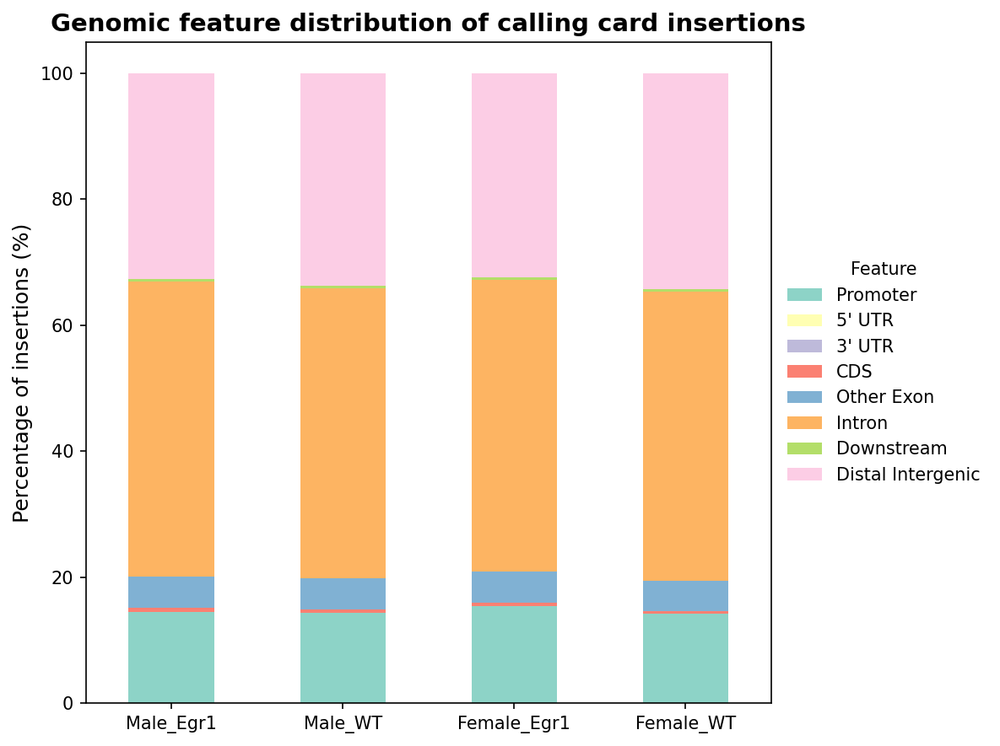

Saved insertion_feature_stacked_bar.pdf


In [51]:
"""
Genomic feature distribution of calling card insertions (Python version)
=========================================================================

Uses the qbed DataFrames already loaded in your notebook environment:
  Male_Egr1, Male_WT, Female_Egr1, Female_WT
(loaded earlier via cc.rd.read_qbed)

Hierarchically classifies every insertion into one of:
  Promoter (TSS −2 kb to +500 bp)
  5' UTR
  3' UTR
  CDS (coding exon)
  Other Exon (non-CDS, non-UTR exonic — mostly ncRNA exons)
  Intron
  Downstream (≤300 bp 3' of TES)
  Distal Intergenic

Priority order is the listing above — first match wins.

Outputs:
  insertion_feature_percentages.csv  — Feature × Sample % matrix
  insertion_feature_pies.pdf          — 2×2 grid of pies, one per sample
  insertion_feature_stacked_bar.pdf   — stacked bar comparison across samples
"""

import os
import urllib.request
import pandas as pd
import pyranges as pr
import matplotlib.pyplot as plt

# =============================================================================
# Inputs — qbed DataFrames already loaded in the notebook
# =============================================================================

QBED_DFS = {
    "Male_Egr1":   Male_Egr1,
    "Male_WT":     Male_WT,
    "Female_Egr1": Female_Egr1,
    "Female_WT":   Female_WT,
}

GTF_PATH = "gencode.vM25.annotation.gtf.gz"
GTF_URL  = ("https://ftp.ebi.ac.uk/pub/databases/gencode/"
            "Gencode_mouse/release_M25/gencode.vM25.annotation.gtf.gz")

PROMOTER_UPSTREAM   = 2000
PROMOTER_DOWNSTREAM = 500
DOWNSTREAM_DISTANCE = 300

# =============================================================================
# Step 1. Download GENCODE GTF (one-time, ~30 MB)
# =============================================================================

if not os.path.exists(GTF_PATH):
    print(f"Downloading {GTF_URL} ...")
    urllib.request.urlretrieve(GTF_URL, GTF_PATH)

# =============================================================================
# Step 2. Build feature classes from the GTF
# =============================================================================

print("Loading GTF (this takes ~1 min)...")
gtf = pr.read_gtf(GTF_PATH)

genes = gtf[gtf.Feature == "gene"]
exons = gtf[gtf.Feature == "exon"]
cds   = gtf[gtf.Feature == "CDS"]
utr5  = gtf[gtf.Feature == "five_prime_utr"]
utr3  = gtf[gtf.Feature == "three_prime_utr"]


def make_promoters(genes_pr, up, down):
    """Build promoter regions around each TSS, strand-aware."""
    df = genes_pr.df.copy()
    plus  = df[df.Strand == "+"].copy()
    minus = df[df.Strand == "-"].copy()

    plus["new_start"]  = (plus["Start"] - up).clip(lower=0)
    plus["new_end"]    = plus["Start"] + down
    minus["new_start"] = (minus["End"] - down).clip(lower=0)
    minus["new_end"]   = minus["End"] + up

    out = pd.concat([
        plus.assign(Start=plus.new_start,  End=plus.new_end),
        minus.assign(Start=minus.new_start, End=minus.new_end),
    ])[["Chromosome", "Start", "End", "Strand"]]

    return pr.PyRanges(out)


def make_downstream(genes_pr, dist):
    """Build downstream regions (TES → TES + dist), strand-aware."""
    df = genes_pr.df.copy()
    plus  = df[df.Strand == "+"].copy()
    minus = df[df.Strand == "-"].copy()

    plus["new_start"]  = plus["End"]
    plus["new_end"]    = plus["End"] + dist
    minus["new_start"] = (minus["Start"] - dist).clip(lower=0)
    minus["new_end"]   = minus["Start"]

    out = pd.concat([
        plus.assign(Start=plus.new_start,  End=plus.new_end),
        minus.assign(Start=minus.new_start, End=minus.new_end),
    ])[["Chromosome", "Start", "End", "Strand"]]

    return pr.PyRanges(out)


print("Building feature intervals...")
promoters  = make_promoters(genes, PROMOTER_UPSTREAM, PROMOTER_DOWNSTREAM)
downstream = make_downstream(genes, DOWNSTREAM_DISTANCE)
introns    = genes.subtract(exons)   # gene body minus exons

# Priority order: first match wins
FEATURE_PRIORITY = [
    ("Promoter",   promoters),
    ("5' UTR",     utr5),
    ("3' UTR",     utr3),
    ("CDS",        cds),
    ("Other Exon", exons),       # catches ncRNA exons that aren't CDS/UTR
    ("Intron",     introns),
    ("Downstream", downstream),
]

# =============================================================================
# Step 3. Hierarchical classification of insertions
# =============================================================================

def classify_insertions(qbed_df, feature_priority, sample_name):
    """Classify each row of the qbed DataFrame into one feature category."""
    print(f"  {sample_name}: {len(qbed_df):,} insertions")

    # Normalize chromosome column name (cc.rd.read_qbed uses 'Chr')
    df = qbed_df.copy()
    if "Chr" in df.columns and "Chromosome" not in df.columns:
        df = df.rename(columns={"Chr": "Chromosome"})

    df = df[["Chromosome", "Start", "End"]].reset_index(drop=True)
    df["_idx"] = df.index
    df["Category"] = None

    for cat_name, feature_pr in feature_priority:
        if len(feature_pr.df) == 0:
            continue

        unclassified = df[df["Category"].isnull()]
        if len(unclassified) == 0:
            break

        ins_pr = pr.PyRanges(unclassified[["Chromosome", "Start", "End", "_idx"]])
        overlapping = ins_pr.overlap(feature_pr).df

        if len(overlapping) > 0 and "_idx" in overlapping.columns:
            hit_idx = overlapping["_idx"].unique()
            df.loc[df["_idx"].isin(hit_idx), "Category"] = cat_name

    df["Category"] = df["Category"].fillna("Distal Intergenic")
    return df


print("\nClassifying insertions...")
all_results = {}
for sample, qbed_df in QBED_DFS.items():
    print(f"\n{sample}:")
    classified = classify_insertions(qbed_df, FEATURE_PRIORITY, sample)
    counts = classified["Category"].value_counts()
    pcts = (counts / counts.sum() * 100).round(2)
    all_results[sample] = pcts

# =============================================================================
# Step 4. Output table & plots
# =============================================================================

row_order = [name for name, _ in FEATURE_PRIORITY] + ["Distal Intergenic"]

results_df = pd.DataFrame(all_results).reindex(row_order).fillna(0)

print("\n=== Cumulative percentages by sample ===")
print(results_df)

results_df.to_csv("insertion_feature_percentages.csv")
print("\nSaved insertion_feature_percentages.csv")

# --- Pie charts ---------------------------------------------------------------

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()
colors = plt.cm.Set3.colors

for ax, (name, pcts) in zip(axes, all_results.items()):
    pcts_sorted = pcts.reindex(row_order).fillna(0)
    pcts_sorted = pcts_sorted[pcts_sorted > 0]
    ax.pie(pcts_sorted.values, labels=pcts_sorted.index,
           autopct="%1.1f%%", colors=colors, startangle=90)
    ax.set_title(name, fontsize=14, fontweight="bold")

plt.tight_layout()
plt.savefig("insertion_feature_pies.pdf", bbox_inches="tight")
plt.show()
print("Saved insertion_feature_pies.pdf")

# --- Stacked bar comparison ---------------------------------------------------

fig, ax = plt.subplots(figsize=(8, 6))
results_df.T.plot(kind="bar", stacked=True, ax=ax,
                  color=colors[:len(results_df)])
ax.set_ylabel("Percentage of insertions (%)", fontsize=12)
ax.set_xlabel("")
ax.set_title("Genomic feature distribution of calling card insertions",
             fontsize=14, fontweight="bold")
ax.legend(loc="center left", bbox_to_anchor=(1.0, 0.5),
          title="Feature", frameon=False)
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig("insertion_feature_stacked_bar.pdf", bbox_inches="tight")
plt.show()
print("Saved insertion_feature_stacked_bar.pdf")


# compare with chip seq

Loaded 11,977 Egr1 ChIP-seq peaks

=== Observed overlap with Egr1 ChIP-seq ===
  Shared         13,951 peaks     7.8% overlap
  Male-biased       797 peaks     8.4% overlap
  Female-biased   1,024 peaks    21.0% overlap

=== Shuffled control (20 permutations per category) ===
  Shared           0.3% ± 0.04%
  Male-biased      0.4% ± 0.17%
  Female-biased    0.4% ± 0.16%

=== Summary ===
     Category  n_CC_peaks  Observed_pct  Shuffled_mean_pct  Shuffled_std_pct  Fold_enrichment  Empirical_p
       Shared       13951          7.80               0.33              0.04            23.86     0.047619
  Male-biased         797          8.41               0.40              0.17            20.94     0.047619
Female-biased        1024         21.00               0.37              0.16            57.33     0.047619


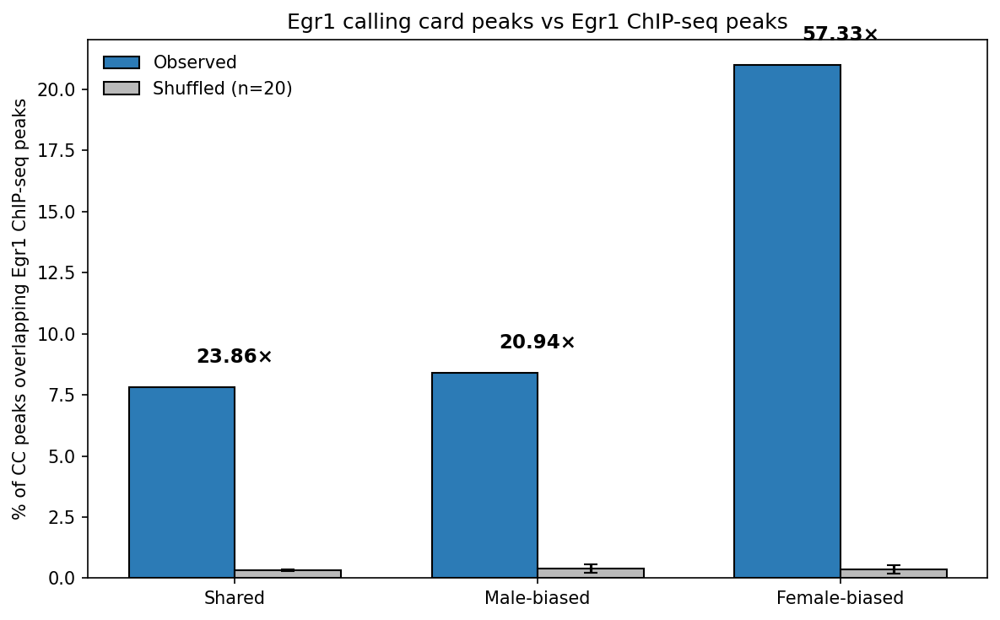

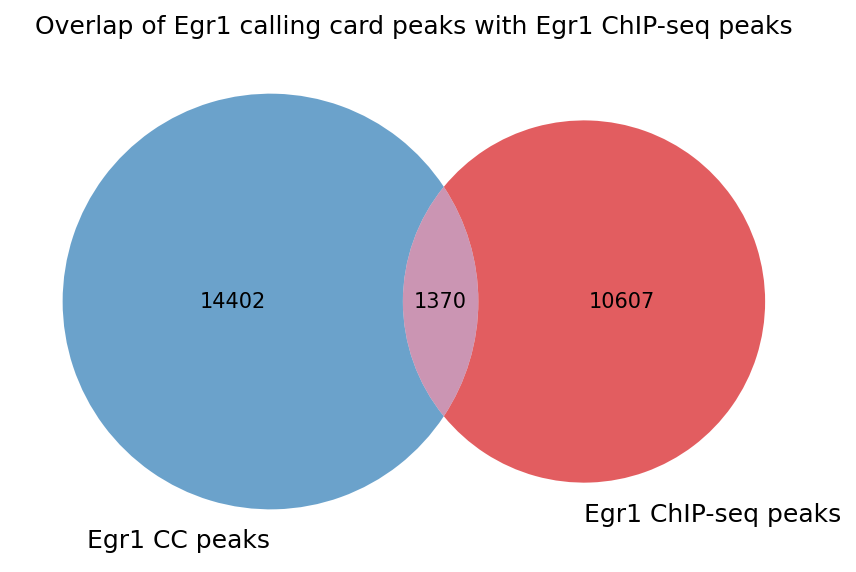


Done. Saved:
  CC_vs_Egr1_ChIP_overlap_table.csv
  CC_vs_Egr1_ChIP_overlap_bar.pdf
  CC_vs_Egr1_ChIP_venn.pdf


In [54]:
"""
Validate Egr1 calling card peaks against published mouse Egr1 ChIP-seq peaks.

For each CC peak category (shared, male-biased, female-biased), compute:
  - % of CC peaks that overlap an Egr1 ChIP-seq peak (observed)
  - Same metric on a shuffled peak set of identical size distribution (expected)
  - Fold-enrichment = observed / expected

Outputs:
  CC_vs_Egr1_ChIP_overlap_table.csv  — full numbers
  CC_vs_Egr1_ChIP_overlap_bar.pdf     — observed vs shuffled bar chart
  CC_vs_Egr1_ChIP_venn.pdf            — Venn of all CC peaks vs ChIP peaks
"""

import pandas as pd
import pyranges as pr
import pybedtools
import matplotlib.pyplot as plt
import numpy as np
from matplotlib_venn import venn2

# =============================================================================
# Inputs
# =============================================================================

CHIP_PATH = ("/lts/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/"
             "101524_Egr1CC_analysis/pycallingcards/Mouse_Egr1_ChIP_annotated.txt")

CC_BEDS = {
    "Shared":        "shared_peaks_asInBrd4Paper.bed",
    "Male-biased":   "male_biased_peaks_asInBrd4Paper.bed",
    "Female-biased": "female_biased_peaks_asInBrd4Paper.bed",
}

CHROM_SIZES = "mm10.chrom.sizes"   # you already have this from the bedgraph step
N_SHUFFLES = 20                     # number of permutations for the random control
SEED_BASE  = 12345

# =============================================================================
# 1. Load Egr1 ChIP peaks
# =============================================================================

chip_df = pd.read_csv(CHIP_PATH, sep="\t")

# Auto-detect chromosome column
chr_col   = next((c for c in ["Chr", "Chromosome", "chr", "chrom"]
                  if c in chip_df.columns), None)
start_col = next((c for c in ["Start", "start"] if c in chip_df.columns), None)
end_col   = next((c for c in ["End",   "end"]   if c in chip_df.columns), None)

if not all([chr_col, start_col, end_col]):
    raise ValueError(
        f"Couldn't find chrom/start/end columns. Got: {chip_df.columns.tolist()}"
    )

chip_pr = pr.PyRanges(
    chip_df[[chr_col, start_col, end_col]].rename(
        columns={chr_col: "Chromosome", start_col: "Start", end_col: "End"}
    )
)
print(f"Loaded {len(chip_pr):,} Egr1 ChIP-seq peaks")

# Save as a clean BED for shuffle comparisons later
chip_pr.df.to_csv("Mouse_Egr1_ChIP.bed", sep="\t",
                  header=False, index=False)

# =============================================================================
# 2. Compute observed overlap per CC category
# =============================================================================

def overlap_pct(query_pr, target_pr):
    if len(query_pr) == 0:
        return 0.0
    return 100 * len(query_pr.overlap(target_pr)) / len(query_pr)

cc_prs = {cat: pr.read_bed(path) for cat, path in CC_BEDS.items()}

print("\n=== Observed overlap with Egr1 ChIP-seq ===")
observed = {}
for cat, cc_pr in cc_prs.items():
    pct = overlap_pct(cc_pr, chip_pr)
    observed[cat] = pct
    print(f"  {cat:<14} {len(cc_pr):>6,} peaks   {pct:5.1f}% overlap")

# =============================================================================
# 3. Shuffle-based random control
# =============================================================================

def shuffled_overlap_pcts(cc_bed_path, chip_pr, chrom_sizes,
                          n_shuffles, seed_base):
    cc_bt = pybedtools.BedTool(cc_bed_path)
    n_total = cc_bt.count()
    pcts = []
    for i in range(n_shuffles):
        shuffled = cc_bt.shuffle(genome="mm10", chrom=True, seed=seed_base + i)
        shuffled_pr = pr.PyRanges(
            shuffled.to_dataframe(names=["Chromosome", "Start", "End"]))
        n_hit = len(shuffled_pr.overlap(chip_pr))
        pcts.append(100 * n_hit / n_total if n_total else 0)
    return np.array(pcts)

print(f"\n=== Shuffled control ({N_SHUFFLES} permutations per category) ===")
shuffled = {}
for cat, bed_path in CC_BEDS.items():
    pcts = shuffled_overlap_pcts(bed_path, chip_pr, CHROM_SIZES,
                                 N_SHUFFLES, SEED_BASE)
    shuffled[cat] = pcts
    print(f"  {cat:<14} {pcts.mean():5.1f}% ± {pcts.std():4.2f}%")

# =============================================================================
# 4. Build summary table with fold-enrichment and empirical p-value
# =============================================================================

rows = []
for cat in CC_BEDS:
    obs   = observed[cat]
    sh    = shuffled[cat]
    sh_mu = sh.mean()
    sh_sd = sh.std()
    fe    = obs / sh_mu if sh_mu > 0 else np.nan
    # Empirical one-sided p: fraction of shuffles >= observed
    p_emp = (np.sum(sh >= obs) + 1) / (len(sh) + 1)
    rows.append({
        "Category": cat,
        "n_CC_peaks": len(cc_prs[cat]),
        "Observed_pct": round(obs, 2),
        "Shuffled_mean_pct": round(sh_mu, 2),
        "Shuffled_std_pct": round(sh_sd, 2),
        "Fold_enrichment": round(fe, 2) if not np.isnan(fe) else None,
        "Empirical_p": p_emp,
    })

summary = pd.DataFrame(rows)
summary.to_csv("CC_vs_Egr1_ChIP_overlap_table.csv", index=False)
print("\n=== Summary ===")
print(summary.to_string(index=False))

# =============================================================================
# 5. Bar chart: observed vs shuffled
# =============================================================================

fig, ax = plt.subplots(figsize=(8, 5))
cats = list(CC_BEDS.keys())
x    = np.arange(len(cats))
w    = 0.35

obs_vals  = [observed[c] for c in cats]
sh_means  = [shuffled[c].mean() for c in cats]
sh_stds   = [shuffled[c].std()  for c in cats]

ax.bar(x - w/2, obs_vals, w, label="Observed",
       color="#2c7bb6", edgecolor="black")
ax.bar(x + w/2, sh_means, w, yerr=sh_stds, capsize=4,
       label=f"Shuffled (n={N_SHUFFLES})",
       color="#bababa", edgecolor="black")

ax.set_xticks(x)
ax.set_xticklabels(cats)
ax.set_ylabel("% of CC peaks overlapping Egr1 ChIP-seq peaks")
ax.set_title("Egr1 calling card peaks vs Egr1 ChIP-seq peaks")
ax.legend(frameon=False)

# Add fold-enrichment text above each pair
for i, cat in enumerate(cats):
    fe = summary.loc[summary["Category"] == cat, "Fold_enrichment"].values[0]
    if fe is not None:
        ymax = max(obs_vals[i], sh_means[i] + sh_stds[i])
        ax.text(i, ymax + 1, f"{fe}×", ha="center", fontsize=11,
                fontweight="bold")

plt.tight_layout()
plt.savefig("CC_vs_Egr1_ChIP_overlap_bar.pdf", bbox_inches="tight")
plt.show()

# =============================================================================
# 6. Venn — all CC peaks (union) vs all ChIP peaks
# =============================================================================

cc_union = pr.PyRanges(pd.concat([cc_prs[c].df for c in cc_prs])).merge()

n_cc      = len(cc_union)
n_chip    = len(chip_pr)
n_overlap = len(cc_union.overlap(chip_pr))

plt.figure(figsize=(6, 6))
venn2(
    subsets=(n_cc - n_overlap, n_chip - n_overlap, n_overlap),
    set_labels=("Egr1 CC peaks", "Egr1 ChIP-seq peaks"),
    set_colors=("#2c7bb6", "#d7191c"),
    alpha=0.7,
)
plt.title("Overlap of Egr1 calling card peaks with Egr1 ChIP-seq peaks")
plt.tight_layout()
plt.savefig("CC_vs_Egr1_ChIP_venn.pdf", bbox_inches="tight")
plt.show()

print("\nDone. Saved:")
print("  CC_vs_Egr1_ChIP_overlap_table.csv")
print("  CC_vs_Egr1_ChIP_overlap_bar.pdf")
print("  CC_vs_Egr1_ChIP_venn.pdf")



In [ ]:
______________________________________________________________________________________________________________________________________________

In [14]:
unique_genes_male = pd.concat([
    peak_annotation_Male_100000['Gene Name1']
]).dropna().unique()

print(len(unique_genes_male))


6328


In [15]:
unique_genes_female = pd.concat([
    peak_annotation_Female_20000['Gene Name1']
]).dropna().unique()

print(len(unique_genes_female))


5833


In [16]:
unique_genes_female = pd.concat([
    peak_annotation_Female_100000['Gene Name1']
]).dropna().unique()

print(len(unique_genes_female))


6377


In [17]:
import pandas as pd

# Assuming your table is loaded as a DataFrame called df
# Example: df = pd.read_csv("your_file.tsv", sep="\t")

# Get min and max for Distance1 and Distance2
min_dist1 = peak_annotation_Male_100000["Distance1"].min()
max_dist1 = peak_annotation_Male_100000["Distance1"].max()

min_dist2 = peak_annotation_Male_100000["Distance2"].min()
max_dist2 = peak_annotation_Male_100000["Distance2"].max()

print(f"Distance1 -> min: {min_dist1}, max: {max_dist1}")
print(f"Distance2 -> min: {min_dist2}, max: {max_dist2}")



Distance1 -> min: -99518, max: 99905
Distance2 -> min: -1931292, max: 2412546


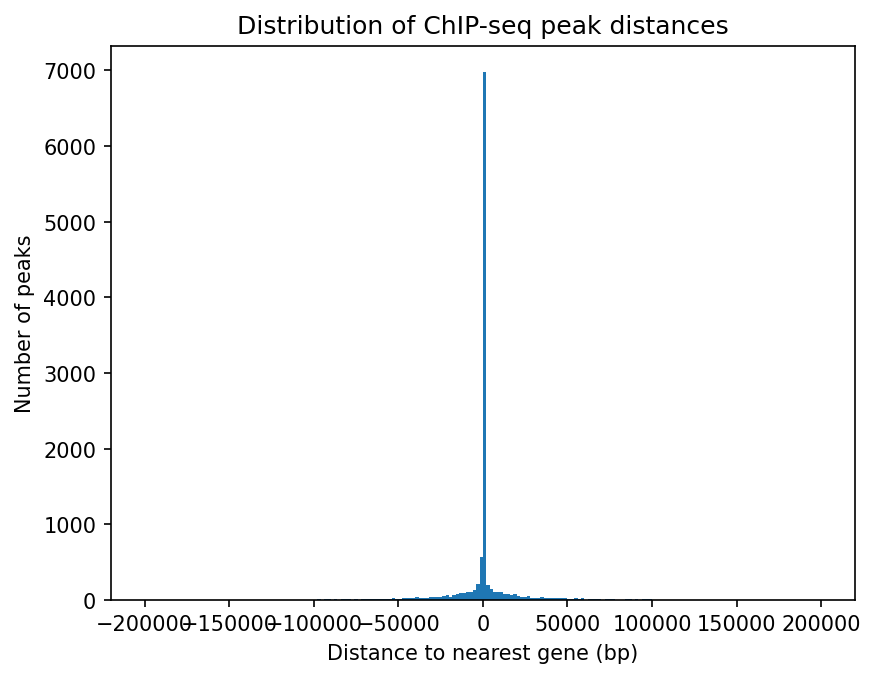

In [18]:
import matplotlib.pyplot as plt

plt.hist(peak_annotation_Male_100000["Distance1"], bins=200, range=(-200000, 200000))  # zoom into ±200 kb
plt.xlabel("Distance to nearest gene (bp)")
plt.ylabel("Number of peaks")
plt.title("Distribution of ChIP-seq peak distances")
plt.show()


In [19]:
import pandas as pd

# Assuming your annotated peaks are in a DataFrame called df
# Example: df = pd.read_csv("your_annotated_peaks.tsv", sep="\t")

# Count how many are > 10kb from the nearest gene
count_over_10kb = (peak_annotation_Male["Distance1"].abs() > 5000).sum()

# Optionally calculate the fraction
fraction_over_10kb = count_over_10kb / len(peak_annotation_Male)

print(f"Number of peaks >10kb from nearest gene: {count_over_10kb}")
print(f"Fraction of total peaks: {fraction_over_10kb:.2%}")


Number of peaks >10kb from nearest gene: 3876
Fraction of total peaks: 32.36%


In [ ]:
# Visuazize peaks if needed:
qbed = {"Male_Egr1": Male_Egr1, "Male_WT": Male_WT, "Female_Egr1": Female_Egr1, "Female_WT": Female_WT}
bed = {"peak_Male": peak_data_Male, "peak_Female": peak_data_Female}
cc.pl.WashU_browser_url(qbed = qbed, bed = bed, genome = 'mm10')

## Based on previous analyses, I will keep going only with Neg1.

In [21]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# MALES
# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg2_vs_Male_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes G2 vs Neg1:", len(KD_M_1))

# FEMALES
# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg2_vs_Female_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes G2 vs Neg1:", len(KD_F_1))


Male genes G2 vs Neg1: 268
Female genes G2 vs Neg1: 341


#### Get overlap lists for Egr1 CC 1st and 2nd nearest genes identified in 1) above, and overlap with DE comparisons with Neg1 control.

In [64]:
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Neg1_090825.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Number of overlapping genes: 119
['Bmp4', 'Ccbe1', 'Col2a1', 'Ccdc88b', 'Hmox1']


In [65]:
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Neg1_090825.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Number of overlapping genes: 134
['Slit3', 'Mpv17l', 'Ets2', 'Fam180a', 'Acss1']


In [66]:
"Egr2" in overlap_genes1


True

#### Make Venn Diagrams

In [67]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 20kb NearestGene'
set2_name = 'Male_Egr1KD Neg1_090825'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 119
['Bmp4', 'Ccbe1', 'Col2a1', 'Ccdc88b', 'Hmox1']
Percent of overlapping genes: 44.91


In [68]:
# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 20kb NearestGene'
set2_name = 'Female_Egr1KD Neg1_90825'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 134
['Slit3', 'Mpv17l', 'Ets2', 'Fam180a', 'Acss1']
Percent of overlapping genes: 39.53


## Running Enrichr in R. Here run Fisher's exact test.

In [69]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg2_vs_Male_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg2_vs_Female_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))


Male All Genes: 11790
Male genes: 268
Male genes NOT DE: 11522
Female All Genes: 11623
Female genes: 341
Female genes NOT DE: 11282


In [70]:
from scipy.stats import fisher_exact

In [71]:
# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")



Male Fisher's Exact Test p-value: 3.3181e-04
Odds ratio: 1.5490
Contingency table: [[119, 146], [3946, 7499]]


In [73]:
# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Female Fisher's Exact Test p-value: 1.5797e-01
Odds ratio: 1.1269
Contingency table: [[134, 205], [4113, 7091]]


# 090925

### Overlapping CC with Egr1KD rerun with only removing outliers, removing Neg2, combining both Egr1 targeting guides as one sample, and only doing minimal filtering (CPM > 1, in at leat 1 sample).
### Code in Egr1KD_again_ButCombineEgr1KDsamples_only0filteredout_removeOutliers.Rmd

In [24]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# MALES
# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes G2 vs Neg1:", len(KD_M_1))

# FEMALES
# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes G2 vs Neg1:", len(KD_F_1))


Male genes G2 vs Neg1: 505
Female genes G2 vs Neg1: 627


In [25]:
#### Get overlap lists for Egr1 CC 1st and 2nd nearest genes identified in 1) above, and overlap with DE comparisons with Neg1 control.

set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Neg1_090925.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Neg1_090925.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Number of overlapping genes: 208
['Arhgef9', 'Fbxo32', 'Hdac11', 'Slc41a2', 'Pcmtd1']
Number of overlapping genes: 242
['Abcb1b', 'Calcoco1', 'Lrp5', 'Dact2', 'Dner']


#### Make Venn Diagrams

In [26]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 20kb NearestGene'
set2_name = 'Male_Egr1KD Neg1_090925'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 20kb NearestGene'
set2_name = 'Female_Egr1KD Neg1_90925'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 208
['Arhgef9', 'Fbxo32', 'Hdac11', 'Slc41a2', 'Pcmtd1']
Percent of overlapping genes: 41.6
Number of overlapping genes: 242
['Abcb1b', 'Calcoco1', 'Lrp5', 'Dact2', 'Dner']
Percent of overlapping genes: 38.72


## Running Enrichr in R. Here run Fisher's exact test.

In [22]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 12865
Male genes: 505
Male genes NOT DE: 12360
Female All Genes: 12865
Female genes: 627
Female genes NOT DE: 12238
Male Fisher's Exact Test p-value: 1.8209e-04
Odds ratio: 1.4022
Contingency table: [[208, 292], [4129, 8128]]
Female Fisher's Exact Test p-value: 6.3921e-02
Odds ratio: 1.1414
Contingency table: [[242, 383], [4323, 7809]]


# Run it again but without removing outliers

In [27]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# MALES
# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun2.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes G2 vs Neg1:", len(KD_M_1))

# FEMALES
# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun2.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes G2 vs Neg1:", len(KD_F_1))
#### Get overlap lists for Egr1 CC 1st and 2nd nearest genes identified in 1) above, and overlap with DE comparisons with Neg1 control.

set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Neg1_090925_2.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Neg1_090925_2.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes G2 vs Neg1: 529
Female genes G2 vs Neg1: 730
Number of overlapping genes: 215
['Arhgef9', 'Cftr', 'Myo6', 'Fbxo32', 'Sprr3']
Number of overlapping genes: 264
['Abcb1b', 'Fbxo32', 'Calcoco1', 'Spink2', 'Lrp5']


#### Make Venn Diagrams

In [28]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 20kb NearestGene'
set2_name = 'Male_Egr1KD Neg1_090925_2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 20kb NearestGene'
set2_name = 'Female_Egr1KD Neg1_90925_2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 215
['Arhgef9', 'Cftr', 'Myo6', 'Fbxo32', 'Sprr3']
Percent of overlapping genes: 40.95
Number of overlapping genes: 264
['Abcb1b', 'Fbxo32', 'Calcoco1', 'Spink2', 'Lrp5']
Percent of overlapping genes: 36.36


## Running Enrichr in R. Here run Fisher's exact test.

In [29]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun2.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun2.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 13039
Male genes: 529
Male genes NOT DE: 12510
Female All Genes: 13039
Female genes: 730
Female genes NOT DE: 12309
Male Fisher's Exact Test p-value: 2.2407e-04
Odds ratio: 1.3853
Contingency table: [[215, 310], [4137, 8263]]
Female Fisher's Exact Test p-value: 3.1456e-01
Odds ratio: 1.0422
Contingency table: [[264, 462], [4320, 7879]]


# FINAL TRY

# Run it again but WITH removing outliers and filtering lowly expressed genes

In [30]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# MALES
# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes G2 vs Neg1:", len(KD_M_1))

# FEMALES
# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes G2 vs Neg1:", len(KD_F_1))
#### Get overlap lists for Egr1 CC 1st and 2nd nearest genes identified in 1) above, and overlap with DE comparisons with Neg1 control.

set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_20kb_NearestGene_vs_Neg1_090925_3.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_20kb_NearestGene_vs_Neg1_090925_3.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Male genes G2 vs Neg1: 487
Female genes G2 vs Neg1: 610
Number of overlapping genes: 203
['Arhgef9', 'Fbxo32', 'Slc41a2', 'Pcmtd1', 'Tceanc']
Number of overlapping genes: 241
['Abcb1b', 'Calcoco1', 'Lrp5', 'Dact2', 'Dner']


#### Make Venn Diagrams

In [31]:
# Filter gene sets
set1 = peak_annotation_Male_20000['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 20kb NearestGene'
set2_name = 'Male_Egr1KD Neg1_090925_3'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female_20000['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 20kb NearestGene'
set2_name = 'Female_Egr1KD Neg1_90925_3'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 203
['Arhgef9', 'Fbxo32', 'Slc41a2', 'Pcmtd1', 'Tceanc']
Percent of overlapping genes: 41.94
Number of overlapping genes: 241
['Abcb1b', 'Calcoco1', 'Lrp5', 'Dact2', 'Dner']
Percent of overlapping genes: 39.64


## Running Enrichr in R. Here run Fisher's exact test.


In [32]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male_20000['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female_20000['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 11834
Male genes: 487
Male genes NOT DE: 11347
Female All Genes: 11834
Female genes: 610
Female genes NOT DE: 11224
Male Fisher's Exact Test p-value: 1.6320e-03
Odds ratio: 1.3279
Contingency table: [[203, 281], [3977, 7310]]
Female Fisher's Exact Test p-value: 1.3813e-01
Odds ratio: 1.1012
Contingency table: [[241, 367], [4170, 6993]]


# Oh but I forgot, I'm filtering for 20kb. Let's look at all:


In [33]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation_Male.to_csv("Male_Egr1CC_peaks_072825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation_Female.to_csv("Female_Egr1CC_peaks_072825.txt", sep="\t", index=False, header=True)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.743755e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.312868e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,...,90.893664,1.695793e-04,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,...,412.207509,2.482385e-07,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.557115e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.377614e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.157978e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385


In [40]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg_vs_Male_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg_vs_Female_NoTreatg1_DE_vst_filtered_rerun3.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))
from scipy.stats import fisher_exact

# Define sets
cc_genes = set(peak_annotation_Male['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 11834
Male genes: 487
Male genes NOT DE: 11347
Female All Genes: 11834
Female genes: 610
Female genes NOT DE: 11224
Male Fisher's Exact Test p-value: 6.4214e-04
Odds ratio: 1.3582
Contingency table: [[221, 263], [4314, 6973]]
Female Fisher's Exact Test p-value: 3.9357e-02
Odds ratio: 1.1638
Contingency table: [[264, 344], [4436, 6727]]


### Didn't change much

## Let's go back to the original run, and only look at nearest genes. 

In [41]:
# 1) Get Nearest or 2nd Nearest CC peaks. (So both, but only keep unique genes in the list).

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation_Male.to_csv("Male_Egr1CC_peaks_072825.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation_Female.to_csv("Female_Egr1CC_peaks_072825.txt", sep="\t", index=False, header=True)


# Combine Gene Name1 and Gene Name2, drop NaN values, and get unique genes
genes_near_Egr1CC_peaks_Male = pd.concat([
    peak_annotation_Male['Gene Name1'],
    peak_annotation_Male['Gene Name2']
]).dropna().unique()

genes_near_Egr1CC_peaks_Female = pd.concat([
    peak_annotation_Female['Gene Name1'],
    peak_annotation_Female['Gene Name2']
]).dropna().unique()


In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


In [42]:
# 2) Import DE comparisons with Neg1 and also with Neg2.

# Read in Bulk data:
import pandas as pd

# MALES
# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg2_vs_Male_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] < 0.05)]
print("Male genes G2 vs Neg1:", len(KD_M_1))

# FEMALES
# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg2_vs_Female_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] < 0.05)]
print("Female genes G2 vs Neg1:", len(KD_F_1))


Male genes G2 vs Neg1: 268
Female genes G2 vs Neg1: 341


In [43]:
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()     # Calling Cards all genes
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_MaleCC_Nearest_vs_Neg1_090925.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Number of overlapping genes: 133
['Myo6', 'Fbxo32', 'Plk2', 'Tceanc', 'Itgb4']


In [45]:
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()     # Calling Cards all genes
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
# Convert to DataFrame
overlap_df1 = pd.DataFrame(overlap_genes1, columns=['Gene'])
# Save to CSV
overlap_path1 = os.path.join(figure_output_dir, 'overlap_FemaleCC_Nearest_vs_Neg1_090925.csv')
overlap_df1.to_csv(overlap_path1, index=False)
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])

Number of overlapping genes: 150
['Abcb1b', 'Plk2', 'Dner', 'Gsn', 'Tmeff2']


In [46]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks NearestGene'
set2_name = 'Male_Egr1KD Neg1_090925'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set2)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks NearestGene'
set2_name = 'Female_Egr1KD Neg1_90925'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 133
['Myo6', 'Fbxo32', 'Plk2', 'Tceanc', 'Itgb4']
Percent of overlapping genes: 50.19
Number of overlapping genes: 150
['Abcb1b', 'Plk2', 'Dner', 'Gsn', 'Tmeff2']
Percent of overlapping genes: 44.25


In [47]:
# Fisher's 
# Get both DE and Non DE gene lists
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KDg2_vs_Male_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
print("Male All Genes:", len(KD_M))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_DE = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_DE))
KD_M_not_DE = KD_M[~((KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05))]
print("Male genes NOT DE:", len(KD_M_not_DE))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KDg2_vs_Female_NoTreatg1_DE_vst_filtered_common_DEGs_080325.txt', sep='\t')
print("Female All Genes:", len(KD_F))
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_DE = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_DE))
KD_F_not_DE = KD_F[~((KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05))]
print("Female genes NOT DE:", len(KD_F_not_DE))


# Define sets
cc_genes = set(peak_annotation_Male['Gene Name1'].dropna().unique())      # Calling Cards all genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female['Gene Name1'].dropna().unique())       # Calling Cards all genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
# Print results
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Odds ratio: {oddsratio:.4f}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male All Genes: 11790
Male genes: 268
Male genes NOT DE: 11522
Female All Genes: 11623
Female genes: 341
Female genes NOT DE: 11282
Male Fisher's Exact Test p-value: 1.9080e-05
Odds ratio: 1.6855
Contingency table: [[133, 132], [4282, 7163]]
Female Fisher's Exact Test p-value: 3.1896e-02
Odds ratio: 1.2370
Contingency table: [[150, 189], [4379, 6825]]


# I found the old data - Egr1 CC overlap with bulk RNAseq Egr1 KD.ipynb   let's rerun it

In [50]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F))

Male genes: 521
Female genes: 718


In [51]:
# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.743755e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.312868e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,...,90.893664,1.695793e-04,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,...,412.207509,2.482385e-07,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.557115e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.377614e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.157978e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385


In [52]:
# MALES 
# Define sets
cc_genes = set(peak_annotation_Male['Gene Name1'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Male['Gene Name2'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Male Fisher's Exact Test p-value 2nd Closest Gene: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

#FEMALES
# Define sets
cc_genes = set(peak_annotation_Female['Gene Name1'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
expected = len(de_genes | non_de_genes)
actual = a + b + c + d
if expected != actual:
    print(f"⚠️ Universe size mismatch: expected {expected}, got {actual}")

# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female['Gene Name2'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
expected = len(de_genes | non_de_genes)
actual = a + b + c + d
if expected != actual:
    print(f"⚠️ Universe size mismatch: expected {expected}, got {actual}")

# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Female Fisher's Exact Test p-value 2nd Closest Gene: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male Fisher's Exact Test p-value: 1.9080e-05
Contingency table: [[133, 132], [4282, 7163]]
Male Fisher's Exact Test p-value 2nd Closest Gene: 1.3189e-02
Contingency table: [[106, 159], [3803, 7642]]
Female Fisher's Exact Test p-value: 3.1896e-02
Contingency table: [[150, 189], [4379, 6825]]
Female Fisher's Exact Test p-value 2nd Closest Gene: 1.0109e-01
Contingency table: [[127, 212], [3806, 7398]]


## I think that these peaks were called with the wrong parameters - it might have been called with TTAA p value 0.001 instead of 0.05. Let's rerun it


In [54]:
# Call Peaks separately
peak_data_Male = cc.pp.call_peaks(Male_Egr1, Male_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.05,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.05,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05_090925.bed")
peak_data_Male

peak_data_Female = cc.pp.call_peaks(Female_Egr1, Female_WT, method = "MACCs", reference = "mm10", pvalue_cutoffbg = 0.05,
                             window_size = 300, step_size = 150, pvalue_cutoffTTAA = 0.05,
                             lam_win_size = 1000000, pseudocounts = 0.1, record = True, save = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05_090925.bed")
peak_data_Female

For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 54/54 [21:40<00:00, 24.09s/it]  


For the MACCs method with background, [expdata, background, reference, pvalue_cutoffbg, pvalue_cutoffTTAA, lam_win_size, window_size, step_size, extend, pseudocounts, test_method, min_insertions, record] would be utilized.


100%|██████████| 53/53 [13:00<00:00, 14.72s/it] 


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,TPH Experiment,Fraction background,TPH background,TPH background subtracted,pvalue_adj Reference
0,chr1,4808478,4809048,4808845.0,5,3,5,2.941727e-06,0.048679,0.000004,424.365722,2.000832e-06,200.083235,224.282487,1.343166e-03
1,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,1867.209176,1.200499e-05,1200.499408,666.709768,0.000000e+00
2,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,3819.291496,2.667776e-05,2667.776462,1151.515034,0.000000e+00
3,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,1018.477732,5.335553e-06,533.555292,484.922440,4.730557e-11
4,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,848.731444,5.335553e-06,533.555292,315.176151,1.309216e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14118,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,848.731444,4.001665e-06,400.166469,448.564974,4.544437e-12
14119,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,848.731444,6.669441e-06,666.944115,181.787328,1.373781e-07
14120,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,1018.477732,8.003329e-06,800.332939,218.144794,5.143628e-10
14121,chrX,169898268,169898791,169898468.0,10,9,9,4.302897e-10,0.014625,0.000008,848.731444,6.002497e-06,600.249704,248.481740,3.416187e-07


In [55]:
# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05_090925.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05_090925.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4808478,4809048,4808845.0,5,3,5,2.941727e-06,0.048679,0.000004,...,224.282487,1.343166e-03,NM_008866,Lypla1,+,0,NR_033530,Mrpl15,-,-22753
1,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.730557e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
4,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.309216e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14118,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.544437e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
14119,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.373781e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
14120,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.143628e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385
14121,chrX,169898268,169898791,169898468.0,10,9,9,4.302897e-10,0.014625,0.000008,...,248.481740,3.416187e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,76252


In [56]:
# MALES 
# Define sets
cc_genes = set(peak_annotation_Male['Gene Name1'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Male Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Male['Gene Name2'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_M_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_M_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
assert a + b + c + d == len(de_genes | non_de_genes), "Universe mismatch"
# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Male Fisher's Exact Test p-value 2nd Closest Gene: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

#FEMALES
# Define sets
cc_genes = set(peak_annotation_Female['Gene Name1'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
expected = len(de_genes | non_de_genes)
actual = a + b + c + d
if expected != actual:
    print(f"⚠️ Universe size mismatch: expected {expected}, got {actual}")

# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Female Fisher's Exact Test p-value: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")

# Define sets
cc_genes = set(peak_annotation_Female['Gene Name2'].dropna())         # Calling Cards nearest genes
de_genes = set(KD_F_DE['SYMBOL'].dropna())                          # DE genes
non_de_genes = set(KD_F_not_DE['SYMBOL'].dropna())                 # Non-DE genes
# Intersections
a = len(de_genes & cc_genes)             # DE + CC overlap
b = len(de_genes - cc_genes)             # DE, no CC
c = len(non_de_genes & cc_genes)         # Non-DE + CC overlap
d = len(non_de_genes - cc_genes)         # Non-DE, no CC
# Check
expected = len(de_genes | non_de_genes)
actual = a + b + c + d
if expected != actual:
    print(f"⚠️ Universe size mismatch: expected {expected}, got {actual}")

# Fisher's test
table = [[a, b], [c, d]]
oddsratio, p_value = fisher_exact(table, alternative='greater')
print(f"Female Fisher's Exact Test p-value 2nd Closest Gene: {p_value:.4e}")
print(f"Contingency table: [[{a}, {b}], [{c}, {d}]]")


Male Fisher's Exact Test p-value: 5.4990e-05
Contingency table: [[147, 118], [4956, 6489]]
Male Fisher's Exact Test p-value 2nd Closest Gene: 9.2058e-03
Contingency table: [[123, 142], [4466, 6979]]
Female Fisher's Exact Test p-value: 5.2512e-02
Contingency table: [[162, 177], [4840, 6364]]
Female Fisher's Exact Test p-value 2nd Closest Gene: 1.6015e-01
Contingency table: [[138, 201], [4246, 6958]]


In [ ]:
Ok, p values are different than p 0.001 for TTAA, but still not -15 

In [ ]:
_______

# Overlap these shared genes with RENIN regulons

In [74]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes_M_nearest = list(set(set1) & set(set2))

# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes_M_2ndnearest = list(set(set1) & set(set2))

# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes_F_nearest = list(set(set1) & set(set2))

# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes_F_2ndnearest = list(set(set1) & set(set2))

## Try overlap with REFSEQ annotations of DE genes 
I converted the ENMSEBL annotations to REFSEQ using Biomart on R in the file Egr1_analysis_Egr1KD_AnalysiswithNeg_gRNA2_Control.Rmd.

In [7]:
# Read in new annotated Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg2_DE_vst_REFSEQ.txt', sep=',')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg2_DE_vst_REFSEQ.txt', sep=',')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F))

Male genes: 164
Female genes: 249


In [10]:
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg2_DE_vst_REFSEQ.txt', sep=',')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
KD_M

,X,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,SYMBOL,refseq_mrna,transcript_is_canonical
72,ENSMUSG00000000489,59.792706,-0.532238,0.107560,-4.948280,7.487219e-07,0.000399,Pdgfb,NM_011057,1.0
116,ENSMUSG00000000794,0.880571,1.952527,0.983904,1.984468,4.720365e-02,0.781675,Kcnn3,NM_080466,1.0
433,ENSMUSG00000002831,5.682247,-0.818391,0.319278,-2.563255,1.036958e-02,0.464812,Plin4,NM_001410167,1.0
477,ENSMUSG00000003153,116.815284,-0.613382,0.198211,-3.094584,1.970889e-03,0.196704,Slc2a3,NM_001410378,1.0
553,ENSMUSG00000003617,16.637293,-0.590736,0.242388,-2.437148,1.480361e-02,0.565764,Cp,NM_001409646,1.0
...,...,...,...,...,...,...,...,...,...,...
18215,ENSMUSG00000103164,0.939504,2.283099,0.944202,2.418020,1.560524e-02,0.579526,Gm38150,NaN,NaN
18232,ENSMUSG00000103285,1.193122,2.423035,0.948870,2.553601,1.066153e-02,0.466442,Gm37274,NaN,NaN
18241,ENSMUSG00000103343,0.428349,-2.098688,1.017306,-2.062986,3.911391e-02,NaN,Gm37052,NaN,NaN
18623,ENSMUSG00000105201,5.599184,-1.005219,0.440145,-2.283834,2.238129e-02,0.645274,Gm43362,NaN,NaN


In [11]:
len(KD_M['refseq_mrna'].dropna().unique())

120

In [12]:
len(KD_F['refseq_mrna'].dropna().unique())

198

In [16]:
peak_annotation_Male

,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4784900,4785471,4785220.0,31,17,6,0.000000e+00,1.620815e-02,0.000015,...,593.584886,0.000000e+00,NR_033530,Mrpl15,-,0,NM_008866,Lypla1,+,22422
1,chr1,4857269,4857866,4857663.0,42,20,4,0.000000e+00,4.625315e-04,0.000020,...,963.139907,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
2,chr1,4858460,4859513,4858781.0,49,21,11,0.000000e+00,1.886541e-05,0.000023,...,1245.958982,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
3,chr1,4916025,4916592,4916389.0,9,3,5,1.477386e-10,1.421251e-02,0.000004,...,273.774581,1.198626e-07,NM_001290372,Rgs20,-,0,NM_011541,Tcea1,+,-18117
4,chr1,6215285,6215688,6215485.0,13,5,2,0.000000e+00,2.387176e-03,0.000006,...,360.510528,0.000000e+00,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11972,chrY,1010650,1011053,1010850.0,6,0,4,1.737513e-08,1.818001e-11,0.000003,...,287.341322,1.087454e-05,NM_012011,Eif2s3y,+,0,NR_027507,Tspy-ps,-,44711
11973,chrY,4389185,4389754,4389516.0,5,4,17,4.358508e-08,4.730544e-02,0.000002,...,29.801232,2.588767e-05,NM_001166384,Rbmy,+,-605915,NM_001166384,Rbmy,-,-979019
11974,chrY,4390332,4390889,4390554.0,5,1,15,3.170588e-08,1.040715e-04,0.000002,...,187.038634,1.917295e-05,NM_001166384,Rbmy,+,-607062,NM_001166384,Rbmy,-,-980166
11975,chrY,42511500,42512135,42511800.5,6,1,9,8.117140e-11,2.004553e-05,0.000003,...,234.928854,6.789101e-08,NR_038299,Gm20871,+,418188,NR_038299,Gm20871,+,1440037


### Overlap with Calling Card data

In [17]:
# Filter gene sets
set1 = peak_annotation_Male['Nearest Refseq1'].dropna().unique()
set2 = KD_M['refseq_mrna'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene W300P05'
set2_name = 'Male_Egr1KD Neg2 REFSEQ'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Nearest Refseq2'].dropna().unique()
set2 = KD_M['refseq_mrna'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene W300P05'
set2_name = 'Male_Egr1KD Neg2 REFSEQ'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()



# Filter gene sets
set1 = peak_annotation_Female['Nearest Refseq1'].dropna().unique()
set2 = KD_F['refseq_mrna'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene W300P05'
set2_name = 'Female_Egr1KD Neg2 REFSEQ'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Nearest Refseq2'].dropna().unique()
set2 = KD_F['refseq_mrna'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene W300P05'
set2_name = 'Female_Egr1KD Neg2 REFSEQ'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 40
['NM_175105', 'NM_001271386', 'NM_198111', 'NM_008873', 'NM_007494']
Percent of overlapping genes: 0.6
Number of overlapping genes: 28
['NM_153287', 'NM_001113421', 'NM_198111', 'NM_008873', 'NM_001271709']
Percent of overlapping genes: 0.39
Number of overlapping genes: 62
['NM_172463', 'NM_001081235', 'NM_027695', 'NM_153143', 'NM_001327998']
Percent of overlapping genes: 0.92
Number of overlapping genes: 47
['NM_001113198', 'NM_013654', 'NM_024198', 'NM_010118', 'NM_001004176']
Percent of overlapping genes: 0.64


### Conclusion: I loose too many genes due to change in annotation. I am not going to use this. 

# 062025

# Let’s look at overlap of Egr1 KD enriched genes and Egr1 ChIP seq. Is there more overlap in the Neg2 vs Egr1KD comparison than in the Neg1 vs Egr1KD comparison?

Neg2 comparison:

In [6]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
#KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
#print("Male genes:", len(KD_M))
# Get Egr1 enriched genes:
KD_M = KD_M[(KD_M['log2FoldChange'] >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
#KD_F = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
KD_F = KD_F[(KD_F['log2FoldChange'] >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F))

Male genes: 60
Female genes: 159


Neg1 comparison:

In [7]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
#KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'] >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
#KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'] >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))

Male genes: 390
Female genes: 548


In [24]:
# Filter gene sets
set1 = KD_M_1['SYMBOL'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_Egr1KD Neg1 Egr1KDGENES'
set2_name = 'Male_Egr1KD Neg2 Egr1KDGENES'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = KD_F_1['SYMBOL'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_Egr1KD Neg1 Egr1KDGENES'
set2_name = 'Female_Egr1KD Neg2 Egr1KDGENES'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()



Number of overlapping genes: 11
['Ankrd29', 'Cldn1', 'Cib2', 'Magi2', 'Slc7a2']
Percent of overlapping genes: 2.84
Number of overlapping genes: 62
['Atf3', 'Mlc1', 'Azin2', 'Nrtn', 'Jph2']
Percent of overlapping genes: 11.4


## What about all DEs?

In [25]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F))

Male genes: 164
Female genes: 249


In [26]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))

Male genes: 521
Female genes: 718


In [27]:
# Filter gene sets
set1 = KD_M_1['SYMBOL'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_Egr1KD Neg1'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = KD_F_1['SYMBOL'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_Egr1KD Neg1'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()



Number of overlapping genes: 39
['Wnt10a', 'Cldn1', 'Nsg1', '1700003F12Rik', 'Ass1']
Percent of overlapping genes: 7.53
Number of overlapping genes: 99
['Atf3', 'Nrtn', 'Klc3', 'Col3a1', 'Ace']
Percent of overlapping genes: 13.88


What is their function?

In [37]:
# Annotate each male biased and female biased peak set and run EnrichR on those genes.
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns
from gseapy import enrichr
from textwrap import wrap

# Filter gene sets
set1 = KD_M_1['SYMBOL'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_Egr1KD Neg1 vs Male_Egr1KD Neg2'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()


# Filter gene sets
set1 = KD_F_1['SYMBOL'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_Egr1KD Neg1 vs Female_Egr1KD Neg2'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()

Number of overlapping genes: 39
['Wnt10a', 'Cldn1', 'Nsg1', '1700003F12Rik', 'Ass1']
Percent of overlapping genes: 7.53


Exception: Error sending gene list, try again later

# Overlap with mouse Egr1 ChIP-seq?

In [30]:
#peak_annotation_combined.to_csv("Mouse_Egr1_ChIP_annotated.txt", sep="\t", index=False, header=True)
import pandas as pd

# Read the tab-separated file
mouse_egr1_chip = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/Mouse_Egr1_ChIP_annotated.txt', sep='\t')
print("mouse_egr1_chip genes:", len(mouse_egr1_chip))

mouse_egr1_chip genes: 11977


In [31]:
mouse_egr1_chip

,Chr,Start,End,IDR (irreproducible discovery rate),Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,3457844,3458094,0.003270,NM_001011874,Xkr4,-,0,NM_001195662,Rp1,-,832752.0
1,chr1,3672134,3672384,0.002956,NM_001011874,Xkr4,-,-637,NM_001195662,Rp1,-,618462.0
2,chr1,4857583,4857847,0.002505,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,481.0
3,chr1,5018227,5018485,0.000008,NM_001290372,Rgs20,-,0,NM_133826,Atp6v1h,+,64601.0
4,chr1,5297706,5297963,0.013769,NM_133826,Atp6v1h,+,-135158,NM_001177795,Rgs20,-,-227422.0
...,...,...,...,...,...,...,...,...,...,...,...,...
11972,chrX,139217605,139217855,0.003426,NM_019397,Egfl6,-,12424,NM_001313758,Prps2,-,0.0
11973,chrX,139392810,139393074,0.005439,NM_133211,Tlr7,-,-52135,NM_001290427,Frmpd4,-,0.0
11974,chrX,139684933,139685183,0.000697,NM_001290428,Frmpd4,-,-267897,NM_001199212,Asmt,+,0.0
11975,chrX,140406173,140406437,0.008684,NM_010797,Mid1,+,-683954,NM_001030293,Spry3,-,-5066.0


In [33]:
KD_M_1

,Unnamed: 0,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,SYMBOL
207,ENSMUSG00000026051,58.543298,0.995079,0.406580,2.447436,1.438767e-02,9.602515e-02,Ecrg4
282,ENSMUSG00000097519,2.217788,-1.136822,0.538290,-2.111914,3.469382e-02,NaN,4930558J18Rik
336,ENSMUSG00000052062,12.964435,0.895193,0.250395,3.575130,3.500535e-04,5.879427e-03,Pard3b
349,ENSMUSG00000027520,2.662891,-1.810497,0.881020,-2.055001,3.987890e-02,NaN,Zdbf2
367,ENSMUSG00000025950,53.331769,0.768297,0.118955,6.458716,1.055952e-10,1.149906e-08,Idh1
...,...,...,...,...,...,...,...,...
17972,ENSMUSG00000025656,4.764294,1.017693,0.451551,2.253769,2.421071e-02,1.361594e-01,Arhgef9
18056,ENSMUSG00000049929,50.316792,0.539707,0.152183,3.546431,3.904867e-04,6.480689e-03,Lpar4
18123,ENSMUSG00000049536,10.158678,0.652455,0.193449,3.372754,7.442048e-04,1.081127e-02,Tceal1
18260,ENSMUSG00000051224,8.566743,0.751159,0.299028,2.511999,1.200496e-02,8.542604e-02,Tceanc


In [36]:
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq NearestGene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name2'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq 2ndNearestGene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()



# Filter gene sets
set1 = mouse_egr1_chip['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq NearestGene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name2'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq 2ndNearestGene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 192
['Renbp', 'Ptk2b', 'Cln3', 'Shc4', 'Macrod2']
Percent of overlapping genes: 2.47
Number of overlapping genes: 195
['Ppp4r1l-ps', 'Adrb2', 'Nr4a3', 'Sytl2', 'Efcab2']
Percent of overlapping genes: 2.48
Number of overlapping genes: 289
['Atf3', 'Peli3', 'Cacna1h', 'Gng7', 'Ggnbp1']
Percent of overlapping genes: 3.71
Number of overlapping genes: 265
['Cacna1h', 'Gng7', 'Il17d', 'Ggnbp1', 'Adrb2']
Percent of overlapping genes: 3.36


In [38]:
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name1'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq NearestGene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name2'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq 2ndNearestGene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()



# Filter gene sets
set1 = mouse_egr1_chip['Gene Name1'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq NearestGene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = mouse_egr1_chip['Gene Name2'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Mouse Egr1 ChIPseq 2ndNearestGene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'{sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 63
['Wnt10a', 'Podn', 'Zfp653', 'Sulf2', 'Pwwp2b']
Percent of overlapping genes: 0.81
Number of overlapping genes: 50
['Wnt10a', 'Podn', 'Zfp653', 'Sulf2', 'Mpzl3']
Percent of overlapping genes: 0.63
Number of overlapping genes: 104
['Atf3', 'Gchfr', 'Pard6b', 'Nrtn', 'Zc3h12a']
Percent of overlapping genes: 1.34
Number of overlapping genes: 88
['Gchfr', 'Nrtn', 'Klc3', 'Pitpnm3', 'Ace']
Percent of overlapping genes: 1.12


# After meeting with Rob on 062025
1) DE in g1 comparison and direct targets of Egr1 DE in g2 comparison and direct targets of Egr1 and look at those overlap

2) write up of qpcr top10 g1 unique and direct targets top10 g2 unique and direct targets top10 shared and direct targets

#### I have done number 1 before:

In [6]:
# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_MaleEgr1_VS_MaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Male = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Male.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Male)

# Read in bed file so I don't have to rerun the code above everytime I open jupyterlab noteboook.
import pandas as pd
# Read BED file into a DataFrame
bed_file = "Egr1CC_peak_FemaleEgr1_VS_FemaleWT_MACC2_window1000_YchromFiltered_window300_p05.bed"
peak_data_Female = pd.read_csv(bed_file, sep='\t', header=None)
# Add column names (optional)
peak_data_Female.columns = ['Chr', 'Start', 'End', 'Center', 'Experiment Insertions', 'Background insertions', 'Reference Insertions', 'pvalue Reference', 'pvalue Background', 'Fraction Experiment', 'TPH Experiment', 'Fraction background', 'TPH background', 'TPH background subtracted', 'pvalue_adj Reference']
#print(peak_data_Male.head())
len(peak_data_Female)

# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.743755e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.312868e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,...,90.893664,1.695793e-04,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,...,412.207509,2.482385e-07,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.557115e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.377614e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.157978e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385


In [3]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M_1 = KD_M_1[(KD_M_1['log2FoldChange'].abs() >= 0.5) & (KD_M_1['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M_1))

# Read the tab-separated file
KD_F_1 = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg1_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F_1 = KD_F_1[(KD_F_1['log2FoldChange'].abs() >= 0.5) & (KD_F_1['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F_1))

Male genes: 521
Female genes: 718


In [22]:
row = KD_M[KD_M['SYMBOL'] == 'Tgfbi']
print(row[['SYMBOL', 'log2FoldChange', 'pvalue', 'padj']])


Empty DataFrame
Columns: [SYMBOL, log2FoldChange, pvalue, padj]
Index: []


In [4]:
# Read in Bulk data:
import pandas as pd

# Read the tab-separated file
KD_M = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Male_Egr1KD_vs_Male_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_M = KD_M[(KD_M['log2FoldChange'].abs() >= 0.5) & (KD_M['pvalue'] <= 0.05)]
print("Male genes:", len(KD_M))

# Read the tab-separated file
KD_F = pd.read_csv('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/pycallingcards/R_work/Female_Egr1KD_vs_Female_NoTreatg2_DE_vst.txt', sep='\t')
# Filter for downregulated genes (log2FC ≤ -0.5 and p-value ≤ 0.05)
KD_F = KD_F[(KD_F['log2FoldChange'].abs() >= 0.5) & (KD_F['pvalue'] <= 0.05)]
print("Female genes:", len(KD_F))

Male genes: 164
Female genes: 249


To confirm results so I know I am running this correctly: 

In [23]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 237
['Mitf', 'Cxcl14', 'Cd276', 'Cbr2', 'Nab2']
Percent of overlapping genes: 3.61
Number of overlapping genes: 182
['Mitf', 'Cxcl14', 'Cd276', 'Serpine1', 'Nab2']
Percent of overlapping genes: 2.63
Number of overlapping genes: 291
['Kcnn2', 'Fkbp5', 'Crct1', 'Cbr2', 'Gsn']
Percent of overlapping genes: 4.41
Number of overlapping genes: 248
['Kcnn2', 'Cxcl14', 'Crct1', 'Gsn', 'Sh3bgr']
Percent of overlapping genes: 3.54


In [24]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 61
['Prag1', 'Nab2', 'Spp1', 'Serpinb1b', 'Cd34']
Percent of overlapping genes: 0.93
Number of overlapping genes: 52
['Prag1', 'Podn', 'Nab2', 'Efcab7', 'Spp1']
Percent of overlapping genes: 0.75
Number of overlapping genes: 91
['Lactb', 'Crct1', 'Nab2', 'Lpar1', 'Fos']
Percent of overlapping genes: 1.38
Number of overlapping genes: 78
['Mitf', 'Lactb', 'Crct1', 'Nab2', '4931414P19Rik']
Percent of overlapping genes: 1.11


##### Overlaps of the overlaps above as per point 1 while renaming overlap_genes terms so I can overlap those below:

In [23]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN1)}")
print(overlap_genesN1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()




# guide 2
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes2)}")
print(overlap_genes2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN2)}")
print(overlap_genesN2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 237
['Afap1l2', 'Cyp1b1', 'Platr22', 'Kif21b', 'Atg10']
Percent of overlapping genes: 3.61
Number of overlapping genes: 182
['Fdps', 'Cyp1b1', 'Slc16a4', 'Deptor', 'Mindy2']
Percent of overlapping genes: 2.63
Number of overlapping genes: 61
['Plau', 'Aig1', 'Cp', 'Pth1r', 'Armc2']
Percent of overlapping genes: 0.93
Number of overlapping genes: 52
['Plau', 'Aig1', 'Kyat3', 'Enpp5', 'Armc2']
Percent of overlapping genes: 0.75


In [24]:
# NEAREST GENES
# Filter gene sets
set1 = overlap_genes1
set2 = overlap_genes2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Guide1 DE+CC Nearest Gene'
set2_name = 'Guide2 DE+CC Nearest Gene'
sample_name = f'{set1_name}_{set2_name}'

df_overlap_genes = pd.DataFrame(overlap_genes, columns=['Gene'])
# Save to a text file
df_overlap_genes.to_csv(f'{sample_name}.txt', sep="\t", index=False, header=True)

venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = overlap_genesN1
set2 = overlap_genesN2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Guide1 DE+CC 2ndNearest Gene'
set2_name = 'Guide2 DE+CC 2ndNearest Gene'
sample_name = f'{set1_name}_{set2_name}'
df_overlap_genes = pd.DataFrame(overlap_genes, columns=['Gene'])
# Save to a text file
df_overlap_genes.to_csv(f'{sample_name}.txt', sep="\t", index=False, header=True)
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 25
['Fos', 'Ass1', 'Slc2a3', 'Egr1', 'Tnnt2']
Percent of overlapping genes: 10.55
Number of overlapping genes: 15
['Acsf2', 'Spry4', 'Magi2', 'Tnnt2', 'Lrp5']
Percent of overlapping genes: 8.24


In [25]:
# Annotate each male biased and female biased peak set and run EnrichR on those genes.
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns
from gseapy import enrichr
from textwrap import wrap

# Filter gene sets
set1 = overlap_genes1
set2 = overlap_genes2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Guide1 vs Guide 2 DE+CC Nearest Gene'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()


# Filter gene sets
set1 = overlap_genesN1
set2 = overlap_genesN2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Guide1 vs Guide 2 DE+CC 2ndNearest Gene'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()

Number of overlapping genes: 25
['Fos', 'Ass1', 'Slc2a3', 'Egr1', 'Tnnt2']
Percent of overlapping genes: 10.55
Number of overlapping genes: 15
['Acsf2', 'Spry4', 'Magi2', 'Tnnt2', 'Lrp5']
Percent of overlapping genes: 8.24


##### females

In [27]:
# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN1)}")
print(overlap_genesN1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()




# guide 2
# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes2)}")
print(overlap_genes2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN2)}")
print(overlap_genesN2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 291
['Kcnn2', 'Fkbp5', 'Crct1', 'Cbr2', 'Gsn']
Percent of overlapping genes: 4.41
Number of overlapping genes: 248
['Kcnn2', 'Cxcl14', 'Crct1', 'Gsn', 'Sh3bgr']
Percent of overlapping genes: 3.54
Number of overlapping genes: 91
['Lactb', 'Crct1', 'Nab2', 'Lpar1', 'Fos']
Percent of overlapping genes: 1.38
Number of overlapping genes: 78
['Mitf', 'Lactb', 'Crct1', 'Nab2', '4931414P19Rik']
Percent of overlapping genes: 1.11


In [12]:
# NEAREST GENES
# Filter gene sets
set1 = overlap_genes1
set2 = overlap_genes2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'F Guide1 DE+CC Nearest Gene'
set2_name = 'F Guide2 DE+CC Nearest Gene'
sample_name = f'{set1_name}_{set2_name}'

df_overlap_genes = pd.DataFrame(overlap_genes, columns=['Gene'])
# Save to a text file
df_overlap_genes.to_csv(f'{sample_name}.txt', sep="\t", index=False, header=True)

venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = overlap_genesN1
set2 = overlap_genesN2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'F Guide1 DE+CC 2ndNearest Gene'
set2_name = 'F Guide2 DE+CC 2ndNearest Gene'
sample_name = f'{set1_name}_{set2_name}'
df_overlap_genes = pd.DataFrame(overlap_genes, columns=['Gene'])
# Save to a text file
df_overlap_genes.to_csv(f'{sample_name}.txt', sep="\t", index=False, header=True)
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

Number of overlapping genes: 44
['Crct1', 'Acss1', 'Nab2', 'Spp1', 'Tmem44']
Percent of overlapping genes: 15.12
Number of overlapping genes: 26
['Crct1', 'Acss1', 'Dpysl5', 'Nab2', 'Spp1']
Percent of overlapping genes: 10.48


In [13]:
# Annotate each male biased and female biased peak set and run EnrichR on those genes.
import os
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import seaborn as sns
from gseapy import enrichr
from textwrap import wrap

# Filter gene sets
set1 = overlap_genes1
set2 = overlap_genes2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'F Guide1 vs Guide 2 DE+CC Nearest Gene'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()


# Filter gene sets
set1 = overlap_genesN1
set2 = overlap_genesN2
# Compute overlap
overlap_genes = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes)}")
print(overlap_genes[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'F Guide1 vs Guide 2 DE+CC 2ndNearest Gene'
sample_name = f'{set1_name}'

# Enrichment analysis
dbs = ["GO_Molecular_Function_2023", "GO_Cellular_Component_2023", "GO_Biological_Process_2023"]
enrichr_result = enrichr(gene_list=overlap_genes,
                         gene_sets=dbs,
                         organism='Mouse',
                         outdir=None)

# Choose a specific database for visualization
enrichr_db = "GO_Biological_Process_2023"
results_df = enrichr_result.results[enrichr_result.results['Gene_set'] == enrichr_db].copy()
results_df.sort_values('Adjusted P-value', inplace=True)

# Save enrichment results
enrichr_output_file = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.txt')
results_df.to_csv(enrichr_output_file, sep='\t', index=False)

# Clean and plot top 10 results (lowest adjusted p-values)
results_df['Gene Count'] = results_df['Genes'].str.count(';') + 1
# Select top 10 by adjusted p-value
top_terms = results_df.sort_values('Adjusted P-value').head(10).copy()
# Wrap long GO terms
top_terms['Term'] = top_terms['Term'].apply(lambda x: '\n'.join(wrap(x, 40)))
# Sort again for plotting: smallest p-value at the top of the plot
top_terms.sort_values('Adjusted P-value', ascending=True, inplace=True)

# Plot
plt.figure(figsize=(8, min(0.6 * len(top_terms), 12)))
sns.barplot(
    x='Gene Count', 
    y='Term', 
    data=top_terms,
    hue='Adjusted P-value',
    dodge=False,
    palette='viridis'
)
plt.title(f"GO Enrichment - {sample_name}", fontsize=16)
plt.xlabel("Number of Genes")
plt.ylabel("GO Term")
plt.tight_layout()

# Save plot
plot_path = os.path.join(figure_output_dir, f'{sample_name}_enrichrResults_{enrichr_db}.png')
plt.savefig(plot_path, dpi=600)
plt.close()

Number of overlapping genes: 44
['Crct1', 'Acss1', 'Nab2', 'Spp1', 'Tmem44']
Percent of overlapping genes: 15.12
Number of overlapping genes: 26
['Crct1', 'Acss1', 'Dpysl5', 'Nab2', 'Spp1']
Percent of overlapping genes: 10.48


#### Find overlaps between M and F sets.

In [19]:
# Function to read genes from a file into a set
def read_genes(file_path):
    with open(file_path, 'r') as f:
        genes = {line.strip() for line in f if line.strip()}
    return genes

# Read the gene lists
genes_file1 = read_genes('Guide1 DE+CC Nearest Gene_Guide2 DE+CC Nearest Gene.txt')
genes_file2 = read_genes('F Guide1 DE+CC Nearest Gene_F Guide2 DE+CC Nearest Gene.txt')

# Find overlaps and unique elements
overlapping_genes = genes_file1 & genes_file2
unique_to_file1 = genes_file1 - genes_file2
unique_to_file2 = genes_file2 - genes_file1

# Output results
print(f"Overlapping genes ({len(overlapping_genes)}):")
print("\n".join(sorted(overlapping_genes)))

print(f"\nUnique to genes1.txt ({len(unique_to_file1)}):")
print("\n".join(sorted(unique_to_file1)))

print(f"\nUnique to genes2.txt ({len(unique_to_file2)}):")
print("\n".join(sorted(unique_to_file2)))

# Prepare output text
output_lines = []

output_lines.append(f"Overlapping genes ({len(overlapping_genes)}):")
output_lines.extend(sorted(overlapping_genes))
output_lines.append("")

output_lines.append(f"Unique to genes1.txt ({len(unique_to_file1)}):")
output_lines.extend(sorted(unique_to_file1))
output_lines.append("")

output_lines.append(f"Unique to genes2.txt ({len(unique_to_file2)}):")
output_lines.extend(sorted(unique_to_file2))
output_lines.append("")

# Save to output file
output_file = "gene_comparison_results_NearestGene_MandF.txt"
with open(output_file, 'w') as f:
    for line in output_lines:
        f.write(line + '\n')

print(f"Results saved to {output_file}")

Overlapping genes (9):
Egr1
Fos
Gene
Lif
Nab2
Ptger4
Sh3rf2
Spp1
Syt12

Unique to genes1.txt (17):
Ankrd29
Ass1
Cd300lb
Cldn1
Gata2
Lrp5
Magi2
Pdgfb
Rassf6
Scn5a
Slc2a3
Slc4a11
Spry4
Tceanc
Tnfaip2
Tnnt2
Wnt10a

Unique to genes2.txt (36):
Acss1
Ccl2
Col3a1
Crct1
Egr2
Epb41
Faah
Fgfbp1
Fibin
Frmd4b
Hopx
Ifitm1
Igfbpl1
Irf9
Itpripl1
Kctd11
Lef1
Mbtps2
Mrgpre
Mylk
Nab1
Pcp4l1
Pde4b
Pgm5
Plb1
Prokr1
Ptgis
Ptn
Rab7b
Rps6ka1
Sned1
Tdrkh
Tgfb1
Tle2
Tmem44
Wnt7b
Results saved to gene_comparison_results_NearestGene_MandF.txt


In [20]:
import mygene
import csv

# Step 1: Read genes from file into a set
def read_genes(file_path):
    with open(file_path, 'r') as f:
        genes = {line.strip() for line in f if line.strip()}
    return genes

# Step 2: Read the gene lists
genes_file1 = read_genes('Guide1 DE+CC Nearest Gene_Guide2 DE+CC Nearest Gene.txt')
genes_file2 = read_genes('F Guide1 DE+CC Nearest Gene_F Guide2 DE+CC Nearest Gene.txt')

# Step 3: Compare gene sets
overlapping_genes = genes_file1 & genes_file2
unique_to_file1 = genes_file1 - genes_file2
unique_to_file2 = genes_file2 - genes_file1

# Step 4: Annotate genes with first GO term using mygene (mouse)
mg = mygene.MyGeneInfo()
all_genes = list(overlapping_genes | unique_to_file1 | unique_to_file2)
annotations = mg.querymany(all_genes, scopes='symbol', fields='go.BP,go.MF', species='mouse')

# Step 5: Build a lookup dictionary for annotations
gene_annotations = {}

for r in annotations:
    gene = r.get('query')
    go_data = r.get('go', {})
    bp_term = None
    mf_term = None

    if 'BP' in go_data:
        bp = go_data['BP']
        bp_term = bp[0]['term'] if isinstance(bp, list) else bp['term']
    if 'MF' in go_data:
        mf = go_data['MF']
        mf_term = mf[0]['term'] if isinstance(mf, list) else mf['term']

    gene_annotations[gene] = {
        'BP': bp_term or 'N/A',
        'MF': mf_term or 'N/A'
    }

# Step 6: Write annotated results to CSV
output_file = "gene_comparison_results_NearestGene_MandF_annotated.csv"

with open(output_file, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Category', 'Gene', 'First_Biological_Process', 'First_Molecular_Function'])

    for gene in sorted(overlapping_genes):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Overlap', gene, ann['BP'], ann['MF']])

    for gene in sorted(unique_to_file1):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Unique_to_file1', gene, ann['BP'], ann['MF']])

    for gene in sorted(unique_to_file2):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Unique_to_file2', gene, ann['BP'], ann['MF']])

print(f"Annotated results saved to '{output_file}'")


Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
1 input query terms found no hit:	['Gene']


Annotated results saved to 'gene_comparison_results_NearestGene_MandF_annotated.csv'


In [21]:
# Function to read genes from a file into a set
def read_genes(file_path):
    with open(file_path, 'r') as f:
        genes = {line.strip() for line in f if line.strip()}
    return genes

# Read the gene lists
genes_file1 = read_genes('Guide1 DE+CC 2ndNearest Gene_Guide2 DE+CC 2ndNearest Gene.txt')
genes_file2 = read_genes('F Guide1 DE+CC 2ndNearest Gene_F Guide2 DE+CC 2ndNearest Gene.txt')

# Find overlaps and unique elements
overlapping_genes = genes_file1 & genes_file2
unique_to_file1 = genes_file1 - genes_file2
unique_to_file2 = genes_file2 - genes_file1

# Output results
print(f"Overlapping genes ({len(overlapping_genes)}):")
print("\n".join(sorted(overlapping_genes)))

print(f"\nUnique to genes1.txt ({len(unique_to_file1)}):")
print("\n".join(sorted(unique_to_file1)))

print(f"\nUnique to genes2.txt ({len(unique_to_file2)}):")
print("\n".join(sorted(unique_to_file2)))

# Prepare output text
output_lines = []

output_lines.append(f"Overlapping genes ({len(overlapping_genes)}):")
output_lines.extend(sorted(overlapping_genes))
output_lines.append("")

output_lines.append(f"Unique to genes1.txt ({len(unique_to_file1)}):")
output_lines.extend(sorted(unique_to_file1))
output_lines.append("")

output_lines.append(f"Unique to genes2.txt ({len(unique_to_file2)}):")
output_lines.extend(sorted(unique_to_file2))
output_lines.append("")

# Save to output file
output_file = "gene_comparison_results_2ndNearestGene_MandF.txt"
with open(output_file, 'w') as f:
    for line in output_lines:
        f.write(line + '\n')

print(f"Results saved to {output_file}")

Overlapping genes (3):
Gene
Nab2
Spp1

Unique to genes1.txt (13):
Acsf2
Ankrd29
Cd300lb
Cib2
Csrnp1
Enpp5
Lif
Lrp5
Magi2
Spry4
Tceanc
Tnnt2
Wnt10a

Unique to genes2.txt (24):
Acss1
Angpt2
Azin2
Car9
Ccl7
Crct1
Dpysl5
Egln3
Egr2
Jph2
Lef1
Lgals2
Mrgpre
Pde4b
Plb1
Plekha4
Prex1
Ptger4
Rap1gap
Rps6ka1
Serpinb1a
Syt12
Tle2
Wnt7b
Results saved to gene_comparison_results_2ndNearestGene_MandF.txt


import mygene
import csv

# Step 1: Read genes from file into a set
def read_genes(file_path):
    with open(file_path, 'r') as f:
        genes = {line.strip() for line in f if line.strip()}
    return genes

# Step 2: Read the gene lists
genes_file1 = read_genes('Guide1 DE+CC 2ndNearest Gene_Guide2 DE+CC 2ndNearest Gene.txt')
genes_file2 = read_genes('F Guide1 DE+CC 2ndNearest Gene_F Guide2 DE+CC 2ndNearest Gene.txt')

# Step 3: Compare gene sets
overlapping_genes = genes_file1 & genes_file2
unique_to_file1 = genes_file1 - genes_file2
unique_to_file2 = genes_file2 - genes_file1

# Step 4: Annotate genes with first GO term using mygene (mouse)
mg = mygene.MyGeneInfo()
all_genes = list(overlapping_genes | unique_to_file1 | unique_to_file2)
annotations = mg.querymany(all_genes, scopes='symbol', fields='go.BP,go.MF', species='mouse')

# Step 5: Build a lookup dictionary for annotations
gene_annotations = {}

for r in annotations:
    gene = r.get('query')
    go_data = r.get('go', {})
    bp_term = None
    mf_term = None

    if 'BP' in go_data:
        bp = go_data['BP']
        bp_term = bp[0]['term'] if isinstance(bp, list) else bp['term']
    if 'MF' in go_data:
        mf = go_data['MF']
        mf_term = mf[0]['term'] if isinstance(mf, list) else mf['term']

    gene_annotations[gene] = {
        'BP': bp_term or 'N/A',
        'MF': mf_term or 'N/A'
    }

# Step 6: Write annotated results to CSV
output_file = "gene_comparison_results_2ndNearestGene_MandF_annotated.csv"

with open(output_file, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(['Category', 'Gene', 'First_Biological_Process', 'First_Molecular_Function'])

    for gene in sorted(overlapping_genes):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Overlap', gene, ann['BP'], ann['MF']])

    for gene in sorted(unique_to_file1):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Unique_to_file1', gene, ann['BP'], ann['MF']])

    for gene in sorted(unique_to_file2):
        ann = gene_annotations.get(gene, {'BP': 'N/A', 'MF': 'N/A'})
        writer.writerow(['Unique_to_file2', gene, ann['BP'], ann['MF']])

print(f"Annotated results saved to '{output_file}'")


# Visualize some of these genes that are M or F unique DE from both guides but also near Egr1 peaks. 

In [27]:
Male_Egr1 = cc.rd.read_qbed('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Male_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Male_Egr1['group'] = 'Male_Egr1'
Male_Egr1
Male_WT = cc.rd.read_qbed('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Male_WT_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Male_WT['group'] = 'Male_WT'
Male_WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3056740,3056744,1,+,TCGTG/CTCACGGTGC/GTCA,Male_WT
1,chr1,3056740,3056744,2,+,TCGTG/CTCACGGTGC/TTGG,Male_WT
2,chr1,3057564,3057568,1,-,TCGTG/CTCACGGTGC/GTCA,Male_WT
3,chr1,3058419,3058423,6,-,TCGTG/CTCACGGTGC/CTTC,Male_WT
4,chr1,3175815,3175819,1,+,TCGTG/CTCACGGTGC/GAAG,Male_WT
...,...,...,...,...,...,...,...
1907938,chrY,90808770,90808774,23,-,TCGTG/CTAGGTGGAC/CATG,Male_WT
1907939,chrY,90809800,90809804,1,-,TCGTG/CTAGGTGGAC/GTCA,Male_WT
1907940,chrY,90838013,90838017,4,+,TCGTG/CTAGGTGGAC/CATG,Male_WT
1907941,chrY,90840202,90840206,1,-,TCGTG/CTAGGTGGAC/TCAG,Male_WT


In [28]:
Female_Egr1 = cc.rd.read_qbed('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Female_Egr1_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Female_Egr1['group'] = 'Female_Egr1'
Female_Egr1
Female_WT = cc.rd.read_qbed('/scratch/rmlab/rmlab_shared3/l.llaci/Egr1_paper/Egr1_CC_Lori/101524_Egr1CC_analysis/output_and_analysis/insertions/TCGTG_Female_WT_22CNMGLT4_S249_L008_R1_001_map_sort_final_chrY_filtered.qbed')
Female_WT['group'] = 'Female_WT'
Female_WT

,Chr,Start,End,Reads,Direction,Barcodes,group
0,chr1,3031511,3031515,6,-,TCGTG/TTGTCCAACT/GTCA,Female_WT
1,chr1,3055972,3055976,1,+,TCGTG/TTGTCCAACT/TTGG,Female_WT
2,chr1,3118633,3118637,54,+,TCGTG/TTGTCCAACT/TTGG,Female_WT
3,chr1,3137382,3137386,1,-,TCGTG/TTGTCCAACT/GTTG,Female_WT
4,chr1,3152722,3152726,2,-,TCGTG/TTGTCCAACT/TCGA,Female_WT
...,...,...,...,...,...,...,...
1499371,chrY,90792082,90792086,1,-,TCGTG/GTCGTGCAAC/CATG,Female_WT
1499372,chrY,90799217,90799221,4,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT
1499373,chrY,90800602,90800606,1,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT
1499374,chrY,90807631,90807635,1,-,TCGTG/GTCGTGCAAC/TTGG,Female_WT


In [29]:
qbed = {"Male_Egr1": Male_Egr1, "Male_WT": Male_WT, "Female_Egr1": Female_Egr1, "Female_WT": Female_WT}
bed = {"peak_Male": peak_data_Male, "peak_Female": peak_data_Female}
cc.pl.WashU_browser_url(qbed = qbed, bed = bed, genome = 'mm10')

All qbed addressed
All bed addressed
Uploading files
Please click the following link to see the data on WashU Epigenome Browser directly.
https://epigenomegateway.wustl.edu/browser/?genome=mm10&hub=https://companion.epigenomegateway.org//task/e551dcf36bf6421dac0d0fb026b6b7d0/output//datahub.json


In [34]:
# Annotate
peak_annotation_Male = cc.pp.annotation(peak_data_Male, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Male = cc.pp.combine_annotation(peak_data_Male, peak_annotation_Male)
peak_annotation_Male
#peak_annotation.to_csv("Male_Egr1CC_peaks_041725.txt", sep="\t", index=False, header=True)

peak_annotation_Female = cc.pp.annotation(peak_data_Female, reference = "mm10", bedtools_path = '/ref/rmlab/software/pycallingcards/bin')
peak_annotation_Female = cc.pp.combine_annotation(peak_data_Female, peak_annotation_Female)
peak_annotation_Female

In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.
In the bedtools method, we would use bedtools in the default path. Set bedtools path by 'bedtools_path' if needed.


,Chr,Start,End,Center,Experiment Insertions,Background insertions,Reference Insertions,pvalue Reference,pvalue Background,Fraction Experiment,...,TPH background subtracted,pvalue_adj Reference,Nearest Refseq1,Gene Name1,Direction1,Distance1,Nearest Refseq2,Gene Name2,Direction2,Distance2
0,chr1,4857269,4857866,4857663.0,22,18,4,0.000000e+00,0.033448,0.000019,...,666.709768,0.000000e+00,NM_011541,Tcea1,+,0,NM_001159751,Tcea1,+,462
1,chr1,4858460,4859024,4858781.0,45,40,7,0.000000e+00,0.021114,0.000038,...,1151.515034,0.000000e+00,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-11726
2,chr1,4859557,4860097,4859828.0,12,8,8,3.919087e-14,0.020709,0.000010,...,484.922440,4.743755e-11,NM_011541,Tcea1,+,0,NM_008866,Lypla1,+,-12823
3,chr1,6215285,6215688,6215485.0,10,8,2,1.251999e-12,0.002301,0.000008,...,315.176151,1.312868e-09,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,143643
4,chr1,6274010,6274413,6274210.0,5,5,1,3.218919e-07,0.040376,0.000004,...,90.893664,1.695793e-04,NM_009826,Rb1cc1,+,0,NM_001195732,Alkal1,+,84918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11767,chrX,169861134,169861537,169861334.0,8,4,4,3.064298e-10,0.000718,0.000007,...,412.207509,2.482385e-07,NM_010797,Mid1,+,0,NM_001290506,Mid1,+,18082
11768,chrX,169881476,169881879,169881676.0,10,6,2,3.441691e-15,0.000991,0.000008,...,448.564974,4.557115e-12,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,93164
11769,chrX,169882972,169883467,169883172.0,10,10,8,1.646687e-10,0.032990,0.000008,...,181.787328,1.377614e-07,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,91576
11770,chrX,169884037,169884658,169884237.0,12,12,8,4.716227e-13,0.023849,0.000010,...,218.144794,5.157978e-10,NM_010797,Mid1,+,0,NR_029457,G530011O06Rik,-,90385


In [35]:
# Assuming your DataFrame is named `df`
filtered = peak_annotation_Male[peak_annotation_Male['Gene Name1'] == 'Wnt10a']
print(filtered)


      Chr     Start       End      Center  Experiment Insertions  \
292  chr1  74814562  74814965  74814762.0                      5   

     Background insertions  Reference Insertions  pvalue Reference  \
292                      0                     1          0.000002   

     pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
292       7.667802e-08             0.000002  ...                 239.451101   

     pvalue_adj Reference  Nearest Refseq1  Gene Name1  Direction1 Distance1  \
292              0.000768        NM_009518      Wnt10a           +    -10388   

    Nearest Refseq2 Gene Name2  Direction2 Distance2  
292       NM_009526       Wnt6           +    -29244  

[1 rows x 23 columns]


In [36]:
# Assuming your DataFrame is named `df`
filtered = peak_annotation_Male[peak_annotation_Male['Gene Name1'] == 'Pdgfb']
print(filtered)


        Chr     Start       End      Center  Experiment Insertions  \
4293  chr15  80021482  80021936  80021682.0                     14   

      Background insertions  Reference Insertions  pvalue Reference  \
4293                      2                     5      1.158230e-07   

      pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
4293           0.000002             0.000007  ...                  565.63815   

      pvalue_adj Reference  Nearest Refseq1  Gene Name1  Direction1 Distance1  \
4293              0.000065        NM_011057       Pdgfb           -     -6675   

     Nearest Refseq2 Gene Name2  Direction2 Distance2  
4293       NR_106072    Mir7213           -    -22457  

[1 rows x 23 columns]


In [37]:
# Assuming your DataFrame is named `df`
filtered = peak_annotation_Male[peak_annotation_Male['Gene Name1'] == 'Tnfaip2']
print(filtered)


        Chr      Start        End       Center  Experiment Insertions  \
2736  chr12  111456062  111456465  111456262.0                     23   
2737  chr12  111456545  111457274  111456793.0                      9   

      Background insertions  Reference Insertions  pvalue Reference  \
2736                      4                     1      0.000000e+00   
2737                      1                     3      4.729700e-07   

      pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
2736       7.507889e-08             0.000011  ...                 891.825198   
2737       2.012395e-05             0.000004  ...                 378.599515   

      pvalue_adj Reference  Nearest Refseq1  Gene Name1  Direction1 Distance1  \
2736              0.000000        NM_009396     Tnfaip2           +     -1045   
2737              0.000241        NM_009396     Tnfaip2           +     -1528   

     Nearest Refseq2 Gene Name2  Direction2 Distance2  
2736       NM_028807    E

In [38]:
# Assuming your DataFrame is named `df`
filtered = peak_annotation_Female[peak_annotation_Female['Gene Name1'] == 'Nab1']
print(filtered)

      Chr     Start       End      Center  Experiment Insertions  \
156  chr1  52500702  52501796  52500902.0                     49   
157  chr1  52501920  52502357  52502154.0                     14   

     Background insertions  Reference Insertions  pvalue Reference  \
156                     13                    14      0.000000e+00   
157                      7                     4      1.110223e-16   

     pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
156       1.110223e-16             0.000042  ...                3291.756723   
157       2.506785e-03             0.000012  ...                 721.363140   

     pvalue_adj Reference  Nearest Refseq1  Gene Name1  Direction1 Distance1  \
156          0.000000e+00        NM_008667        Nab1           -      -255   
157          1.666684e-13        NM_008667        Nab1           -     -1473   

    Nearest Refseq2 Gene Name2  Direction2 Distance2  
156    NM_001142647      Nemp2           +    1289

In [39]:
# Assuming your DataFrame is named `df`
filtered = peak_annotation_Female[peak_annotation_Female['Gene Name1'] == 'Nab2']
print(filtered)

        Chr      Start        End       Center  Experiment Insertions  \
1396  chr10  127665243  127666184  127665791.0                     52   

      Background insertions  Reference Insertions  pvalue Reference  \
1396                     10                     5               0.0   

      pvalue Background  Fraction Experiment  ...  TPH background subtracted  \
1396       2.425837e-13             0.000044  ...                3746.459391   

      pvalue_adj Reference  Nearest Refseq1  Gene Name1  Direction1 Distance1  \
1396                   0.0     NM_001122895        Nab2           -         0   

     Nearest Refseq2     Gene Name2  Direction2 Distance2  
1396       NR_045171  1700012D01Rik           +       939  

[1 rows x 23 columns]


## top10 g1 unique and direct targets
## top10 g2 unique and direct targets
## top10 shared and direct targets

In [20]:
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN1)}")
print(overlap_genesN1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()




# guide 2
# Filter gene sets
set1 = peak_annotation_Male['Gene Name1'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes2)}")
print(overlap_genes2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks Nearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Male['Gene Name2'].dropna().unique()
set2 = KD_M['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN2)}")
print(overlap_genesN2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Male_CC_Peaks 2ndNearest Gene'
set2_name = 'Male_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 237
['Afap1l2', 'Cyp1b1', 'Platr22', 'Kif21b', 'Atg10']
Percent of overlapping genes: 3.61
Number of overlapping genes: 182
['Fdps', 'Cyp1b1', 'Slc16a4', 'Deptor', 'Mindy2']
Percent of overlapping genes: 2.63
Number of overlapping genes: 61
['Plau', 'Aig1', 'Cp', 'Pth1r', 'Armc2']
Percent of overlapping genes: 0.93
Number of overlapping genes: 52
['Plau', 'Aig1', 'Kyat3', 'Enpp5', 'Armc2']
Percent of overlapping genes: 0.75


In [21]:
genes = [
    'Cd300lb',
    'Sh3rf2',
    'Tnfaip2',
    'Cldn1',
    'Syt12',
    'Tnnt2',
    'Map2k6',
    'Ifitm1',
    'Ppp1r14a',
    'Sprr3',
    'Pla2g7',
    'Abca8b',
    'Sox5',
    'Hopx',
    'Ptn',
    'Tle2',
    'Mylk',
    'Rab7b',
    'Lpin1',
    'Fbxo32',
    'Afap1l2',
    'Gas7',
    'Emilin1',
    'Spink2',
    'Fam167a',
    'Inca1',
    'Synpo2',
    'Sorl1',
    'Msx3',
    'Pdlim4',
    'Akap7',
    'Mbd4'
]
# 2. Define function to extract top N DE genes and merge info from both datasets
def top_de(genes, df_filter1, df_filter2, category, label1='df1', label2='df2', N=10):
    # Filter and sort by absolute log2FoldChange in df_filter1
    sub = df_filter1[df_filter1['SYMBOL'].isin(genes)]
    top = sub.sort_values(
        by='log2FoldChange',
        key=lambda x: x.abs(),
        ascending=False
    ).head(N).copy()
    
    # Rename columns to preserve source identity
    df1_renamed = df_filter1.rename(columns=lambda x: f"{x}_{label1}" if x != "SYMBOL" else x)
    df2_renamed = df_filter2.rename(columns=lambda x: f"{x}_{label2}" if x != "SYMBOL" else x)

    # Merge both datasets on SYMBOL
    merged = top[['SYMBOL']].merge(df1_renamed, on='SYMBOL', how='left') \
                             .merge(df2_renamed, on='SYMBOL', how='left')
    
    # Add category label
    merged['Category'] = category

    # Reorder columns (put Category and SYMBOL first)
    cols = ['Category', 'SYMBOL'] + [col for col in merged.columns if col not in ['Category', 'SYMBOL']]
    return merged[cols]

# 3. Apply function for shared and unique sets
df = top_de(genes, KD_M_1, KD_M, category='All_genes_tested', label1='KD_M_1', label2='KD_M')

df.to_csv('All_genes_qPCRTested_DE_Male_per_category_g1vsg2.csv', index=False)

print("✅ Saved top 10 DE genes per category for Male to 'All_genes_qPCRTested_DE_Male_per_category_g1vsg2.csv'")


✅ Saved top 10 DE genes per category for Male to 'All_genes_qPCRTested_DE_Male_per_category_g1vsg2.csv'


In [22]:
df

,Category,SYMBOL,Unnamed: 0_KD_M_1,baseMean_KD_M_1,log2FoldChange_KD_M_1,lfcSE_KD_M_1,stat_KD_M_1,pvalue_KD_M_1,padj_KD_M_1,Unnamed: 0_KD_M,baseMean_KD_M,log2FoldChange_KD_M,lfcSE_KD_M,stat_KD_M,pvalue_KD_M,padj_KD_M
0,All_genes_tested,Map2k6,ENSMUSG00000020623,3.296579,3.061848,0.965717,3.170544,1.521537e-03,0.018642,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,All_genes_tested,Ifitm1,ENSMUSG00000025491,11.168745,2.976839,0.884209,3.366667,7.608254e-04,0.011010,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,All_genes_tested,Ppp1r14a,ENSMUSG00000037166,0.622422,2.403192,1.048118,2.292864,2.185584e-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,All_genes_tested,Sprr3,ENSMUSG00000045539,1.155901,2.342721,0.993470,2.358120,1.836775e-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,All_genes_tested,Pla2g7,ENSMUSG00000023913,0.499390,2.266473,1.121445,2.021029,4.327680e-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,All_genes_tested,Abca8b,ENSMUSG00000020620,1.800255,2.111968,1.046290,2.018531,4.353595e-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,All_genes_tested,Sox5,ENSMUSG00000041540,0.853372,2.101213,1.038312,2.023683,4.300282e-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,All_genes_tested,Hopx,ENSMUSG00000059325,137.518381,1.874663,0.361908,5.179939,2.219589e-07,0.000010,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,All_genes_tested,Lpin1,ENSMUSG00000020593,8.892407,1.810880,0.348588,5.194896,2.048345e-07,0.000010,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,All_genes_tested,Cd300lb,ENSMUSG00000063193,1.287707,-1.637411,0.537286,-3.047557,2.307099e-03,NaN,ENSMUSG00000063193,1.590032,-1.859624,0.521316,-3.567169,0.000361,0.058354


In [19]:
import pandas as pd
from mygene import MyGeneInfo

df = pd.read_csv('All_genes_qPCRTested_DE_Male_per_category_g1vsg2.csv')
mg = MyGeneInfo()
docs = mg.querymany(df['SYMBOL'].tolist(),
                    scopes='symbol',
                    fields='name,go.BP,go.MF',
                    species='mouse')

# Build mapping dicts
name_map, bp_map, mf_map = {}, {}, {}
for r in docs:
    sym = r['query']
    if sym not in name_map:
        name_map[sym] = r.get('name', 'N/A')
        go = r.get('go', {})
        bp = go.get('BP')
        mf = go.get('MF')
        bp_map[sym] = bp[0]['term'] if isinstance(bp, list) else (bp.get('term') if isinstance(bp, dict) else 'N/A')
        mf_map[sym] = mf[0]['term'] if isinstance(mf, list) else (mf.get('term') if isinstance(mf, dict) else 'N/A')

# Apply mappings
df['OfficialName'] = df['SYMBOL'].map(name_map)
df['BiolProcess'] = df['SYMBOL'].map(bp_map)
df['MolFunction'] = df['SYMBOL'].map(mf_map)

df.to_csv('All_genes_qPCRTested_DE_Male_per_category_g1vsg2_annotated.csv', index=False)
print("Annotated CSV saved.")


Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed


Annotated CSV saved.


In [15]:
import pandas as pd

# 1. Identify shared and unique genes
shared = list(set(overlap_genes1) & set(overlap_genes2))
unique1 = list(set(overlap_genes1) - set(overlap_genes2))
unique2 = list(set(overlap_genes2) - set(overlap_genes1))

# 2. Define function to extract top N DE genes and merge info from both datasets
def top_de(genes, df_filter1, df_filter2, category, label1='df1', label2='df2', N=10):
    # Filter and sort by absolute log2FoldChange in df_filter1
    sub = df_filter1[df_filter1['SYMBOL'].isin(genes)]
    top = sub.sort_values(
        by='log2FoldChange',
        key=lambda x: x.abs(),
        ascending=False
    ).head(N).copy()
    
    # Rename columns to preserve source identity
    df1_renamed = df_filter1.rename(columns=lambda x: f"{x}_{label1}" if x != "SYMBOL" else x)
    df2_renamed = df_filter2.rename(columns=lambda x: f"{x}_{label2}" if x != "SYMBOL" else x)

    # Merge both datasets on SYMBOL
    merged = top[['SYMBOL']].merge(df1_renamed, on='SYMBOL', how='left') \
                             .merge(df2_renamed, on='SYMBOL', how='left')
    
    # Add category label
    merged['Category'] = category

    # Reorder columns (put Category and SYMBOL first)
    cols = ['Category', 'SYMBOL'] + [col for col in merged.columns if col not in ['Category', 'SYMBOL']]
    return merged[cols]

# 3. Apply function for shared and unique sets
df_shared = top_de(shared, KD_M_1, KD_M, category='Shared_Male_g1g2', label1='KD_M_1', label2='KD_M')
df_u1 = top_de(unique1, KD_M_1, KD_M, category='Unique_Male_g1', label1='KD_M_1', label2='KD_M')
df_u2 = top_de(unique2, KD_M_1, KD_M, category='Unique_Male_g2', label1='KD_M_1', label2='KD_M')

# 4. Combine and export
df_top = pd.concat([df_shared, df_u1, df_u2], ignore_index=True)
df_top.to_csv('top10_DE_Male_per_category_g1vsg2.csv', index=False)

print("✅ Saved top 10 DE genes per category for Male to 'top10_DE_Male_per_category_g1vsg2.csv'")


✅ Saved top 10 DE genes per category for Male to 'top10_DE_Male_per_category_g1vsg2.csv'


In [16]:
import pandas as pd
from mygene import MyGeneInfo

df = pd.read_csv('top10_DE_Male_per_category_g1vsg2.csv')
mg = MyGeneInfo()
docs = mg.querymany(df['SYMBOL'].tolist(),
                    scopes='symbol',
                    fields='name,go.BP,go.MF',
                    species='mouse')

# Build mapping dicts
name_map, bp_map, mf_map = {}, {}, {}
for r in docs:
    sym = r['query']
    if sym not in name_map:
        name_map[sym] = r.get('name', 'N/A')
        go = r.get('go', {})
        bp = go.get('BP')
        mf = go.get('MF')
        bp_map[sym] = bp[0]['term'] if isinstance(bp, list) else (bp.get('term') if isinstance(bp, dict) else 'N/A')
        mf_map[sym] = mf[0]['term'] if isinstance(mf, list) else (mf.get('term') if isinstance(mf, dict) else 'N/A')

# Apply mappings
df['OfficialName'] = df['SYMBOL'].map(name_map)
df['BiolProcess'] = df['SYMBOL'].map(bp_map)
df['MolFunction'] = df['SYMBOL'].map(mf_map)

df.to_csv('top10_DE_Male_per_category_annotated.csv', index=False)
print("Annotated CSV saved.")


Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
1 input query terms found dup hits:	[('Platr22', 2)]


Annotated CSV saved.


## Females

In [7]:
# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes1)}")
print(overlap_genes1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F_1['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN1 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN1)}")
print(overlap_genesN1[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN1) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg1'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()




# guide 2
# Filter gene sets
set1 = peak_annotation_Female['Gene Name1'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genes2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genes2)}")
print(overlap_genes2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genes2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks Nearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()

#SECOND CLOSEST
# Filter gene sets
set1 = peak_annotation_Female['Gene Name2'].dropna().unique()
set2 = KD_F['SYMBOL'].dropna().unique()
# Compute overlap
overlap_genesN2 = list(set(set1) & set(set2))
print(f"Number of overlapping genes: {len(overlap_genesN2)}")
print(overlap_genesN2[:5])
print(f"Percent of overlapping genes: {round((len(overlap_genesN2) / len(set1)) * 100, 2)}")

# Venn diagram
set1_name = 'Female_CC_Peaks 2ndNearest Gene'
set2_name = 'Female_Egr1KD Neg2'
sample_name = f'{set1_name}_{set2_name}'
venn_path = os.path.join(figure_output_dir, f'{sample_name}.png')
plt.figure(figsize=(6, 6))
venn2([set(set1), set(set2)], set_labels=(set1_name, set2_name), set_colors=('darkgreen', 'purple'))
plt.title(f'Venn Diagram: {sample_name}')
plt.tight_layout()
plt.savefig(venn_path, dpi=300)
plt.close()


Number of overlapping genes: 291
['Calcoco1', 'Afap1l2', 'Ror1', 'Fmn1', 'Epas1']
Percent of overlapping genes: 4.41
Number of overlapping genes: 248
['Calcoco1', 'Afap1l2', 'Fmn1', 'Slc16a4', 'Prr11']
Percent of overlapping genes: 3.54
Number of overlapping genes: 91
['Lpar1', 'Tmem44', 'Fbln2', 'Satb1', 'Aspa']
Percent of overlapping genes: 1.38
Number of overlapping genes: 78
['Nlrc3', 'Lpar1', 'Fbln2', 'Srebf1', 'Pgbd5']
Percent of overlapping genes: 1.11


In [10]:
import pandas as pd

# 1. Identify shared and unique genes
shared = list(set(overlap_genes1) & set(overlap_genes2))
unique1 = list(set(overlap_genes1) - set(overlap_genes2))
unique2 = list(set(overlap_genes2) - set(overlap_genes1))

# 2. Define function to extract top N DE genes and merge info from both datasets
def top_de(genes, df_filter1, df_filter2, category, label1='df1', label2='df2', N=10):
    # Filter and sort by absolute log2FoldChange in df_filter1
    sub = df_filter1[df_filter1['SYMBOL'].isin(genes)]
    top = sub.sort_values(
        by='log2FoldChange',
        key=lambda x: x.abs(),
        ascending=False
    ).head(N).copy()
    
    # Rename columns to preserve source identity
    df1_renamed = df_filter1.rename(columns=lambda x: f"{x}_{label1}" if x != "SYMBOL" else x)
    df2_renamed = df_filter2.rename(columns=lambda x: f"{x}_{label2}" if x != "SYMBOL" else x)

    # Merge both datasets on SYMBOL
    merged = top[['SYMBOL']].merge(df1_renamed, on='SYMBOL', how='left') \
                             .merge(df2_renamed, on='SYMBOL', how='left')
    
    # Add category label
    merged['Category'] = category

    # Reorder columns (put Category and SYMBOL first)
    cols = ['Category', 'SYMBOL'] + [col for col in merged.columns if col not in ['Category', 'SYMBOL']]
    return merged[cols]

# 3. Apply function for shared and unique sets
df_shared = top_de(shared, KD_F_1, KD_F, category='Shared_Female_g1g2', label1='KD_F_1', label2='KD_F')
df_u1 = top_de(unique1, KD_F_1, KD_F, category='Unique_Female_g1', label1='KD_F_1', label2='KD_F')
df_u2 = top_de(unique2, KD_F_1, KD_F, category='Unique_Female_g2', label1='KD_F_1', label2='KD_F')

# 4. Combine and export
df_top = pd.concat([df_shared, df_u1, df_u2], ignore_index=True)
df_top.to_csv('top10_DE_Female_per_category_g1vsg2.csv', index=False)

print("✅ Saved top 10 DE genes per category for Female to 'top10_DE_Female_per_category_g1vsg2.csv'")


✅ Saved top 10 DE genes per category for Female to 'top10_DE_Female_per_category_g1vsg2.csv'


In [11]:
df_top

,Category,SYMBOL,Unnamed: 0_KD_F_1,baseMean_KD_F_1,log2FoldChange_KD_F_1,lfcSE_KD_F_1,stat_KD_F_1,pvalue_KD_F_1,padj_KD_F_1,Unnamed: 0_KD_F,baseMean_KD_F,log2FoldChange_KD_F,lfcSE_KD_F,stat_KD_F,pvalue_KD_F,padj_KD_F
0,Shared_Female_g1g2,Egr1,ENSMUSG00000038418,215.781442,-4.214735,0.112795,-37.366259,1.380586e-305,1.690942e-301,ENSMUSG00000038418,317.972971,-4.243221,0.104014,-40.794894,0.000000e+00,0.000000
1,Shared_Female_g1g2,Pgm5,ENSMUSG00000041731,1.028212,2.681195,0.897206,2.988383,2.804577e-03,NaN,ENSMUSG00000041731,0.843945,2.355328,0.897032,2.625691,8.647327e-03,NaN
2,Shared_Female_g1g2,Lif,ENSMUSG00000034394,23.998942,-1.778881,0.290620,-6.120995,9.299296e-10,4.706519e-08,ENSMUSG00000034394,26.070131,-1.324992,0.311689,-4.251012,2.128067e-05,0.002268
3,Shared_Female_g1g2,Acss1,ENSMUSG00000027452,8.248007,1.760886,0.257785,6.830843,8.441716e-12,6.421996e-10,ENSMUSG00000027452,7.972765,0.620855,0.217330,2.856741,4.280143e-03,0.107358
4,Shared_Female_g1g2,Rab7b,ENSMUSG00000052688,4.890483,-1.729001,0.391042,-4.421523,9.800757e-06,1.948555e-04,ENSMUSG00000052688,5.508375,-1.591276,0.405241,-3.926741,8.610447e-05,0.006573
5,Shared_Female_g1g2,Igfbpl1,ENSMUSG00000035551,4.346197,1.717846,0.519048,3.309608,9.342664e-04,8.558635e-03,ENSMUSG00000035551,4.217679,1.292064,0.506215,2.552403,1.069828e-02,0.187394
6,Shared_Female_g1g2,Ptn,ENSMUSG00000029838,19.119113,1.684591,0.195025,8.637823,5.729416e-18,9.612861e-16,ENSMUSG00000029838,18.075210,0.928963,0.175651,5.288682,1.232012e-07,0.000029
7,Shared_Female_g1g2,Sned1,ENSMUSG00000047793,6.984560,1.661046,0.315035,5.272566,1.345292e-07,4.417235e-06,ENSMUSG00000047793,6.593488,0.780872,0.294831,2.648544,8.083926e-03,0.158288
8,Shared_Female_g1g2,Fibin,ENSMUSG00000074971,14.996786,1.601892,0.194260,8.246139,1.635938e-16,2.357290e-14,ENSMUSG00000074971,14.854699,0.507213,0.164951,3.074941,2.105442e-03,0.069757
9,Shared_Female_g1g2,Syt12,ENSMUSG00000049303,7.399919,-1.574930,0.312137,-5.045639,4.520077e-07,1.299575e-05,ENSMUSG00000049303,8.575198,-1.579771,0.308502,-5.120781,3.042722e-07,0.000063


In [43]:
print(f"KD_F_1 filtered genes: {KD_F_1['SYMBOL'].nunique()}")
print(f"KD_F filtered genes: {KD_F['SYMBOL'].nunique()}")
print(f"Shared: {len(shared)}, Unique1: {len(unique1)}, Unique2: {len(unique2)}")


KD_F_1 filtered genes: 713
KD_F filtered genes: 247
Shared: 44, Unique1: 247, Unique2: 47


In [15]:
genes = [
    'Cd300lb',
    'Sh3rf2',
    'Tnfaip2',
    'Cldn1',
    'Syt12',
    'Tnnt2',
    'Map2k6',
    'Ifitm1',
    'Ppp1r14a',
    'Sprr3',
    'Pla2g7',
    'Abca8b',
    'Sox5',
    'Hopx',
    'Ptn',
    'Tle2',
    'Mylk',
    'Rab7b',
    'Lpin1',
    'Fbxo32',
    'Afap1l2',
    'Gas7',
    'Emilin1',
    'Spink2',
    'Fam167a',
    'Inca1',
    'Synpo2',
    'Sorl1',
    'Msx3',
    'Pdlim4',
    'Akap7',
    'Mbd4'
]
# 2. Define function to extract top N DE genes and merge info from both datasets
def top_de(genes, df_filter1, df_filter2, category, label1='df1', label2='df2', N=10):
    # Filter and sort by absolute log2FoldChange in df_filter1
    sub = df_filter1[df_filter1['SYMBOL'].isin(genes)]
    top = sub.sort_values(
        by='log2FoldChange',
        key=lambda x: x.abs(),
        ascending=False
    ).head(N).copy()
    
    # Rename columns to preserve source identity
    df1_renamed = df_filter1.rename(columns=lambda x: f"{x}_{label1}" if x != "SYMBOL" else x)
    df2_renamed = df_filter2.rename(columns=lambda x: f"{x}_{label2}" if x != "SYMBOL" else x)

    # Merge both datasets on SYMBOL
    merged = top[['SYMBOL']].merge(df1_renamed, on='SYMBOL', how='left') \
                             .merge(df2_renamed, on='SYMBOL', how='left')
    
    # Add category label
    merged['Category'] = category

    # Reorder columns (put Category and SYMBOL first)
    cols = ['Category', 'SYMBOL'] + [col for col in merged.columns if col not in ['Category', 'SYMBOL']]
    return merged[cols]

# 3. Apply function for shared and unique sets
df = top_de(genes, KD_F_1, KD_F, category='All_genes_tested', label1='KD_F_1', label2='KD_F')

df.to_csv('All_genes_qPCRTested_DE_Female_per_category_g1vsg2.csv', index=False)

print("✅ Saved top 10 DE genes per category for Female to 'All_genes_qPCRTested_DE_Female_per_category_g1vsg2.csv'")


✅ Saved top 10 DE genes per category for Female to 'All_genes_qPCRTested_DE_Female_per_category_g1vsg2.csv'


In [16]:
import pandas as pd
from mygene import MyGeneInfo

df = pd.read_csv('All_genes_qPCRTested_DE_Female_per_category_g1vsg2.csv')
mg = MyGeneInfo()
docs = mg.querymany(df['SYMBOL'].tolist(),
                    scopes='symbol',
                    fields='name,go.BP,go.MF',
                    species='mouse')

# Build mapping dicts
name_map, bp_map, mf_map = {}, {}, {}
for r in docs:
    sym = r['query']
    if sym not in name_map:
        name_map[sym] = r.get('name', 'N/A')
        go = r.get('go', {})
        bp = go.get('BP')
        mf = go.get('MF')
        bp_map[sym] = bp[0]['term'] if isinstance(bp, list) else (bp.get('term') if isinstance(bp, dict) else 'N/A')
        mf_map[sym] = mf[0]['term'] if isinstance(mf, list) else (mf.get('term') if isinstance(mf, dict) else 'N/A')

# Apply mappings
df['OfficialName'] = df['SYMBOL'].map(name_map)
df['BiolProcess'] = df['SYMBOL'].map(bp_map)
df['MolFunction'] = df['SYMBOL'].map(mf_map)

df.to_csv('All_genes_qPCRTested_DE_Female_per_category_g1vsg2_annotated.csv', index=False)
print("Annotated CSV saved.")


Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed


Annotated CSV saved.
